# 评论文本信息抽取

In [89]:
import os
import time
import csv
import numpy as np
from gensim import corpora, models, similarities
from pprint import pprint
from collections import defaultdict
from matplotlib import pyplot as plt
%matplotlib inline

from ngram import nrams
from ngram import ngrams_pos
from preprocess import read_data
from preprocess import segmentation
from rules import rules_filter

# attraction_name = '乐山大佛'
# attraction_name = '白云山'
attraction_name = '闻一多纪念馆'
file_path = '../data/data_reviews/' + attraction_name + '.txt'
stopwords_file = '../data/stopwords/stopwords_marks.txt'
min_count = 1
threshold = 0

In [135]:
# 参数依次为list,title,X轴标签,Y轴标签,XY轴的范围
def draw_hist(myList, Title=None, Xlabel=None, Ylabel=None, Xmin=None, Xmax=None, Ymin=None, Ymax=None):
#     plt.figure(figsize=(12, 10))
    plt.hist(myList)  # , bins=100
    if Xlabel:
        plt.xlabel(Xlabel)
    if Title:
        plt.title(Title)
    if Ylabel:
        plt.ylabel(Ylabel)
    if Xmin and Xmax:
        plt.xlim(Xmin,Xmax)
    if Ymin and Ymax:
        plt.ylim(Ymin,Ymax)
    
    plt.show()


## 词频统计

### 生成评论词典

In [181]:
def tokens_review(root_path):
    rd = read_data.ReadData()
    ws = segmentation.WordSegmentation()
    for parent, dirnames, filenames in os.walk(root_path):
        print(len(filenames))
        result = []
        for filename in filenames:
            attraction_name = filename[:-4]
            if attraction_name != 'pinglun':
                file_path = '/Users/monabai/Desktop/data/pinglun/' + attraction_name + '.txt'
#                 print(file_path)
                data = []
                try:
                    for item in rd.generate_data(file_path):
                        if item:
                            temp = ws.seg([item])
                            data.extend(temp[0])
                except Exception as e:
                    print(e)
                    continue
                if data:
                    yield data

35404
('empty file: ', '/Users/monabai/Desktop/data/pinglun/牛王岛.txt')
('empty file: ', '/Users/monabai/Desktop/data/pinglun/严子陵钓台.txt')
('empty file: ', '/Users/monabai/Desktop/data/pinglun/上海交通大学董浩云航运博物馆.txt')
('empty file: ', '/Users/monabai/Desktop/data/pinglun/苏东坡纪念馆.txt')
('empty file: ', '/Users/monabai/Desktop/data/pinglun/白云山.txt')
Dictionary(483110 unique tokens: [' ', '!', '.', '..', '...']...)
35404
('empty file: ', '/Users/monabai/Desktop/data/pinglun/牛王岛.txt')
('empty file: ', '/Users/monabai/Desktop/data/pinglun/严子陵钓台.txt')
('empty file: ', '/Users/monabai/Desktop/data/pinglun/上海交通大学董浩云航运博物馆.txt')
('empty file: ', '/Users/monabai/Desktop/data/pinglun/苏东坡纪念馆.txt')
('empty file: ', '/Users/monabai/Desktop/data/pinglun/白云山.txt')


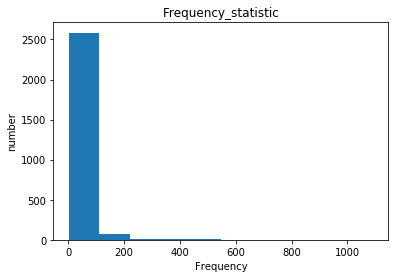

In [182]:
root_path = '/Users/monabai/Desktop/data/pinglun'
doc = tokens_review(root_path)
dictionary = corpora.Dictionary(doc)
dictionary.save('../data/corpus/reviews.dict')
# dictionary.load('../data/corpus/reviews.dict')
print(dictionary)



# result = []
# count_1 = 0
# count_40w = 0
# print()
# for item in frequency:
# #     result.append([item, frequency])
#     if frequency[item] == 1:
#         count_1 += 1
# #         print(item, frequency[item])
#     elif frequency[item] > 400000:
#         print(item, frequency[item])
#         count_40w += 1
# print()
# print('词频为1的词共有：', count_1)
# print('词频大于40万的词共有：', count_40w)
# with open('../data/corpus/frequency_all.txt', 'w') as f:
#     csv.writer(f).writerows(result)

# print(len(frequency))
# print(frequency)
# print(sorted(frequency.items(), key = lambda x:x[1], reverse = True))
# freq_list = [x for x in frequency.values()]
# # print(freq_list)
# draw_hist(freq_list,'Frequency_statistic','Frequency','number')   # 直方图展示frequency.items()

In [108]:
# 不带词性
start = time.time()
count = 0
frequency = defaultdict(int)  # 统计总体词频
for parent, dirnames, filenames in os.walk('/Users/monabai/Desktop/data/pinglun'):
    print(len(filenames))
    result = []
    for filename in filenames:
        attraction_name = filename[:-4]
#         if attraction_name == '闻一多纪念馆':
        if attraction_name != 'pinglun':
            file_path = '/Users/monabai/Desktop/data/pinglun/' + attraction_name + '.txt'
#             print(file_path)
            data = []
            rd = read_data.ReadData()
            ws = segmentation.WordSegmentation()
            try:
                for item in rd.generate_data(file_path):
                    if item:
                        temp = ws.seg([item])
                        data.extend(temp[0])
                        for token in temp[0]:
                            frequency[token] += 1
            except Exception as e:
                print(e)
                continue
#             print(data)
            count += 1
#             if data:
#                 dictionary.add_documents([data])
#             if count == 1:
#                 break
            yield data
#             fw = ngrams_pos.FreqPhrase(min_count=10, threshold=0.4, stopwords_file=stopwords_file)
#             for item, value in fw.combine2words(data_pos).items():
                # 景点名，评论数量，频繁子序列，频繁子序列出现次数
                # result.append(['test', len(data), ''.join(item), value[0]])
#                 result_pos.append([''.join(x.word for x in item), '/'.join(x.flag for x in item), value[0]])
        # with open(output_file, 'w') as f:
        #     csv.writer(f).writerows(result)

print('run time:', time.time()-start)
dictionary = corpora.Dictionary(data)
dictionary.save('../data/corpus/reviews.dict')

35404
('empty file: ', '/Users/monabai/Desktop/data/pinglun/牛王岛.txt')
('empty file: ', '/Users/monabai/Desktop/data/pinglun/严子陵钓台.txt')
('empty file: ', '/Users/monabai/Desktop/data/pinglun/上海交通大学董浩云航运博物馆.txt')
('empty file: ', '/Users/monabai/Desktop/data/pinglun/苏东坡纪念馆.txt')
('empty file: ', '/Users/monabai/Desktop/data/pinglun/白云山.txt')
run time: 909.2776420116425


### 统计总体词频

Dictionary(483110 unique tokens: [' ', '!', '.', '..', '...']...)

， 8448311
的 5283110
、 483876
。 2983478
是 1365870
  752974
也 562309
有 740503
去 774282
了 1246020
在 881092
很 832121
！ 491488
可以 460256
都 530507
就 456069

词频为1的词共有： 222227
词频大于40万的词共有： 16


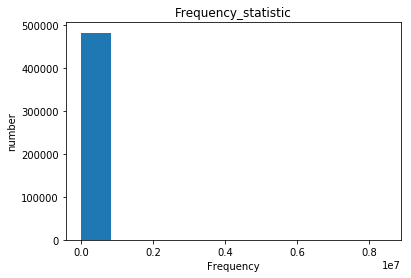

In [142]:
# print(dictionary.keys())    #返回所有词语的编号
# print(dictionary.dfs)    #{单词id，在多少文档中出现}
# print(dictionary.get(5)) #返回编号对应的词语，例如这里5->特性。
# print(dictionary.compactify()) #压缩词语向量，如果使用了filter_extremes，filter_n_most_frequent，filter_tokens等删除词典元素的操作，可以使用该方法进行压缩
# print(dictionary.num_docs) #所有文章数目
# print(dictionary.num_nnz) #每个文件中不重复词个数的和
# print(dictionary.num_pos) #所有词的个数
# for key in dictionary.keys():
#     print(key,dictionary.get(key),dictionary.dfs[key])

dictionary.load('../data/corpus/reviews.dict')
print(dictionary)
# result = []
count_1 = 0
count_40w = 0
print()
for item in frequency:
#     result.append([item, frequency])
    if frequency[item] == 1:
        count_1 += 1
#         print(item, frequency[item])
    elif frequency[item] > 400000:
        print(item, frequency[item])
        count_40w += 1
print()
print('词频为1的词共有：', count_1)
print('词频大于40万的词共有：', count_40w)
# with open('../data/corpus/frequency_all.txt', 'w') as f:
#     csv.writer(f).writerows(result)

# print(len(frequency))
# print(frequency)
# print(sorted(frequency.items(), key = lambda x:x[1], reverse = True))
freq_list = [x for x in frequency.values()]
# # print(freq_list)
draw_hist(freq_list,'Frequency_statistic','Frequency','number')   # 直方图展示frequency.items()

### 按景点统计词频

35404
/Users/monabai/Desktop/data/pinglun/顶秀美泉小镇.txt


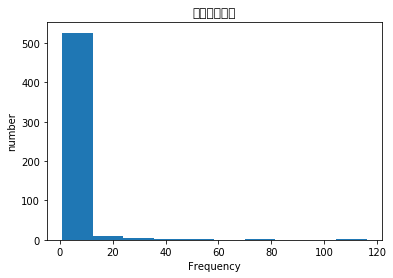

/Users/monabai/Desktop/data/pinglun/北京邵飘萍故居.txt
/Users/monabai/Desktop/data/pinglun/黎明洞.txt


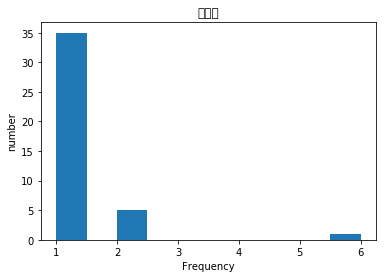

/Users/monabai/Desktop/data/pinglun/老虎潭.txt


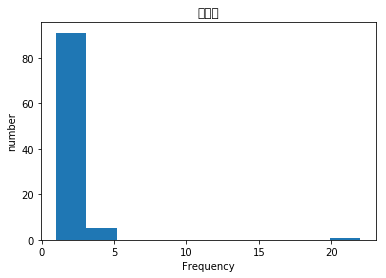

/Users/monabai/Desktop/data/pinglun/观象山.txt


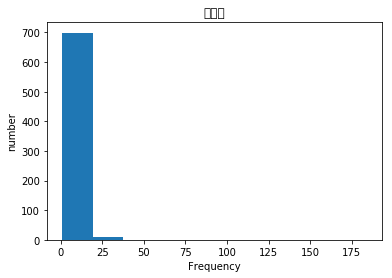

/Users/monabai/Desktop/data/pinglun/福州雪峰山.txt


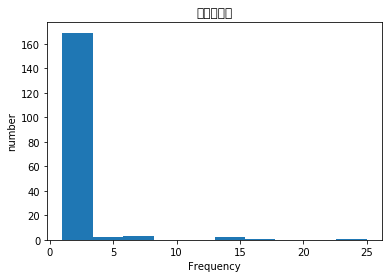

/Users/monabai/Desktop/data/pinglun/中山伊泰莲娜DIY地带.txt


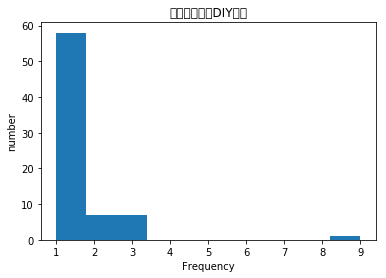

/Users/monabai/Desktop/data/pinglun/融水老子山.txt


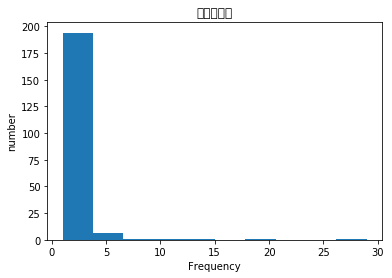

/Users/monabai/Desktop/data/pinglun/城关镇.txt
/Users/monabai/Desktop/data/pinglun/古冰川.txt


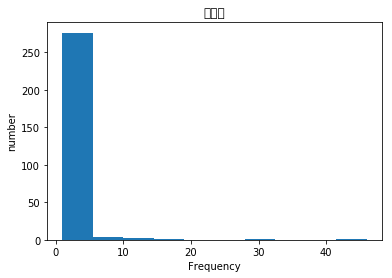

/Users/monabai/Desktop/data/pinglun/红阳万亩草场.txt
/Users/monabai/Desktop/data/pinglun/成都陕西会馆.txt


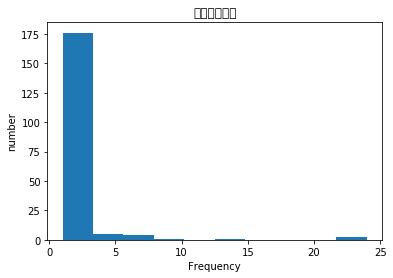

/Users/monabai/Desktop/data/pinglun/阳明祠.txt


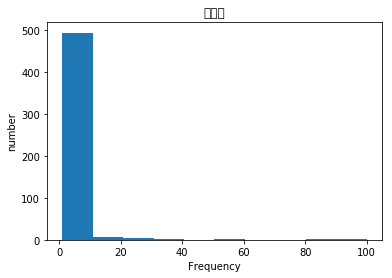

/Users/monabai/Desktop/data/pinglun/梁山水浒酒文化体验馆.txt
/Users/monabai/Desktop/data/pinglun/南瀛眷村文化馆.txt


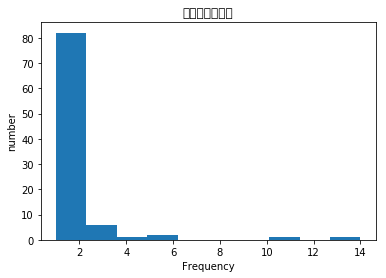

/Users/monabai/Desktop/data/pinglun/泰和山风景区.txt


KeyboardInterrupt: 

In [153]:
def frequency_review():
    count = 0
    for parent, dirnames, filenames in os.walk('/Users/monabai/Desktop/data/pinglun'):
        print(len(filenames))
        result = []
        for filename in filenames:
            attraction_name = filename[:-4]
#             if attraction_name == '闻一多纪念馆':
            if attraction_name != 'pinglun':
                file_path = '/Users/monabai/Desktop/data/pinglun/' + attraction_name + '.txt'
                print(file_path)
                data = []
                rd = read_data.ReadData()
                ws = segmentation.WordSegmentation()
                try:
                    for item in rd.generate_data(file_path):
                        if item:
                            temp = ws.seg([item])
                            data.extend(temp[0])
                except Exception as e:
                    print(e)
                    continue
    #             print(data)
                count += 1
                if data:
                    yield attraction_name, dictionary.doc2bow(data)
#                 if count == 1:
#                     break

for attraction_name, item in frequency_review():  # item 是由元组构成的列表，(word_id, word_frequency)
    freq_review = defaultdict(int)  # 统计单个景点的词频
    for word in item:
        freq_review[dictionary.get(word[0])] = word[1]
    freq_review_list = [x for x in freq_review.values()]
#     print(sorted(freq_review.items(), key = lambda x:x[1], reverse = True))
#     print(freq_review)
#     print(freq_review_list)
    draw_hist(freq_review_list,attraction_name,'Frequency','number')


In [ ]:
# 不带词性
start = time.time()
for attraction_name, item in frequency_review():  # item 是由元组构成的列表，(word_id, word_frequency)
    freq_review = defaultdict(int)  # 统计单个景点的词频
    for word in item:
        freq_review[dictionary.get(word[0])] = word[1]
    freq_review_list = [x for x in freq_review.values()]
#     print(sorted(freq_review.items(), key = lambda x:x[1], reverse = True))
#     print(freq_review)
#     print(freq_review_list)
#     draw_hist(freq_review_list,attraction_name,'Frequency','number')
print('run time:', time.time()-start)

## TF-IDF统计

### 统计总体TFIDF

In [161]:
dictionary.load('../data/corpus/reviews.dict')
root_path = '/Users/monabai/Desktop/data/pinglun'

attraction_name, item = doc2bow_review(dictionary, root_path)
# item = doc2bow_review(dictionary, root_path)
tfidf_model = models.TfidfModel(item)


35404
/Users/monabai/Desktop/data/pinglun/顶秀美泉小镇.txt
/Users/monabai/Desktop/data/pinglun/北京邵飘萍故居.txt
/Users/monabai/Desktop/data/pinglun/黎明洞.txt
/Users/monabai/Desktop/data/pinglun/老虎潭.txt
/Users/monabai/Desktop/data/pinglun/观象山.txt
/Users/monabai/Desktop/data/pinglun/福州雪峰山.txt
/Users/monabai/Desktop/data/pinglun/中山伊泰莲娜DIY地带.txt
/Users/monabai/Desktop/data/pinglun/融水老子山.txt
/Users/monabai/Desktop/data/pinglun/城关镇.txt
/Users/monabai/Desktop/data/pinglun/古冰川.txt
/Users/monabai/Desktop/data/pinglun/红阳万亩草场.txt
/Users/monabai/Desktop/data/pinglun/成都陕西会馆.txt
/Users/monabai/Desktop/data/pinglun/阳明祠.txt
/Users/monabai/Desktop/data/pinglun/梁山水浒酒文化体验馆.txt
/Users/monabai/Desktop/data/pinglun/南瀛眷村文化馆.txt
/Users/monabai/Desktop/data/pinglun/泰和山风景区.txt
/Users/monabai/Desktop/data/pinglun/景芝酒之城.txt
/Users/monabai/Desktop/data/pinglun/原起寺.txt
/Users/monabai/Desktop/data/pinglun/八宿县.txt
/Users/monabai/Desktop/data/pinglun/大围山国家公园.txt
/Users/monabai/Desktop/data/pinglun/双枫浦.txt
/Users/monabai/Desktop/da

/Users/monabai/Desktop/data/pinglun/沣峪口.txt
/Users/monabai/Desktop/data/pinglun/北海漪澜堂.txt
/Users/monabai/Desktop/data/pinglun/茗阳汤泉.txt
/Users/monabai/Desktop/data/pinglun/苏州光福香雪海景区.txt
/Users/monabai/Desktop/data/pinglun/西禅古寺.txt
/Users/monabai/Desktop/data/pinglun/枝江博物馆.txt
/Users/monabai/Desktop/data/pinglun/喇荣五明佛学院.txt
/Users/monabai/Desktop/data/pinglun/东湾路.txt
/Users/monabai/Desktop/data/pinglun/金龙洞地下河.txt
/Users/monabai/Desktop/data/pinglun/德元宮.txt
/Users/monabai/Desktop/data/pinglun/大金瓦寺.txt
/Users/monabai/Desktop/data/pinglun/波密广场.txt
/Users/monabai/Desktop/data/pinglun/兰屿文物馆.txt
/Users/monabai/Desktop/data/pinglun/天泉水都.txt
/Users/monabai/Desktop/data/pinglun/尼玛牧场.txt
/Users/monabai/Desktop/data/pinglun/将府公园.txt
/Users/monabai/Desktop/data/pinglun/厦门金榜公园.txt
/Users/monabai/Desktop/data/pinglun/梦幻聊斋城.txt
/Users/monabai/Desktop/data/pinglun/黄河三角洲动物园.txt
/Users/monabai/Desktop/data/pinglun/梅山龙宫.txt
/Users/monabai/Desktop/data/pinglun/宝莲禅寺.txt
/Users/monabai/Desktop/data/pinglun/碧霞

/Users/monabai/Desktop/data/pinglun/香港科技大学.txt
/Users/monabai/Desktop/data/pinglun/檀园.txt
/Users/monabai/Desktop/data/pinglun/百里峡风景区.txt
/Users/monabai/Desktop/data/pinglun/大龙潭.txt
/Users/monabai/Desktop/data/pinglun/沿河乌江山峡百里画廊.txt
/Users/monabai/Desktop/data/pinglun/南平茫荡山.txt
/Users/monabai/Desktop/data/pinglun/贡山县城.txt
/Users/monabai/Desktop/data/pinglun/徽商博物馆.txt
/Users/monabai/Desktop/data/pinglun/金鸡山.txt
/Users/monabai/Desktop/data/pinglun/卓克基官寨.txt
/Users/monabai/Desktop/data/pinglun/景辉楼.txt
/Users/monabai/Desktop/data/pinglun/中国左翼作家联盟会址纪念馆.txt
/Users/monabai/Desktop/data/pinglun/圣母进堂教堂.txt
/Users/monabai/Desktop/data/pinglun/阿佤山.txt
/Users/monabai/Desktop/data/pinglun/沈阳浑河乐园.txt
/Users/monabai/Desktop/data/pinglun/巴尔虎蒙古部落.txt
/Users/monabai/Desktop/data/pinglun/州城遗址.txt
/Users/monabai/Desktop/data/pinglun/广东大峡谷(乳源大峡谷).txt
/Users/monabai/Desktop/data/pinglun/农业科技博览园.txt
/Users/monabai/Desktop/data/pinglun/琵琶洲.txt
/Users/monabai/Desktop/data/pinglun/冯国璋故居.txt
/Users/monabai/Deskto

/Users/monabai/Desktop/data/pinglun/九芎神木.txt
/Users/monabai/Desktop/data/pinglun/罗山湖玛雅水乐园.txt
/Users/monabai/Desktop/data/pinglun/马渡河小小三峡.txt
/Users/monabai/Desktop/data/pinglun/藏山风景区.txt
/Users/monabai/Desktop/data/pinglun/宪锋糖店.txt
/Users/monabai/Desktop/data/pinglun/红博广场.txt
/Users/monabai/Desktop/data/pinglun/神农街.txt
/Users/monabai/Desktop/data/pinglun/敦煌故城.txt
/Users/monabai/Desktop/data/pinglun/吼山风景区.txt
/Users/monabai/Desktop/data/pinglun/钻天坡.txt
/Users/monabai/Desktop/data/pinglun/松江城市规划展示馆.txt
/Users/monabai/Desktop/data/pinglun/中国河套文化博物院.txt
/Users/monabai/Desktop/data/pinglun/江城壹号文化创意园.txt
/Users/monabai/Desktop/data/pinglun/徐家港公园.txt
/Users/monabai/Desktop/data/pinglun/锡伯族家庙.txt
/Users/monabai/Desktop/data/pinglun/罗东文化工场.txt
/Users/monabai/Desktop/data/pinglun/斗门旧街.txt
/Users/monabai/Desktop/data/pinglun/大王山森林公园.txt
/Users/monabai/Desktop/data/pinglun/黔灵湖.txt
/Users/monabai/Desktop/data/pinglun/茶山森林公园.txt
/Users/monabai/Desktop/data/pinglun/咖啡加工厂.txt
/Users/monabai/Desktop/d

/Users/monabai/Desktop/data/pinglun/江夏薰香悦花卉世界.txt
/Users/monabai/Desktop/data/pinglun/白马拉缰.txt
/Users/monabai/Desktop/data/pinglun/阿拉营.txt
/Users/monabai/Desktop/data/pinglun/长沙简牍博物馆.txt
/Users/monabai/Desktop/data/pinglun/牛佛古镇.txt
/Users/monabai/Desktop/data/pinglun/海淀高梁桥.txt
/Users/monabai/Desktop/data/pinglun/夏冰洞.txt
/Users/monabai/Desktop/data/pinglun/兴安古镇.txt
/Users/monabai/Desktop/data/pinglun/凤凰山森林公园.txt
/Users/monabai/Desktop/data/pinglun/泰顺承天氡泉自然保护区.txt
/Users/monabai/Desktop/data/pinglun/瀛州公园.txt
/Users/monabai/Desktop/data/pinglun/江海博物馆.txt
/Users/monabai/Desktop/data/pinglun/洪泽湖.txt
/Users/monabai/Desktop/data/pinglun/集宁战役纪念馆.txt
/Users/monabai/Desktop/data/pinglun/成都凤栖山.txt
/Users/monabai/Desktop/data/pinglun/出头村.txt
/Users/monabai/Desktop/data/pinglun/安平观夕平台.txt
/Users/monabai/Desktop/data/pinglun/佛光山佛陀纪念馆.txt
/Users/monabai/Desktop/data/pinglun/朱仙镇启封故园.txt
/Users/monabai/Desktop/data/pinglun/碣阳湖.txt
/Users/monabai/Desktop/data/pinglun/灯笼沙水乡.txt
/Users/monabai/Desktop/dat

/Users/monabai/Desktop/data/pinglun/荣禄故居.txt
/Users/monabai/Desktop/data/pinglun/勐泐大佛寺.txt
/Users/monabai/Desktop/data/pinglun/送客亭.txt
/Users/monabai/Desktop/data/pinglun/龙泉国家森林公园.txt
/Users/monabai/Desktop/data/pinglun/南岳山森林公园.txt
/Users/monabai/Desktop/data/pinglun/水镜湖.txt
/Users/monabai/Desktop/data/pinglun/德远堂.txt
/Users/monabai/Desktop/data/pinglun/瑞里.txt
/Users/monabai/Desktop/data/pinglun/草坡自然保护区.txt
/Users/monabai/Desktop/data/pinglun/象鼻山温泉森林公园.txt
/Users/monabai/Desktop/data/pinglun/大散关.txt
/Users/monabai/Desktop/data/pinglun/亚洲第一高喷泉.txt
/Users/monabai/Desktop/data/pinglun/三灶岛万人坟.txt
/Users/monabai/Desktop/data/pinglun/惠安沿海大通道.txt
/Users/monabai/Desktop/data/pinglun/公沟遗迹.txt
/Users/monabai/Desktop/data/pinglun/华岩风景区.txt
/Users/monabai/Desktop/data/pinglun/宜宾学院.txt
/Users/monabai/Desktop/data/pinglun/杨开慧故居.txt
/Users/monabai/Desktop/data/pinglun/大埔文武二帝庙.txt
/Users/monabai/Desktop/data/pinglun/洞天栈道.txt
/Users/monabai/Desktop/data/pinglun/钴姆潭.txt
/Users/monabai/Desktop/data/pingl

/Users/monabai/Desktop/data/pinglun/刚钦寺.txt
/Users/monabai/Desktop/data/pinglun/北京密云蔡家洼农业生态园.txt
/Users/monabai/Desktop/data/pinglun/榆次后沟.txt
/Users/monabai/Desktop/data/pinglun/Lu Ye Tea Farm.txt
/Users/monabai/Desktop/data/pinglun/新宫门.txt
/Users/monabai/Desktop/data/pinglun/邛崃石窟.txt
/Users/monabai/Desktop/data/pinglun/岳阳文庙.txt
/Users/monabai/Desktop/data/pinglun/南阳市公安局.txt
/Users/monabai/Desktop/data/pinglun/银川黄河古渡.txt
/Users/monabai/Desktop/data/pinglun/厦门野山谷景区.txt
/Users/monabai/Desktop/data/pinglun/千湖国家湿地公园.txt
/Users/monabai/Desktop/data/pinglun/归鸿阂.txt
/Users/monabai/Desktop/data/pinglun/欢乐雪世界滑雪场.txt
/Users/monabai/Desktop/data/pinglun/张家港市暨阳湖欢乐世界.txt
/Users/monabai/Desktop/data/pinglun/云山屯.txt
/Users/monabai/Desktop/data/pinglun/新墙商贸城步行街.txt
/Users/monabai/Desktop/data/pinglun/沃园亭.txt
/Users/monabai/Desktop/data/pinglun/日光风景区.txt
/Users/monabai/Desktop/data/pinglun/温岭.txt
/Users/monabai/Desktop/data/pinglun/北镇李成梁石坊.txt
/Users/monabai/Desktop/data/pinglun/灵栖胜景.txt
/Users/monabai

/Users/monabai/Desktop/data/pinglun/龙山景区.txt
/Users/monabai/Desktop/data/pinglun/毛家堰.txt
/Users/monabai/Desktop/data/pinglun/仙人晒靴.txt
/Users/monabai/Desktop/data/pinglun/昆嵛山.txt
/Users/monabai/Desktop/data/pinglun/前俄罗斯大使馆.txt
/Users/monabai/Desktop/data/pinglun/大鹏湾国家风景区.txt
/Users/monabai/Desktop/data/pinglun/南岳首庙.txt
/Users/monabai/Desktop/data/pinglun/天井窖院.txt
/Users/monabai/Desktop/data/pinglun/乐玩购游乐园.txt
/Users/monabai/Desktop/data/pinglun/鹿港国民小学.txt
/Users/monabai/Desktop/data/pinglun/明镜湖.txt
/Users/monabai/Desktop/data/pinglun/林屋.txt
/Users/monabai/Desktop/data/pinglun/黄山画廊.txt
/Users/monabai/Desktop/data/pinglun/蒋介石汤山温泉别墅.txt
/Users/monabai/Desktop/data/pinglun/凼仔村.txt
/Users/monabai/Desktop/data/pinglun/金钟山嫘祖文化旅游区.txt
/Users/monabai/Desktop/data/pinglun/桑岛村.txt
/Users/monabai/Desktop/data/pinglun/灵山洞.txt
/Users/monabai/Desktop/data/pinglun/中国花炮文化博物馆.txt
/Users/monabai/Desktop/data/pinglun/百年竹屋古厝.txt
/Users/monabai/Desktop/data/pinglun/朝阳宫.txt
/Users/monabai/Desktop/data/pinglun

/Users/monabai/Desktop/data/pinglun/南莲园池.txt
/Users/monabai/Desktop/data/pinglun/大鹏湾琉球管理站.txt
/Users/monabai/Desktop/data/pinglun/中药标本馆.txt
/Users/monabai/Desktop/data/pinglun/丹葛尔古城.txt
/Users/monabai/Desktop/data/pinglun/福寶乳牛彩繪村.txt
/Users/monabai/Desktop/data/pinglun/七级浮屠塔.txt
/Users/monabai/Desktop/data/pinglun/南矶山.txt
/Users/monabai/Desktop/data/pinglun/北京经贸航空服务学院双流部.txt
/Users/monabai/Desktop/data/pinglun/万田乡.txt
/Users/monabai/Desktop/data/pinglun/聊城梦幻乐园.txt
/Users/monabai/Desktop/data/pinglun/打洛森林公园.txt
/Users/monabai/Desktop/data/pinglun/长沙中流砥柱.txt
/Users/monabai/Desktop/data/pinglun/宋少帝陵.txt
/Users/monabai/Desktop/data/pinglun/龍宮瀑布.txt
/Users/monabai/Desktop/data/pinglun/乜那寺.txt
/Users/monabai/Desktop/data/pinglun/水西门.txt
/Users/monabai/Desktop/data/pinglun/三溪镇.txt
/Users/monabai/Desktop/data/pinglun/尖沙咀.txt
/Users/monabai/Desktop/data/pinglun/秋收起义铜鼓纪念馆.txt
/Users/monabai/Desktop/data/pinglun/下白云.txt
/Users/monabai/Desktop/data/pinglun/逍遥楼遗址.txt
/Users/monabai/Desktop/data/pin

/Users/monabai/Desktop/data/pinglun/鲜鱼口美食街.txt
/Users/monabai/Desktop/data/pinglun/马鞍山濮塘.txt
/Users/monabai/Desktop/data/pinglun/香港警察总部.txt
/Users/monabai/Desktop/data/pinglun/巨蟒出山.txt
/Users/monabai/Desktop/data/pinglun/彭州九峰山.txt
/Users/monabai/Desktop/data/pinglun/茂林国家风景区.txt
/Users/monabai/Desktop/data/pinglun/衡山国家重点风景名胜区.txt
/Users/monabai/Desktop/data/pinglun/都宪坊.txt
/Users/monabai/Desktop/data/pinglun/仰天山国家森林公园.txt
/Users/monabai/Desktop/data/pinglun/安徽工程大学.txt
/Users/monabai/Desktop/data/pinglun/陡水湖风景区.txt
/Users/monabai/Desktop/data/pinglun/大安镇文化广场.txt
/Users/monabai/Desktop/data/pinglun/沙山.txt
/Users/monabai/Desktop/data/pinglun/安东老街.txt
/Users/monabai/Desktop/data/pinglun/白鹿森林公园.txt
/Users/monabai/Desktop/data/pinglun/弥勒殿.txt
/Users/monabai/Desktop/data/pinglun/宝灵寺.txt
/Users/monabai/Desktop/data/pinglun/圆通山(圆通山动物园).txt
/Users/monabai/Desktop/data/pinglun/大虹桥.txt
/Users/monabai/Desktop/data/pinglun/太室山.txt
/Users/monabai/Desktop/data/pinglun/十里银杏.txt
/Users/monabai/Desktop/da

/Users/monabai/Desktop/data/pinglun/兰山旅游度假区.txt
/Users/monabai/Desktop/data/pinglun/日清大楼.txt
/Users/monabai/Desktop/data/pinglun/蛇皇洞.txt
/Users/monabai/Desktop/data/pinglun/泰宁明清园.txt
/Users/monabai/Desktop/data/pinglun/中天门.txt
/Users/monabai/Desktop/data/pinglun/五显灵官庙.txt
/Users/monabai/Desktop/data/pinglun/白马仙洞.txt
/Users/monabai/Desktop/data/pinglun/波息湾.txt
/Users/monabai/Desktop/data/pinglun/松荫堂.txt
/Users/monabai/Desktop/data/pinglun/乌苏镇.txt
/Users/monabai/Desktop/data/pinglun/遂宁中国死海.txt
/Users/monabai/Desktop/data/pinglun/中坝.txt
/Users/monabai/Desktop/data/pinglun/祥符寺.txt
/Users/monabai/Desktop/data/pinglun/西华公园.txt
/Users/monabai/Desktop/data/pinglun/密苑云顶滑雪场.txt
/Users/monabai/Desktop/data/pinglun/靈嚴禪寺.txt
/Users/monabai/Desktop/data/pinglun/凌云山.txt
/Users/monabai/Desktop/data/pinglun/清泉古寺.txt
/Users/monabai/Desktop/data/pinglun/三水侨鑫生态园.txt
/Users/monabai/Desktop/data/pinglun/中国第一福塔.txt
/Users/monabai/Desktop/data/pinglun/鹳雀楼景区.txt
/Users/monabai/Desktop/data/pinglun/云溪生态公园.txt
/

/Users/monabai/Desktop/data/pinglun/浙东小九寨景区.txt
/Users/monabai/Desktop/data/pinglun/临沂沂水地下萤光湖.txt
/Users/monabai/Desktop/data/pinglun/超达饭店雍景园.txt
/Users/monabai/Desktop/data/pinglun/陆荣廷旧居陈列馆.txt
/Users/monabai/Desktop/data/pinglun/虎啸岩.txt
/Users/monabai/Desktop/data/pinglun/白云古洞.txt
/Users/monabai/Desktop/data/pinglun/钱排镇.txt
/Users/monabai/Desktop/data/pinglun/三贤祠.txt
/Users/monabai/Desktop/data/pinglun/龙头跳.txt
/Users/monabai/Desktop/data/pinglun/大箭沟景区.txt
/Users/monabai/Desktop/data/pinglun/永靖盆栽街.txt
/Users/monabai/Desktop/data/pinglun/辽河碑林.txt
/Users/monabai/Desktop/data/pinglun/嵩前村.txt
/Users/monabai/Desktop/data/pinglun/大庆油田国家矿山公园.txt
/Users/monabai/Desktop/data/pinglun/林海亭.txt
/Users/monabai/Desktop/data/pinglun/北京爱迪国际学校.txt
/Users/monabai/Desktop/data/pinglun/青田清真禅寺.txt
/Users/monabai/Desktop/data/pinglun/炮楼.txt
/Users/monabai/Desktop/data/pinglun/平陆风口滑雪场.txt
/Users/monabai/Desktop/data/pinglun/麦草沟自然保护区.txt
/Users/monabai/Desktop/data/pinglun/广西花坪保护区.txt
/Users/monabai/Desktop/d

/Users/monabai/Desktop/data/pinglun/济南泉城广场.txt
/Users/monabai/Desktop/data/pinglun/津塔.txt
/Users/monabai/Desktop/data/pinglun/沙漠植物园.txt
/Users/monabai/Desktop/data/pinglun/极乐寺居士林.txt
/Users/monabai/Desktop/data/pinglun/西沱古镇.txt
/Users/monabai/Desktop/data/pinglun/苏州观塘街.txt
/Users/monabai/Desktop/data/pinglun/黄崖子民俗公园.txt
/Users/monabai/Desktop/data/pinglun/二十八站.txt
/Users/monabai/Desktop/data/pinglun/护国随粮王庙.txt
/Users/monabai/Desktop/data/pinglun/汉光武帝陵.txt
/Users/monabai/Desktop/data/pinglun/达坂城古镇.txt
/Users/monabai/Desktop/data/pinglun/福興廟.txt
/Users/monabai/Desktop/data/pinglun/前门大街.txt
/Users/monabai/Desktop/data/pinglun/东方红广场.txt
/Users/monabai/Desktop/data/pinglun/台阳矿业事务所.txt
/Users/monabai/Desktop/data/pinglun/石梁飞瀑.txt
/Users/monabai/Desktop/data/pinglun/天宫院风水文化景区.txt
/Users/monabai/Desktop/data/pinglun/豐鄉瀑布.txt
/Users/monabai/Desktop/data/pinglun/目连山.txt
/Users/monabai/Desktop/data/pinglun/中国美术学院美术馆.txt
/Users/monabai/Desktop/data/pinglun/周恩来总理纪念亭.txt
/Users/monabai/Desktop/data/

/Users/monabai/Desktop/data/pinglun/卡莎措.txt
/Users/monabai/Desktop/data/pinglun/赤峰红山公园.txt
/Users/monabai/Desktop/data/pinglun/青山岩臼景区.txt
/Users/monabai/Desktop/data/pinglun/安吉竹博园.txt
/Users/monabai/Desktop/data/pinglun/观音山国家森林公园.txt
/Users/monabai/Desktop/data/pinglun/毛泽东视察南泥湾旧居.txt
/Users/monabai/Desktop/data/pinglun/襄汾造像碑.txt
/Users/monabai/Desktop/data/pinglun/黄瓜小镇.txt
/Users/monabai/Desktop/data/pinglun/枯枝牡丹园.txt
/Users/monabai/Desktop/data/pinglun/首义文化公园.txt
/Users/monabai/Desktop/data/pinglun/湖山广场.txt
/Users/monabai/Desktop/data/pinglun/法国领事馆旧址.txt
/Users/monabai/Desktop/data/pinglun/峰岩山寨旅游度假区.txt
/Users/monabai/Desktop/data/pinglun/如东江风海韵.txt
/Users/monabai/Desktop/data/pinglun/珍珠瀑布.txt
/Users/monabai/Desktop/data/pinglun/昆明市太平寺.txt
/Users/monabai/Desktop/data/pinglun/牌坊.txt
/Users/monabai/Desktop/data/pinglun/双明洞.txt
/Users/monabai/Desktop/data/pinglun/古昔弯.txt
/Users/monabai/Desktop/data/pinglun/龙亭公园.txt
/Users/monabai/Desktop/data/pinglun/宋陵.txt
/Users/monabai/Desktop/data/pi

/Users/monabai/Desktop/data/pinglun/飞天瀑布.txt
/Users/monabai/Desktop/data/pinglun/石家庄抱犊寨.txt
/Users/monabai/Desktop/data/pinglun/公馆公园.txt
/Users/monabai/Desktop/data/pinglun/石灵园.txt
/Users/monabai/Desktop/data/pinglun/龙岩洞.txt
/Users/monabai/Desktop/data/pinglun/鹿港公会堂.txt
/Users/monabai/Desktop/data/pinglun/台湾煤矿博物馆.txt
/Users/monabai/Desktop/data/pinglun/雪霸休闲农场.txt
/Users/monabai/Desktop/data/pinglun/西藏大学.txt
/Users/monabai/Desktop/data/pinglun/川主寺.txt
/Users/monabai/Desktop/data/pinglun/三封古城遗址.txt
/Users/monabai/Desktop/data/pinglun/川茶景园.txt
/Users/monabai/Desktop/data/pinglun/基督教国际礼拜堂.txt
/Users/monabai/Desktop/data/pinglun/艺穗会.txt
/Users/monabai/Desktop/data/pinglun/杭州遇雨亭.txt
/Users/monabai/Desktop/data/pinglun/海景水上乐园.txt
/Users/monabai/Desktop/data/pinglun/上海市文化广场.txt
/Users/monabai/Desktop/data/pinglun/孙立人将军纪念馆.txt
/Users/monabai/Desktop/data/pinglun/晴耕雨读.txt
/Users/monabai/Desktop/data/pinglun/华祖庵.txt
/Users/monabai/Desktop/data/pinglun/黄金村村民议事会.txt
/Users/monabai/Desktop/data/ping

/Users/monabai/Desktop/data/pinglun/莫言文学馆.txt
/Users/monabai/Desktop/data/pinglun/石窟国家矿山公园博物馆.txt
/Users/monabai/Desktop/data/pinglun/广仁寺.txt
/Users/monabai/Desktop/data/pinglun/天柱山世界地质公园.txt
/Users/monabai/Desktop/data/pinglun/大境门.txt
/Users/monabai/Desktop/data/pinglun/安里甘教堂.txt
/Users/monabai/Desktop/data/pinglun/宝月公园.txt
/Users/monabai/Desktop/data/pinglun/清凉谷风景区.txt
/Users/monabai/Desktop/data/pinglun/上清古镇.txt
/Users/monabai/Desktop/data/pinglun/海滨泳场.txt
/Users/monabai/Desktop/data/pinglun/干尸洞.txt
/Users/monabai/Desktop/data/pinglun/山丹军马场.txt
/Users/monabai/Desktop/data/pinglun/十月太阳历文化园.txt
/Users/monabai/Desktop/data/pinglun/亚龙湾.txt
/Users/monabai/Desktop/data/pinglun/太子坡.txt
/Users/monabai/Desktop/data/pinglun/新庄慈佑宫.txt
/Users/monabai/Desktop/data/pinglun/颖德画廊(深圳陆河第三分店).txt
/Users/monabai/Desktop/data/pinglun/望海楼教堂.txt
/Users/monabai/Desktop/data/pinglun/郑板桥故居.txt
/Users/monabai/Desktop/data/pinglun/京西十八潭.txt
/Users/monabai/Desktop/data/pinglun/楚风楼.txt
/Users/monabai/Desktop/dat

/Users/monabai/Desktop/data/pinglun/北京顺义三高农业示范园.txt
/Users/monabai/Desktop/data/pinglun/齐一寺.txt
/Users/monabai/Desktop/data/pinglun/敕勒川博物馆.txt
/Users/monabai/Desktop/data/pinglun/協天大帝關聖廟.txt
/Users/monabai/Desktop/data/pinglun/湘潭和平公园.txt
/Users/monabai/Desktop/data/pinglun/八角台公园.txt
/Users/monabai/Desktop/data/pinglun/竹院庵.txt
/Users/monabai/Desktop/data/pinglun/东海岛.txt
/Users/monabai/Desktop/data/pinglun/额济纳博物馆.txt
/Users/monabai/Desktop/data/pinglun/小飞象.txt
/Users/monabai/Desktop/data/pinglun/石台牯牛降.txt
/Users/monabai/Desktop/data/pinglun/大洲广场.txt
/Users/monabai/Desktop/data/pinglun/静远堂.txt
/Users/monabai/Desktop/data/pinglun/翠翠岛.txt
/Users/monabai/Desktop/data/pinglun/首都图书馆.txt
/Users/monabai/Desktop/data/pinglun/奇莱鼻灯塔.txt
/Users/monabai/Desktop/data/pinglun/碧桂园欢乐世界.txt
/Users/monabai/Desktop/data/pinglun/东塘商业步行街.txt
/Users/monabai/Desktop/data/pinglun/二桥公园.txt
/Users/monabai/Desktop/data/pinglun/珠山国家森林公园.txt
/Users/monabai/Desktop/data/pinglun/龙潭大峡谷自然风景区.txt
/Users/monabai/Desktop/da

/Users/monabai/Desktop/data/pinglun/小林邑.txt
/Users/monabai/Desktop/data/pinglun/天域园林.txt
/Users/monabai/Desktop/data/pinglun/孤山寨.txt
/Users/monabai/Desktop/data/pinglun/义大游乐世界.txt
/Users/monabai/Desktop/data/pinglun/宝安公园.txt
/Users/monabai/Desktop/data/pinglun/烟墩角.txt
/Users/monabai/Desktop/data/pinglun/孙子故园.txt
/Users/monabai/Desktop/data/pinglun/绍兴陆游纪念馆.txt
/Users/monabai/Desktop/data/pinglun/菩提金刚塔.txt
/Users/monabai/Desktop/data/pinglun/天宁寺凌霄塔.txt
/Users/monabai/Desktop/data/pinglun/和日寺.txt
/Users/monabai/Desktop/data/pinglun/新四军五师旧址.txt
/Users/monabai/Desktop/data/pinglun/荆门博物馆.txt
/Users/monabai/Desktop/data/pinglun/秦皇岛新澳海底世界.txt
/Users/monabai/Desktop/data/pinglun/吞巴乡.txt
/Users/monabai/Desktop/data/pinglun/广武明长城.txt
/Users/monabai/Desktop/data/pinglun/赵王河公园.txt
/Users/monabai/Desktop/data/pinglun/法镜寺.txt
/Users/monabai/Desktop/data/pinglun/青岛金融街.txt
/Users/monabai/Desktop/data/pinglun/求子泉.txt
/Users/monabai/Desktop/data/pinglun/光明港公园.txt
/Users/monabai/Desktop/data/pinglun/瑞安大坪遗

/Users/monabai/Desktop/data/pinglun/六胜塔主题公园.txt
/Users/monabai/Desktop/data/pinglun/黑龙江大学.txt
/Users/monabai/Desktop/data/pinglun/遇林亭窑址.txt
/Users/monabai/Desktop/data/pinglun/茉莉花壇夢想館.txt
/Users/monabai/Desktop/data/pinglun/千灯大唐生态园.txt
/Users/monabai/Desktop/data/pinglun/张家花园.txt
/Users/monabai/Desktop/data/pinglun/华宝玺当代陶瓷艺术馆.txt
/Users/monabai/Desktop/data/pinglun/千汇四村老年活动室.txt
/Users/monabai/Desktop/data/pinglun/日湖公园.txt
/Users/monabai/Desktop/data/pinglun/罗汉圣地.txt
/Users/monabai/Desktop/data/pinglun/三汊河国家湿地公园.txt
/Users/monabai/Desktop/data/pinglun/蓝海洋.txt
/Users/monabai/Desktop/data/pinglun/慈母桥.txt
/Users/monabai/Desktop/data/pinglun/中东铁路机车库.txt
/Users/monabai/Desktop/data/pinglun/酷贝拉上海欢乐园.txt
/Users/monabai/Desktop/data/pinglun/天砚山景区.txt
/Users/monabai/Desktop/data/pinglun/北洋桥.txt
/Users/monabai/Desktop/data/pinglun/周王庙.txt
/Users/monabai/Desktop/data/pinglun/泸定桥革命文物纪念馆.txt
/Users/monabai/Desktop/data/pinglun/宝云塔.txt
/Users/monabai/Desktop/data/pinglun/元江世界第一高桥.txt
/Users/monabai/

/Users/monabai/Desktop/data/pinglun/天长地久桥.txt
/Users/monabai/Desktop/data/pinglun/龙山寺.txt
/Users/monabai/Desktop/data/pinglun/郭家大院.txt
/Users/monabai/Desktop/data/pinglun/中国铁道博物馆.txt
/Users/monabai/Desktop/data/pinglun/玉盆寺.txt
/Users/monabai/Desktop/data/pinglun/玉泉溪.txt
/Users/monabai/Desktop/data/pinglun/水磨沟秦巴大草甸旅游区.txt
/Users/monabai/Desktop/data/pinglun/天堂寨国家级自然保护区.txt
/Users/monabai/Desktop/data/pinglun/北戴河自然生态公园.txt
/Users/monabai/Desktop/data/pinglun/杭州湾湿地.txt
/Users/monabai/Desktop/data/pinglun/西安八路军办事处旧址.txt
/Users/monabai/Desktop/data/pinglun/惠州博物馆.txt
/Users/monabai/Desktop/data/pinglun/果叶.txt
/Users/monabai/Desktop/data/pinglun/内蒙古酒文化博物馆.txt
/Users/monabai/Desktop/data/pinglun/筲箕湾村.txt
/Users/monabai/Desktop/data/pinglun/碧云山公园.txt
/Users/monabai/Desktop/data/pinglun/五指山初保村.txt
/Users/monabai/Desktop/data/pinglun/珠江夜游(穗港之星).txt
/Users/monabai/Desktop/data/pinglun/长清马山.txt
/Users/monabai/Desktop/data/pinglun/蓝调庄园滑雪场.txt
/Users/monabai/Desktop/data/pinglun/淄博艺术博物馆.txt
/Users/mo

/Users/monabai/Desktop/data/pinglun/卡若遗址.txt
/Users/monabai/Desktop/data/pinglun/密云白河游乐园.txt
/Users/monabai/Desktop/data/pinglun/弘法禅寺.txt
/Users/monabai/Desktop/data/pinglun/在海一方公园.txt
/Users/monabai/Desktop/data/pinglun/基督教锡安堂.txt
/Users/monabai/Desktop/data/pinglun/三塔寺.txt
/Users/monabai/Desktop/data/pinglun/汪口.txt
/Users/monabai/Desktop/data/pinglun/广东石湾陶瓷博物馆.txt
/Users/monabai/Desktop/data/pinglun/鳄鱼梁.txt
/Users/monabai/Desktop/data/pinglun/许由寨遗址.txt
/Users/monabai/Desktop/data/pinglun/两栖爬行动物馆.txt
/Users/monabai/Desktop/data/pinglun/西安美术学院.txt
/Users/monabai/Desktop/data/pinglun/普洱民居.txt
/Users/monabai/Desktop/data/pinglun/泰安奇乐屿儿童主题乐园.txt
/Users/monabai/Desktop/data/pinglun/肇庆堂.txt
/Users/monabai/Desktop/data/pinglun/快乐岛.txt
/Users/monabai/Desktop/data/pinglun/鸟巢.txt
/Users/monabai/Desktop/data/pinglun/社顶自然公园.txt
/Users/monabai/Desktop/data/pinglun/闻钟苑.txt
/Users/monabai/Desktop/data/pinglun/佛峪口水库.txt
/Users/monabai/Desktop/data/pinglun/江界河省级风景名胜区.txt
/Users/monabai/Desktop/data/pi

/Users/monabai/Desktop/data/pinglun/九峰国家森林公园.txt
/Users/monabai/Desktop/data/pinglun/大清邮政信柜.txt
/Users/monabai/Desktop/data/pinglun/苏铁园.txt
/Users/monabai/Desktop/data/pinglun/杞麓湖湿地.txt
/Users/monabai/Desktop/data/pinglun/毛主席诗碑园.txt
/Users/monabai/Desktop/data/pinglun/伏羲山大峡谷.txt
/Users/monabai/Desktop/data/pinglun/清真西寺.txt
/Users/monabai/Desktop/data/pinglun/北极沙洲.txt
/Users/monabai/Desktop/data/pinglun/元土城遗址公园.txt
/Users/monabai/Desktop/data/pinglun/玉女岩景区.txt
/Users/monabai/Desktop/data/pinglun/中国茶山竹海国家森林公园.txt
/Users/monabai/Desktop/data/pinglun/张澜故居.txt
/Users/monabai/Desktop/data/pinglun/鸭绿江国境旅游区.txt
/Users/monabai/Desktop/data/pinglun/武定狮子山.txt
/Users/monabai/Desktop/data/pinglun/松宗镇.txt
/Users/monabai/Desktop/data/pinglun/长峪城长城.txt
/Users/monabai/Desktop/data/pinglun/秦汉桃源村.txt
/Users/monabai/Desktop/data/pinglun/宜州市刘三姐故居.txt
/Users/monabai/Desktop/data/pinglun/东龙山文化遗址.txt
/Users/monabai/Desktop/data/pinglun/南阁牌楼群.txt
/Users/monabai/Desktop/data/pinglun/深圳3D奇幻艺术馆.txt
/Users/monabai

/Users/monabai/Desktop/data/pinglun/居安楼.txt
/Users/monabai/Desktop/data/pinglun/横琴镇.txt
/Users/monabai/Desktop/data/pinglun/拉市海阳光海岸花海.txt
/Users/monabai/Desktop/data/pinglun/原日本领事馆.txt
/Users/monabai/Desktop/data/pinglun/龟山电视塔.txt
/Users/monabai/Desktop/data/pinglun/官马溶洞.txt
/Users/monabai/Desktop/data/pinglun/左贡.txt
/Users/monabai/Desktop/data/pinglun/同尼村.txt
/Users/monabai/Desktop/data/pinglun/宝桑园.txt
/Users/monabai/Desktop/data/pinglun/孙思邈洞.txt
/Users/monabai/Desktop/data/pinglun/花开花城.txt
/Users/monabai/Desktop/data/pinglun/奋起湖文史陈列馆.txt
/Users/monabai/Desktop/data/pinglun/拙政园.txt
/Users/monabai/Desktop/data/pinglun/澄迈富力红树湾湿地公园.txt
/Users/monabai/Desktop/data/pinglun/雨母山.txt
/Users/monabai/Desktop/data/pinglun/嘉兴铁哥们机器人主题公园.txt
/Users/monabai/Desktop/data/pinglun/南高峰.txt
/Users/monabai/Desktop/data/pinglun/锦屏峰.txt
/Users/monabai/Desktop/data/pinglun/聖后宮.txt
/Users/monabai/Desktop/data/pinglun/罗湖体育馆.txt
/Users/monabai/Desktop/data/pinglun/鹰爪洞.txt
/Users/monabai/Desktop/data/pinglun/大平台

/Users/monabai/Desktop/data/pinglun/湘潭晓霞山.txt
/Users/monabai/Desktop/data/pinglun/田饶步生态旅游区.txt
/Users/monabai/Desktop/data/pinglun/通天岩景区.txt
/Users/monabai/Desktop/data/pinglun/盐都植物园.txt
/Users/monabai/Desktop/data/pinglun/红旗渠纪念馆.txt
/Users/monabai/Desktop/data/pinglun/密云水库山林民俗度假村.txt
/Users/monabai/Desktop/data/pinglun/林口公园.txt
/Users/monabai/Desktop/data/pinglun/石仓清代民居群.txt
/Users/monabai/Desktop/data/pinglun/状元街.txt
/Users/monabai/Desktop/data/pinglun/三明格氏栲.txt
/Users/monabai/Desktop/data/pinglun/南开科技大学.txt
/Users/monabai/Desktop/data/pinglun/库布齐沙漠.txt
/Users/monabai/Desktop/data/pinglun/太平寺塔.txt
/Users/monabai/Desktop/data/pinglun/中岳景区.txt
/Users/monabai/Desktop/data/pinglun/梦立方儿童乐园.txt
/Users/monabai/Desktop/data/pinglun/鹿場部落.txt
/Users/monabai/Desktop/data/pinglun/兰花谷.txt
/Users/monabai/Desktop/data/pinglun/观音山广济寺.txt
/Users/monabai/Desktop/data/pinglun/香慧寺.txt
/Users/monabai/Desktop/data/pinglun/金钉子远古世界景区.txt
/Users/monabai/Desktop/data/pinglun/熙水泉风景区.txt
/Users/monabai/Desktop/

/Users/monabai/Desktop/data/pinglun/九城宫旅游景区.txt
/Users/monabai/Desktop/data/pinglun/吉兴堂.txt
/Users/monabai/Desktop/data/pinglun/胜利油田展览中心.txt
/Users/monabai/Desktop/data/pinglun/克什克腾世界地质公园.txt
/Users/monabai/Desktop/data/pinglun/观澜版画村.txt
/Users/monabai/Desktop/data/pinglun/桐柏山.txt
/Users/monabai/Desktop/data/pinglun/嵩县白云山国家森林公园.txt
/Users/monabai/Desktop/data/pinglun/佛教博物馆.txt
/Users/monabai/Desktop/data/pinglun/恭城武庙.txt
/Users/monabai/Desktop/data/pinglun/硫磺沟.txt
/Users/monabai/Desktop/data/pinglun/长兴南太湖海洋公园.txt
/Users/monabai/Desktop/data/pinglun/灵台山.txt
/Users/monabai/Desktop/data/pinglun/观音赏曲.txt
/Users/monabai/Desktop/data/pinglun/什邡穿心店地震遗址.txt
/Users/monabai/Desktop/data/pinglun/五龙山响水河主题乐园.txt
/Users/monabai/Desktop/data/pinglun/三沙镇.txt
/Users/monabai/Desktop/data/pinglun/儋州龙门山.txt
/Users/monabai/Desktop/data/pinglun/室韦口岸.txt
/Users/monabai/Desktop/data/pinglun/黄姚古镇.txt
/Users/monabai/Desktop/data/pinglun/四方当代美术馆.txt
/Users/monabai/Desktop/data/pinglun/唐山地震遗址纪念公园.txt
/Users/monab

/Users/monabai/Desktop/data/pinglun/塔吉克牧民村落.txt
/Users/monabai/Desktop/data/pinglun/海会镇.txt
/Users/monabai/Desktop/data/pinglun/多依树梯田.txt
/Users/monabai/Desktop/data/pinglun/北石窟寺.txt
/Users/monabai/Desktop/data/pinglun/金龙长城.txt
/Users/monabai/Desktop/data/pinglun/便江风景区.txt
/Users/monabai/Desktop/data/pinglun/曹娥庙.txt
/Users/monabai/Desktop/data/pinglun/嘉定南翔古镇.txt
/Users/monabai/Desktop/data/pinglun/神木园.txt
/Users/monabai/Desktop/data/pinglun/扶苍山(花山脑).txt
/Users/monabai/Desktop/data/pinglun/坣岗公园.txt
/Users/monabai/Desktop/data/pinglun/八卦楼.txt
/Users/monabai/Desktop/data/pinglun/尖沙咀弥敦道.txt
/Users/monabai/Desktop/data/pinglun/太行明珠游乐城.txt
/Users/monabai/Desktop/data/pinglun/三块石水库.txt
/Users/monabai/Desktop/data/pinglun/浑河.txt
/Users/monabai/Desktop/data/pinglun/丁家峪.txt
/Users/monabai/Desktop/data/pinglun/北京通教寺.txt
/Users/monabai/Desktop/data/pinglun/陈毅广场.txt
/Users/monabai/Desktop/data/pinglun/草海.txt
/Users/monabai/Desktop/data/pinglun/无忧泉.txt
/Users/monabai/Desktop/data/pinglun/忠信玫瑰园(西北二门店

/Users/monabai/Desktop/data/pinglun/东吴丝绸馆.txt
/Users/monabai/Desktop/data/pinglun/玉华寺.txt
/Users/monabai/Desktop/data/pinglun/百谷红军村陈列室.txt
/Users/monabai/Desktop/data/pinglun/东部华侨城茶溪谷.txt
/Users/monabai/Desktop/data/pinglun/驼山.txt
/Users/monabai/Desktop/data/pinglun/太学遗址.txt
/Users/monabai/Desktop/data/pinglun/凌云洞射击场.txt
/Users/monabai/Desktop/data/pinglun/饶益寺.txt
/Users/monabai/Desktop/data/pinglun/万佛顶.txt
/Users/monabai/Desktop/data/pinglun/天下玉苑.txt
/Users/monabai/Desktop/data/pinglun/龙虎山悬棺.txt
/Users/monabai/Desktop/data/pinglun/峨眉山博物馆.txt
/Users/monabai/Desktop/data/pinglun/钱塘江大桥.txt
/Users/monabai/Desktop/data/pinglun/付家庄公园.txt
/Users/monabai/Desktop/data/pinglun/勐养野生蝴蝶场.txt
/Users/monabai/Desktop/data/pinglun/太仓沙溪古镇.txt
/Users/monabai/Desktop/data/pinglun/棒棰岛景区.txt
/Users/monabai/Desktop/data/pinglun/望城步行街.txt
/Users/monabai/Desktop/data/pinglun/万绿湖风景区.txt
/Users/monabai/Desktop/data/pinglun/灵岩山.txt
/Users/monabai/Desktop/data/pinglun/白龙商业步行街.txt
/Users/monabai/Desktop/data/pingl

/Users/monabai/Desktop/data/pinglun/爱布瀑布群.txt
/Users/monabai/Desktop/data/pinglun/杭州薰衣草庄园.txt
/Users/monabai/Desktop/data/pinglun/下虎跳.txt
/Users/monabai/Desktop/data/pinglun/赣州市历史文化与城市建设博物馆.txt
/Users/monabai/Desktop/data/pinglun/榆次县衙.txt
/Users/monabai/Desktop/data/pinglun/吾屯上庄村.txt
/Users/monabai/Desktop/data/pinglun/科迦寺.txt
/Users/monabai/Desktop/data/pinglun/鹤壁市博物馆.txt
/Users/monabai/Desktop/data/pinglun/核桃坪保护大熊猫研究中心.txt
/Users/monabai/Desktop/data/pinglun/五佛山森林公园.txt
/Users/monabai/Desktop/data/pinglun/梅州市博物馆.txt
/Users/monabai/Desktop/data/pinglun/八路军西安办事处纪念馆.txt
/Users/monabai/Desktop/data/pinglun/东山湖公园.txt
/Users/monabai/Desktop/data/pinglun/九子岩(九华山后山).txt
/Users/monabai/Desktop/data/pinglun/金鸡山公园.txt
/Users/monabai/Desktop/data/pinglun/筹笔驿.txt
/Users/monabai/Desktop/data/pinglun/屏山村.txt
/Users/monabai/Desktop/data/pinglun/七星台.txt
/Users/monabai/Desktop/data/pinglun/向天墓.txt
/Users/monabai/Desktop/data/pinglun/汉山风景区.txt
/Users/monabai/Desktop/data/pinglun/山江苗寨.txt
/Users/monabai

/Users/monabai/Desktop/data/pinglun/朝鲜银行青岛支店旧址.txt
/Users/monabai/Desktop/data/pinglun/海草房.txt
/Users/monabai/Desktop/data/pinglun/协和医学院旧址.txt
/Users/monabai/Desktop/data/pinglun/梅源梯田.txt
/Users/monabai/Desktop/data/pinglun/大庆石油科技馆.txt
/Users/monabai/Desktop/data/pinglun/中社观光花市.txt
/Users/monabai/Desktop/data/pinglun/晚清深宅大院.txt
/Users/monabai/Desktop/data/pinglun/太巴塱‧天主教圣母教堂.txt
/Users/monabai/Desktop/data/pinglun/珠江夜游船票-省总码头(海珠广场).txt
/Users/monabai/Desktop/data/pinglun/默勒草原.txt
/Users/monabai/Desktop/data/pinglun/三元宮.txt
/Users/monabai/Desktop/data/pinglun/郝家台遗址.txt
/Users/monabai/Desktop/data/pinglun/沫若堂.txt
/Users/monabai/Desktop/data/pinglun/喜鹊梁风景区.txt
/Users/monabai/Desktop/data/pinglun/廣和宮.txt
/Users/monabai/Desktop/data/pinglun/王仙岭生态公园.txt
/Users/monabai/Desktop/data/pinglun/潮州人民广场.txt
/Users/monabai/Desktop/data/pinglun/崂山北九水景区.txt
/Users/monabai/Desktop/data/pinglun/瑞安市玉海楼.txt
/Users/monabai/Desktop/data/pinglun/福鼎金色童年欢乐谷游乐园.txt
/Users/monabai/Desktop/data/pinglun/鱼藏文化馆.txt
/

/Users/monabai/Desktop/data/pinglun/天龙顶山地公园.txt
/Users/monabai/Desktop/data/pinglun/朝阳寺.txt
/Users/monabai/Desktop/data/pinglun/威海刘公庙.txt
/Users/monabai/Desktop/data/pinglun/西坡天池.txt
/Users/monabai/Desktop/data/pinglun/台北观音山.txt
/Users/monabai/Desktop/data/pinglun/凤庆青龙桥.txt
/Users/monabai/Desktop/data/pinglun/宿迁欢乐岛.txt
/Users/monabai/Desktop/data/pinglun/肇庆西江.txt
/Users/monabai/Desktop/data/pinglun/玉树州.txt
/Users/monabai/Desktop/data/pinglun/宋静江府城墙.txt
/Users/monabai/Desktop/data/pinglun/老龙头景区.txt
/Users/monabai/Desktop/data/pinglun/仙人府.txt
/Users/monabai/Desktop/data/pinglun/金融街.txt
/Users/monabai/Desktop/data/pinglun/绩溪紫园.txt
/Users/monabai/Desktop/data/pinglun/老蓥华寺.txt
/Users/monabai/Desktop/data/pinglun/中国地质大学江城学院继续教育学院.txt
/Users/monabai/Desktop/data/pinglun/松溉古镇.txt
/Users/monabai/Desktop/data/pinglun/忠山民俗村.txt
/Users/monabai/Desktop/data/pinglun/金车事业宜兰园区-威士忌酒厂.txt
/Users/monabai/Desktop/data/pinglun/姑婆山森林公园.txt
/Users/monabai/Desktop/data/pinglun/城阳城址.txt
/Users/monabai/Desktop/

/Users/monabai/Desktop/data/pinglun/柳州市江滨公园.txt
/Users/monabai/Desktop/data/pinglun/三十二长城.txt
/Users/monabai/Desktop/data/pinglun/重庆南路.txt
/Users/monabai/Desktop/data/pinglun/魔幻岛体验馆.txt
/Users/monabai/Desktop/data/pinglun/望龙门.txt
/Users/monabai/Desktop/data/pinglun/清溪水库.txt
/Users/monabai/Desktop/data/pinglun/博凹湾.txt
/Users/monabai/Desktop/data/pinglun/崆峒山.txt
/Users/monabai/Desktop/data/pinglun/赣江源金圣广场.txt
/Users/monabai/Desktop/data/pinglun/鸳鸯头村.txt
/Users/monabai/Desktop/data/pinglun/五道街人民广场.txt
/Users/monabai/Desktop/data/pinglun/甘德尔山奇峡谷.txt
/Users/monabai/Desktop/data/pinglun/宋井.txt
/Users/monabai/Desktop/data/pinglun/未来广场.txt
/Users/monabai/Desktop/data/pinglun/齐林公园.txt
/Users/monabai/Desktop/data/pinglun/好客好品希望工場.txt
/Users/monabai/Desktop/data/pinglun/十梅庵风景区.txt
/Users/monabai/Desktop/data/pinglun/黄梅五祖寺.txt
/Users/monabai/Desktop/data/pinglun/鹤仙井.txt
/Users/monabai/Desktop/data/pinglun/泗洪教堂.txt
/Users/monabai/Desktop/data/pinglun/广州培正中学.txt
/Users/monabai/Desktop/data/pinglun/地

/Users/monabai/Desktop/data/pinglun/温州仙堂山遗址.txt
/Users/monabai/Desktop/data/pinglun/张挥公园.txt
/Users/monabai/Desktop/data/pinglun/锦绣中华民俗文化村.txt
/Users/monabai/Desktop/data/pinglun/大东海广场.txt
/Users/monabai/Desktop/data/pinglun/小烂坝.txt
/Users/monabai/Desktop/data/pinglun/嘉兴毛泽东观潮诗碑亭.txt
/Users/monabai/Desktop/data/pinglun/南明湖.txt
/Users/monabai/Desktop/data/pinglun/嘉善县孙道临电影艺术馆.txt
/Users/monabai/Desktop/data/pinglun/煎鱼湾.txt
/Users/monabai/Desktop/data/pinglun/丹阳市博物馆.txt
/Users/monabai/Desktop/data/pinglun/七女山.txt
/Users/monabai/Desktop/data/pinglun/厌次故城遗址.txt
/Users/monabai/Desktop/data/pinglun/重庆茂云山.txt
/Users/monabai/Desktop/data/pinglun/康王庙.txt
/Users/monabai/Desktop/data/pinglun/花神碧波.txt
/Users/monabai/Desktop/data/pinglun/常德鹭城.txt
/Users/monabai/Desktop/data/pinglun/狮子山风景区.txt
/Users/monabai/Desktop/data/pinglun/衢州南华山风景区.txt
/Users/monabai/Desktop/data/pinglun/台北市立动物园.txt
/Users/monabai/Desktop/data/pinglun/西便门明北京城墙遗址.txt
/Users/monabai/Desktop/data/pinglun/保利南海I号展馆.txt
/Users/monabai

/Users/monabai/Desktop/data/pinglun/青藏高原野生动物园海洋馆.txt
/Users/monabai/Desktop/data/pinglun/吐鲁番博物馆.txt
/Users/monabai/Desktop/data/pinglun/书松村.txt
/Users/monabai/Desktop/data/pinglun/上折瀑.txt
/Users/monabai/Desktop/data/pinglun/光福寺.txt
/Users/monabai/Desktop/data/pinglun/硅化木国家地质公园.txt
/Users/monabai/Desktop/data/pinglun/花样龙水湖景区.txt
/Users/monabai/Desktop/data/pinglun/常州古运河.txt
/Users/monabai/Desktop/data/pinglun/江南古长城.txt
/Users/monabai/Desktop/data/pinglun/大雁塔南广场.txt
/Users/monabai/Desktop/data/pinglun/马岙旅游区.txt
/Users/monabai/Desktop/data/pinglun/三潭峡.txt
/Users/monabai/Desktop/data/pinglun/桐木岭景区.txt
/Users/monabai/Desktop/data/pinglun/东坡楼.txt
/Users/monabai/Desktop/data/pinglun/老舍故居.txt
/Users/monabai/Desktop/data/pinglun/莱洲湾地区湿地.txt
/Users/monabai/Desktop/data/pinglun/惠州九龙峰.txt
/Users/monabai/Desktop/data/pinglun/忻州惠济寺.txt
/Users/monabai/Desktop/data/pinglun/落坡岭水库.txt
/Users/monabai/Desktop/data/pinglun/嘉定紫藤园.txt
/Users/monabai/Desktop/data/pinglun/圣佑庙.txt
/Users/monabai/Desktop/data/pi

/Users/monabai/Desktop/data/pinglun/五指石.txt
/Users/monabai/Desktop/data/pinglun/高原明珠.txt
/Users/monabai/Desktop/data/pinglun/勐养自然保护区.txt
/Users/monabai/Desktop/data/pinglun/金龙寨(杉湖大酒店西北).txt
/Users/monabai/Desktop/data/pinglun/成都路桥.txt
/Users/monabai/Desktop/data/pinglun/胜坑村.txt
/Users/monabai/Desktop/data/pinglun/澳门市政厅.txt
/Users/monabai/Desktop/data/pinglun/生命之门.txt
/Users/monabai/Desktop/data/pinglun/纤竹坊生态馆(民族东路店).txt
/Users/monabai/Desktop/data/pinglun/水景街.txt
/Users/monabai/Desktop/data/pinglun/房山严行大德塔.txt
/Users/monabai/Desktop/data/pinglun/哈达河水库.txt
/Users/monabai/Desktop/data/pinglun/香洲旅游度假区.txt
/Users/monabai/Desktop/data/pinglun/虚怀若谷.txt
/Users/monabai/Desktop/data/pinglun/大金峰百花果风景区.txt
/Users/monabai/Desktop/data/pinglun/南三岛.txt
/Users/monabai/Desktop/data/pinglun/恭干禅师塔.txt
/Users/monabai/Desktop/data/pinglun/尊木汇上海木文化博览园.txt
/Users/monabai/Desktop/data/pinglun/元妃荷园.txt
/Users/monabai/Desktop/data/pinglun/坛城广场.txt
/Users/monabai/Desktop/data/pinglun/支提山景区.txt
/Users/monabai/De

/Users/monabai/Desktop/data/pinglun/元中都遗址.txt
/Users/monabai/Desktop/data/pinglun/小磨坊.txt
/Users/monabai/Desktop/data/pinglun/强巴佛大殿.txt
/Users/monabai/Desktop/data/pinglun/观音洞.txt
/Users/monabai/Desktop/data/pinglun/张湾龙泉寺.txt
/Users/monabai/Desktop/data/pinglun/朱家尖观音文化苑.txt
/Users/monabai/Desktop/data/pinglun/桂林航天工业学院.txt
/Users/monabai/Desktop/data/pinglun/万绿园.txt
/Users/monabai/Desktop/data/pinglun/炼丹峰.txt
/Users/monabai/Desktop/data/pinglun/炳灵寺石窟.txt
/Users/monabai/Desktop/data/pinglun/蒋氏故居.txt
/Users/monabai/Desktop/data/pinglun/南沙龙穴岛.txt
/Users/monabai/Desktop/data/pinglun/普济庵.txt
/Users/monabai/Desktop/data/pinglun/摩天轮.txt
/Users/monabai/Desktop/data/pinglun/小高山.txt
/Users/monabai/Desktop/data/pinglun/南宫温泉冰雪嘉年华.txt
/Users/monabai/Desktop/data/pinglun/祁连山草原.txt
/Users/monabai/Desktop/data/pinglun/巴河镇.txt
/Users/monabai/Desktop/data/pinglun/菠萝岩.txt
/Users/monabai/Desktop/data/pinglun/池林栈道.txt
/Users/monabai/Desktop/data/pinglun/永宁向日葵基地.txt
/Users/monabai/Desktop/data/pinglun/68级跌水瀑

/Users/monabai/Desktop/data/pinglun/集发生态农业示范观光园.txt
/Users/monabai/Desktop/data/pinglun/十八尖山.txt
/Users/monabai/Desktop/data/pinglun/嵊泗碧海金沙海滨浴场.txt
/Users/monabai/Desktop/data/pinglun/龙泉岩.txt
/Users/monabai/Desktop/data/pinglun/化觉巷清真大寺.txt
/Users/monabai/Desktop/data/pinglun/金猴峰.txt
/Users/monabai/Desktop/data/pinglun/美的鹭湖森林度假区.txt
/Users/monabai/Desktop/data/pinglun/洞天福地.txt
/Users/monabai/Desktop/data/pinglun/大连金州紫云花汐薰衣草花园.txt
/Users/monabai/Desktop/data/pinglun/湘山寺.txt
/Users/monabai/Desktop/data/pinglun/川盘村.txt
/Users/monabai/Desktop/data/pinglun/仙女寨.txt
/Users/monabai/Desktop/data/pinglun/龙熙滑雪场.txt
/Users/monabai/Desktop/data/pinglun/武汉市东湖风景区.txt
/Users/monabai/Desktop/data/pinglun/黑面琵鹭保护区.txt
/Users/monabai/Desktop/data/pinglun/三溪口.txt
/Users/monabai/Desktop/data/pinglun/尚志市烈士陵园.txt
/Users/monabai/Desktop/data/pinglun/荷李活道.txt
/Users/monabai/Desktop/data/pinglun/潍坊临朐老龙湾.txt
/Users/monabai/Desktop/data/pinglun/报京侗寨.txt
/Users/monabai/Desktop/data/pinglun/东莞旗峰公园.txt
/Users/monabai/

/Users/monabai/Desktop/data/pinglun/福寿寺.txt
/Users/monabai/Desktop/data/pinglun/巍宝山景区.txt
/Users/monabai/Desktop/data/pinglun/官鹅沟地质公园.txt
/Users/monabai/Desktop/data/pinglun/清波门.txt
/Users/monabai/Desktop/data/pinglun/合肥安徽天方茶业.txt
/Users/monabai/Desktop/data/pinglun/可可托海景区.txt
/Users/monabai/Desktop/data/pinglun/韭菜坪.txt
/Users/monabai/Desktop/data/pinglun/琼州海峡.txt
/Users/monabai/Desktop/data/pinglun/碧海银滩.txt
/Users/monabai/Desktop/data/pinglun/甘泉公园.txt
/Users/monabai/Desktop/data/pinglun/铁人公园.txt
/Users/monabai/Desktop/data/pinglun/平津战役纪念馆.txt
/Users/monabai/Desktop/data/pinglun/伊吾烈士陵园.txt
/Users/monabai/Desktop/data/pinglun/贵阳欢乐世界.txt
/Users/monabai/Desktop/data/pinglun/彭德怀故居.txt
/Users/monabai/Desktop/data/pinglun/北大山石海森林公园.txt
/Users/monabai/Desktop/data/pinglun/大连海昌发现王国主题公园.txt
/Users/monabai/Desktop/data/pinglun/霁虹桥.txt
/Users/monabai/Desktop/data/pinglun/鹦鸽镇.txt
/Users/monabai/Desktop/data/pinglun/衢州九龙湖风景区.txt
/Users/monabai/Desktop/data/pinglun/黄水国家森林公园.txt
/Users/monabai/Deskto

/Users/monabai/Desktop/data/pinglun/塘坑天后古庙.txt
/Users/monabai/Desktop/data/pinglun/仓颉墓与仓颉庙.txt
/Users/monabai/Desktop/data/pinglun/海青茶园.txt
/Users/monabai/Desktop/data/pinglun/长山岭硅化木埋藏现场.txt
/Users/monabai/Desktop/data/pinglun/天然图画坊.txt
/Users/monabai/Desktop/data/pinglun/莲花山风景区.txt
/Users/monabai/Desktop/data/pinglun/鹰扬关.txt
/Users/monabai/Desktop/data/pinglun/厦门景州乐园.txt
/Users/monabai/Desktop/data/pinglun/恭俭冰窖.txt
/Users/monabai/Desktop/data/pinglun/绍隆寺.txt
/Users/monabai/Desktop/data/pinglun/富顺西湖.txt
/Users/monabai/Desktop/data/pinglun/金佛洞.txt
/Users/monabai/Desktop/data/pinglun/辣椒峰.txt
/Users/monabai/Desktop/data/pinglun/美丰银行旧址.txt
/Users/monabai/Desktop/data/pinglun/柳林昌盛生态园.txt
/Users/monabai/Desktop/data/pinglun/松山禅寺.txt
/Users/monabai/Desktop/data/pinglun/互润农业生态园.txt
/Users/monabai/Desktop/data/pinglun/马仁奇峰风景区.txt
/Users/monabai/Desktop/data/pinglun/信阳新县鄂豫皖苏区首府革命博物馆.txt
/Users/monabai/Desktop/data/pinglun/蒙山金伯利钻石矿景区.txt
/Users/monabai/Desktop/data/pinglun/烈士陵园.txt
/Users/monabai

/Users/monabai/Desktop/data/pinglun/藏王避雨石.txt
/Users/monabai/Desktop/data/pinglun/周口公园.txt
/Users/monabai/Desktop/data/pinglun/绥阳双河洞国家地质公园.txt
/Users/monabai/Desktop/data/pinglun/九曲溪.txt
/Users/monabai/Desktop/data/pinglun/哈皮小孩儿童运动探索乐园.txt
/Users/monabai/Desktop/data/pinglun/茶峒门楼.txt
/Users/monabai/Desktop/data/pinglun/雀儿山.txt
/Users/monabai/Desktop/data/pinglun/铁道游击队纪念园.txt
/Users/monabai/Desktop/data/pinglun/清音平湖.txt
/Users/monabai/Desktop/data/pinglun/普者黑湖.txt
/Users/monabai/Desktop/data/pinglun/忘忧谷.txt
/Users/monabai/Desktop/data/pinglun/文斗苗寨.txt
/Users/monabai/Desktop/data/pinglun/正定隆兴寺.txt
/Users/monabai/Desktop/data/pinglun/加菲猫深圳大型主题展.txt
/Users/monabai/Desktop/data/pinglun/大溪国小.txt
/Users/monabai/Desktop/data/pinglun/土山湾博物馆.txt
/Users/monabai/Desktop/data/pinglun/宁安市火山口国家森林公园.txt
/Users/monabai/Desktop/data/pinglun/峨眉山金顶.txt
/Users/monabai/Desktop/data/pinglun/金石湾艺术园区.txt
/Users/monabai/Desktop/data/pinglun/大桂山林场.txt
/Users/monabai/Desktop/data/pinglun/黄河故道森林公园.txt
/Users/monab

/Users/monabai/Desktop/data/pinglun/云麓宫.txt
/Users/monabai/Desktop/data/pinglun/四川大学(望江校区).txt
/Users/monabai/Desktop/data/pinglun/菩提禪院.txt
/Users/monabai/Desktop/data/pinglun/冠山风景区.txt
/Users/monabai/Desktop/data/pinglun/锁阳城遗址.txt
/Users/monabai/Desktop/data/pinglun/蛇博物馆.txt
/Users/monabai/Desktop/data/pinglun/阿斯塔那—哈拉和卓古墓群.txt
/Users/monabai/Desktop/data/pinglun/三诏洞.txt
/Users/monabai/Desktop/data/pinglun/颐园.txt
/Users/monabai/Desktop/data/pinglun/长江大桥公园.txt
/Users/monabai/Desktop/data/pinglun/高沟古街.txt
/Users/monabai/Desktop/data/pinglun/阆中古城步行街.txt
/Users/monabai/Desktop/data/pinglun/四张梨公园.txt
/Users/monabai/Desktop/data/pinglun/清山寺.txt
/Users/monabai/Desktop/data/pinglun/屈原墓.txt
/Users/monabai/Desktop/data/pinglun/五莲泉.txt
/Users/monabai/Desktop/data/pinglun/东北解放纪念碑.txt
/Users/monabai/Desktop/data/pinglun/探险世界.txt
/Users/monabai/Desktop/data/pinglun/永佑殿.txt
/Users/monabai/Desktop/data/pinglun/帕木乃仙人洞.txt
/Users/monabai/Desktop/data/pinglun/五佛山.txt
/Users/monabai/Desktop/data/pinglun/兰

/Users/monabai/Desktop/data/pinglun/钟鼓楼(盖州).txt
/Users/monabai/Desktop/data/pinglun/竹元魁星阁.txt
/Users/monabai/Desktop/data/pinglun/连江3D魔幻艺术巡回画展.txt
/Users/monabai/Desktop/data/pinglun/千年根雕艺术馆.txt
/Users/monabai/Desktop/data/pinglun/苏州市规划展示馆.txt
/Users/monabai/Desktop/data/pinglun/宁德福瑶列岛.txt
/Users/monabai/Desktop/data/pinglun/亚述手创体验中心.txt
/Users/monabai/Desktop/data/pinglun/彭祖故里.txt
/Users/monabai/Desktop/data/pinglun/牛背山夕阳.txt
/Users/monabai/Desktop/data/pinglun/洱海月湿地公园.txt
/Users/monabai/Desktop/data/pinglun/西北植物展览馆.txt
/Users/monabai/Desktop/data/pinglun/青岛青峰毛公山.txt
/Users/monabai/Desktop/data/pinglun/铜山古城.txt
/Users/monabai/Desktop/data/pinglun/磁器口古镇.txt
/Users/monabai/Desktop/data/pinglun/松山一号楼.txt
/Users/monabai/Desktop/data/pinglun/走马塘.txt
/Users/monabai/Desktop/data/pinglun/德化九仙山旅游度假区.txt
/Users/monabai/Desktop/data/pinglun/程克旧居.txt
/Users/monabai/Desktop/data/pinglun/兴安驯鹿园.txt
/Users/monabai/Desktop/data/pinglun/天坛天公庙.txt
/Users/monabai/Desktop/data/pinglun/西府老街.txt
/Users/mona

/Users/monabai/Desktop/data/pinglun/中国工业博物馆.txt
/Users/monabai/Desktop/data/pinglun/贵州凤凰山国家森林公园.txt
/Users/monabai/Desktop/data/pinglun/翠屏峰.txt
/Users/monabai/Desktop/data/pinglun/北回归线公园.txt
/Users/monabai/Desktop/data/pinglun/旧庄公园.txt
/Users/monabai/Desktop/data/pinglun/寿量寺.txt
/Users/monabai/Desktop/data/pinglun/陆光正艺术馆.txt
/Users/monabai/Desktop/data/pinglun/桂林栖霞寺.txt
/Users/monabai/Desktop/data/pinglun/海湾公园.txt
/Users/monabai/Desktop/data/pinglun/天门瀑.txt
/Users/monabai/Desktop/data/pinglun/仲萨寺.txt
/Users/monabai/Desktop/data/pinglun/东海大桥.txt
/Users/monabai/Desktop/data/pinglun/洪门益王家族墓群.txt
/Users/monabai/Desktop/data/pinglun/张謇故居.txt
/Users/monabai/Desktop/data/pinglun/白城运河带状公园.txt
/Users/monabai/Desktop/data/pinglun/南召宝天曼.txt
/Users/monabai/Desktop/data/pinglun/天堂岛海洋公园.txt
/Users/monabai/Desktop/data/pinglun/蒲州花园.txt
/Users/monabai/Desktop/data/pinglun/太平山原始森林公园.txt
/Users/monabai/Desktop/data/pinglun/竹西公园.txt
/Users/monabai/Desktop/data/pinglun/江姓祠堂.txt
/Users/monabai/Desktop/data

/Users/monabai/Desktop/data/pinglun/李富春故居.txt
/Users/monabai/Desktop/data/pinglun/西安迪比斯水上乐园.txt
/Users/monabai/Desktop/data/pinglun/柳木溪.txt
/Users/monabai/Desktop/data/pinglun/申隆生态园.txt
/Users/monabai/Desktop/data/pinglun/武威大云寺铜钟.txt
/Users/monabai/Desktop/data/pinglun/帕嘎寺.txt
/Users/monabai/Desktop/data/pinglun/中华耕织文化园.txt
/Users/monabai/Desktop/data/pinglun/华夏历史博物馆.txt
/Users/monabai/Desktop/data/pinglun/耀军村.txt
/Users/monabai/Desktop/data/pinglun/碧霞祠.txt
/Users/monabai/Desktop/data/pinglun/盘石屿.txt
/Users/monabai/Desktop/data/pinglun/古延庆寺.txt
/Users/monabai/Desktop/data/pinglun/大龙宫寺.txt
/Users/monabai/Desktop/data/pinglun/班禅新宫.txt
/Users/monabai/Desktop/data/pinglun/牛背岭.txt
/Users/monabai/Desktop/data/pinglun/沙美老街.txt
/Users/monabai/Desktop/data/pinglun/象泉河.txt
/Users/monabai/Desktop/data/pinglun/南雁荡山东西洞景区.txt
/Users/monabai/Desktop/data/pinglun/索罟湾.txt
/Users/monabai/Desktop/data/pinglun/北京市门头沟区滨河世纪广场公园.txt
/Users/monabai/Desktop/data/pinglun/菩萨寺.txt
/Users/monabai/Desktop/data/ping

/Users/monabai/Desktop/data/pinglun/高家祠堂.txt
/Users/monabai/Desktop/data/pinglun/八桂田园景区.txt
/Users/monabai/Desktop/data/pinglun/海山馆.txt
/Users/monabai/Desktop/data/pinglun/王家湾西瓜节.txt
/Users/monabai/Desktop/data/pinglun/天中山广场.txt
/Users/monabai/Desktop/data/pinglun/赤科山.txt
/Users/monabai/Desktop/data/pinglun/石人殿.txt
/Users/monabai/Desktop/data/pinglun/西沟栈道遗址.txt
/Users/monabai/Desktop/data/pinglun/斜峪关村.txt
/Users/monabai/Desktop/data/pinglun/仙都河阳古名居.txt
/Users/monabai/Desktop/data/pinglun/唐梓山风景区.txt
/Users/monabai/Desktop/data/pinglun/西夏邦马风景区.txt
/Users/monabai/Desktop/data/pinglun/八一水库.txt
/Users/monabai/Desktop/data/pinglun/青岛颐中体育中心.txt
/Users/monabai/Desktop/data/pinglun/盘龙峡谷.txt
/Users/monabai/Desktop/data/pinglun/西安秦陵地宫展览馆.txt
/Users/monabai/Desktop/data/pinglun/突泉温泉滑雪场.txt
/Users/monabai/Desktop/data/pinglun/郦道元故居.txt
/Users/monabai/Desktop/data/pinglun/田横栈道.txt
/Users/monabai/Desktop/data/pinglun/兵沟旅游区浑怀障汉墓群景区.txt
/Users/monabai/Desktop/data/pinglun/蓝波湾.txt
/Users/monabai/Desktop

/Users/monabai/Desktop/data/pinglun/平舆县烈士纪念馆.txt
/Users/monabai/Desktop/data/pinglun/黄椅山森林公园.txt
/Users/monabai/Desktop/data/pinglun/唐代单于大都护府遗址.txt
/Users/monabai/Desktop/data/pinglun/金钟瀑.txt
/Users/monabai/Desktop/data/pinglun/月亮峡.txt
/Users/monabai/Desktop/data/pinglun/酸橘林.txt
/Users/monabai/Desktop/data/pinglun/衡阳师范学院.txt
/Users/monabai/Desktop/data/pinglun/燕子岩国家森林公园.txt
/Users/monabai/Desktop/data/pinglun/鲁史古镇.txt
/Users/monabai/Desktop/data/pinglun/永泰青云山水帘宫景区.txt
/Users/monabai/Desktop/data/pinglun/古龙头振威第.txt
/Users/monabai/Desktop/data/pinglun/金塔寺.txt
/Users/monabai/Desktop/data/pinglun/广州荔枝湾公园.txt
/Users/monabai/Desktop/data/pinglun/福鼎少儿生活体验馆.txt
/Users/monabai/Desktop/data/pinglun/菩提岛.txt
/Users/monabai/Desktop/data/pinglun/石宝山城.txt
/Users/monabai/Desktop/data/pinglun/万寿山.txt
/Users/monabai/Desktop/data/pinglun/大地原点.txt
/Users/monabai/Desktop/data/pinglun/宝石流霞.txt
/Users/monabai/Desktop/data/pinglun/邓丽君纪念文物馆（已搬迁）.txt
/Users/monabai/Desktop/data/pinglun/森波拉.txt
/Users/monabai/De

/Users/monabai/Desktop/data/pinglun/漳州平和灵通岩.txt
/Users/monabai/Desktop/data/pinglun/鸟道雄关.txt
/Users/monabai/Desktop/data/pinglun/尼龙村.txt
/Users/monabai/Desktop/data/pinglun/圣灵山地质公园.txt
/Users/monabai/Desktop/data/pinglun/金石滩大桥.txt
/Users/monabai/Desktop/data/pinglun/红山子乡.txt
/Users/monabai/Desktop/data/pinglun/广东天井山国家森林公园.txt
/Users/monabai/Desktop/data/pinglun/大罗山.txt
/Users/monabai/Desktop/data/pinglun/宝安耶稣君王堂.txt
/Users/monabai/Desktop/data/pinglun/老姆登教堂.txt
/Users/monabai/Desktop/data/pinglun/粟裕同志纪念馆.txt
/Users/monabai/Desktop/data/pinglun/墨尔多山.txt
/Users/monabai/Desktop/data/pinglun/钱家坞.txt
/Users/monabai/Desktop/data/pinglun/波罗湖旅游区.txt
/Users/monabai/Desktop/data/pinglun/大兴融青千亩生态观光园.txt
/Users/monabai/Desktop/data/pinglun/白马湖动漫广场.txt
/Users/monabai/Desktop/data/pinglun/流杯池公园.txt
/Users/monabai/Desktop/data/pinglun/凉山红军长征纪念馆.txt
/Users/monabai/Desktop/data/pinglun/鸳鸯池水库.txt
/Users/monabai/Desktop/data/pinglun/曲水大桥.txt
/Users/monabai/Desktop/data/pinglun/垦丁恒春生态农场.txt
/Users/monabai

/Users/monabai/Desktop/data/pinglun/伊春水上公园.txt
/Users/monabai/Desktop/data/pinglun/井冈山大学.txt
/Users/monabai/Desktop/data/pinglun/肥西县小井庄.txt
/Users/monabai/Desktop/data/pinglun/阿陀岭.txt
/Users/monabai/Desktop/data/pinglun/拉法山国家森林公园.txt
/Users/monabai/Desktop/data/pinglun/秦皇岛野生动物园.txt
/Users/monabai/Desktop/data/pinglun/鹤地水库.txt
/Users/monabai/Desktop/data/pinglun/绿林山风景区.txt
/Users/monabai/Desktop/data/pinglun/左江斜塔.txt
/Users/monabai/Desktop/data/pinglun/阳明海洋文化艺术馆.txt
/Users/monabai/Desktop/data/pinglun/国庆亲子嘉年华.txt
/Users/monabai/Desktop/data/pinglun/拔仙台.txt
/Users/monabai/Desktop/data/pinglun/黑山头.txt
/Users/monabai/Desktop/data/pinglun/天工大佛.txt
/Users/monabai/Desktop/data/pinglun/哈密雅尔当风景旅游区(魔鬼城).txt
/Users/monabai/Desktop/data/pinglun/郑锦波旧居.txt
/Users/monabai/Desktop/data/pinglun/福塔公园.txt
/Users/monabai/Desktop/data/pinglun/佑宁寺.txt
/Users/monabai/Desktop/data/pinglun/淄博姜太公祠.txt
/Users/monabai/Desktop/data/pinglun/羊山古镇国际军事旅游度假区.txt
/Users/monabai/Desktop/data/pinglun/十八重溪景区.txt
/Users/mon

/Users/monabai/Desktop/data/pinglun/漳州云霄乌山风景名胜区.txt
/Users/monabai/Desktop/data/pinglun/平峦山公园.txt
/Users/monabai/Desktop/data/pinglun/凤山旧城.txt
/Users/monabai/Desktop/data/pinglun/明珠广场.txt
/Users/monabai/Desktop/data/pinglun/榆林古城.txt
/Users/monabai/Desktop/data/pinglun/东山寺.txt
/Users/monabai/Desktop/data/pinglun/百花山瀑布.txt
/Users/monabai/Desktop/data/pinglun/香港视觉艺术中心.txt
/Users/monabai/Desktop/data/pinglun/汉中门广场.txt
/Users/monabai/Desktop/data/pinglun/南通啬园.txt
/Users/monabai/Desktop/data/pinglun/中央美术学院美术馆.txt
/Users/monabai/Desktop/data/pinglun/天保宮.txt
/Users/monabai/Desktop/data/pinglun/天安堂.txt
/Users/monabai/Desktop/data/pinglun/鳄鱼漆(杨凌专卖店).txt
/Users/monabai/Desktop/data/pinglun/悬羊擂鼓遗址.txt
/Users/monabai/Desktop/data/pinglun/大鲵国家级自然保护区.txt
/Users/monabai/Desktop/data/pinglun/莲城卫城.txt
/Users/monabai/Desktop/data/pinglun/龙兴古镇.txt
/Users/monabai/Desktop/data/pinglun/铁岭市科学馆.txt
/Users/monabai/Desktop/data/pinglun/庆元廊桥.txt
/Users/monabai/Desktop/data/pinglun/狐尾山气象主题公园.txt
/Users/monabai/Des

/Users/monabai/Desktop/data/pinglun/从化碧水湾.txt
/Users/monabai/Desktop/data/pinglun/虎跳滩峡谷.txt
/Users/monabai/Desktop/data/pinglun/丁日昌府.txt
/Users/monabai/Desktop/data/pinglun/温岭东辉公园.txt
/Users/monabai/Desktop/data/pinglun/大沙尾.txt
/Users/monabai/Desktop/data/pinglun/基隆屿.txt
/Users/monabai/Desktop/data/pinglun/COVEN GARDEN.txt
/Users/monabai/Desktop/data/pinglun/国立台湾文学馆.txt
/Users/monabai/Desktop/data/pinglun/大通河.txt
/Users/monabai/Desktop/data/pinglun/南门海旅游区.txt
/Users/monabai/Desktop/data/pinglun/金坑梯田.txt
/Users/monabai/Desktop/data/pinglun/昭苏天马文化园.txt
/Users/monabai/Desktop/data/pinglun/文楼山公园.txt
/Users/monabai/Desktop/data/pinglun/恒春古城.txt
/Users/monabai/Desktop/data/pinglun/安徽大学新校区-文典阁.txt
/Users/monabai/Desktop/data/pinglun/珰奈湿地.txt
/Users/monabai/Desktop/data/pinglun/毛泽东旧居陈列馆.txt
/Users/monabai/Desktop/data/pinglun/云间第一楼.txt
/Users/monabai/Desktop/data/pinglun/北京二锅头酒博物馆.txt
/Users/monabai/Desktop/data/pinglun/元朗新田麟峰文公祠.txt
/Users/monabai/Desktop/data/pinglun/青白江杏花村.txt
/Users/monaba

/Users/monabai/Desktop/data/pinglun/新山梦湖.txt
/Users/monabai/Desktop/data/pinglun/刀郎部落.txt
/Users/monabai/Desktop/data/pinglun/车由岛.txt
/Users/monabai/Desktop/data/pinglun/河东书院藏书楼.txt
/Users/monabai/Desktop/data/pinglun/高雄忠烈祠.txt
/Users/monabai/Desktop/data/pinglun/大堪头奇观.txt
/Users/monabai/Desktop/data/pinglun/全椒太平桥.txt
/Users/monabai/Desktop/data/pinglun/南京师范大学附属中学.txt
/Users/monabai/Desktop/data/pinglun/裴公亭.txt
/Users/monabai/Desktop/data/pinglun/金源方特科幻公园.txt
/Users/monabai/Desktop/data/pinglun/太子垭.txt
/Users/monabai/Desktop/data/pinglun/英源醫院舊址.txt
/Users/monabai/Desktop/data/pinglun/正一观.txt
/Users/monabai/Desktop/data/pinglun/朱德旧址.txt
/Users/monabai/Desktop/data/pinglun/扎寺广场.txt
/Users/monabai/Desktop/data/pinglun/浏阳博物馆.txt
/Users/monabai/Desktop/data/pinglun/蓝韵影像科技园.txt
/Users/monabai/Desktop/data/pinglun/博大公园.txt
/Users/monabai/Desktop/data/pinglun/合肥蜀山烈士陵园.txt
/Users/monabai/Desktop/data/pinglun/龙柱胜迹.txt
/Users/monabai/Desktop/data/pinglun/民航博物馆.txt
/Users/monabai/Desktop/data/ping

/Users/monabai/Desktop/data/pinglun/康定情歌广场.txt
/Users/monabai/Desktop/data/pinglun/青年湖.txt
/Users/monabai/Desktop/data/pinglun/渔乐岛.txt
/Users/monabai/Desktop/data/pinglun/七渡花果山.txt
/Users/monabai/Desktop/data/pinglun/高陵博物馆.txt
/Users/monabai/Desktop/data/pinglun/建外SOHO.txt
/Users/monabai/Desktop/data/pinglun/梅岭慈云殿.txt
/Users/monabai/Desktop/data/pinglun/永川神女湖.txt
/Users/monabai/Desktop/data/pinglun/丽水大龙门景区.txt
/Users/monabai/Desktop/data/pinglun/剑南春森林公园.txt
/Users/monabai/Desktop/data/pinglun/泰达热带植物园.txt
/Users/monabai/Desktop/data/pinglun/土司府.txt
/Users/monabai/Desktop/data/pinglun/穆桂英点将台.txt
/Users/monabai/Desktop/data/pinglun/西涌海滩.txt
/Users/monabai/Desktop/data/pinglun/西湾湖.txt
/Users/monabai/Desktop/data/pinglun/女娲洞.txt
/Users/monabai/Desktop/data/pinglun/滕国故城.txt
/Users/monabai/Desktop/data/pinglun/玉瓶峰.txt
/Users/monabai/Desktop/data/pinglun/清风楼.txt
/Users/monabai/Desktop/data/pinglun/恒河生态园.txt
/Users/monabai/Desktop/data/pinglun/北山广场.txt
/Users/monabai/Desktop/data/pinglun/花鸟灯塔.t

/Users/monabai/Desktop/data/pinglun/鳌山圣境.txt
/Users/monabai/Desktop/data/pinglun/厦门破狱斗争旧址.txt
/Users/monabai/Desktop/data/pinglun/雍和宫.txt
/Users/monabai/Desktop/data/pinglun/溪东桥.txt
/Users/monabai/Desktop/data/pinglun/赤岸村.txt
/Users/monabai/Desktop/data/pinglun/彩虹河滨公园.txt
/Users/monabai/Desktop/data/pinglun/公园茗城.txt
/Users/monabai/Desktop/data/pinglun/小鱼山公园.txt
/Users/monabai/Desktop/data/pinglun/固原战国秦长城.txt
/Users/monabai/Desktop/data/pinglun/东皋乡.txt
/Users/monabai/Desktop/data/pinglun/万盛梦幻奥陶纪主题公园.txt
/Users/monabai/Desktop/data/pinglun/神农架国家地质公园官门山景区.txt
/Users/monabai/Desktop/data/pinglun/Fuxing Granary.txt
/Users/monabai/Desktop/data/pinglun/彭丰寨.txt
/Users/monabai/Desktop/data/pinglun/密云燕落古城址.txt
/Users/monabai/Desktop/data/pinglun/景陵.txt
/Users/monabai/Desktop/data/pinglun/基督教清心堂.txt
/Users/monabai/Desktop/data/pinglun/金华石鹅湖.txt
/Users/monabai/Desktop/data/pinglun/飞来湖湿地公园.txt
/Users/monabai/Desktop/data/pinglun/长白山农夫山泉水生产基地.txt
/Users/monabai/Desktop/data/pinglun/苏州石公山.txt
/Users/

/Users/monabai/Desktop/data/pinglun/洪氏宗祠.txt
/Users/monabai/Desktop/data/pinglun/故宫角楼.txt
/Users/monabai/Desktop/data/pinglun/龙虎殿.txt
/Users/monabai/Desktop/data/pinglun/十里河生态旅游风景区.txt
/Users/monabai/Desktop/data/pinglun/国丝文化园.txt
/Users/monabai/Desktop/data/pinglun/绍兴鲁迅故居周家老台门.txt
/Users/monabai/Desktop/data/pinglun/文峰塔公园.txt
/Users/monabai/Desktop/data/pinglun/朝阳广场.txt
/Users/monabai/Desktop/data/pinglun/圣玛加利大堂.txt
/Users/monabai/Desktop/data/pinglun/新方向.txt
/Users/monabai/Desktop/data/pinglun/上海董家渡天主堂.txt
/Users/monabai/Desktop/data/pinglun/子午银滩.txt
/Users/monabai/Desktop/data/pinglun/菖蒲河公园.txt
/Users/monabai/Desktop/data/pinglun/东阳花园.txt
/Users/monabai/Desktop/data/pinglun/黎明湖.txt
/Users/monabai/Desktop/data/pinglun/沙湾三稔厅.txt
/Users/monabai/Desktop/data/pinglun/日溪百年蓝府.txt
/Users/monabai/Desktop/data/pinglun/北京孔庙.txt
/Users/monabai/Desktop/data/pinglun/荷城公园.txt
/Users/monabai/Desktop/data/pinglun/阴阳海.txt
/Users/monabai/Desktop/data/pinglun/合江亭码头.txt
/Users/monabai/Desktop/data/pingl

/Users/monabai/Desktop/data/pinglun/鬼谷洞.txt
/Users/monabai/Desktop/data/pinglun/上堡山.txt
/Users/monabai/Desktop/data/pinglun/龙船水乡.txt
/Users/monabai/Desktop/data/pinglun/无边寺.txt
/Users/monabai/Desktop/data/pinglun/剑泉.txt
/Users/monabai/Desktop/data/pinglun/海龙囤遗址.txt
/Users/monabai/Desktop/data/pinglun/老道外.txt
/Users/monabai/Desktop/data/pinglun/骆驼过江.txt
/Users/monabai/Desktop/data/pinglun/灵光寺佛牙舍利塔.txt
/Users/monabai/Desktop/data/pinglun/梅河口市四季生态园.txt
/Users/monabai/Desktop/data/pinglun/红池.txt
/Users/monabai/Desktop/data/pinglun/广西省柳州市鹿寨香桥岩溶国家地质公园.txt
/Users/monabai/Desktop/data/pinglun/牛奶海(俄绒措).txt
/Users/monabai/Desktop/data/pinglun/九龙山国家森林公园.txt
/Users/monabai/Desktop/data/pinglun/临澧博物馆.txt
/Users/monabai/Desktop/data/pinglun/西来古镇.txt
/Users/monabai/Desktop/data/pinglun/航空烈士公墓.txt
/Users/monabai/Desktop/data/pinglun/广州城隍庙.txt
/Users/monabai/Desktop/data/pinglun/喜峰口.txt
/Users/monabai/Desktop/data/pinglun/青龙湾生态旅游区.txt
/Users/monabai/Desktop/data/pinglun/洪崖滴翠.txt
/Users/monabai/Desktop/

/Users/monabai/Desktop/data/pinglun/八峰森林公园.txt
/Users/monabai/Desktop/data/pinglun/颐和园.txt
/Users/monabai/Desktop/data/pinglun/同兴民族茶文化公园.txt
/Users/monabai/Desktop/data/pinglun/浙地山庄.txt
/Users/monabai/Desktop/data/pinglun/大浪坝森林公园.txt
/Users/monabai/Desktop/data/pinglun/天主教西安南堂.txt
/Users/monabai/Desktop/data/pinglun/黔北四季花香景区.txt
/Users/monabai/Desktop/data/pinglun/美心洋人街游乐园.txt
/Users/monabai/Desktop/data/pinglun/建国十周年纪念塔.txt
/Users/monabai/Desktop/data/pinglun/君昂童子军乐园(山西太原店).txt
/Users/monabai/Desktop/data/pinglun/一二九师陈列馆.txt
/Users/monabai/Desktop/data/pinglun/巴丹湖.txt
/Users/monabai/Desktop/data/pinglun/兴城博物馆.txt
/Users/monabai/Desktop/data/pinglun/云南堡瀑布.txt
/Users/monabai/Desktop/data/pinglun/龙宫景区.txt
/Users/monabai/Desktop/data/pinglun/铁西1905创意文化园.txt
/Users/monabai/Desktop/data/pinglun/塘朗山.txt
/Users/monabai/Desktop/data/pinglun/腰山王氏庄园.txt
/Users/monabai/Desktop/data/pinglun/武庄花海主题公园.txt
/Users/monabai/Desktop/data/pinglun/乐乐泥儿童乐园(十陵店).txt
/Users/monabai/Desktop/data/pinglun/四方奥林匹克

/Users/monabai/Desktop/data/pinglun/石鼓寒泉与倒悬塔.txt
/Users/monabai/Desktop/data/pinglun/深圳西部海上田园旅游区.txt
/Users/monabai/Desktop/data/pinglun/草悟道.txt
/Users/monabai/Desktop/data/pinglun/中华织锦村.txt
/Users/monabai/Desktop/data/pinglun/曹丞相府.txt
/Users/monabai/Desktop/data/pinglun/文庙棂星门.txt
/Users/monabai/Desktop/data/pinglun/锦绣山庄.txt
/Users/monabai/Desktop/data/pinglun/徐渭墓.txt
/Users/monabai/Desktop/data/pinglun/蛟龙港展示中心.txt
/Users/monabai/Desktop/data/pinglun/潮州市博物馆.txt
/Users/monabai/Desktop/data/pinglun/燕语城遗址.txt
/Users/monabai/Desktop/data/pinglun/川沙天主堂.txt
/Users/monabai/Desktop/data/pinglun/东莞马山仙境.txt
/Users/monabai/Desktop/data/pinglun/美奇儿童乐园.txt
/Users/monabai/Desktop/data/pinglun/汉冶萍煤铁厂旧址.txt
/Users/monabai/Desktop/data/pinglun/泰州渡江战役指挥部旧址.txt
/Users/monabai/Desktop/data/pinglun/浴池山.txt
/Users/monabai/Desktop/data/pinglun/蚵灰窑文化馆.txt
/Users/monabai/Desktop/data/pinglun/贝江旅游景区.txt
/Users/monabai/Desktop/data/pinglun/迳联村.txt
/Users/monabai/Desktop/data/pinglun/景贤里.txt
/Users/monabai/Deskto

/Users/monabai/Desktop/data/pinglun/谭仙古庙(白云工业大道店).txt
/Users/monabai/Desktop/data/pinglun/温根塔拉草原旅游区.txt
/Users/monabai/Desktop/data/pinglun/江南第一关.txt
/Users/monabai/Desktop/data/pinglun/南山摩崖石刻.txt
/Users/monabai/Desktop/data/pinglun/古梅亭.txt
/Users/monabai/Desktop/data/pinglun/鹿港龙山寺.txt
/Users/monabai/Desktop/data/pinglun/西便门.txt
/Users/monabai/Desktop/data/pinglun/千湖山景区观景台.txt
/Users/monabai/Desktop/data/pinglun/临海市博物馆.txt
/Users/monabai/Desktop/data/pinglun/铁岭白塔.txt
/Users/monabai/Desktop/data/pinglun/华严顶.txt
/Users/monabai/Desktop/data/pinglun/鹰骏公园.txt
/Users/monabai/Desktop/data/pinglun/嘉兴船文化博物馆.txt
/Users/monabai/Desktop/data/pinglun/三茅观遗址.txt
/Users/monabai/Desktop/data/pinglun/镇北堡西部影视城.txt
/Users/monabai/Desktop/data/pinglun/松林桃花.txt
/Users/monabai/Desktop/data/pinglun/清平孔雀之乡.txt
/Users/monabai/Desktop/data/pinglun/乌霞洞.txt
/Users/monabai/Desktop/data/pinglun/徐氏宗祠.txt
/Users/monabai/Desktop/data/pinglun/罗布人村寨.txt
/Users/monabai/Desktop/data/pinglun/钦赐祭葬石坊表.txt
/Users/monabai/Deskt

/Users/monabai/Desktop/data/pinglun/青岛太平山.txt
/Users/monabai/Desktop/data/pinglun/蒙古族家具博物馆.txt
/Users/monabai/Desktop/data/pinglun/福州光禄坊.txt
/Users/monabai/Desktop/data/pinglun/达摩洞.txt
/Users/monabai/Desktop/data/pinglun/云阳龙缸.txt
/Users/monabai/Desktop/data/pinglun/什邡堂邛窑遗址.txt
/Users/monabai/Desktop/data/pinglun/忻城薰衣草庄园.txt
/Users/monabai/Desktop/data/pinglun/云峰山自然风景区.txt
/Users/monabai/Desktop/data/pinglun/智覺佛寺.txt
/Users/monabai/Desktop/data/pinglun/天台景区.txt
/Users/monabai/Desktop/data/pinglun/黄河外滩长河栈道景区.txt
/Users/monabai/Desktop/data/pinglun/台州锦绣黄岩.txt
/Users/monabai/Desktop/data/pinglun/伊克萨玛国家森林公园.txt
/Users/monabai/Desktop/data/pinglun/大善塔.txt
/Users/monabai/Desktop/data/pinglun/鬼子湾.txt
/Users/monabai/Desktop/data/pinglun/唐布拉国家森林公园.txt
/Users/monabai/Desktop/data/pinglun/紫霄宫.txt
/Users/monabai/Desktop/data/pinglun/皇泽寺风景区.txt
/Users/monabai/Desktop/data/pinglun/云顶星河游乐王国.txt
/Users/monabai/Desktop/data/pinglun/茶亭水库.txt
/Users/monabai/Desktop/data/pinglun/禹碑.txt
/Users/monabai/Deskt

/Users/monabai/Desktop/data/pinglun/九江浪井.txt
/Users/monabai/Desktop/data/pinglun/林彪保岛山洞.txt
/Users/monabai/Desktop/data/pinglun/万善寺.txt
/Users/monabai/Desktop/data/pinglun/什邡渔江新村.txt
/Users/monabai/Desktop/data/pinglun/红军遵义警备司令部旧址.txt
/Users/monabai/Desktop/data/pinglun/宝纶阁.txt
/Users/monabai/Desktop/data/pinglun/香草菲菲芳香植物博物馆.txt
/Users/monabai/Desktop/data/pinglun/将军馆.txt
/Users/monabai/Desktop/data/pinglun/太行山风景区.txt
/Users/monabai/Desktop/data/pinglun/龙华寺.txt
/Users/monabai/Desktop/data/pinglun/西拉沐沦大峡谷.txt
/Users/monabai/Desktop/data/pinglun/青菁顶自然风景区.txt
/Users/monabai/Desktop/data/pinglun/糠市海洋馆.txt
/Users/monabai/Desktop/data/pinglun/大经堂.txt
/Users/monabai/Desktop/data/pinglun/溪亭泉.txt
/Users/monabai/Desktop/data/pinglun/永裕陵.txt
/Users/monabai/Desktop/data/pinglun/金石缘公园(金石园).txt
/Users/monabai/Desktop/data/pinglun/四方竹林.txt
/Users/monabai/Desktop/data/pinglun/星岛湖生态休闲庄园.txt
/Users/monabai/Desktop/data/pinglun/中山公园.txt
/Users/monabai/Desktop/data/pinglun/葫芦湾风景区.txt
/Users/monabai/Deskto

/Users/monabai/Desktop/data/pinglun/观月出.txt
/Users/monabai/Desktop/data/pinglun/梅峰农场.txt
/Users/monabai/Desktop/data/pinglun/大赛车博物馆.txt
/Users/monabai/Desktop/data/pinglun/北京泾县会馆旧址.txt
/Users/monabai/Desktop/data/pinglun/八仙山自然保护区.txt
/Users/monabai/Desktop/data/pinglun/浙江省博物馆(武林馆区).txt
/Users/monabai/Desktop/data/pinglun/中国龙隐.txt
/Users/monabai/Desktop/data/pinglun/轿顶山.txt
/Users/monabai/Desktop/data/pinglun/陈策将军祖居.txt
/Users/monabai/Desktop/data/pinglun/宝海公园.txt
/Users/monabai/Desktop/data/pinglun/黑龙江省农科院园艺博览园.txt
/Users/monabai/Desktop/data/pinglun/佛山图书馆.txt
/Users/monabai/Desktop/data/pinglun/奇香园.txt
/Users/monabai/Desktop/data/pinglun/陕西玉虚洞.txt
/Users/monabai/Desktop/data/pinglun/延庆妫河漂流.txt
/Users/monabai/Desktop/data/pinglun/三都胜境.txt
/Users/monabai/Desktop/data/pinglun/陈氏大宗祠.txt
/Users/monabai/Desktop/data/pinglun/大连古乐楼留声机博物馆.txt
/Users/monabai/Desktop/data/pinglun/文昌.txt
/Users/monabai/Desktop/data/pinglun/创意园.txt
/Users/monabai/Desktop/data/pinglun/白居易草堂陈列室.txt
/Users/monabai/De

/Users/monabai/Desktop/data/pinglun/边坝寺.txt
/Users/monabai/Desktop/data/pinglun/玉泉金都滑雪场.txt
/Users/monabai/Desktop/data/pinglun/畹町桥.txt
/Users/monabai/Desktop/data/pinglun/阳江海陵岛.txt
/Users/monabai/Desktop/data/pinglun/乌尤寺.txt
/Users/monabai/Desktop/data/pinglun/中华武馆.txt
/Users/monabai/Desktop/data/pinglun/博兴兴国寺.txt
/Users/monabai/Desktop/data/pinglun/通州静璐苑生态园.txt
/Users/monabai/Desktop/data/pinglun/纯阳殿.txt
/Users/monabai/Desktop/data/pinglun/韶关市博物馆.txt
/Users/monabai/Desktop/data/pinglun/美华广场.txt
/Users/monabai/Desktop/data/pinglun/亳州长乐园与观音山.txt
/Users/monabai/Desktop/data/pinglun/聚星塔.txt
/Users/monabai/Desktop/data/pinglun/彩彩和尚墓.txt
/Users/monabai/Desktop/data/pinglun/楞严塔.txt
/Users/monabai/Desktop/data/pinglun/公园世家.txt
/Users/monabai/Desktop/data/pinglun/亚洲国际博览馆.txt
/Users/monabai/Desktop/data/pinglun/八道河.txt
/Users/monabai/Desktop/data/pinglun/芥瓶禅院.txt
/Users/monabai/Desktop/data/pinglun/秦园.txt
/Users/monabai/Desktop/data/pinglun/治世玄岳坊（玄岳门）.txt
/Users/monabai/Desktop/data/pinglun/麻城

/Users/monabai/Desktop/data/pinglun/曹禺故居.txt
/Users/monabai/Desktop/data/pinglun/孔林.txt
/Users/monabai/Desktop/data/pinglun/濮阳挥公陵舜帝宫景区.txt
/Users/monabai/Desktop/data/pinglun/后官湖.txt
/Users/monabai/Desktop/data/pinglun/阿尔泰山温泉国家森林公园.txt
/Users/monabai/Desktop/data/pinglun/新青湿地公园.txt
/Users/monabai/Desktop/data/pinglun/彭城广场.txt
/Users/monabai/Desktop/data/pinglun/金海湾.txt
/Users/monabai/Desktop/data/pinglun/十梓街.txt
/Users/monabai/Desktop/data/pinglun/茱萸湾公园.txt
/Users/monabai/Desktop/data/pinglun/寨寮溪风景名胜区.txt
/Users/monabai/Desktop/data/pinglun/格林奇幻森林.txt
/Users/monabai/Desktop/data/pinglun/康山文化园.txt
/Users/monabai/Desktop/data/pinglun/门头沟嬉水湾.txt
/Users/monabai/Desktop/data/pinglun/湖里.txt
/Users/monabai/Desktop/data/pinglun/蟠龙湖风景名胜区.txt
/Users/monabai/Desktop/data/pinglun/龙湖风景区.txt
/Users/monabai/Desktop/data/pinglun/洛阳国际牡丹园.txt
/Users/monabai/Desktop/data/pinglun/大汗行宫景区.txt
/Users/monabai/Desktop/data/pinglun/大远源口自然保护区.txt
/Users/monabai/Desktop/data/pinglun/武汉木兰草原.txt
/Users/monabai/Desk

/Users/monabai/Desktop/data/pinglun/霞海城隍庙(昭灵庙).txt
/Users/monabai/Desktop/data/pinglun/世纪东方步行街.txt
/Users/monabai/Desktop/data/pinglun/虎泉.txt
/Users/monabai/Desktop/data/pinglun/南浦广场公园.txt
/Users/monabai/Desktop/data/pinglun/菊花台公园.txt
/Users/monabai/Desktop/data/pinglun/高平资圣寺.txt
/Users/monabai/Desktop/data/pinglun/五磊山风景区.txt
/Users/monabai/Desktop/data/pinglun/可塔可塔.txt
/Users/monabai/Desktop/data/pinglun/民族团结广场.txt
/Users/monabai/Desktop/data/pinglun/铜锣湾花园.txt
/Users/monabai/Desktop/data/pinglun/海坛岛.txt
/Users/monabai/Desktop/data/pinglun/乌龙山.txt
/Users/monabai/Desktop/data/pinglun/民办厦门历史影像处.txt
/Users/monabai/Desktop/data/pinglun/通城黄袍山兰若寺.txt
/Users/monabai/Desktop/data/pinglun/辛弃疾故里.txt
/Users/monabai/Desktop/data/pinglun/夹河关.txt
/Users/monabai/Desktop/data/pinglun/四川美术学院(黄桷坪校区).txt
/Users/monabai/Desktop/data/pinglun/恒丰路桥.txt
/Users/monabai/Desktop/data/pinglun/胜兴车站.txt
/Users/monabai/Desktop/data/pinglun/4D气球展.txt
/Users/monabai/Desktop/data/pinglun/大珠山风景区.txt
/Users/monabai/Deskt

/Users/monabai/Desktop/data/pinglun/临安太湖源(小九寨沟)景区.txt
/Users/monabai/Desktop/data/pinglun/筇竹罗汉.txt
/Users/monabai/Desktop/data/pinglun/青城文昌阁.txt
/Users/monabai/Desktop/data/pinglun/陕西自然博物馆.txt
/Users/monabai/Desktop/data/pinglun/南郊公园卡通乐园.txt
/Users/monabai/Desktop/data/pinglun/美丽之冠文化会展中心.txt
/Users/monabai/Desktop/data/pinglun/國家廣播文物館.txt
/Users/monabai/Desktop/data/pinglun/国家天文台兴隆站.txt
/Users/monabai/Desktop/data/pinglun/泉州天后宫.txt
/Users/monabai/Desktop/data/pinglun/中正大學運動故事館.txt
/Users/monabai/Desktop/data/pinglun/灵山寺.txt
/Users/monabai/Desktop/data/pinglun/千佛院.txt
/Users/monabai/Desktop/data/pinglun/新北游乐场.txt
/Users/monabai/Desktop/data/pinglun/佛冈王潮温泉.txt
/Users/monabai/Desktop/data/pinglun/宋夹城考古遗址公园.txt
/Users/monabai/Desktop/data/pinglun/能仁禅寺(南门).txt
/Users/monabai/Desktop/data/pinglun/绍兴鲁迅故居周家新台门.txt
/Users/monabai/Desktop/data/pinglun/荔香公园.txt
/Users/monabai/Desktop/data/pinglun/红螺寺.txt
/Users/monabai/Desktop/data/pinglun/天豁峰.txt
/Users/monabai/Desktop/data/pinglun/红龙洞.txt
/User

/Users/monabai/Desktop/data/pinglun/杨梅山观鸟.txt
/Users/monabai/Desktop/data/pinglun/香格里拉乐园.txt
/Users/monabai/Desktop/data/pinglun/青州真教寺.txt
/Users/monabai/Desktop/data/pinglun/合肥岱山湖.txt
/Users/monabai/Desktop/data/pinglun/福神岗公园.txt
/Users/monabai/Desktop/data/pinglun/青马大桥.txt
/Users/monabai/Desktop/data/pinglun/鸡公岽.txt
/Users/monabai/Desktop/data/pinglun/桐梓小西湖.txt
/Users/monabai/Desktop/data/pinglun/七指岭.txt
/Users/monabai/Desktop/data/pinglun/平遥县署.txt
/Users/monabai/Desktop/data/pinglun/淄博安平故城.txt
/Users/monabai/Desktop/data/pinglun/白沙影视基地.txt
/Users/monabai/Desktop/data/pinglun/喀尔坎特大草原.txt
/Users/monabai/Desktop/data/pinglun/长生寺阁.txt
/Users/monabai/Desktop/data/pinglun/风力发电厂.txt
/Users/monabai/Desktop/data/pinglun/吉林天主教堂.txt
/Users/monabai/Desktop/data/pinglun/千江月休闲农场.txt
/Users/monabai/Desktop/data/pinglun/金鱼宝殿.txt
/Users/monabai/Desktop/data/pinglun/中国海洋大学(崂山校区).txt
/Users/monabai/Desktop/data/pinglun/上海人民广场.txt
/Users/monabai/Desktop/data/pinglun/沙鹿梦想街.txt
/Users/monabai/Desktop/dat

/Users/monabai/Desktop/data/pinglun/翡翠湖.txt
/Users/monabai/Desktop/data/pinglun/章郎村.txt
/Users/monabai/Desktop/data/pinglun/武侯祠.txt
/Users/monabai/Desktop/data/pinglun/张家界大峡谷.txt
/Users/monabai/Desktop/data/pinglun/亚布力虎峰岭簸箕崴子景区.txt
/Users/monabai/Desktop/data/pinglun/庵山.txt
/Users/monabai/Desktop/data/pinglun/北京建筑大学.txt
/Users/monabai/Desktop/data/pinglun/贡嘎朗吉岭寺.txt
/Users/monabai/Desktop/data/pinglun/麦加利银行大楼.txt
/Users/monabai/Desktop/data/pinglun/绍兴非物质文化遗产馆.txt
/Users/monabai/Desktop/data/pinglun/米家沟生态园.txt
/Users/monabai/Desktop/data/pinglun/五彩山.txt
/Users/monabai/Desktop/data/pinglun/美浓客家文物馆.txt
/Users/monabai/Desktop/data/pinglun/目屿岛.txt
/Users/monabai/Desktop/data/pinglun/合浦古汉墓.txt
/Users/monabai/Desktop/data/pinglun/民俗文化城.txt
/Users/monabai/Desktop/data/pinglun/国家天文台密云站.txt
/Users/monabai/Desktop/data/pinglun/增城广场.txt
/Users/monabai/Desktop/data/pinglun/滦平博物馆.txt
/Users/monabai/Desktop/data/pinglun/大庆市美术馆.txt
/Users/monabai/Desktop/data/pinglun/雁门关.txt
/Users/monabai/Desktop/dat

/Users/monabai/Desktop/data/pinglun/达州一中.txt
/Users/monabai/Desktop/data/pinglun/庐山博阳河生态休闲风景区.txt
/Users/monabai/Desktop/data/pinglun/贝尔湖(中国界).txt
/Users/monabai/Desktop/data/pinglun/汤逊湖.txt
/Users/monabai/Desktop/data/pinglun/古城墙景区.txt
/Users/monabai/Desktop/data/pinglun/元朗屏山坑头村仁敦冈书室.txt
/Users/monabai/Desktop/data/pinglun/铁臂山.txt
/Users/monabai/Desktop/data/pinglun/玉黛湖滑雪场.txt
/Users/monabai/Desktop/data/pinglun/士渊公祠.txt
/Users/monabai/Desktop/data/pinglun/永康西津桥.txt
/Users/monabai/Desktop/data/pinglun/红军东征永和纪念馆.txt
/Users/monabai/Desktop/data/pinglun/华阳湖.txt
/Users/monabai/Desktop/data/pinglun/平远炮台.txt
/Users/monabai/Desktop/data/pinglun/中国东海水晶博物馆.txt
/Users/monabai/Desktop/data/pinglun/松花湖.txt
/Users/monabai/Desktop/data/pinglun/竹岔岛村.txt
/Users/monabai/Desktop/data/pinglun/金坛茅山.txt
/Users/monabai/Desktop/data/pinglun/十七孔桥.txt
/Users/monabai/Desktop/data/pinglun/卧龙松.txt
/Users/monabai/Desktop/data/pinglun/麻城博物馆.txt
/Users/monabai/Desktop/data/pinglun/非物质文化遗产国家公园.txt
/Users/monabai/Des

/Users/monabai/Desktop/data/pinglun/四川广电网络汉王庙营业厅.txt
/Users/monabai/Desktop/data/pinglun/公主湖.txt
/Users/monabai/Desktop/data/pinglun/嘎玛夏寺.txt
/Users/monabai/Desktop/data/pinglun/基督教堂(西朱庄店).txt
/Users/monabai/Desktop/data/pinglun/智慧天下.txt
/Users/monabai/Desktop/data/pinglun/华藏寺.txt
/Users/monabai/Desktop/data/pinglun/洮砚乡.txt
/Users/monabai/Desktop/data/pinglun/西河景区.txt
/Users/monabai/Desktop/data/pinglun/紫峰大厦观光层(不对外开放).txt
/Users/monabai/Desktop/data/pinglun/南溪土楼群.txt
/Users/monabai/Desktop/data/pinglun/爱春蓝梯田.txt
/Users/monabai/Desktop/data/pinglun/圣寿宝塔.txt
/Users/monabai/Desktop/data/pinglun/南台阁.txt
/Users/monabai/Desktop/data/pinglun/青云谷.txt
/Users/monabai/Desktop/data/pinglun/北极观光塔.txt
/Users/monabai/Desktop/data/pinglun/青岛大学(中心校区).txt
/Users/monabai/Desktop/data/pinglun/大桐木湾村.txt
/Users/monabai/Desktop/data/pinglun/飞云江.txt
/Users/monabai/Desktop/data/pinglun/地毯厂.txt
/Users/monabai/Desktop/data/pinglun/黑河瑷珲城.txt
/Users/monabai/Desktop/data/pinglun/陇西李氏龙宫.txt
/Users/monabai/Desktop/da

/Users/monabai/Desktop/data/pinglun/高颐阙.txt
/Users/monabai/Desktop/data/pinglun/领袖峰.txt
/Users/monabai/Desktop/data/pinglun/丢丢当森林.txt
/Users/monabai/Desktop/data/pinglun/新澳鸵鸟观赏园.txt
/Users/monabai/Desktop/data/pinglun/长发村.txt
/Users/monabai/Desktop/data/pinglun/3D魔幻画展4D恐龙动物世界.txt
/Users/monabai/Desktop/data/pinglun/勐仑热带植物园.txt
/Users/monabai/Desktop/data/pinglun/秦岭观华山.txt
/Users/monabai/Desktop/data/pinglun/湖州长兴霸王潭.txt
/Users/monabai/Desktop/data/pinglun/通山县博物馆.txt
/Users/monabai/Desktop/data/pinglun/信丰玉带桥.txt
/Users/monabai/Desktop/data/pinglun/萬靈宮.txt
/Users/monabai/Desktop/data/pinglun/高雄港口慈济宫.txt
/Users/monabai/Desktop/data/pinglun/百花洲公园.txt
/Users/monabai/Desktop/data/pinglun/天坛遗址.txt
/Users/monabai/Desktop/data/pinglun/江夏商业街.txt
/Users/monabai/Desktop/data/pinglun/桐溪湖.txt
/Users/monabai/Desktop/data/pinglun/雷公山.txt
/Users/monabai/Desktop/data/pinglun/林枫同志故居纪念馆.txt
/Users/monabai/Desktop/data/pinglun/达坂城风力发电站.txt
/Users/monabai/Desktop/data/pinglun/十堰市九华山森林公园.txt
/Users/monabai/De

/Users/monabai/Desktop/data/pinglun/琅岐书画社.txt
/Users/monabai/Desktop/data/pinglun/太平寺.txt
/Users/monabai/Desktop/data/pinglun/人艺戏剧博物馆.txt
/Users/monabai/Desktop/data/pinglun/刘禹锡公园.txt
/Users/monabai/Desktop/data/pinglun/知美术馆.txt
/Users/monabai/Desktop/data/pinglun/黄山秀里.txt
/Users/monabai/Desktop/data/pinglun/胜归石窟.txt
/Users/monabai/Desktop/data/pinglun/厦门体育中心.txt
/Users/monabai/Desktop/data/pinglun/樟潭大樟树.txt
/Users/monabai/Desktop/data/pinglun/西栅.txt
/Users/monabai/Desktop/data/pinglun/新寨玛尼城.txt
/Users/monabai/Desktop/data/pinglun/北天宮.txt
/Users/monabai/Desktop/data/pinglun/孟孝琚碑.txt
/Users/monabai/Desktop/data/pinglun/淄博马鞍山.txt
/Users/monabai/Desktop/data/pinglun/必背瑶寨.txt
/Users/monabai/Desktop/data/pinglun/马兰烈士陵园.txt
/Users/monabai/Desktop/data/pinglun/土楼之光文化园.txt
/Users/monabai/Desktop/data/pinglun/青龙桥.txt
/Users/monabai/Desktop/data/pinglun/门头沟灵山西藏博物园.txt
/Users/monabai/Desktop/data/pinglun/夕拾钟楼.txt
/Users/monabai/Desktop/data/pinglun/拥军广场.txt
/Users/monabai/Desktop/data/pinglun/内垵沙

/Users/monabai/Desktop/data/pinglun/郑州文庙.txt
/Users/monabai/Desktop/data/pinglun/香港和平纪念碑.txt
/Users/monabai/Desktop/data/pinglun/戈壁蜃楼.txt
/Users/monabai/Desktop/data/pinglun/大厂民族宫.txt
/Users/monabai/Desktop/data/pinglun/指南宫.txt
/Users/monabai/Desktop/data/pinglun/一线天.txt
/Users/monabai/Desktop/data/pinglun/大理古城武庙会.txt
/Users/monabai/Desktop/data/pinglun/灵川青狮潭景区.txt
/Users/monabai/Desktop/data/pinglun/过江龙索桥.txt
/Users/monabai/Desktop/data/pinglun/佛陀世界.txt
/Users/monabai/Desktop/data/pinglun/大连闯关东民俗文化村.txt
/Users/monabai/Desktop/data/pinglun/巴拉嘎尔高勒嘎查.txt
/Users/monabai/Desktop/data/pinglun/余姚博物馆.txt
/Users/monabai/Desktop/data/pinglun/南湖风景区.txt
/Users/monabai/Desktop/data/pinglun/阿尔山滑雪场.txt
/Users/monabai/Desktop/data/pinglun/小洋山.txt
/Users/monabai/Desktop/data/pinglun/鎮平宮.txt
/Users/monabai/Desktop/data/pinglun/牛羊大巴扎.txt
/Users/monabai/Desktop/data/pinglun/三馆一厅（滨江文化园）.txt
/Users/monabai/Desktop/data/pinglun/羊楼洞.txt
/Users/monabai/Desktop/data/pinglun/南海观音庙.txt
/Users/monabai/Desktop/dat

/Users/monabai/Desktop/data/pinglun/雅加埂(红石滩).txt
/Users/monabai/Desktop/data/pinglun/禅林寺风景区.txt
/Users/monabai/Desktop/data/pinglun/九岭岗.txt
/Users/monabai/Desktop/data/pinglun/下渚湖湿地.txt
/Users/monabai/Desktop/data/pinglun/外石村.txt
/Users/monabai/Desktop/data/pinglun/三笋坑.txt
/Users/monabai/Desktop/data/pinglun/镇平公园.txt
/Users/monabai/Desktop/data/pinglun/十二朋友园.txt
/Users/monabai/Desktop/data/pinglun/河南博物院.txt
/Users/monabai/Desktop/data/pinglun/精进寺塔.txt
/Users/monabai/Desktop/data/pinglun/月老山爱情主题森林公园.txt
/Users/monabai/Desktop/data/pinglun/大陈墩遗址.txt
/Users/monabai/Desktop/data/pinglun/庞家塆.txt
/Users/monabai/Desktop/data/pinglun/大黑石景区.txt
/Users/monabai/Desktop/data/pinglun/义守大学燕巢校区.txt
/Users/monabai/Desktop/data/pinglun/清风景区.txt
/Users/monabai/Desktop/data/pinglun/南社古民居.txt
/Users/monabai/Desktop/data/pinglun/罗睺寺.txt
/Users/monabai/Desktop/data/pinglun/宜兰三清宫.txt
/Users/monabai/Desktop/data/pinglun/太保公园.txt
/Users/monabai/Desktop/data/pinglun/老北京风情园.txt
/Users/monabai/Desktop/data/pinglu

/Users/monabai/Desktop/data/pinglun/桑莲古迹.txt
/Users/monabai/Desktop/data/pinglun/南泥湾大生产博物馆.txt
/Users/monabai/Desktop/data/pinglun/情侣园.txt
/Users/monabai/Desktop/data/pinglun/桥头海滩公园.txt
/Users/monabai/Desktop/data/pinglun/中国传媒大学南广学院图书馆.txt
/Users/monabai/Desktop/data/pinglun/恰西风景区.txt
/Users/monabai/Desktop/data/pinglun/内蒙古博物院.txt
/Users/monabai/Desktop/data/pinglun/怀柔书法山.txt
/Users/monabai/Desktop/data/pinglun/飞仙谷.txt
/Users/monabai/Desktop/data/pinglun/茶陵古城墙.txt
/Users/monabai/Desktop/data/pinglun/瞻鲁台.txt
/Users/monabai/Desktop/data/pinglun/平地森林公园.txt
/Users/monabai/Desktop/data/pinglun/大鸿寨风景区.txt
/Users/monabai/Desktop/data/pinglun/哈尔滨金河旅游公园.txt
/Users/monabai/Desktop/data/pinglun/仙娥峰.txt
/Users/monabai/Desktop/data/pinglun/苏通大桥.txt
/Users/monabai/Desktop/data/pinglun/跋绒寺.txt
/Users/monabai/Desktop/data/pinglun/武汉大学工学部.txt
/Users/monabai/Desktop/data/pinglun/江夏区大花山.txt
/Users/monabai/Desktop/data/pinglun/庐山瀑布群.txt
/Users/monabai/Desktop/data/pinglun/得胜马市.txt
/Users/monabai/Desktop/d

/Users/monabai/Desktop/data/pinglun/广州荔湾路迎春花市.txt
/Users/monabai/Desktop/data/pinglun/圣蓝海洋公园.txt
/Users/monabai/Desktop/data/pinglun/大连贝壳博物馆.txt
/Users/monabai/Desktop/data/pinglun/海天康乐园.txt
/Users/monabai/Desktop/data/pinglun/径山.txt
/Users/monabai/Desktop/data/pinglun/南京总统府景区.txt
/Users/monabai/Desktop/data/pinglun/中山汉墓.txt
/Users/monabai/Desktop/data/pinglun/华峪山庄.txt
/Users/monabai/Desktop/data/pinglun/白龙峡.txt
/Users/monabai/Desktop/data/pinglun/肇庆华表石.txt
/Users/monabai/Desktop/data/pinglun/巴勒克苏草原.txt
/Users/monabai/Desktop/data/pinglun/武冈革命历史纪念馆.txt
/Users/monabai/Desktop/data/pinglun/湟川三峡.txt
/Users/monabai/Desktop/data/pinglun/望海文化公园.txt
/Users/monabai/Desktop/data/pinglun/漳浦石牌坊.txt
/Users/monabai/Desktop/data/pinglun/海关钟楼.txt
/Users/monabai/Desktop/data/pinglun/护国西华禅寺.txt
/Users/monabai/Desktop/data/pinglun/南阳麒麟湖.txt
/Users/monabai/Desktop/data/pinglun/赵一曼纪念馆.txt
/Users/monabai/Desktop/data/pinglun/珊瑚湾.txt
/Users/monabai/Desktop/data/pinglun/犍为县文庙博物馆.txt
/Users/monabai/Desktop/da

/Users/monabai/Desktop/data/pinglun/关中民俗艺术博物院.txt
/Users/monabai/Desktop/data/pinglun/罗星塔公园.txt
/Users/monabai/Desktop/data/pinglun/吴越王公园.txt
/Users/monabai/Desktop/data/pinglun/鹿港文武庙.txt
/Users/monabai/Desktop/data/pinglun/北京蔡锷故居.txt
/Users/monabai/Desktop/data/pinglun/武汉园博园.txt
/Users/monabai/Desktop/data/pinglun/界河山庄.txt
/Users/monabai/Desktop/data/pinglun/明十三陵.txt
/Users/monabai/Desktop/data/pinglun/遇仙寺.txt
/Users/monabai/Desktop/data/pinglun/泰康山生态旅游度假区.txt
/Users/monabai/Desktop/data/pinglun/青帘坊.txt
/Users/monabai/Desktop/data/pinglun/百色起义纪念馆.txt
/Users/monabai/Desktop/data/pinglun/南诏德化碑.txt
/Users/monabai/Desktop/data/pinglun/22艺术区.txt
/Users/monabai/Desktop/data/pinglun/西河大峡谷.txt
/Users/monabai/Desktop/data/pinglun/银川金水园.txt
/Users/monabai/Desktop/data/pinglun/马可波罗花世界.txt
/Users/monabai/Desktop/data/pinglun/集安市政府.txt
/Users/monabai/Desktop/data/pinglun/李氏墓碑.txt
/Users/monabai/Desktop/data/pinglun/神农架风景区.txt
/Users/monabai/Desktop/data/pinglun/阳明山国家森林公园.txt
/Users/monabai/Desktop

/Users/monabai/Desktop/data/pinglun/伪兴安东省历史陈列室.txt
/Users/monabai/Desktop/data/pinglun/章朗村.txt
/Users/monabai/Desktop/data/pinglun/大漠丝路奇观景区.txt
/Users/monabai/Desktop/data/pinglun/海印池.txt
/Users/monabai/Desktop/data/pinglun/天坛公园圜丘.txt
/Users/monabai/Desktop/data/pinglun/双河谷.txt
/Users/monabai/Desktop/data/pinglun/铜佛寺.txt
/Users/monabai/Desktop/data/pinglun/御林古桑园.txt
/Users/monabai/Desktop/data/pinglun/可邑.txt
/Users/monabai/Desktop/data/pinglun/南山月亮湾.txt
/Users/monabai/Desktop/data/pinglun/海甸河.txt
/Users/monabai/Desktop/data/pinglun/越王台.txt
/Users/monabai/Desktop/data/pinglun/六腳鄉.txt
/Users/monabai/Desktop/data/pinglun/双泉寺.txt
/Users/monabai/Desktop/data/pinglun/陇西世族庄园.txt
/Users/monabai/Desktop/data/pinglun/红岩村.txt
/Users/monabai/Desktop/data/pinglun/老子塑像.txt
/Users/monabai/Desktop/data/pinglun/古格村.txt
/Users/monabai/Desktop/data/pinglun/穿岩十九峰.txt
/Users/monabai/Desktop/data/pinglun/朗德苗寨.txt
/Users/monabai/Desktop/data/pinglun/十堰市人民公园景区.txt
/Users/monabai/Desktop/data/pinglun/茶亭公园.txt


/Users/monabai/Desktop/data/pinglun/鴻霖園藝.txt
/Users/monabai/Desktop/data/pinglun/旭海大草原.txt
/Users/monabai/Desktop/data/pinglun/丰图义仓.txt
/Users/monabai/Desktop/data/pinglun/水神庙.txt
/Users/monabai/Desktop/data/pinglun/天津之眼.txt
/Users/monabai/Desktop/data/pinglun/薰衣草风情园.txt
/Users/monabai/Desktop/data/pinglun/二水鄉.txt
/Users/monabai/Desktop/data/pinglun/香港半月湾.txt
/Users/monabai/Desktop/data/pinglun/那曲高寒草原.txt
/Users/monabai/Desktop/data/pinglun/诺邓古镇.txt
/Users/monabai/Desktop/data/pinglun/韩美林艺术馆.txt
/Users/monabai/Desktop/data/pinglun/圣奥斯定堂.txt
/Users/monabai/Desktop/data/pinglun/巧筑天工(星沙店).txt
/Users/monabai/Desktop/data/pinglun/天才梦工场.txt
/Users/monabai/Desktop/data/pinglun/小平小道.txt
/Users/monabai/Desktop/data/pinglun/江西理工大学应用科学学院.txt
/Users/monabai/Desktop/data/pinglun/四十四桥.txt
/Users/monabai/Desktop/data/pinglun/白鹿原·白鹿仓.txt
/Users/monabai/Desktop/data/pinglun/岩砬窠苗寨渡槽.txt
/Users/monabai/Desktop/data/pinglun/京杭大运河(扬州段).txt
/Users/monabai/Desktop/data/pinglun/邓世昌故居.txt
/Users/monabai/Deskto

/Users/monabai/Desktop/data/pinglun/瑷珲历史陈列馆.txt
/Users/monabai/Desktop/data/pinglun/水西森林公园.txt
/Users/monabai/Desktop/data/pinglun/云浮百里果乡富窝村.txt
/Users/monabai/Desktop/data/pinglun/乌石山.txt
/Users/monabai/Desktop/data/pinglun/成都白鹤山.txt
/Users/monabai/Desktop/data/pinglun/黄花园大桥.txt
/Users/monabai/Desktop/data/pinglun/淮北南湖公园.txt
/Users/monabai/Desktop/data/pinglun/苏州动物园.txt
/Users/monabai/Desktop/data/pinglun/鹅泉.txt
/Users/monabai/Desktop/data/pinglun/江滨公园.txt
/Users/monabai/Desktop/data/pinglun/南山.txt
/Users/monabai/Desktop/data/pinglun/摩梭文化大使杨二车娜姆阿妈家.txt
/Users/monabai/Desktop/data/pinglun/太平河风光带.txt
/Users/monabai/Desktop/data/pinglun/上海孙中山故居纪念馆.txt
/Users/monabai/Desktop/data/pinglun/飞水寨景区.txt
/Users/monabai/Desktop/data/pinglun/五女峰国家森林公园.txt
/Users/monabai/Desktop/data/pinglun/严田古樟园.txt
/Users/monabai/Desktop/data/pinglun/钟亭.txt
/Users/monabai/Desktop/data/pinglun/黄山桃源洞.txt
/Users/monabai/Desktop/data/pinglun/南宁动物园.txt
/Users/monabai/Desktop/data/pinglun/古妖潭瀑布群.txt
/Users/monabai/Des

/Users/monabai/Desktop/data/pinglun/燕岭公园.txt
/Users/monabai/Desktop/data/pinglun/四大佛山旅游风景区.txt
/Users/monabai/Desktop/data/pinglun/纳宅.txt
/Users/monabai/Desktop/data/pinglun/大佛洞.txt
/Users/monabai/Desktop/data/pinglun/石燕洞.txt
/Users/monabai/Desktop/data/pinglun/海棠广场.txt
/Users/monabai/Desktop/data/pinglun/澳角村.txt
/Users/monabai/Desktop/data/pinglun/枫丹白鹭城.txt
/Users/monabai/Desktop/data/pinglun/Sansiecheng Museum.txt
/Users/monabai/Desktop/data/pinglun/吉祥寺.txt
/Users/monabai/Desktop/data/pinglun/上海寻梦园休闲园.txt
/Users/monabai/Desktop/data/pinglun/沙田王屋村古屋.txt
/Users/monabai/Desktop/data/pinglun/杨家生态鱼佬馆.txt
/Users/monabai/Desktop/data/pinglun/云门囤.txt
/Users/monabai/Desktop/data/pinglun/凤凰古寨.txt
/Users/monabai/Desktop/data/pinglun/飞凤山公园.txt
/Users/monabai/Desktop/data/pinglun/廣福宮.txt
/Users/monabai/Desktop/data/pinglun/椰田古寨.txt
/Users/monabai/Desktop/data/pinglun/观音禅寺.txt
/Users/monabai/Desktop/data/pinglun/多宝园.txt
/Users/monabai/Desktop/data/pinglun/月亮湾温泉度假酒店.txt
/Users/monabai/Desktop/data/

/Users/monabai/Desktop/data/pinglun/陈继武菊花石艺术陈列馆.txt
/Users/monabai/Desktop/data/pinglun/淮河蚌埠闸风景区.txt
/Users/monabai/Desktop/data/pinglun/孟达黄河桥.txt
/Users/monabai/Desktop/data/pinglun/炮台山公园.txt
/Users/monabai/Desktop/data/pinglun/百间楼.txt
/Users/monabai/Desktop/data/pinglun/柳州文庙.txt
/Users/monabai/Desktop/data/pinglun/书圣故里.txt
/Users/monabai/Desktop/data/pinglun/东钱湖福泉山.txt
/Users/monabai/Desktop/data/pinglun/中国船政文化博物馆.txt
/Users/monabai/Desktop/data/pinglun/普照寺.txt
/Users/monabai/Desktop/data/pinglun/黄蜂窝茶山旅游区.txt
/Users/monabai/Desktop/data/pinglun/桂林园博园.txt
/Users/monabai/Desktop/data/pinglun/内乡宝天曼生态旅游区.txt
/Users/monabai/Desktop/data/pinglun/沭阳县会展中心.txt
/Users/monabai/Desktop/data/pinglun/柳州邮电博物馆.txt
/Users/monabai/Desktop/data/pinglun/珠江新城.txt
/Users/monabai/Desktop/data/pinglun/朗乡玉兔仙潭风景区.txt
/Users/monabai/Desktop/data/pinglun/白塔.txt
/Users/monabai/Desktop/data/pinglun/白山发电厂工业旅游景区.txt
/Users/monabai/Desktop/data/pinglun/靖江王城.txt
/Users/monabai/Desktop/data/pinglun/长空栈道.txt
/Users/mon

/Users/monabai/Desktop/data/pinglun/故宫珍宝馆.txt
/Users/monabai/Desktop/data/pinglun/普渡河自然保护区.txt
/Users/monabai/Desktop/data/pinglun/南昌公园.txt
/Users/monabai/Desktop/data/pinglun/盈艺术中心.txt
/Users/monabai/Desktop/data/pinglun/千丈岩瀑布.txt
/Users/monabai/Desktop/data/pinglun/皇冠大扶梯.txt
/Users/monabai/Desktop/data/pinglun/护国寺.txt
/Users/monabai/Desktop/data/pinglun/通天大道.txt
/Users/monabai/Desktop/data/pinglun/五姑娘主题公园.txt
/Users/monabai/Desktop/data/pinglun/池西柱状玄武岩.txt
/Users/monabai/Desktop/data/pinglun/青海大学.txt
/Users/monabai/Desktop/data/pinglun/伪满交通部旧址.txt
/Users/monabai/Desktop/data/pinglun/开封东大寺.txt
/Users/monabai/Desktop/data/pinglun/北京体育大学.txt
/Users/monabai/Desktop/data/pinglun/文峰山公园.txt
/Users/monabai/Desktop/data/pinglun/新园休闲广场.txt
/Users/monabai/Desktop/data/pinglun/郭家巷.txt
/Users/monabai/Desktop/data/pinglun/协和生态园.txt
/Users/monabai/Desktop/data/pinglun/大面镇.txt
/Users/monabai/Desktop/data/pinglun/万亩湖滨生态林.txt
/Users/monabai/Desktop/data/pinglun/吹台山森林公园.txt
/Users/monabai/Desktop/data/

/Users/monabai/Desktop/data/pinglun/日照会展中心.txt
/Users/monabai/Desktop/data/pinglun/蚌埠市博物馆.txt
/Users/monabai/Desktop/data/pinglun/岩神山文化生态旅游区.txt
/Users/monabai/Desktop/data/pinglun/山底抗日地道遗址.txt
/Users/monabai/Desktop/data/pinglun/福山咖啡文化风情镇.txt
/Users/monabai/Desktop/data/pinglun/延平廟.txt
/Users/monabai/Desktop/data/pinglun/天马浴场.txt
/Users/monabai/Desktop/data/pinglun/双龙峡.txt
/Users/monabai/Desktop/data/pinglun/永宁州古城.txt
/Users/monabai/Desktop/data/pinglun/小壶天.txt
/Users/monabai/Desktop/data/pinglun/库车回民街.txt
/Users/monabai/Desktop/data/pinglun/新津机场.txt
/Users/monabai/Desktop/data/pinglun/萧朝贵阵亡处.txt
/Users/monabai/Desktop/data/pinglun/辽阳市博物馆.txt
/Users/monabai/Desktop/data/pinglun/仙人洞景区.txt
/Users/monabai/Desktop/data/pinglun/丰宁百花坡.txt
/Users/monabai/Desktop/data/pinglun/云树.txt
/Users/monabai/Desktop/data/pinglun/石跳桥.txt
/Users/monabai/Desktop/data/pinglun/狄仁杰墓.txt
/Users/monabai/Desktop/data/pinglun/兰溪名果山庄.txt
/Users/monabai/Desktop/data/pinglun/清溪森林公园.txt
/Users/monabai/Desktop/data/pi

/Users/monabai/Desktop/data/pinglun/银屏西峙.txt
/Users/monabai/Desktop/data/pinglun/泰山美宁工坊.txt
/Users/monabai/Desktop/data/pinglun/石家庄海洋公园.txt
/Users/monabai/Desktop/data/pinglun/鸡鸣古村.txt
/Users/monabai/Desktop/data/pinglun/多拉日追.txt
/Users/monabai/Desktop/data/pinglun/塔川村.txt
/Users/monabai/Desktop/data/pinglun/清明上河园.txt
/Users/monabai/Desktop/data/pinglun/左营孔庙.txt
/Users/monabai/Desktop/data/pinglun/双龙湖生态旅游区.txt
/Users/monabai/Desktop/data/pinglun/白田广场.txt
/Users/monabai/Desktop/data/pinglun/马蹄桥.txt
/Users/monabai/Desktop/data/pinglun/台北故宫博物院南部院区.txt
/Users/monabai/Desktop/data/pinglun/林坑.txt
/Users/monabai/Desktop/data/pinglun/西峡恐龙遗迹园.txt
/Users/monabai/Desktop/data/pinglun/微山湖文化园.txt
/Users/monabai/Desktop/data/pinglun/广济门城楼.txt
/Users/monabai/Desktop/data/pinglun/龙泉山.txt
/Users/monabai/Desktop/data/pinglun/根亲博物馆.txt
/Users/monabai/Desktop/data/pinglun/观音殿.txt
/Users/monabai/Desktop/data/pinglun/长寿国家森林公园.txt
/Users/monabai/Desktop/data/pinglun/聚馆古贡枣园.txt
/Users/monabai/Desktop/data/pin

/Users/monabai/Desktop/data/pinglun/五星公园.txt
/Users/monabai/Desktop/data/pinglun/梁家房子.txt
/Users/monabai/Desktop/data/pinglun/苏三监狱.txt
/Users/monabai/Desktop/data/pinglun/尼赛村(里色村).txt
/Users/monabai/Desktop/data/pinglun/光化寺.txt
/Users/monabai/Desktop/data/pinglun/环球嘉年华.txt
/Users/monabai/Desktop/data/pinglun/武汉毛泽东故居.txt
/Users/monabai/Desktop/data/pinglun/白音哈达.txt
/Users/monabai/Desktop/data/pinglun/那诺梯田.txt
/Users/monabai/Desktop/data/pinglun/漩塘.txt
/Users/monabai/Desktop/data/pinglun/南岳飞泉.txt
/Users/monabai/Desktop/data/pinglun/贺家坪村.txt
/Users/monabai/Desktop/data/pinglun/圣弥勒大教堂.txt
/Users/monabai/Desktop/data/pinglun/瑶台山景区.txt
/Users/monabai/Desktop/data/pinglun/圆洲角浸信会.txt
/Users/monabai/Desktop/data/pinglun/洒洱风景区.txt
/Users/monabai/Desktop/data/pinglun/香港理工大学.txt
/Users/monabai/Desktop/data/pinglun/贝壳梦幻世界.txt
/Users/monabai/Desktop/data/pinglun/三和宮.txt
/Users/monabai/Desktop/data/pinglun/阜新人民公园.txt
/Users/monabai/Desktop/data/pinglun/普贤殿.txt
/Users/monabai/Desktop/data/pinglun/北京滨河

/Users/monabai/Desktop/data/pinglun/磨基山森林公园.txt
/Users/monabai/Desktop/data/pinglun/金水桥.txt
/Users/monabai/Desktop/data/pinglun/大黑河岛.txt
/Users/monabai/Desktop/data/pinglun/老君山硝洞遗址.txt
/Users/monabai/Desktop/data/pinglun/二泉映月艺术团.txt
/Users/monabai/Desktop/data/pinglun/白沙门公园.txt
/Users/monabai/Desktop/data/pinglun/表演湖.txt
/Users/monabai/Desktop/data/pinglun/糖果游乐园.txt
/Users/monabai/Desktop/data/pinglun/庆云洞.txt
/Users/monabai/Desktop/data/pinglun/白石湾.txt
/Users/monabai/Desktop/data/pinglun/丰源国民小学.txt
/Users/monabai/Desktop/data/pinglun/呈坎.txt
/Users/monabai/Desktop/data/pinglun/白龙江.txt
/Users/monabai/Desktop/data/pinglun/榆次明乐庄园.txt
/Users/monabai/Desktop/data/pinglun/托木尔峰自然保护区.txt
/Users/monabai/Desktop/data/pinglun/埔里酒厂.txt
/Users/monabai/Desktop/data/pinglun/青岛汇泉广场.txt
/Users/monabai/Desktop/data/pinglun/愉然原始部落.txt
/Users/monabai/Desktop/data/pinglun/四川理工学院.txt
/Users/monabai/Desktop/data/pinglun/易都博物院.txt
/Users/monabai/Desktop/data/pinglun/滦河神韵风景区.txt
/Users/monabai/Desktop/data/ping

/Users/monabai/Desktop/data/pinglun/猴儿山.txt
/Users/monabai/Desktop/data/pinglun/天山海世界米立方.txt
/Users/monabai/Desktop/data/pinglun/张掖丹霞地质公园.txt
/Users/monabai/Desktop/data/pinglun/阐福寺(后门).txt
/Users/monabai/Desktop/data/pinglun/吳鳳公園.txt
/Users/monabai/Desktop/data/pinglun/乌苏里江国家森林公园.txt
/Users/monabai/Desktop/data/pinglun/舍身崖.txt
/Users/monabai/Desktop/data/pinglun/苗家寨.txt
/Users/monabai/Desktop/data/pinglun/文峰寺.txt
/Users/monabai/Desktop/data/pinglun/石城县博物馆.txt
/Users/monabai/Desktop/data/pinglun/天池大桥.txt
/Users/monabai/Desktop/data/pinglun/土主庙.txt
/Users/monabai/Desktop/data/pinglun/朱家沟(门门沟).txt
/Users/monabai/Desktop/data/pinglun/中环广场.txt
/Users/monabai/Desktop/data/pinglun/武汉欢乐谷.txt
/Users/monabai/Desktop/data/pinglun/明城墙公园.txt
/Users/monabai/Desktop/data/pinglun/不孤村.txt
/Users/monabai/Desktop/data/pinglun/佛山大型3D梦幻艺术体验馆.txt
/Users/monabai/Desktop/data/pinglun/漳州长泰半月山温泉度假村.txt
/Users/monabai/Desktop/data/pinglun/安远门.txt
/Users/monabai/Desktop/data/pinglun/海华公园.txt
/Users/monabai/Deskt

/Users/monabai/Desktop/data/pinglun/七里峪风景区.txt
/Users/monabai/Desktop/data/pinglun/山东章丘白云湖.txt
/Users/monabai/Desktop/data/pinglun/昆都仑召.txt
/Users/monabai/Desktop/data/pinglun/长寿古镇.txt
/Users/monabai/Desktop/data/pinglun/安多县.txt
/Users/monabai/Desktop/data/pinglun/重庆宝贝梦想城.txt
/Users/monabai/Desktop/data/pinglun/井冈山革命烈士陵园.txt
/Users/monabai/Desktop/data/pinglun/蔡襄纪念馆.txt
/Users/monabai/Desktop/data/pinglun/洞庭湖.txt
/Users/monabai/Desktop/data/pinglun/张良墓.txt
/Users/monabai/Desktop/data/pinglun/淄博博山风景名胜区.txt
/Users/monabai/Desktop/data/pinglun/早商府城遗址.txt
/Users/monabai/Desktop/data/pinglun/铁冲乡野生玉兰谷.txt
/Users/monabai/Desktop/data/pinglun/北京自来水博物馆.txt
/Users/monabai/Desktop/data/pinglun/牛石坡公园.txt
/Users/monabai/Desktop/data/pinglun/教工活动中心.txt
/Users/monabai/Desktop/data/pinglun/亳州梅城故城址.txt
/Users/monabai/Desktop/data/pinglun/开南大学.txt
/Users/monabai/Desktop/data/pinglun/百望山森林公园.txt
/Users/monabai/Desktop/data/pinglun/桂林全州县大西江玫瑰岩旅游度假村.txt
/Users/monabai/Desktop/data/pinglun/旗山国家森林公园.txt
/Use

/Users/monabai/Desktop/data/pinglun/灵湖.txt
/Users/monabai/Desktop/data/pinglun/开心儿童乐园.txt
/Users/monabai/Desktop/data/pinglun/曼腊寨.txt
/Users/monabai/Desktop/data/pinglun/大槐树寻根祭祖园.txt
/Users/monabai/Desktop/data/pinglun/天湖风景区.txt
/Users/monabai/Desktop/data/pinglun/畹町生态园.txt
/Users/monabai/Desktop/data/pinglun/青山沟.txt
/Users/monabai/Desktop/data/pinglun/枣园.txt
/Users/monabai/Desktop/data/pinglun/嘉定千年银杏.txt
/Users/monabai/Desktop/data/pinglun/牛角峰.txt
/Users/monabai/Desktop/data/pinglun/台安张学良出生地纪念馆.txt
/Users/monabai/Desktop/data/pinglun/秦陵铜车马.txt
/Users/monabai/Desktop/data/pinglun/曲阳虎山风景区.txt
/Users/monabai/Desktop/data/pinglun/岭脚瀑布.txt
/Users/monabai/Desktop/data/pinglun/洛古河村.txt
/Users/monabai/Desktop/data/pinglun/周家水库.txt
/Users/monabai/Desktop/data/pinglun/泉州中国雕艺城.txt
/Users/monabai/Desktop/data/pinglun/中南门.txt
/Users/monabai/Desktop/data/pinglun/罗布泊.txt
/Users/monabai/Desktop/data/pinglun/上海三山会馆.txt
/Users/monabai/Desktop/data/pinglun/丽水旅游.txt
/Users/monabai/Desktop/data/pinglun/石雨

/Users/monabai/Desktop/data/pinglun/沃卡三胜.txt
/Users/monabai/Desktop/data/pinglun/蛇入山公园.txt
/Users/monabai/Desktop/data/pinglun/鲁鸢美术馆.txt
/Users/monabai/Desktop/data/pinglun/东莞市博物馆.txt
/Users/monabai/Desktop/data/pinglun/武汉大学.txt
/Users/monabai/Desktop/data/pinglun/萧王庄墓群.txt
/Users/monabai/Desktop/data/pinglun/鼓楼大街.txt
/Users/monabai/Desktop/data/pinglun/百可园.txt
/Users/monabai/Desktop/data/pinglun/桦南县革命历史纪念馆.txt
/Users/monabai/Desktop/data/pinglun/柳州艺术馆.txt
/Users/monabai/Desktop/data/pinglun/美国兵营.txt
/Users/monabai/Desktop/data/pinglun/昭馀古城.txt
/Users/monabai/Desktop/data/pinglun/朗色寺.txt
/Users/monabai/Desktop/data/pinglun/天子地.txt
/Users/monabai/Desktop/data/pinglun/茅坪景区.txt
/Users/monabai/Desktop/data/pinglun/滨江公园.txt
/Users/monabai/Desktop/data/pinglun/紫莲森林度假村.txt
/Users/monabai/Desktop/data/pinglun/临沂市规划展览馆.txt
/Users/monabai/Desktop/data/pinglun/七礤溪谷.txt
/Users/monabai/Desktop/data/pinglun/山西国民师范旧址革命活动纪念馆.txt
/Users/monabai/Desktop/data/pinglun/陈望道故居.txt
/Users/monabai/Desktop/data

/Users/monabai/Desktop/data/pinglun/食益有机生态庄园.txt
/Users/monabai/Desktop/data/pinglun/哈尔滨工业大学.txt
/Users/monabai/Desktop/data/pinglun/雾海神龟.txt
/Users/monabai/Desktop/data/pinglun/大连老虎滩海洋公园海洋极地馆.txt
/Users/monabai/Desktop/data/pinglun/深圳市龙岗客家民俗博物馆.txt
/Users/monabai/Desktop/data/pinglun/红山体育公园.txt
/Users/monabai/Desktop/data/pinglun/诺尔图.txt
/Users/monabai/Desktop/data/pinglun/南鹏岛.txt
/Users/monabai/Desktop/data/pinglun/红二十五军旧址.txt
/Users/monabai/Desktop/data/pinglun/小河头.txt
/Users/monabai/Desktop/data/pinglun/五凤溪.txt
/Users/monabai/Desktop/data/pinglun/龙庆峡.txt
/Users/monabai/Desktop/data/pinglun/北京文津街.txt
/Users/monabai/Desktop/data/pinglun/湖南大学.txt
/Users/monabai/Desktop/data/pinglun/长城博物馆.txt
/Users/monabai/Desktop/data/pinglun/金盆岭九号晋墓.txt
/Users/monabai/Desktop/data/pinglun/江南新村.txt
/Users/monabai/Desktop/data/pinglun/梁启超饮冰室书斋.txt
/Users/monabai/Desktop/data/pinglun/盘阳河竹筏漂流.txt
/Users/monabai/Desktop/data/pinglun/缀锦楼.txt
/Users/monabai/Desktop/data/pinglun/融水贝江风景区.txt
/Users/monabai/D

/Users/monabai/Desktop/data/pinglun/腾冲文庙.txt
/Users/monabai/Desktop/data/pinglun/唐绍仪故居.txt
/Users/monabai/Desktop/data/pinglun/亳州薛阁塔.txt
/Users/monabai/Desktop/data/pinglun/俄罗斯河园.txt
/Users/monabai/Desktop/data/pinglun/苏马荡.txt
/Users/monabai/Desktop/data/pinglun/五缘大桥.txt
/Users/monabai/Desktop/data/pinglun/仓米古道自然风景区.txt
/Users/monabai/Desktop/data/pinglun/永定河峡谷.txt
/Users/monabai/Desktop/data/pinglun/海上布达拉宫.txt
/Users/monabai/Desktop/data/pinglun/北京联合大学商务学院.txt
/Users/monabai/Desktop/data/pinglun/安义古村.txt
/Users/monabai/Desktop/data/pinglun/耗来河.txt
/Users/monabai/Desktop/data/pinglun/响水寺.txt
/Users/monabai/Desktop/data/pinglun/大辽河.txt
/Users/monabai/Desktop/data/pinglun/伊克萨玛森林公园.txt
/Users/monabai/Desktop/data/pinglun/林安泰古厝.txt
/Users/monabai/Desktop/data/pinglun/淇河天然太极图.txt
/Users/monabai/Desktop/data/pinglun/乃古石林.txt
/Users/monabai/Desktop/data/pinglun/湛江三岭山森林公园.txt
/Users/monabai/Desktop/data/pinglun/溱湖国家湿地公园.txt
/Users/monabai/Desktop/data/pinglun/香炉峰.txt
/Users/monabai/Desktop/dat

/Users/monabai/Desktop/data/pinglun/台北市南门.txt
/Users/monabai/Desktop/data/pinglun/绿草画廊.txt
/Users/monabai/Desktop/data/pinglun/深坑子母树.txt
/Users/monabai/Desktop/data/pinglun/通州葡萄生产示范园.txt
/Users/monabai/Desktop/data/pinglun/柴埠溪大峡谷风景区大湾口景区.txt
/Users/monabai/Desktop/data/pinglun/鸡公山遗址.txt
/Users/monabai/Desktop/data/pinglun/大辣甲岛.txt
/Users/monabai/Desktop/data/pinglun/东北大学.txt
/Users/monabai/Desktop/data/pinglun/伊春南山森林公园.txt
/Users/monabai/Desktop/data/pinglun/涂鸦一条街.txt
/Users/monabai/Desktop/data/pinglun/玉柱擎天风景区.txt
/Users/monabai/Desktop/data/pinglun/鸳鸯池.txt
/Users/monabai/Desktop/data/pinglun/万泉湖风景区.txt
/Users/monabai/Desktop/data/pinglun/望云峰.txt
/Users/monabai/Desktop/data/pinglun/月眉池劉宅.txt
/Users/monabai/Desktop/data/pinglun/公园西郡.txt
/Users/monabai/Desktop/data/pinglun/堰头景区.txt
/Users/monabai/Desktop/data/pinglun/大埔上碗窑樊仙宫.txt
/Users/monabai/Desktop/data/pinglun/武夷山紫阳书院.txt
/Users/monabai/Desktop/data/pinglun/童牛岭.txt
/Users/monabai/Desktop/data/pinglun/焦作市森林公园童星动物园.txt
/Users/monabai

/Users/monabai/Desktop/data/pinglun/黄林古村.txt
/Users/monabai/Desktop/data/pinglun/金河公园.txt
/Users/monabai/Desktop/data/pinglun/青山湖.txt
/Users/monabai/Desktop/data/pinglun/多雄拉河.txt
/Users/monabai/Desktop/data/pinglun/凤凰沟风景区.txt
/Users/monabai/Desktop/data/pinglun/下折瀑.txt
/Users/monabai/Desktop/data/pinglun/金河寺.txt
/Users/monabai/Desktop/data/pinglun/平果文化公园.txt
/Users/monabai/Desktop/data/pinglun/将军峰.txt
/Users/monabai/Desktop/data/pinglun/3500平米中国顶级3D魔幻互动艺术展.txt
/Users/monabai/Desktop/data/pinglun/小红楼.txt
/Users/monabai/Desktop/data/pinglun/玉溪师范学院.txt
/Users/monabai/Desktop/data/pinglun/博斯腾湖风景区.txt
/Users/monabai/Desktop/data/pinglun/腾飞香行.txt
/Users/monabai/Desktop/data/pinglun/龙井沟.txt
/Users/monabai/Desktop/data/pinglun/青山关.txt
/Users/monabai/Desktop/data/pinglun/东苑公园.txt
/Users/monabai/Desktop/data/pinglun/天鹅洲自然保护区.txt
/Users/monabai/Desktop/data/pinglun/西充文庙.txt
/Users/monabai/Desktop/data/pinglun/蒲家湾汉阙.txt
/Users/monabai/Desktop/data/pinglun/汉阳公园.txt
/Users/monabai/Desktop/data/pingl

/Users/monabai/Desktop/data/pinglun/金灯寺.txt
/Users/monabai/Desktop/data/pinglun/滨江湿地.txt
/Users/monabai/Desktop/data/pinglun/青龙山洼.txt
/Users/monabai/Desktop/data/pinglun/宁德小玩家儿童主题乐园.txt
/Users/monabai/Desktop/data/pinglun/虹桥法治主题公园.txt
/Users/monabai/Desktop/data/pinglun/周口师范学院.txt
/Users/monabai/Desktop/data/pinglun/西陵长江大桥.txt
/Users/monabai/Desktop/data/pinglun/大金门.txt
/Users/monabai/Desktop/data/pinglun/步虚亭.txt
/Users/monabai/Desktop/data/pinglun/大自然科普馆.txt
/Users/monabai/Desktop/data/pinglun/Taida Garden.txt
/Users/monabai/Desktop/data/pinglun/新登镇.txt
/Users/monabai/Desktop/data/pinglun/槃亭桥.txt
/Users/monabai/Desktop/data/pinglun/维多利亚水廊.txt
/Users/monabai/Desktop/data/pinglun/神龙岛.txt
/Users/monabai/Desktop/data/pinglun/偏脸城遗址.txt
/Users/monabai/Desktop/data/pinglun/金沙遗址博物馆.txt
/Users/monabai/Desktop/data/pinglun/龙磐公园.txt
/Users/monabai/Desktop/data/pinglun/德夯风景名胜区.txt
/Users/monabai/Desktop/data/pinglun/南京孙中山纪念馆.txt
/Users/monabai/Desktop/data/pinglun/孔子美术馆.txt
/Users/monabai/Desktop

/Users/monabai/Desktop/data/pinglun/平水桥公园.txt
/Users/monabai/Desktop/data/pinglun/巴蜀汉陶艺术博物馆.txt
/Users/monabai/Desktop/data/pinglun/八邦寺.txt
/Users/monabai/Desktop/data/pinglun/百色清风楼.txt
/Users/monabai/Desktop/data/pinglun/上高县博物馆.txt
/Users/monabai/Desktop/data/pinglun/百工博物馆.txt
/Users/monabai/Desktop/data/pinglun/上海浦东展览馆.txt
/Users/monabai/Desktop/data/pinglun/神龟探海.txt
/Users/monabai/Desktop/data/pinglun/金翠湖景区.txt
/Users/monabai/Desktop/data/pinglun/生态广场.txt
/Users/monabai/Desktop/data/pinglun/蛙潭.txt
/Users/monabai/Desktop/data/pinglun/湖南图书馆.txt
/Users/monabai/Desktop/data/pinglun/富华国际展览中心.txt
/Users/monabai/Desktop/data/pinglun/彭水阿依河.txt
/Users/monabai/Desktop/data/pinglun/云阳三峡梯城.txt
/Users/monabai/Desktop/data/pinglun/龙虎沟瀑布峰风景区.txt
/Users/monabai/Desktop/data/pinglun/扎如沟.txt
/Users/monabai/Desktop/data/pinglun/绥阳花海.txt
/Users/monabai/Desktop/data/pinglun/西洼荒自然保护区.txt
/Users/monabai/Desktop/data/pinglun/盘王殿.txt
/Users/monabai/Desktop/data/pinglun/地企共建文化广场.txt
/Users/monabai/Desktop/da

/Users/monabai/Desktop/data/pinglun/滦河河口沼泽区.txt
/Users/monabai/Desktop/data/pinglun/大稻埕.txt
/Users/monabai/Desktop/data/pinglun/朗县古堡.txt
/Users/monabai/Desktop/data/pinglun/龙仙宫.txt
/Users/monabai/Desktop/data/pinglun/青城古镇.txt
/Users/monabai/Desktop/data/pinglun/肇庆古城墙.txt
/Users/monabai/Desktop/data/pinglun/齐山风景区.txt
/Users/monabai/Desktop/data/pinglun/红头村.txt
/Users/monabai/Desktop/data/pinglun/关山.txt
/Users/monabai/Desktop/data/pinglun/张家台村.txt
/Users/monabai/Desktop/data/pinglun/大连理工大学伯川图书馆.txt
/Users/monabai/Desktop/data/pinglun/大庆第一口油井.txt
/Users/monabai/Desktop/data/pinglun/杭州武松墓.txt
/Users/monabai/Desktop/data/pinglun/戈公振故居.txt
/Users/monabai/Desktop/data/pinglun/苗王谷.txt
/Users/monabai/Desktop/data/pinglun/鹞子沟康乐山庄滑雪场.txt
/Users/monabai/Desktop/data/pinglun/韶峰景区.txt
/Users/monabai/Desktop/data/pinglun/潍河国家水利风景区.txt
/Users/monabai/Desktop/data/pinglun/埭尾村（埭美村，埭美古民居群）.txt
/Users/monabai/Desktop/data/pinglun/长松寺.txt
/Users/monabai/Desktop/data/pinglun/上海归原田居有机农庄.txt
/Users/monabai/De

/Users/monabai/Desktop/data/pinglun/那罗延窟.txt
/Users/monabai/Desktop/data/pinglun/龙凤洞.txt
/Users/monabai/Desktop/data/pinglun/屏山岩.txt
/Users/monabai/Desktop/data/pinglun/初殿古刹.txt
/Users/monabai/Desktop/data/pinglun/丹江大观苑.txt
/Users/monabai/Desktop/data/pinglun/天花井国家森林公园.txt
/Users/monabai/Desktop/data/pinglun/焦溪镇.txt
/Users/monabai/Desktop/data/pinglun/洛合垭口.txt
/Users/monabai/Desktop/data/pinglun/沙井中心公园.txt
/Users/monabai/Desktop/data/pinglun/大田坡鹿保护区;大田国家级自然保护区.txt
/Users/monabai/Desktop/data/pinglun/中山路.txt
/Users/monabai/Desktop/data/pinglun/庐山点将台.txt
/Users/monabai/Desktop/data/pinglun/炎帝陵.txt
/Users/monabai/Desktop/data/pinglun/唐人街.txt
/Users/monabai/Desktop/data/pinglun/漫游童话时光.txt
/Users/monabai/Desktop/data/pinglun/云台寺.txt
/Users/monabai/Desktop/data/pinglun/沈家大屋.txt
/Users/monabai/Desktop/data/pinglun/皇帝洞峽谷.txt
/Users/monabai/Desktop/data/pinglun/亦庄文化公园.txt
/Users/monabai/Desktop/data/pinglun/中共湘区委员会旧址陈列馆.txt
/Users/monabai/Desktop/data/pinglun/丰乐生态园.txt
/Users/monabai/Desktop/da

/Users/monabai/Desktop/data/pinglun/辽宁省古生物博物馆.txt
/Users/monabai/Desktop/data/pinglun/旧广武城.txt
/Users/monabai/Desktop/data/pinglun/船政文化主题公园.txt
/Users/monabai/Desktop/data/pinglun/金华凤凰山公园.txt
/Users/monabai/Desktop/data/pinglun/东京陵.txt
/Users/monabai/Desktop/data/pinglun/结巴村.txt
/Users/monabai/Desktop/data/pinglun/曾厝垵.txt
/Users/monabai/Desktop/data/pinglun/云雾山.txt
/Users/monabai/Desktop/data/pinglun/百岁村.txt
/Users/monabai/Desktop/data/pinglun/剥皮寮老街.txt
/Users/monabai/Desktop/data/pinglun/于谦祠.txt
/Users/monabai/Desktop/data/pinglun/岳飞庙景区.txt
/Users/monabai/Desktop/data/pinglun/雷峰夕照.txt
/Users/monabai/Desktop/data/pinglun/淇澳影视城.txt
/Users/monabai/Desktop/data/pinglun/武汉木兰云雾山景区.txt
/Users/monabai/Desktop/data/pinglun/七叠飞瀑.txt
/Users/monabai/Desktop/data/pinglun/九龙壁.txt
/Users/monabai/Desktop/data/pinglun/松鹤里.txt
/Users/monabai/Desktop/data/pinglun/福州师范大学福清分校.txt
/Users/monabai/Desktop/data/pinglun/青龙瀑布.txt
/Users/monabai/Desktop/data/pinglun/螺蛳山.txt
/Users/monabai/Desktop/data/pinglun/无锡

/Users/monabai/Desktop/data/pinglun/木龙湖景区.txt
/Users/monabai/Desktop/data/pinglun/巴里坤湖.txt
/Users/monabai/Desktop/data/pinglun/崂山茶园.txt
/Users/monabai/Desktop/data/pinglun/三潭岛.txt
/Users/monabai/Desktop/data/pinglun/太和环球嘉年华游乐园.txt
/Users/monabai/Desktop/data/pinglun/龙水镇.txt
/Users/monabai/Desktop/data/pinglun/海上田园.txt
/Users/monabai/Desktop/data/pinglun/上林恬园.txt
/Users/monabai/Desktop/data/pinglun/登兴果园.txt
/Users/monabai/Desktop/data/pinglun/龙子湖风景区.txt
/Users/monabai/Desktop/data/pinglun/罗布泊人村寨.txt
/Users/monabai/Desktop/data/pinglun/荷塘月色生态美食园.txt
/Users/monabai/Desktop/data/pinglun/射日塔.txt
/Users/monabai/Desktop/data/pinglun/洞头岛.txt
/Users/monabai/Desktop/data/pinglun/水神堂.txt
/Users/monabai/Desktop/data/pinglun/秦王宫地下皇城.txt
/Users/monabai/Desktop/data/pinglun/黄山地质博物馆.txt
/Users/monabai/Desktop/data/pinglun/婺源县城.txt
/Users/monabai/Desktop/data/pinglun/钱冲古银杏国家森林公园.txt
/Users/monabai/Desktop/data/pinglun/成都国际非物质文化遗产博览园.txt
/Users/monabai/Desktop/data/pinglun/动植物公园.txt
/Users/monabai/Deskt

/Users/monabai/Desktop/data/pinglun/中央管理局干部休养所旧址.txt
/Users/monabai/Desktop/data/pinglun/灵官峡.txt
/Users/monabai/Desktop/data/pinglun/海州露天矿国家矿山公园.txt
/Users/monabai/Desktop/data/pinglun/詹宝兄弟进士牌坊.txt
/Users/monabai/Desktop/data/pinglun/天柱山.txt
/Users/monabai/Desktop/data/pinglun/城固县张骞纪念馆.txt
/Users/monabai/Desktop/data/pinglun/长江源水生态保护站.txt
/Users/monabai/Desktop/data/pinglun/游击将军府.txt
/Users/monabai/Desktop/data/pinglun/和平鸽广场.txt
/Users/monabai/Desktop/data/pinglun/农院小街.txt
/Users/monabai/Desktop/data/pinglun/高灯镇基督教.txt
/Users/monabai/Desktop/data/pinglun/天津美术学院.txt
/Users/monabai/Desktop/data/pinglun/刘氏梯号.txt
/Users/monabai/Desktop/data/pinglun/沙湖滑雪场.txt
/Users/monabai/Desktop/data/pinglun/咏石诗廊.txt
/Users/monabai/Desktop/data/pinglun/秦淮河.txt
/Users/monabai/Desktop/data/pinglun/野心城寨舞台.txt
/Users/monabai/Desktop/data/pinglun/婺州公园.txt
/Users/monabai/Desktop/data/pinglun/燕山大峡谷.txt
/Users/monabai/Desktop/data/pinglun/五指山翡翠山.txt
/Users/monabai/Desktop/data/pinglun/李克农故居.txt
/Users/monabai/De

/Users/monabai/Desktop/data/pinglun/海口人民公园.txt
/Users/monabai/Desktop/data/pinglun/启乐小镇.txt
/Users/monabai/Desktop/data/pinglun/沙溪南门.txt
/Users/monabai/Desktop/data/pinglun/盐城人民公园.txt
/Users/monabai/Desktop/data/pinglun/6501地下军事工程.txt
/Users/monabai/Desktop/data/pinglun/海州古城.txt
/Users/monabai/Desktop/data/pinglun/卧佛山庄.txt
/Users/monabai/Desktop/data/pinglun/邯郸博物馆.txt
/Users/monabai/Desktop/data/pinglun/东方红农耕博物馆.txt
/Users/monabai/Desktop/data/pinglun/青岛路老建筑群.txt
/Users/monabai/Desktop/data/pinglun/木土司城堡遗址.txt
/Users/monabai/Desktop/data/pinglun/李勉之旧居.txt
/Users/monabai/Desktop/data/pinglun/夏甓山窑址.txt
/Users/monabai/Desktop/data/pinglun/德化陶瓷博物馆.txt
/Users/monabai/Desktop/data/pinglun/环溪村.txt
/Users/monabai/Desktop/data/pinglun/小青岛.txt
/Users/monabai/Desktop/data/pinglun/百寿花厅.txt
/Users/monabai/Desktop/data/pinglun/顺德清晖园.txt
/Users/monabai/Desktop/data/pinglun/明池國家森林遊樂區森林童話迷宮.txt
/Users/monabai/Desktop/data/pinglun/瑞庆堡.txt
/Users/monabai/Desktop/data/pinglun/双凤湖旅游度假区.txt
/Users/monabai/D

/Users/monabai/Desktop/data/pinglun/钱山公园.txt
/Users/monabai/Desktop/data/pinglun/茶马古道.txt
/Users/monabai/Desktop/data/pinglun/Confederate Monument.txt
/Users/monabai/Desktop/data/pinglun/龙兴寺舍利宝塔.txt
/Users/monabai/Desktop/data/pinglun/千年古盐田.txt
/Users/monabai/Desktop/data/pinglun/绍兴博物馆.txt
/Users/monabai/Desktop/data/pinglun/茶具文物馆.txt
/Users/monabai/Desktop/data/pinglun/盘锦红海滩景区.txt
/Users/monabai/Desktop/data/pinglun/水磨沟公园.txt
/Users/monabai/Desktop/data/pinglun/大乘寺.txt
/Users/monabai/Desktop/data/pinglun/桂峰村.txt
/Users/monabai/Desktop/data/pinglun/花都香草世界.txt
/Users/monabai/Desktop/data/pinglun/宁波梁弄古镇.txt
/Users/monabai/Desktop/data/pinglun/大理国际奥林匹克体育中心(东门).txt
/Users/monabai/Desktop/data/pinglun/柴山自然公园.txt
/Users/monabai/Desktop/data/pinglun/巫溪县灵巫洞.txt
/Users/monabai/Desktop/data/pinglun/白云岩风景区.txt
/Users/monabai/Desktop/data/pinglun/天公山.txt
/Users/monabai/Desktop/data/pinglun/木兰跑马梁.txt
/Users/monabai/Desktop/data/pinglun/紫巾山森林公园.txt
/Users/monabai/Desktop/data/pinglun/湖心亭.txt
/Users/

/Users/monabai/Desktop/data/pinglun/龙泉山庄.txt
/Users/monabai/Desktop/data/pinglun/梅湾春晓.txt
/Users/monabai/Desktop/data/pinglun/真仙洞府.txt
/Users/monabai/Desktop/data/pinglun/樱花大道.txt
/Users/monabai/Desktop/data/pinglun/挪亚游轮.txt
/Users/monabai/Desktop/data/pinglun/唐代风动碑.txt
/Users/monabai/Desktop/data/pinglun/大宋武侠城.txt
/Users/monabai/Desktop/data/pinglun/夕照山鸟类自然保护区.txt
/Users/monabai/Desktop/data/pinglun/超然楼.txt
/Users/monabai/Desktop/data/pinglun/三水宮.txt
/Users/monabai/Desktop/data/pinglun/宋碑.txt
/Users/monabai/Desktop/data/pinglun/江新瀑布.txt
/Users/monabai/Desktop/data/pinglun/平海镇.txt
/Users/monabai/Desktop/data/pinglun/界河(滦河源头).txt
/Users/monabai/Desktop/data/pinglun/涠洲岛主标志广场.txt
/Users/monabai/Desktop/data/pinglun/威虎山国家森林公园.txt
/Users/monabai/Desktop/data/pinglun/彭祖山(仙女山).txt
/Users/monabai/Desktop/data/pinglun/状元楼.txt
/Users/monabai/Desktop/data/pinglun/河防口长城.txt
/Users/monabai/Desktop/data/pinglun/源头景区.txt
/Users/monabai/Desktop/data/pinglun/烟台海昌渔人码头.txt
/Users/monabai/Desktop/data/pin

/Users/monabai/Desktop/data/pinglun/庐山飞来石.txt
/Users/monabai/Desktop/data/pinglun/深圳市野生动物园天鹅湖.txt
/Users/monabai/Desktop/data/pinglun/濮阳科技馆.txt
/Users/monabai/Desktop/data/pinglun/青铜时代遗址.txt
/Users/monabai/Desktop/data/pinglun/初阳台.txt
/Users/monabai/Desktop/data/pinglun/神秀台.txt
/Users/monabai/Desktop/data/pinglun/三河风光带(园林路店).txt
/Users/monabai/Desktop/data/pinglun/元隆孙旧宅.txt
/Users/monabai/Desktop/data/pinglun/荃湾海滨公园.txt
/Users/monabai/Desktop/data/pinglun/紫荆关路.txt
/Users/monabai/Desktop/data/pinglun/烧车淀（白洋淀湿地）.txt
/Users/monabai/Desktop/data/pinglun/老舍公园.txt
/Users/monabai/Desktop/data/pinglun/义乌市戚家军纪念馆.txt
/Users/monabai/Desktop/data/pinglun/恩施土司城.txt
/Users/monabai/Desktop/data/pinglun/福州自然馆.txt
/Users/monabai/Desktop/data/pinglun/宝鸡先秦陵园博物馆.txt
/Users/monabai/Desktop/data/pinglun/从化大金峰.txt
/Users/monabai/Desktop/data/pinglun/恭城红岩村.txt
/Users/monabai/Desktop/data/pinglun/朝阳洞风景区.txt
/Users/monabai/Desktop/data/pinglun/榕枫公园.txt
/Users/monabai/Desktop/data/pinglun/维吾尔古村.txt
/Users/monaba

/Users/monabai/Desktop/data/pinglun/灰汤桃花谷.txt
/Users/monabai/Desktop/data/pinglun/红石国家森林公园.txt
/Users/monabai/Desktop/data/pinglun/狮王欢乐世界.txt
/Users/monabai/Desktop/data/pinglun/高北村.txt
/Users/monabai/Desktop/data/pinglun/里耶古城遗址.txt
/Users/monabai/Desktop/data/pinglun/金门农业试验所.txt
/Users/monabai/Desktop/data/pinglun/古炮台遗址.txt
/Users/monabai/Desktop/data/pinglun/东谯楼.txt
/Users/monabai/Desktop/data/pinglun/重庆汉海海洋公园.txt
/Users/monabai/Desktop/data/pinglun/黄金一号中心.txt
/Users/monabai/Desktop/data/pinglun/伊犁河.txt
/Users/monabai/Desktop/data/pinglun/三台云水.txt
/Users/monabai/Desktop/data/pinglun/上晓起.txt
/Users/monabai/Desktop/data/pinglun/中央大街步行街.txt
/Users/monabai/Desktop/data/pinglun/扎赉诺尔国家矿山公园.txt
/Users/monabai/Desktop/data/pinglun/东达山.txt
/Users/monabai/Desktop/data/pinglun/大汉三墩景区.txt
/Users/monabai/Desktop/data/pinglun/蒜山游园.txt
/Users/monabai/Desktop/data/pinglun/中国地质大学.txt
/Users/monabai/Desktop/data/pinglun/季氏故居.txt
/Users/monabai/Desktop/data/pinglun/南伊沟.txt
/Users/monabai/Desktop/data/p

/Users/monabai/Desktop/data/pinglun/南京师范大学(仙林校区).txt
/Users/monabai/Desktop/data/pinglun/南昌大桥.txt
/Users/monabai/Desktop/data/pinglun/绿葱湖.txt
/Users/monabai/Desktop/data/pinglun/旅顺日俄监狱旧址博物馆.txt
/Users/monabai/Desktop/data/pinglun/翠峰古刹.txt
/Users/monabai/Desktop/data/pinglun/中国黄帝城文化旅游区.txt
/Users/monabai/Desktop/data/pinglun/哈尔滨万达广场.txt
/Users/monabai/Desktop/data/pinglun/七里坝.txt
/Users/monabai/Desktop/data/pinglun/青蛙海.txt
/Users/monabai/Desktop/data/pinglun/国家图书馆.txt
/Users/monabai/Desktop/data/pinglun/新措.txt
/Users/monabai/Desktop/data/pinglun/济南市博物馆.txt
/Users/monabai/Desktop/data/pinglun/金水国小.txt
/Users/monabai/Desktop/data/pinglun/里务比寺.txt
/Users/monabai/Desktop/data/pinglun/新会凌云塔.txt
/Users/monabai/Desktop/data/pinglun/吉澳.txt
/Users/monabai/Desktop/data/pinglun/南台寺(南台岩).txt
/Users/monabai/Desktop/data/pinglun/儿童城.txt
/Users/monabai/Desktop/data/pinglun/沈阳科学宫.txt
/Users/monabai/Desktop/data/pinglun/基督教堂.txt
/Users/monabai/Desktop/data/pinglun/澳门手信博物馆.txt
/Users/monabai/Desktop/data

/Users/monabai/Desktop/data/pinglun/天山公园.txt
/Users/monabai/Desktop/data/pinglun/金嘎溶洞.txt
/Users/monabai/Desktop/data/pinglun/武聖宮.txt
/Users/monabai/Desktop/data/pinglun/慧明寺.txt
/Users/monabai/Desktop/data/pinglun/红河哈尼族彝族自治州博物馆.txt
/Users/monabai/Desktop/data/pinglun/笔架山旅游区.txt
/Users/monabai/Desktop/data/pinglun/四门塔.txt
/Users/monabai/Desktop/data/pinglun/彼岸寺碑.txt
/Users/monabai/Desktop/data/pinglun/外桐坞村.txt
/Users/monabai/Desktop/data/pinglun/青岛梁实秋旧居.txt
/Users/monabai/Desktop/data/pinglun/古尔班通古特沙漠.txt
/Users/monabai/Desktop/data/pinglun/龙池山.txt
/Users/monabai/Desktop/data/pinglun/斯大林公园.txt
/Users/monabai/Desktop/data/pinglun/吉祥瓦拉寺.txt
/Users/monabai/Desktop/data/pinglun/四姑娘山.txt
/Users/monabai/Desktop/data/pinglun/红荷湿地.txt
/Users/monabai/Desktop/data/pinglun/东山莫里峰.txt
/Users/monabai/Desktop/data/pinglun/陇川县城子东北片基督教会.txt
/Users/monabai/Desktop/data/pinglun/石头庙.txt
/Users/monabai/Desktop/data/pinglun/长沙柏乐园.txt
/Users/monabai/Desktop/data/pinglun/九里潭.txt
/Users/monabai/Desktop/data/pin

/Users/monabai/Desktop/data/pinglun/郫县唐昌中心敬老院.txt
/Users/monabai/Desktop/data/pinglun/十里潜溪景区.txt
/Users/monabai/Desktop/data/pinglun/炎帝宫.txt
/Users/monabai/Desktop/data/pinglun/会善寺.txt
/Users/monabai/Desktop/data/pinglun/金沙湾海滨浴场.txt
/Users/monabai/Desktop/data/pinglun/赣州地质陈列馆.txt
/Users/monabai/Desktop/data/pinglun/虎形山.txt
/Users/monabai/Desktop/data/pinglun/阿拉山口口岸.txt
/Users/monabai/Desktop/data/pinglun/张桓侯庙.txt
/Users/monabai/Desktop/data/pinglun/宝龙乐园.txt
/Users/monabai/Desktop/data/pinglun/苏迪糖果乐园.txt
/Users/monabai/Desktop/data/pinglun/大水车.txt
/Users/monabai/Desktop/data/pinglun/天池公园.txt
/Users/monabai/Desktop/data/pinglun/七股盐山.txt
/Users/monabai/Desktop/data/pinglun/乐和乐都主题乐园.txt
/Users/monabai/Desktop/data/pinglun/靖宇陵园.txt
/Users/monabai/Desktop/data/pinglun/泰礴顶.txt
/Users/monabai/Desktop/data/pinglun/西门红楼.txt
/Users/monabai/Desktop/data/pinglun/俞曲园纪念馆.txt
/Users/monabai/Desktop/data/pinglun/广济桥.txt
/Users/monabai/Desktop/data/pinglun/白塔公园.txt
/Users/monabai/Desktop/data/pinglun/江边

/Users/monabai/Desktop/data/pinglun/杭州鼓楼景区.txt
/Users/monabai/Desktop/data/pinglun/冰山梁风景区.txt
/Users/monabai/Desktop/data/pinglun/扬州市博物馆.txt
/Users/monabai/Desktop/data/pinglun/羌乡古寨牟托景区.txt
/Users/monabai/Desktop/data/pinglun/昂昂溪遗址博物馆.txt
/Users/monabai/Desktop/data/pinglun/花山谜窟.txt
/Users/monabai/Desktop/data/pinglun/龙光文化馆.txt
/Users/monabai/Desktop/data/pinglun/清朝古堡.txt
/Users/monabai/Desktop/data/pinglun/南江滨堤外公园.txt
/Users/monabai/Desktop/data/pinglun/攀西葡萄沟.txt
/Users/monabai/Desktop/data/pinglun/黄河三角洲文化旅游岛.txt
/Users/monabai/Desktop/data/pinglun/民国财政部印刷厂旧址.txt
/Users/monabai/Desktop/data/pinglun/德青郎寺.txt
/Users/monabai/Desktop/data/pinglun/玉德堂陵园.txt
/Users/monabai/Desktop/data/pinglun/合欢山旅游风景区.txt
/Users/monabai/Desktop/data/pinglun/西湖渡假村.txt
/Users/monabai/Desktop/data/pinglun/莲宝叶则.txt
/Users/monabai/Desktop/data/pinglun/太平沟乡.txt
/Users/monabai/Desktop/data/pinglun/仙寓洞.txt
/Users/monabai/Desktop/data/pinglun/花样年华冰雪嘉年华.txt
/Users/monabai/Desktop/data/pinglun/泸州老窖窖址.txt
/Users/monab

/Users/monabai/Desktop/data/pinglun/台北国际会议中心.txt
/Users/monabai/Desktop/data/pinglun/北京静逸清采摘园.txt
/Users/monabai/Desktop/data/pinglun/须弥山石窟.txt
/Users/monabai/Desktop/data/pinglun/西安天主教北堂（伯多禄堂）.txt
/Users/monabai/Desktop/data/pinglun/鸡鸣山公园.txt
/Users/monabai/Desktop/data/pinglun/大桥公园.txt
/Users/monabai/Desktop/data/pinglun/新广州市儿童公园.txt
/Users/monabai/Desktop/data/pinglun/黄羊山.txt
/Users/monabai/Desktop/data/pinglun/大站驿站.txt
/Users/monabai/Desktop/data/pinglun/和平森林公园.txt
/Users/monabai/Desktop/data/pinglun/上海都市菜园.txt
/Users/monabai/Desktop/data/pinglun/欢乐海洋儿童乐园.txt
/Users/monabai/Desktop/data/pinglun/妙道山国家森林公园.txt
/Users/monabai/Desktop/data/pinglun/大广坝水库旅游区.txt
/Users/monabai/Desktop/data/pinglun/高景关水文站.txt
/Users/monabai/Desktop/data/pinglun/南沙蒲洲花园.txt
/Users/monabai/Desktop/data/pinglun/纳森旧居.txt
/Users/monabai/Desktop/data/pinglun/红柴水乡.txt
/Users/monabai/Desktop/data/pinglun/鹿野高地.txt
/Users/monabai/Desktop/data/pinglun/玉曲河.txt
/Users/monabai/Desktop/data/pinglun/建塘镇.txt
/Users/monabai

/Users/monabai/Desktop/data/pinglun/寺背.txt
/Users/monabai/Desktop/data/pinglun/玉女山庄.txt
/Users/monabai/Desktop/data/pinglun/清溪.txt
/Users/monabai/Desktop/data/pinglun/宿迁县植物园.txt
/Users/monabai/Desktop/data/pinglun/南通海底世界.txt
/Users/monabai/Desktop/data/pinglun/巨力公园.txt
/Users/monabai/Desktop/data/pinglun/北洋海军提督署.txt
/Users/monabai/Desktop/data/pinglun/钱山普莲禅寺.txt
/Users/monabai/Desktop/data/pinglun/五马渡广场.txt
/Users/monabai/Desktop/data/pinglun/天浩宮地母廟.txt
/Users/monabai/Desktop/data/pinglun/武汉基督教青年会.txt
/Users/monabai/Desktop/data/pinglun/知青岁月.txt
/Users/monabai/Desktop/data/pinglun/汉皇祖陵景区.txt
/Users/monabai/Desktop/data/pinglun/巩乃斯河.txt
/Users/monabai/Desktop/data/pinglun/润泉湖公园.txt
/Users/monabai/Desktop/data/pinglun/吉林市人民广场.txt
/Users/monabai/Desktop/data/pinglun/东风湖冰雪大世界滑雪场.txt
/Users/monabai/Desktop/data/pinglun/万亩杨林.txt
/Users/monabai/Desktop/data/pinglun/别有天古亭.txt
/Users/monabai/Desktop/data/pinglun/红卫兵墓园.txt
/Users/monabai/Desktop/data/pinglun/留听阁.txt
/Users/monabai/Desktop/data/p

/Users/monabai/Desktop/data/pinglun/梁园遗址.txt
/Users/monabai/Desktop/data/pinglun/七都广场.txt
/Users/monabai/Desktop/data/pinglun/农团生态旅游景区.txt
/Users/monabai/Desktop/data/pinglun/清枫阁.txt
/Users/monabai/Desktop/data/pinglun/鼓楼(天津).txt
/Users/monabai/Desktop/data/pinglun/海口天鹅湖动物乐园.txt
/Users/monabai/Desktop/data/pinglun/拉拉山风景特定区.txt
/Users/monabai/Desktop/data/pinglun/碧霞元君故居景区.txt
/Users/monabai/Desktop/data/pinglun/葫芦岛博物馆.txt
/Users/monabai/Desktop/data/pinglun/杨万里墓.txt
/Users/monabai/Desktop/data/pinglun/白水洞景区.txt
/Users/monabai/Desktop/data/pinglun/群精植物园.txt
/Users/monabai/Desktop/data/pinglun/泾南公园.txt
/Users/monabai/Desktop/data/pinglun/剑潭公园.txt
/Users/monabai/Desktop/data/pinglun/亚滦湾农业公园.txt
/Users/monabai/Desktop/data/pinglun/劍湖山世界摩天廣場區.txt
/Users/monabai/Desktop/data/pinglun/基督教莫愁路堂.txt
/Users/monabai/Desktop/data/pinglun/玫瑰园商业街.txt
/Users/monabai/Desktop/data/pinglun/太阳湾.txt
/Users/monabai/Desktop/data/pinglun/上清古街.txt
/Users/monabai/Desktop/data/pinglun/渭南毓秀桥.txt
/Users/monabai/Desk

/Users/monabai/Desktop/data/pinglun/西安革命公园.txt
/Users/monabai/Desktop/data/pinglun/百花洲.txt
/Users/monabai/Desktop/data/pinglun/海河.txt
/Users/monabai/Desktop/data/pinglun/遂昌县长濂文化旅游区.txt
/Users/monabai/Desktop/data/pinglun/单耳山.txt
/Users/monabai/Desktop/data/pinglun/圆明园路.txt
/Users/monabai/Desktop/data/pinglun/溜石塔公园.txt
/Users/monabai/Desktop/data/pinglun/中国印学博物馆.txt
/Users/monabai/Desktop/data/pinglun/杏花村公园.txt
/Users/monabai/Desktop/data/pinglun/瓦口关.txt
/Users/monabai/Desktop/data/pinglun/鹿港生态休闲公园.txt
/Users/monabai/Desktop/data/pinglun/大丰港.txt
/Users/monabai/Desktop/data/pinglun/华严洞.txt
/Users/monabai/Desktop/data/pinglun/史迪威将军博物馆.txt
/Users/monabai/Desktop/data/pinglun/含山旅游区.txt
/Users/monabai/Desktop/data/pinglun/晶都商业广场.txt
/Users/monabai/Desktop/data/pinglun/木坑村.txt
/Users/monabai/Desktop/data/pinglun/孔雀公园.txt
/Users/monabai/Desktop/data/pinglun/回龙风景区.txt
/Users/monabai/Desktop/data/pinglun/霍州署.txt
/Users/monabai/Desktop/data/pinglun/西沙湿地.txt
/Users/monabai/Desktop/data/pinglun/一龙壁

/Users/monabai/Desktop/data/pinglun/宋家岙.txt
/Users/monabai/Desktop/data/pinglun/闯关东影视基地 老金沟.txt
/Users/monabai/Desktop/data/pinglun/孝陵.txt
/Users/monabai/Desktop/data/pinglun/潮汐湿地.txt
/Users/monabai/Desktop/data/pinglun/屈原故里.txt
/Users/monabai/Desktop/data/pinglun/彭山石龙.txt
/Users/monabai/Desktop/data/pinglun/天鹅湖国家城市湿地公园.txt
/Users/monabai/Desktop/data/pinglun/隋堤.txt
/Users/monabai/Desktop/data/pinglun/紫云山风景区.txt
/Users/monabai/Desktop/data/pinglun/苏州独墅湖图书馆.txt
/Users/monabai/Desktop/data/pinglun/天苑.txt
/Users/monabai/Desktop/data/pinglun/阿掖山风景区.txt
/Users/monabai/Desktop/data/pinglun/西安市基督教北堂.txt
/Users/monabai/Desktop/data/pinglun/抗震纪念广场.txt
/Users/monabai/Desktop/data/pinglun/白鹭湖风景区.txt
/Users/monabai/Desktop/data/pinglun/晓学堂·虫洞书店.txt
/Users/monabai/Desktop/data/pinglun/竹元文昌宫.txt
/Users/monabai/Desktop/data/pinglun/泰宁红军街.txt
/Users/monabai/Desktop/data/pinglun/宫家岛.txt
/Users/monabai/Desktop/data/pinglun/金城关.txt
/Users/monabai/Desktop/data/pinglun/八蒙水寨.txt
/Users/monabai/Desktop/data/

/Users/monabai/Desktop/data/pinglun/元朗屏山邓氏宗祠.txt
/Users/monabai/Desktop/data/pinglun/金台观.txt
/Users/monabai/Desktop/data/pinglun/布扎克墓地.txt
/Users/monabai/Desktop/data/pinglun/宛平县署旧址(卢沟桥).txt
/Users/monabai/Desktop/data/pinglun/香港大学美术博物馆.txt
/Users/monabai/Desktop/data/pinglun/青岛山.txt
/Users/monabai/Desktop/data/pinglun/关山草原.txt
/Users/monabai/Desktop/data/pinglun/锥臼峪自然风景区.txt
/Users/monabai/Desktop/data/pinglun/鱼轩缘.txt
/Users/monabai/Desktop/data/pinglun/火龙洞.txt
/Users/monabai/Desktop/data/pinglun/蔡伦墓.txt
/Users/monabai/Desktop/data/pinglun/瑞丽旅游步行街.txt
/Users/monabai/Desktop/data/pinglun/猪仔岭.txt
/Users/monabai/Desktop/data/pinglun/石门大佛寺.txt
/Users/monabai/Desktop/data/pinglun/鹤壁玉瓷窑遗址.txt
/Users/monabai/Desktop/data/pinglun/祝山车站.txt
/Users/monabai/Desktop/data/pinglun/小七孔景区.txt
/Users/monabai/Desktop/data/pinglun/雷履泰故居.txt
/Users/monabai/Desktop/data/pinglun/蓬莱阁.txt
/Users/monabai/Desktop/data/pinglun/芒市广场.txt
/Users/monabai/Desktop/data/pinglun/夏津黄河故道森林公园.txt
/Users/monabai/Desktop/dat

/Users/monabai/Desktop/data/pinglun/弦歌台.txt
/Users/monabai/Desktop/data/pinglun/蔡氏古民居.txt
/Users/monabai/Desktop/data/pinglun/金山海滨浴场.txt
/Users/monabai/Desktop/data/pinglun/毓培别墅.txt
/Users/monabai/Desktop/data/pinglun/旗布寺.txt
/Users/monabai/Desktop/data/pinglun/东平洲.txt
/Users/monabai/Desktop/data/pinglun/洪河国家自然保护区.txt
/Users/monabai/Desktop/data/pinglun/绒布寺.txt
/Users/monabai/Desktop/data/pinglun/上海红坊国际文化艺术社区.txt
/Users/monabai/Desktop/data/pinglun/洛神公园.txt
/Users/monabai/Desktop/data/pinglun/情人湾.txt
/Users/monabai/Desktop/data/pinglun/季刀上寨河岸人家.txt
/Users/monabai/Desktop/data/pinglun/屏岩洞府.txt
/Users/monabai/Desktop/data/pinglun/厦门国防教育展览馆.txt
/Users/monabai/Desktop/data/pinglun/芳莲池.txt
/Users/monabai/Desktop/data/pinglun/东湖景区.txt
/Users/monabai/Desktop/data/pinglun/宁海景观园.txt
/Users/monabai/Desktop/data/pinglun/东营新世纪广场.txt
/Users/monabai/Desktop/data/pinglun/美仑海滨公园.txt
/Users/monabai/Desktop/data/pinglun/昭君墓.txt
/Users/monabai/Desktop/data/pinglun/百利庄园.txt
/Users/monabai/Desktop/data/pin

/Users/monabai/Desktop/data/pinglun/清宁桥.txt
/Users/monabai/Desktop/data/pinglun/印度签证中心.txt
/Users/monabai/Desktop/data/pinglun/察瓦龙.txt
/Users/monabai/Desktop/data/pinglun/大宋御河.txt
/Users/monabai/Desktop/data/pinglun/澳洲皇后庄园.txt
/Users/monabai/Desktop/data/pinglun/色林措.txt
/Users/monabai/Desktop/data/pinglun/慈湖生态公园.txt
/Users/monabai/Desktop/data/pinglun/黄河壶口瀑布国家地质公园.txt
/Users/monabai/Desktop/data/pinglun/士林官邸.txt
/Users/monabai/Desktop/data/pinglun/皇后大道中.txt
/Users/monabai/Desktop/data/pinglun/乌石镇.txt
/Users/monabai/Desktop/data/pinglun/白音哈达草原.txt
/Users/monabai/Desktop/data/pinglun/德隆空性离戏大法寺.txt
/Users/monabai/Desktop/data/pinglun/沧口公园.txt
/Users/monabai/Desktop/data/pinglun/楠溪江.txt
/Users/monabai/Desktop/data/pinglun/大瓦山.txt
/Users/monabai/Desktop/data/pinglun/会师桥.txt
/Users/monabai/Desktop/data/pinglun/松江大桥.txt
/Users/monabai/Desktop/data/pinglun/巴比松度假庄园.txt
/Users/monabai/Desktop/data/pinglun/沈园.txt
/Users/monabai/Desktop/data/pinglun/马步芳公馆.txt
/Users/monabai/Desktop/data/pinglun/海门

/Users/monabai/Desktop/data/pinglun/雷琼地质公园(火山群世界地质公园).txt
/Users/monabai/Desktop/data/pinglun/伯什哈千佛洞.txt
/Users/monabai/Desktop/data/pinglun/理公塔.txt
/Users/monabai/Desktop/data/pinglun/石塔寺.txt
/Users/monabai/Desktop/data/pinglun/江西南矶山自然保护区.txt
/Users/monabai/Desktop/data/pinglun/五行八卦洞.txt
/Users/monabai/Desktop/data/pinglun/苏州玉雕艺术馆.txt
/Users/monabai/Desktop/data/pinglun/龙泉寺旅游区.txt
/Users/monabai/Desktop/data/pinglun/刘庄.txt
/Users/monabai/Desktop/data/pinglun/盘门景区.txt
/Users/monabai/Desktop/data/pinglun/San Chong Xie Zhang Bridge.txt
/Users/monabai/Desktop/data/pinglun/兴隆山.txt
/Users/monabai/Desktop/data/pinglun/爱儿玛儿童主题乐园(陕西店).txt
/Users/monabai/Desktop/data/pinglun/白牛寨森林公园.txt
/Users/monabai/Desktop/data/pinglun/西海岸带状公园.txt
/Users/monabai/Desktop/data/pinglun/安昌古镇.txt
/Users/monabai/Desktop/data/pinglun/大坪坡.txt
/Users/monabai/Desktop/data/pinglun/林家栗園.txt
/Users/monabai/Desktop/data/pinglun/漕运总督府.txt
/Users/monabai/Desktop/data/pinglun/淅川香严寺.txt
/Users/monabai/Desktop/data/pinglun/鹿湖园

/Users/monabai/Desktop/data/pinglun/香港生物科技研究院.txt
/Users/monabai/Desktop/data/pinglun/古雅工艺美术馆.txt
/Users/monabai/Desktop/data/pinglun/阿尔泰山野雪公园.txt
/Users/monabai/Desktop/data/pinglun/大海草山.txt
/Users/monabai/Desktop/data/pinglun/世博之家.txt
/Users/monabai/Desktop/data/pinglun/月牙湖风景区.txt
/Users/monabai/Desktop/data/pinglun/万松岭隧道.txt
/Users/monabai/Desktop/data/pinglun/方正莲花湖公园.txt
/Users/monabai/Desktop/data/pinglun/平谷国际徒步大道.txt
/Users/monabai/Desktop/data/pinglun/侨城馨苑.txt
/Users/monabai/Desktop/data/pinglun/灵崖寺镇水独角兽.txt
/Users/monabai/Desktop/data/pinglun/寨沙侗寨.txt
/Users/monabai/Desktop/data/pinglun/罗汉院双塔遗址.txt
/Users/monabai/Desktop/data/pinglun/文廷式墓.txt
/Users/monabai/Desktop/data/pinglun/抱石公园.txt
/Users/monabai/Desktop/data/pinglun/那里村原始制陶.txt
/Users/monabai/Desktop/data/pinglun/建国门社区博物馆.txt
/Users/monabai/Desktop/data/pinglun/永昭陵.txt
/Users/monabai/Desktop/data/pinglun/天主教堂.txt
/Users/monabai/Desktop/data/pinglun/北京植物园樱桃沟.txt
/Users/monabai/Desktop/data/pinglun/英德市九龙镇活石水村.txt
/Users/mon

/Users/monabai/Desktop/data/pinglun/关渡大桥.txt
/Users/monabai/Desktop/data/pinglun/秋林国际儿童乐园.txt
/Users/monabai/Desktop/data/pinglun/东红湿地.txt
/Users/monabai/Desktop/data/pinglun/个碧石铁路公司旧址.txt
/Users/monabai/Desktop/data/pinglun/大唐秦王陵博物馆.txt
/Users/monabai/Desktop/data/pinglun/达摩祖师洞.txt
/Users/monabai/Desktop/data/pinglun/茅盾纪念堂.txt
/Users/monabai/Desktop/data/pinglun/地坛公园.txt
/Users/monabai/Desktop/data/pinglun/西禅寺.txt
/Users/monabai/Desktop/data/pinglun/梧州城市规划展览馆.txt
/Users/monabai/Desktop/data/pinglun/梅兰芳纪念馆.txt
/Users/monabai/Desktop/data/pinglun/安边起义纪念碑.txt
/Users/monabai/Desktop/data/pinglun/石炮台公园.txt
/Users/monabai/Desktop/data/pinglun/汉绣博物馆.txt
/Users/monabai/Desktop/data/pinglun/雷波马湖.txt
/Users/monabai/Desktop/data/pinglun/中国工艺美术馆.txt
/Users/monabai/Desktop/data/pinglun/中正河滨公园.txt
/Users/monabai/Desktop/data/pinglun/广州世界大观.txt
/Users/monabai/Desktop/data/pinglun/甘珠尔庙.txt
/Users/monabai/Desktop/data/pinglun/新街十三烈士碑.txt
/Users/monabai/Desktop/data/pinglun/巴桃园景区.txt
/Users/monabai/Des

/Users/monabai/Desktop/data/pinglun/黑河博物馆.txt
/Users/monabai/Desktop/data/pinglun/帽儿胡同.txt
/Users/monabai/Desktop/data/pinglun/关岭化石群国家地质公园.txt
/Users/monabai/Desktop/data/pinglun/亚那青波牧场.txt
/Users/monabai/Desktop/data/pinglun/兴元湖公园.txt
/Users/monabai/Desktop/data/pinglun/清和园.txt
/Users/monabai/Desktop/data/pinglun/三角堡.txt
/Users/monabai/Desktop/data/pinglun/海州湾海洋乐园.txt
/Users/monabai/Desktop/data/pinglun/中缅街.txt
/Users/monabai/Desktop/data/pinglun/竹园烈士纪念园.txt
/Users/monabai/Desktop/data/pinglun/阿拉坦都热马场.txt
/Users/monabai/Desktop/data/pinglun/倾多镇.txt
/Users/monabai/Desktop/data/pinglun/庾恩旸故居.txt
/Users/monabai/Desktop/data/pinglun/二十一世纪大厦.txt
/Users/monabai/Desktop/data/pinglun/西大街.txt
/Users/monabai/Desktop/data/pinglun/鼓楼(中卫).txt
/Users/monabai/Desktop/data/pinglun/傣族泼水广场.txt
/Users/monabai/Desktop/data/pinglun/开心陀螺.txt
/Users/monabai/Desktop/data/pinglun/九头马古民居.txt
/Users/monabai/Desktop/data/pinglun/净土寺.txt
/Users/monabai/Desktop/data/pinglun/兴隆亚洲风情园.txt
/Users/monabai/Desktop/data/

/Users/monabai/Desktop/data/pinglun/合川黑番区生态体验园.txt
/Users/monabai/Desktop/data/pinglun/额敏县巴依木札景区.txt
/Users/monabai/Desktop/data/pinglun/黑风岭【中国地】景区.txt
/Users/monabai/Desktop/data/pinglun/开心王国室内亲子游乐园.txt
/Users/monabai/Desktop/data/pinglun/红色岁月珍藏馆.txt
/Users/monabai/Desktop/data/pinglun/阿弥岭水库.txt
/Users/monabai/Desktop/data/pinglun/金达莱广场.txt
/Users/monabai/Desktop/data/pinglun/云岫庵.txt
/Users/monabai/Desktop/data/pinglun/逸圃.txt
/Users/monabai/Desktop/data/pinglun/将军垂钓园.txt
/Users/monabai/Desktop/data/pinglun/嘎朗王宫遗址.txt
/Users/monabai/Desktop/data/pinglun/三仙台.txt
/Users/monabai/Desktop/data/pinglun/沈从文墓地.txt
/Users/monabai/Desktop/data/pinglun/千山仙人台国家森林公园.txt
/Users/monabai/Desktop/data/pinglun/钦州林湖公园.txt
/Users/monabai/Desktop/data/pinglun/西沙海洋博物馆.txt
/Users/monabai/Desktop/data/pinglun/烟台自然博物馆.txt
/Users/monabai/Desktop/data/pinglun/丽江市市政广场.txt
/Users/monabai/Desktop/data/pinglun/福宝古镇.txt
/Users/monabai/Desktop/data/pinglun/大坪.txt
/Users/monabai/Desktop/data/pinglun/缙云山.txt
/Users/mona

/Users/monabai/Desktop/data/pinglun/主教府.txt
/Users/monabai/Desktop/data/pinglun/黄柏塬.txt
/Users/monabai/Desktop/data/pinglun/诸天山景区.txt
/Users/monabai/Desktop/data/pinglun/麻扎.txt
/Users/monabai/Desktop/data/pinglun/硕龙边关地下长城(景点已关闭).txt
/Users/monabai/Desktop/data/pinglun/小瀛洲.txt
/Users/monabai/Desktop/data/pinglun/龙胜南山牧场.txt
/Users/monabai/Desktop/data/pinglun/汉阳江滩公园.txt
/Users/monabai/Desktop/data/pinglun/东部华侨城.txt
/Users/monabai/Desktop/data/pinglun/延安桥儿沟革命旧址.txt
/Users/monabai/Desktop/data/pinglun/佛迹寺.txt
/Users/monabai/Desktop/data/pinglun/董仲舒墓.txt
/Users/monabai/Desktop/data/pinglun/甘海子国家森林公园.txt
/Users/monabai/Desktop/data/pinglun/宋氏古堡.txt
/Users/monabai/Desktop/data/pinglun/泰安烈士祠.txt
/Users/monabai/Desktop/data/pinglun/大云雾山旅游区.txt
/Users/monabai/Desktop/data/pinglun/高家镇遗址.txt
/Users/monabai/Desktop/data/pinglun/苍石寨.txt
/Users/monabai/Desktop/data/pinglun/平山九龙潭.txt
/Users/monabai/Desktop/data/pinglun/宿迁胡集教堂.txt
/Users/monabai/Desktop/data/pinglun/孔子文化广场.txt
/Users/monabai/Desktop/da

/Users/monabai/Desktop/data/pinglun/苏仙岭.txt
/Users/monabai/Desktop/data/pinglun/新田公园.txt
/Users/monabai/Desktop/data/pinglun/金鹿园.txt
/Users/monabai/Desktop/data/pinglun/田阳县博物馆.txt
/Users/monabai/Desktop/data/pinglun/凉山民族文化艺术中心火把广场.txt
/Users/monabai/Desktop/data/pinglun/药王山.txt
/Users/monabai/Desktop/data/pinglun/汇丰银行旧址.txt
/Users/monabai/Desktop/data/pinglun/仙鹤湖.txt
/Users/monabai/Desktop/data/pinglun/观音谷.txt
/Users/monabai/Desktop/data/pinglun/清净农场.txt
/Users/monabai/Desktop/data/pinglun/浙江一大会址.txt
/Users/monabai/Desktop/data/pinglun/花壇教會.txt
/Users/monabai/Desktop/data/pinglun/北回归线标志塔.txt
/Users/monabai/Desktop/data/pinglun/鲁朗镇.txt
/Users/monabai/Desktop/data/pinglun/罗东镇农会.txt
/Users/monabai/Desktop/data/pinglun/三峡湿地·杨守敬书院风景名胜区.txt
/Users/monabai/Desktop/data/pinglun/东棉花胡同.txt
/Users/monabai/Desktop/data/pinglun/古阳洞.txt
/Users/monabai/Desktop/data/pinglun/万达趣味蜡像馆.txt
/Users/monabai/Desktop/data/pinglun/重庆博物馆.txt
/Users/monabai/Desktop/data/pinglun/澎湃故居.txt
/Users/monabai/Desktop/dat

/Users/monabai/Desktop/data/pinglun/寨子城.txt
/Users/monabai/Desktop/data/pinglun/湟水河.txt
/Users/monabai/Desktop/data/pinglun/平潭龙凤头海滨浴场.txt
/Users/monabai/Desktop/data/pinglun/乾陵.txt
/Users/monabai/Desktop/data/pinglun/斯拉河(撕拉河).txt
/Users/monabai/Desktop/data/pinglun/蟠龙山森林公园.txt
/Users/monabai/Desktop/data/pinglun/观音像.txt
/Users/monabai/Desktop/data/pinglun/淮海公园.txt
/Users/monabai/Desktop/data/pinglun/三关水庙.txt
/Users/monabai/Desktop/data/pinglun/复兴SOHO.txt
/Users/monabai/Desktop/data/pinglun/奋起湖.txt
/Users/monabai/Desktop/data/pinglun/上党门.txt
/Users/monabai/Desktop/data/pinglun/四桂村.txt
/Users/monabai/Desktop/data/pinglun/南寮渔港.txt
/Users/monabai/Desktop/data/pinglun/谯周墓.txt
/Users/monabai/Desktop/data/pinglun/阿里山.txt
/Users/monabai/Desktop/data/pinglun/中国防空博览园军事体验区.txt
/Users/monabai/Desktop/data/pinglun/琼库什台紫花坡.txt
/Users/monabai/Desktop/data/pinglun/秀水峪.txt
/Users/monabai/Desktop/data/pinglun/日照太阳山生态旅游度假区.txt
/Users/monabai/Desktop/data/pinglun/洪福桥.txt
/Users/monabai/Desktop/data/pinglu

/Users/monabai/Desktop/data/pinglun/大岭村.txt
/Users/monabai/Desktop/data/pinglun/黄桑地质公园.txt
/Users/monabai/Desktop/data/pinglun/安定门.txt
/Users/monabai/Desktop/data/pinglun/国殇墓园(滇西抗战纪念馆).txt
/Users/monabai/Desktop/data/pinglun/武汉港.txt
/Users/monabai/Desktop/data/pinglun/天香公园.txt
/Users/monabai/Desktop/data/pinglun/夫子庙.txt
/Users/monabai/Desktop/data/pinglun/雾漫小东江.txt
/Users/monabai/Desktop/data/pinglun/始祖百草堂.txt
/Users/monabai/Desktop/data/pinglun/郑风生态牡丹园.txt
/Users/monabai/Desktop/data/pinglun/刘秀垄.txt
/Users/monabai/Desktop/data/pinglun/达开水库.txt
/Users/monabai/Desktop/data/pinglun/圆明园.txt
/Users/monabai/Desktop/data/pinglun/格拉丹东雪山.txt
/Users/monabai/Desktop/data/pinglun/罗浮山.txt
/Users/monabai/Desktop/data/pinglun/五里墩立交桥.txt
/Users/monabai/Desktop/data/pinglun/黔灵山公园.txt
/Users/monabai/Desktop/data/pinglun/潮音禅寺.txt
/Users/monabai/Desktop/data/pinglun/葛洲坝公园.txt
/Users/monabai/Desktop/data/pinglun/林边楼.txt
/Users/monabai/Desktop/data/pinglun/禾木观景台.txt
/Users/monabai/Desktop/data/pinglun/团山村.

/Users/monabai/Desktop/data/pinglun/基山观海亭.txt
/Users/monabai/Desktop/data/pinglun/岭南小九寨.txt
/Users/monabai/Desktop/data/pinglun/烟台屺姆岛.txt
/Users/monabai/Desktop/data/pinglun/六甲峡谷.txt
/Users/monabai/Desktop/data/pinglun/国立交通大学.txt
/Users/monabai/Desktop/data/pinglun/科幻魔方夜光5D艺术展.txt
/Users/monabai/Desktop/data/pinglun/张家祠.txt
/Users/monabai/Desktop/data/pinglun/临汾博物馆.txt
/Users/monabai/Desktop/data/pinglun/神垕古镇.txt
/Users/monabai/Desktop/data/pinglun/吉林省自然博物馆.txt
/Users/monabai/Desktop/data/pinglun/清源天湖.txt
/Users/monabai/Desktop/data/pinglun/龙门尚天然度假村.txt
/Users/monabai/Desktop/data/pinglun/毛主席视察小营巷纪念馆.txt
/Users/monabai/Desktop/data/pinglun/五指山.txt
/Users/monabai/Desktop/data/pinglun/龙湖花园.txt
/Users/monabai/Desktop/data/pinglun/鼓浪屿颠倒博物馆.txt
/Users/monabai/Desktop/data/pinglun/延庆寺.txt
/Users/monabai/Desktop/data/pinglun/上古文化艺术馆.txt
/Users/monabai/Desktop/data/pinglun/寺口子风景区.txt
/Users/monabai/Desktop/data/pinglun/萧氏宗祠.txt
/Users/monabai/Desktop/data/pinglun/文昌白鹭湖文明生态片区.txt
/Users/monabai

/Users/monabai/Desktop/data/pinglun/保老宮.txt
/Users/monabai/Desktop/data/pinglun/阱底村.txt
/Users/monabai/Desktop/data/pinglun/青岛啤酒博物馆.txt
/Users/monabai/Desktop/data/pinglun/矮寨大桥.txt
/Users/monabai/Desktop/data/pinglun/尧所古桥.txt
/Users/monabai/Desktop/data/pinglun/红星火山地质公园.txt
/Users/monabai/Desktop/data/pinglun/翠屏湖.txt
/Users/monabai/Desktop/data/pinglun/白马湖生态游览区.txt
/Users/monabai/Desktop/data/pinglun/虱目鱼主题馆.txt
/Users/monabai/Desktop/data/pinglun/物茂土林.txt
/Users/monabai/Desktop/data/pinglun/塔影楼.txt
/Users/monabai/Desktop/data/pinglun/中兴塔.txt
/Users/monabai/Desktop/data/pinglun/箐口民俗村.txt
/Users/monabai/Desktop/data/pinglun/沈从文故居.txt
/Users/monabai/Desktop/data/pinglun/皇阁寺.txt
/Users/monabai/Desktop/data/pinglun/夏格侗寨.txt
/Users/monabai/Desktop/data/pinglun/高句丽遗址公园.txt
/Users/monabai/Desktop/data/pinglun/浙西大峡谷.txt
/Users/monabai/Desktop/data/pinglun/嘎东寺.txt
/Users/monabai/Desktop/data/pinglun/桶盘屿.txt
/Users/monabai/Desktop/data/pinglun/狐狸沟口.txt
/Users/monabai/Desktop/data/pinglun/东莞银瓶嘴.tx

/Users/monabai/Desktop/data/pinglun/喜洲镇.txt
/Users/monabai/Desktop/data/pinglun/古黄河栈道.txt
/Users/monabai/Desktop/data/pinglun/十里莲塘竹排游.txt
/Users/monabai/Desktop/data/pinglun/百姓堂.txt
/Users/monabai/Desktop/data/pinglun/金锁关.txt
/Users/monabai/Desktop/data/pinglun/大青山风景区.txt
/Users/monabai/Desktop/data/pinglun/浪石村.txt
/Users/monabai/Desktop/data/pinglun/阳宗镇.txt
/Users/monabai/Desktop/data/pinglun/颂德公园.txt
/Users/monabai/Desktop/data/pinglun/禹王洞.txt
/Users/monabai/Desktop/data/pinglun/月牙湾湿地公园.txt
/Users/monabai/Desktop/data/pinglun/19窟.txt
/Users/monabai/Desktop/data/pinglun/石鼓公园.txt
/Users/monabai/Desktop/data/pinglun/北京天庆寺旧址.txt
/Users/monabai/Desktop/data/pinglun/寻梦园香草农场.txt
/Users/monabai/Desktop/data/pinglun/嘉积镇.txt
/Users/monabai/Desktop/data/pinglun/全晋会馆.txt
/Users/monabai/Desktop/data/pinglun/小金县沃日土司官寨经楼与碉.txt
/Users/monabai/Desktop/data/pinglun/安康白云寺.txt
/Users/monabai/Desktop/data/pinglun/梧州市龙泉森林公园.txt
/Users/monabai/Desktop/data/pinglun/三门峡博物馆.txt
/Users/monabai/Desktop/data/pin

/Users/monabai/Desktop/data/pinglun/挂甲山石刻.txt
/Users/monabai/Desktop/data/pinglun/木兰天池.txt
/Users/monabai/Desktop/data/pinglun/花千谷.txt
/Users/monabai/Desktop/data/pinglun/雷州三元塔公园.txt
/Users/monabai/Desktop/data/pinglun/葫芦山庄.txt
/Users/monabai/Desktop/data/pinglun/中共二大会址纪念馆.txt
/Users/monabai/Desktop/data/pinglun/潇湘平湖.txt
/Users/monabai/Desktop/data/pinglun/雕塑公园.txt
/Users/monabai/Desktop/data/pinglun/香港3D奇幻世界.txt
/Users/monabai/Desktop/data/pinglun/大觉湾石窟.txt
/Users/monabai/Desktop/data/pinglun/源影寺塔.txt
/Users/monabai/Desktop/data/pinglun/天姿生态农庄.txt
/Users/monabai/Desktop/data/pinglun/太阳馆.txt
/Users/monabai/Desktop/data/pinglun/獐子岛.txt
/Users/monabai/Desktop/data/pinglun/秦良玉陵园.txt
/Users/monabai/Desktop/data/pinglun/一棵树生态旅游区.txt
/Users/monabai/Desktop/data/pinglun/房山天开塔.txt
/Users/monabai/Desktop/data/pinglun/绿博园.txt
/Users/monabai/Desktop/data/pinglun/虹桥.txt
/Users/monabai/Desktop/data/pinglun/雅州廊桥.txt
/Users/monabai/Desktop/data/pinglun/基隆山.txt
/Users/monabai/Desktop/data/pinglun/云南少数

/Users/monabai/Desktop/data/pinglun/大雾岭旅游区.txt
/Users/monabai/Desktop/data/pinglun/武夷蛇博园.txt
/Users/monabai/Desktop/data/pinglun/炉峰禅寺.txt
/Users/monabai/Desktop/data/pinglun/振興宮.txt
/Users/monabai/Desktop/data/pinglun/雪乡影视城.txt
/Users/monabai/Desktop/data/pinglun/十月初五街.txt
/Users/monabai/Desktop/data/pinglun/大芬油画村.txt
/Users/monabai/Desktop/data/pinglun/马鞍山朱然家族墓地.txt
/Users/monabai/Desktop/data/pinglun/长迷宫溶洞.txt
/Users/monabai/Desktop/data/pinglun/月牙岛生态公园中心广场.txt
/Users/monabai/Desktop/data/pinglun/若水金沙湾.txt
/Users/monabai/Desktop/data/pinglun/落虹瀑布.txt
/Users/monabai/Desktop/data/pinglun/三亚珊瑚礁国家级自然保护区.txt
/Users/monabai/Desktop/data/pinglun/天南第一峰.txt
/Users/monabai/Desktop/data/pinglun/弹筝峡.txt
/Users/monabai/Desktop/data/pinglun/桂林尧山索道.txt
/Users/monabai/Desktop/data/pinglun/大济村.txt
/Users/monabai/Desktop/data/pinglun/2015中国·湖南(国际).txt
/Users/monabai/Desktop/data/pinglun/南京中国近代史遗址博物馆.txt
/Users/monabai/Desktop/data/pinglun/接履桥.txt
/Users/monabai/Desktop/data/pinglun/大庸桥公园.txt
/Users/mo

/Users/monabai/Desktop/data/pinglun/神农山庄.txt
/Users/monabai/Desktop/data/pinglun/白水村.txt
/Users/monabai/Desktop/data/pinglun/神仙湾.txt
/Users/monabai/Desktop/data/pinglun/培荣书屋.txt
/Users/monabai/Desktop/data/pinglun/基督教福音堂.txt
/Users/monabai/Desktop/data/pinglun/白塔风景区入口.txt
/Users/monabai/Desktop/data/pinglun/欧阳予倩故居.txt
/Users/monabai/Desktop/data/pinglun/贺带烈士故居.txt
/Users/monabai/Desktop/data/pinglun/走马濑农场.txt
/Users/monabai/Desktop/data/pinglun/世界名人蜡像馆.txt
/Users/monabai/Desktop/data/pinglun/永德土林.txt
/Users/monabai/Desktop/data/pinglun/金华寺森林公园.txt
/Users/monabai/Desktop/data/pinglun/麦鲁小镇.txt
/Users/monabai/Desktop/data/pinglun/天沐厦门杏博湾温泉度假村.txt
/Users/monabai/Desktop/data/pinglun/林则徐出生地.txt
/Users/monabai/Desktop/data/pinglun/太阳山森林公园.txt
/Users/monabai/Desktop/data/pinglun/玄武山旅游区.txt
/Users/monabai/Desktop/data/pinglun/象泉河谷.txt
/Users/monabai/Desktop/data/pinglun/同乐坊创意区.txt
/Users/monabai/Desktop/data/pinglun/23区社区公园.txt
/Users/monabai/Desktop/data/pinglun/武汉大学资源与环境科学学院.txt
/Users/monab

/Users/monabai/Desktop/data/pinglun/宿鸭湖.txt
/Users/monabai/Desktop/data/pinglun/云南昆明少林寺.txt
/Users/monabai/Desktop/data/pinglun/明代边墙.txt
/Users/monabai/Desktop/data/pinglun/利济医学堂博物馆.txt
/Users/monabai/Desktop/data/pinglun/兔儿山.txt
/Users/monabai/Desktop/data/pinglun/拱北殿.txt
/Users/monabai/Desktop/data/pinglun/伪满国务院.txt
/Users/monabai/Desktop/data/pinglun/通化辉发古城.txt
/Users/monabai/Desktop/data/pinglun/葫芦墩公园.txt
/Users/monabai/Desktop/data/pinglun/镇海堤.txt
/Users/monabai/Desktop/data/pinglun/沧州文庙.txt
/Users/monabai/Desktop/data/pinglun/肇兴侗寨.txt
/Users/monabai/Desktop/data/pinglun/花木兰陵园.txt
/Users/monabai/Desktop/data/pinglun/平江历史街区.txt
/Users/monabai/Desktop/data/pinglun/百花岭风景名胜旅游区.txt
/Users/monabai/Desktop/data/pinglun/八角台.txt
/Users/monabai/Desktop/data/pinglun/桐君山.txt
/Users/monabai/Desktop/data/pinglun/永清白塔寺.txt
/Users/monabai/Desktop/data/pinglun/平遥天主教堂.txt
/Users/monabai/Desktop/data/pinglun/蘭陽溪口賞鳥地.txt
/Users/monabai/Desktop/data/pinglun/七宝古镇.txt
/Users/monabai/Desktop/data/pinglun

/Users/monabai/Desktop/data/pinglun/妙高台.txt
/Users/monabai/Desktop/data/pinglun/广兴纸寮.txt
/Users/monabai/Desktop/data/pinglun/西露天矿.txt
/Users/monabai/Desktop/data/pinglun/梦幻时代游乐场.txt
/Users/monabai/Desktop/data/pinglun/北京大学.txt
/Users/monabai/Desktop/data/pinglun/重庆乌江.txt
/Users/monabai/Desktop/data/pinglun/椒山公园.txt
/Users/monabai/Desktop/data/pinglun/杜氏旅游景区.txt
/Users/monabai/Desktop/data/pinglun/九龙殿.txt
/Users/monabai/Desktop/data/pinglun/宁海城.txt
/Users/monabai/Desktop/data/pinglun/田头苗寨.txt
/Users/monabai/Desktop/data/pinglun/科技广场.txt
/Users/monabai/Desktop/data/pinglun/爨宝子碑.txt
/Users/monabai/Desktop/data/pinglun/九丈崖.txt
/Users/monabai/Desktop/data/pinglun/三门岛.txt
/Users/monabai/Desktop/data/pinglun/迭部多尔百花滩.txt
/Users/monabai/Desktop/data/pinglun/西岭森林公园.txt
/Users/monabai/Desktop/data/pinglun/石觀音寺.txt
/Users/monabai/Desktop/data/pinglun/揭阳桂竹园.txt
/Users/monabai/Desktop/data/pinglun/浮盖洞群.txt
/Users/monabai/Desktop/data/pinglun/飞来寺国家森林公园.txt
/Users/monabai/Desktop/data/pinglun/天津财经大学.t

/Users/monabai/Desktop/data/pinglun/阜新大清沟.txt
/Users/monabai/Desktop/data/pinglun/吉柴文化广场.txt
/Users/monabai/Desktop/data/pinglun/东林寺.txt
/Users/monabai/Desktop/data/pinglun/金山岭长城.txt
/Users/monabai/Desktop/data/pinglun/卡子拉山.txt
/Users/monabai/Desktop/data/pinglun/许氏旧宅.txt
/Users/monabai/Desktop/data/pinglun/靳云鹏旧居.txt
/Users/monabai/Desktop/data/pinglun/伦教678特色文化街.txt
/Users/monabai/Desktop/data/pinglun/鸦片战争博物馆.txt
/Users/monabai/Desktop/data/pinglun/洛阳帝王史馆.txt
/Users/monabai/Desktop/data/pinglun/磐安十八涡.txt
/Users/monabai/Desktop/data/pinglun/岸上服务区.txt
/Users/monabai/Desktop/data/pinglun/三流水村.txt
/Users/monabai/Desktop/data/pinglun/九天生态休闲谷.txt
/Users/monabai/Desktop/data/pinglun/自贡恐龙博物馆.txt
/Users/monabai/Desktop/data/pinglun/赫哲民族文化村.txt
/Users/monabai/Desktop/data/pinglun/马鞍池公园.txt
/Users/monabai/Desktop/data/pinglun/金泉农庄.txt
/Users/monabai/Desktop/data/pinglun/嘉峪关城市博物馆.txt
/Users/monabai/Desktop/data/pinglun/八咏老街.txt
/Users/monabai/Desktop/data/pinglun/户部造币总厂旧址.txt
/Users/monabai/Deskt

/Users/monabai/Desktop/data/pinglun/滨海旅游风景区.txt
/Users/monabai/Desktop/data/pinglun/开平松兴村.txt
/Users/monabai/Desktop/data/pinglun/燕泉公园.txt
/Users/monabai/Desktop/data/pinglun/房山长沟土城.txt
/Users/monabai/Desktop/data/pinglun/仙湖景区.txt
/Users/monabai/Desktop/data/pinglun/立鱼峰风景区.txt
/Users/monabai/Desktop/data/pinglun/伊春科技馆.txt
/Users/monabai/Desktop/data/pinglun/旅顺东鸡冠山.txt
/Users/monabai/Desktop/data/pinglun/云明山.txt
/Users/monabai/Desktop/data/pinglun/延平河滨公园.txt
/Users/monabai/Desktop/data/pinglun/天津6号院创意产业园.txt
/Users/monabai/Desktop/data/pinglun/龙昌坪大山.txt
/Users/monabai/Desktop/data/pinglun/伊犁哈萨克自治州博物馆.txt
/Users/monabai/Desktop/data/pinglun/沈万三故居.txt
/Users/monabai/Desktop/data/pinglun/陆河县红椎林生态公园.txt
/Users/monabai/Desktop/data/pinglun/尼泊尔驻拉萨总领事馆.txt
/Users/monabai/Desktop/data/pinglun/松鸣岩国家森林公园.txt
/Users/monabai/Desktop/data/pinglun/电视广播城.txt
/Users/monabai/Desktop/data/pinglun/丽江宋城旅游区.txt
/Users/monabai/Desktop/data/pinglun/上海徐光启墓.txt
/Users/monabai/Desktop/data/pinglun/鹅公湾.txt
/Users

/Users/monabai/Desktop/data/pinglun/天府花都.txt
/Users/monabai/Desktop/data/pinglun/滇红古镇.txt
/Users/monabai/Desktop/data/pinglun/黄金洞.txt
/Users/monabai/Desktop/data/pinglun/七里山.txt
/Users/monabai/Desktop/data/pinglun/新安江滨水旅游景区.txt
/Users/monabai/Desktop/data/pinglun/茶树王.txt
/Users/monabai/Desktop/data/pinglun/喜马拉雅美术馆.txt
/Users/monabai/Desktop/data/pinglun/南天门.txt
/Users/monabai/Desktop/data/pinglun/巴布洛生态谷.txt
/Users/monabai/Desktop/data/pinglun/木兰山.txt
/Users/monabai/Desktop/data/pinglun/杜鹃湖风景区.txt
/Users/monabai/Desktop/data/pinglun/五号界碑.txt
/Users/monabai/Desktop/data/pinglun/绍兴秋瑾烈士纪念碑.txt
/Users/monabai/Desktop/data/pinglun/金山世外桃园.txt
/Users/monabai/Desktop/data/pinglun/诺邓天然八卦园.txt
/Users/monabai/Desktop/data/pinglun/二滩水电站.txt
/Users/monabai/Desktop/data/pinglun/养心殿.txt
/Users/monabai/Desktop/data/pinglun/漫湾百里长湖景区.txt
/Users/monabai/Desktop/data/pinglun/南山植物园.txt
/Users/monabai/Desktop/data/pinglun/坪田银杏之乡.txt
/Users/monabai/Desktop/data/pinglun/塔石艺文馆.txt
/Users/monabai/Desktop/data/pi

/Users/monabai/Desktop/data/pinglun/红塔湾.txt
/Users/monabai/Desktop/data/pinglun/喷泉广场.txt
/Users/monabai/Desktop/data/pinglun/紅樹林生態公園.txt
/Users/monabai/Desktop/data/pinglun/愚园路.txt
/Users/monabai/Desktop/data/pinglun/石门国家森林公园.txt
/Users/monabai/Desktop/data/pinglun/东山浴场.txt
/Users/monabai/Desktop/data/pinglun/新民学会成立会旧址.txt
/Users/monabai/Desktop/data/pinglun/都兰国小.txt
/Users/monabai/Desktop/data/pinglun/慈济精舍.txt
/Users/monabai/Desktop/data/pinglun/新星商业步行街.txt
/Users/monabai/Desktop/data/pinglun/花卉观赏区.txt
/Users/monabai/Desktop/data/pinglun/龙坞镇西山森林公园.txt
/Users/monabai/Desktop/data/pinglun/磨剑峰瀑布.txt
/Users/monabai/Desktop/data/pinglun/锦屏山景区.txt
/Users/monabai/Desktop/data/pinglun/风动石景区.txt
/Users/monabai/Desktop/data/pinglun/周培源祖居.txt
/Users/monabai/Desktop/data/pinglun/松赞干布纪念馆.txt
/Users/monabai/Desktop/data/pinglun/胡志明旧居.txt
/Users/monabai/Desktop/data/pinglun/绍兴鲁迅故居.txt
/Users/monabai/Desktop/data/pinglun/凤县紫柏山.txt
/Users/monabai/Desktop/data/pinglun/神水阁.txt
/Users/monabai/Desktop/dat

/Users/monabai/Desktop/data/pinglun/黑龙洞.txt
/Users/monabai/Desktop/data/pinglun/云峰山滑雪场.txt
/Users/monabai/Desktop/data/pinglun/四野临时指挥部.txt
/Users/monabai/Desktop/data/pinglun/雄风塔公园.txt
/Users/monabai/Desktop/data/pinglun/江姐村渣滓洞影视基地.txt
/Users/monabai/Desktop/data/pinglun/六枝梭嘎长角苗.txt
/Users/monabai/Desktop/data/pinglun/蔚盛长票号.txt
/Users/monabai/Desktop/data/pinglun/福泉市文峰广场.txt
/Users/monabai/Desktop/data/pinglun/兴隆洲湿地公园.txt
/Users/monabai/Desktop/data/pinglun/明月禅寺.txt
/Users/monabai/Desktop/data/pinglun/暖泉古镇.txt
/Users/monabai/Desktop/data/pinglun/中国审计博物馆.txt
/Users/monabai/Desktop/data/pinglun/沈阳劳动公园.txt
/Users/monabai/Desktop/data/pinglun/近日楼.txt
/Users/monabai/Desktop/data/pinglun/千狮桥.txt
/Users/monabai/Desktop/data/pinglun/车田.txt
/Users/monabai/Desktop/data/pinglun/峭壁雄風.txt
/Users/monabai/Desktop/data/pinglun/丰登村.txt
/Users/monabai/Desktop/data/pinglun/水口.txt
/Users/monabai/Desktop/data/pinglun/海贝广场.txt
/Users/monabai/Desktop/data/pinglun/鹿村.txt
/Users/monabai/Desktop/data/pinglun/苏澳

/Users/monabai/Desktop/data/pinglun/科伽寺.txt
/Users/monabai/Desktop/data/pinglun/天津古海岸与湿地.txt
/Users/monabai/Desktop/data/pinglun/镇边城村.txt
/Users/monabai/Desktop/data/pinglun/秀洲公园.txt
/Users/monabai/Desktop/data/pinglun/太原市晋城大厦.txt
/Users/monabai/Desktop/data/pinglun/铜钹山.txt
/Users/monabai/Desktop/data/pinglun/九龙瀑.txt
/Users/monabai/Desktop/data/pinglun/柳隐山大峡谷风景区.txt
/Users/monabai/Desktop/data/pinglun/云谷寺.txt
/Users/monabai/Desktop/data/pinglun/燕南寄庐(盖叫天故居).txt
/Users/monabai/Desktop/data/pinglun/希日塔拉草原度假村.txt
/Users/monabai/Desktop/data/pinglun/洛阳三彩博物馆.txt
/Users/monabai/Desktop/data/pinglun/厦门博饼民俗园.txt
/Users/monabai/Desktop/data/pinglun/金仓湖公园.txt
/Users/monabai/Desktop/data/pinglun/法净寺.txt
/Users/monabai/Desktop/data/pinglun/乾坤台.txt
/Users/monabai/Desktop/data/pinglun/傅家大院.txt
/Users/monabai/Desktop/data/pinglun/迤沙拉村.txt
/Users/monabai/Desktop/data/pinglun/鲁布格深谷湖.txt
/Users/monabai/Desktop/data/pinglun/古船博物馆.txt
/Users/monabai/Desktop/data/pinglun/哈尔滨莫斯科大剧院.txt
/Users/monabai/Desktop

/Users/monabai/Desktop/data/pinglun/西藏南路.txt
/Users/monabai/Desktop/data/pinglun/古镇步行街.txt
/Users/monabai/Desktop/data/pinglun/阿拉善王府.txt
/Users/monabai/Desktop/data/pinglun/阎锡山故居.txt
/Users/monabai/Desktop/data/pinglun/拱辰门.txt
/Users/monabai/Desktop/data/pinglun/屯桥村.txt
/Users/monabai/Desktop/data/pinglun/望天树景区.txt
/Users/monabai/Desktop/data/pinglun/北京程砚秋故居.txt
/Users/monabai/Desktop/data/pinglun/南越王墓博物馆.txt
/Users/monabai/Desktop/data/pinglun/广阔天地大有作为纪念馆.txt
/Users/monabai/Desktop/data/pinglun/井塘古村•玲珑山.txt
/Users/monabai/Desktop/data/pinglun/東石先天宮.txt
/Users/monabai/Desktop/data/pinglun/青岛雕塑艺术馆.txt
/Users/monabai/Desktop/data/pinglun/文步寺.txt
/Users/monabai/Desktop/data/pinglun/美龄宫.txt
/Users/monabai/Desktop/data/pinglun/二忠祠.txt
/Users/monabai/Desktop/data/pinglun/福州左海海底世界.txt
/Users/monabai/Desktop/data/pinglun/东营华八井.txt
/Users/monabai/Desktop/data/pinglun/斗母官.txt
/Users/monabai/Desktop/data/pinglun/顾品珍故居遗址.txt
/Users/monabai/Desktop/data/pinglun/中国航天展VR科技嘉年华.txt
/Users/monabai/Deskt

/Users/monabai/Desktop/data/pinglun/涞水县西岗塔.txt
/Users/monabai/Desktop/data/pinglun/乌岩岭国家级自然保护区.txt
/Users/monabai/Desktop/data/pinglun/圣保罗男女中学.txt
/Users/monabai/Desktop/data/pinglun/梨园村.txt
/Users/monabai/Desktop/data/pinglun/野营活动区.txt
/Users/monabai/Desktop/data/pinglun/府君山公园.txt
/Users/monabai/Desktop/data/pinglun/杨土司革命纪念馆.txt
/Users/monabai/Desktop/data/pinglun/汤溪水库.txt
/Users/monabai/Desktop/data/pinglun/四连栋.txt
/Users/monabai/Desktop/data/pinglun/卡拉库里湖.txt
/Users/monabai/Desktop/data/pinglun/阆中熊猫乐园.txt
/Users/monabai/Desktop/data/pinglun/北川维斯特农业示范观光园.txt
/Users/monabai/Desktop/data/pinglun/虎头山公园.txt
/Users/monabai/Desktop/data/pinglun/叶尔红村.txt
/Users/monabai/Desktop/data/pinglun/木心美术馆.txt
/Users/monabai/Desktop/data/pinglun/龙兴讲寺.txt
/Users/monabai/Desktop/data/pinglun/鸣钟亭.txt
/Users/monabai/Desktop/data/pinglun/皇乾殿.txt
/Users/monabai/Desktop/data/pinglun/望坝上寨.txt
/Users/monabai/Desktop/data/pinglun/国军历史文物馆.txt
/Users/monabai/Desktop/data/pinglun/旗津天后宫.txt
/Users/monabai/Desktop/d

/Users/monabai/Desktop/data/pinglun/茶园.txt
/Users/monabai/Desktop/data/pinglun/张浙洲旧宅.txt
/Users/monabai/Desktop/data/pinglun/永和山水库.txt
/Users/monabai/Desktop/data/pinglun/黑山梯田.txt
/Users/monabai/Desktop/data/pinglun/喜洲白族古建筑.txt
/Users/monabai/Desktop/data/pinglun/温州炎亭金沙滩.txt
/Users/monabai/Desktop/data/pinglun/宋玉生公园.txt
/Users/monabai/Desktop/data/pinglun/原关东军司令部.txt
/Users/monabai/Desktop/data/pinglun/长乐林场.txt
/Users/monabai/Desktop/data/pinglun/小兴安岭资源馆.txt
/Users/monabai/Desktop/data/pinglun/台中文化创意产业园区.txt
/Users/monabai/Desktop/data/pinglun/五彩缤纷路.txt
/Users/monabai/Desktop/data/pinglun/秋雪庵.txt
/Users/monabai/Desktop/data/pinglun/拥军公园.txt
/Users/monabai/Desktop/data/pinglun/相量岗.txt
/Users/monabai/Desktop/data/pinglun/恩施清江风景旅游区.txt
/Users/monabai/Desktop/data/pinglun/五福桥.txt
/Users/monabai/Desktop/data/pinglun/仙霞古道.txt
/Users/monabai/Desktop/data/pinglun/淡水图书馆.txt
/Users/monabai/Desktop/data/pinglun/故宫鼓浪屿外国文物馆.txt
/Users/monabai/Desktop/data/pinglun/仰天湖草原风景区.txt
/Users/monabai/Desktop

/Users/monabai/Desktop/data/pinglun/香格里拉县.txt
/Users/monabai/Desktop/data/pinglun/松林蚁冢.txt
/Users/monabai/Desktop/data/pinglun/徐州滨湖公园.txt
/Users/monabai/Desktop/data/pinglun/象山公园.txt
/Users/monabai/Desktop/data/pinglun/营口熊岳望儿山.txt
/Users/monabai/Desktop/data/pinglun/黄河湾风景区.txt
/Users/monabai/Desktop/data/pinglun/香港迪士尼乐园.txt
/Users/monabai/Desktop/data/pinglun/陈去病故居.txt
/Users/monabai/Desktop/data/pinglun/罗汉山森林公园.txt
/Users/monabai/Desktop/data/pinglun/望月公园.txt
/Users/monabai/Desktop/data/pinglun/刘三姐水上公园.txt
/Users/monabai/Desktop/data/pinglun/汕头大学.txt
/Users/monabai/Desktop/data/pinglun/显通寺.txt
/Users/monabai/Desktop/data/pinglun/佛宝塔.txt
/Users/monabai/Desktop/data/pinglun/寨沟风景区.txt
/Users/monabai/Desktop/data/pinglun/浡泥国王墓.txt
/Users/monabai/Desktop/data/pinglun/兴华公园.txt
/Users/monabai/Desktop/data/pinglun/方岩天街.txt
/Users/monabai/Desktop/data/pinglun/九马画山.txt
/Users/monabai/Desktop/data/pinglun/万山汞矿.txt
/Users/monabai/Desktop/data/pinglun/香蕉湾.txt
/Users/monabai/Desktop/data/pinglun/蛤蚌

/Users/monabai/Desktop/data/pinglun/七彩贝丘湾.txt
/Users/monabai/Desktop/data/pinglun/江湾基督堂.txt
/Users/monabai/Desktop/data/pinglun/潼南东升茶山农业观光园.txt
/Users/monabai/Desktop/data/pinglun/鹧鸪山滑雪场.txt
/Users/monabai/Desktop/data/pinglun/回澜塔.txt
/Users/monabai/Desktop/data/pinglun/天井峡景区.txt
/Users/monabai/Desktop/data/pinglun/九狮沟.txt
/Users/monabai/Desktop/data/pinglun/王杰纪念馆.txt
/Users/monabai/Desktop/data/pinglun/京城槐园.txt
/Users/monabai/Desktop/data/pinglun/皇姑庙.txt
/Users/monabai/Desktop/data/pinglun/五指山洪斗坡白鹭乐园.txt
/Users/monabai/Desktop/data/pinglun/玉龙湾滑雪场.txt
/Users/monabai/Desktop/data/pinglun/鲤鱼溪公园.txt
/Users/monabai/Desktop/data/pinglun/九眼桥.txt
/Users/monabai/Desktop/data/pinglun/三湾花海.txt
/Users/monabai/Desktop/data/pinglun/福山植物園.txt
/Users/monabai/Desktop/data/pinglun/黄梅四祖寺.txt
/Users/monabai/Desktop/data/pinglun/月亮潭.txt
/Users/monabai/Desktop/data/pinglun/开封森林公园.txt
/Users/monabai/Desktop/data/pinglun/石梁景区.txt
/Users/monabai/Desktop/data/pinglun/洗衣街.txt
/Users/monabai/Desktop/data/pinglun

/Users/monabai/Desktop/data/pinglun/中山四路.txt
/Users/monabai/Desktop/data/pinglun/长春观.txt
/Users/monabai/Desktop/data/pinglun/九曲岭上村.txt
/Users/monabai/Desktop/data/pinglun/台北大桥.txt
/Users/monabai/Desktop/data/pinglun/昌列寺.txt
/Users/monabai/Desktop/data/pinglun/新车站.txt
/Users/monabai/Desktop/data/pinglun/云庄园.txt
/Users/monabai/Desktop/data/pinglun/弥勒大佛.txt
/Users/monabai/Desktop/data/pinglun/小洲人民礼堂.txt
/Users/monabai/Desktop/data/pinglun/重庆科技馆.txt
/Users/monabai/Desktop/data/pinglun/茶翁古镇.txt
/Users/monabai/Desktop/data/pinglun/成都博物馆.txt
/Users/monabai/Desktop/data/pinglun/奇幻不思议3D艺术画展苏州站.txt
/Users/monabai/Desktop/data/pinglun/开阳古堡.txt
/Users/monabai/Desktop/data/pinglun/秋浦渔村.txt
/Users/monabai/Desktop/data/pinglun/宏远炮台.txt
/Users/monabai/Desktop/data/pinglun/祥和广场.txt
/Users/monabai/Desktop/data/pinglun/文昌塔.txt
/Users/monabai/Desktop/data/pinglun/白石溪.txt
/Users/monabai/Desktop/data/pinglun/五家山森林公园.txt
/Users/monabai/Desktop/data/pinglun/灵严寺.txt
/Users/monabai/Desktop/data/pinglun/藕园.txt
/

/Users/monabai/Desktop/data/pinglun/铜陵市博物馆.txt
/Users/monabai/Desktop/data/pinglun/城门镇.txt
/Users/monabai/Desktop/data/pinglun/苍溪红军渡.txt
/Users/monabai/Desktop/data/pinglun/上海奶牛科普馆.txt
/Users/monabai/Desktop/data/pinglun/南山旅游区.txt
/Users/monabai/Desktop/data/pinglun/邓颖超母亲曾居地.txt
/Users/monabai/Desktop/data/pinglun/老虎滩景区.txt
/Users/monabai/Desktop/data/pinglun/菏泽市博物馆.txt
/Users/monabai/Desktop/data/pinglun/新泰莲花山.txt
/Users/monabai/Desktop/data/pinglun/博南古道.txt
/Users/monabai/Desktop/data/pinglun/宁波潘天寿故居.txt
/Users/monabai/Desktop/data/pinglun/下文措(俄错尕玛).txt
/Users/monabai/Desktop/data/pinglun/天坛公园皇穹宇.txt
/Users/monabai/Desktop/data/pinglun/台北市立景美女子高级中学.txt
/Users/monabai/Desktop/data/pinglun/花氏伯婆墓.txt
/Users/monabai/Desktop/data/pinglun/林则徐纪念馆.txt
/Users/monabai/Desktop/data/pinglun/天沐湖.txt
/Users/monabai/Desktop/data/pinglun/榆林民俗博物馆.txt
/Users/monabai/Desktop/data/pinglun/通城黄龙山.txt
/Users/monabai/Desktop/data/pinglun/北京电影制片厂.txt
/Users/monabai/Desktop/data/pinglun/雲潭瀑布.txt
/Users/monaba

/Users/monabai/Desktop/data/pinglun/七步沟景区.txt
/Users/monabai/Desktop/data/pinglun/埔鹽環鄉自行車道.txt
/Users/monabai/Desktop/data/pinglun/大明殿.txt
/Users/monabai/Desktop/data/pinglun/华帝山.txt
/Users/monabai/Desktop/data/pinglun/绍兴新昌重阳宫.txt
/Users/monabai/Desktop/data/pinglun/云台山西区峰林峡.txt
/Users/monabai/Desktop/data/pinglun/梅林山森林公园.txt
/Users/monabai/Desktop/data/pinglun/点翠湖.txt
/Users/monabai/Desktop/data/pinglun/天津凌奥创意产业园.txt
/Users/monabai/Desktop/data/pinglun/东台望海峰.txt
/Users/monabai/Desktop/data/pinglun/显应古寺.txt
/Users/monabai/Desktop/data/pinglun/西拉木伦公园.txt
/Users/monabai/Desktop/data/pinglun/银河世纪.txt
/Users/monabai/Desktop/data/pinglun/大智禅寺.txt
/Users/monabai/Desktop/data/pinglun/双忠泉.txt
/Users/monabai/Desktop/data/pinglun/东方公园.txt
/Users/monabai/Desktop/data/pinglun/北京金中都太液池遗址.txt
/Users/monabai/Desktop/data/pinglun/国立台南大学.txt
/Users/monabai/Desktop/data/pinglun/汉妃梳妆台.txt
/Users/monabai/Desktop/data/pinglun/扎西多寺.txt
/Users/monabai/Desktop/data/pinglun/开心果游乐园.txt
/Users/monabai/Desktop/da

/Users/monabai/Desktop/data/pinglun/艾斯克霞尔古城堡.txt
/Users/monabai/Desktop/data/pinglun/柳兰沟.txt
/Users/monabai/Desktop/data/pinglun/伍员山.txt
/Users/monabai/Desktop/data/pinglun/琼毛寺.txt
/Users/monabai/Desktop/data/pinglun/唐山大学.txt
/Users/monabai/Desktop/data/pinglun/神农源.txt
/Users/monabai/Desktop/data/pinglun/西月湖公园.txt
/Users/monabai/Desktop/data/pinglun/百溪河.txt
/Users/monabai/Desktop/data/pinglun/亚布力观光缆车及世界第一滑道.txt
/Users/monabai/Desktop/data/pinglun/哈尔滨工业大学(威海).txt
/Users/monabai/Desktop/data/pinglun/燕川文化广场.txt
/Users/monabai/Desktop/data/pinglun/东莞海月岩.txt
/Users/monabai/Desktop/data/pinglun/胡杨公园.txt
/Users/monabai/Desktop/data/pinglun/烟楼文化聚落.txt
/Users/monabai/Desktop/data/pinglun/下掉阁牧场.txt
/Users/monabai/Desktop/data/pinglun/护法明公德运碑摩崖.txt
/Users/monabai/Desktop/data/pinglun/碧莲洞.txt
/Users/monabai/Desktop/data/pinglun/天台国家森林公园.txt
/Users/monabai/Desktop/data/pinglun/石塘林.txt
/Users/monabai/Desktop/data/pinglun/陕西历史博物馆.txt
/Users/monabai/Desktop/data/pinglun/太原五龙滑雪场.txt
/Users/monabai/Desk

/Users/monabai/Desktop/data/pinglun/浏园.txt
/Users/monabai/Desktop/data/pinglun/雨花阁.txt
/Users/monabai/Desktop/data/pinglun/南戴河大观园.txt
/Users/monabai/Desktop/data/pinglun/罗瑞卿故居.txt
/Users/monabai/Desktop/data/pinglun/仰天岗森林公园.txt
/Users/monabai/Desktop/data/pinglun/日照河山风景区.txt
/Users/monabai/Desktop/data/pinglun/放鹤洲.txt
/Users/monabai/Desktop/data/pinglun/大湖酒庄.txt
/Users/monabai/Desktop/data/pinglun/三关口明长城.txt
/Users/monabai/Desktop/data/pinglun/错愕湖.txt
/Users/monabai/Desktop/data/pinglun/南岳广济寺.txt
/Users/monabai/Desktop/data/pinglun/凤凰公园.txt
/Users/monabai/Desktop/data/pinglun/査济古建筑群.txt
/Users/monabai/Desktop/data/pinglun/邦塘村.txt
/Users/monabai/Desktop/data/pinglun/李光前将军庙.txt
/Users/monabai/Desktop/data/pinglun/客鸟尾.txt
/Users/monabai/Desktop/data/pinglun/堤角公园.txt
/Users/monabai/Desktop/data/pinglun/梅花书院.txt
/Users/monabai/Desktop/data/pinglun/北城门.txt
/Users/monabai/Desktop/data/pinglun/白水河.txt
/Users/monabai/Desktop/data/pinglun/歧口炮台遗址.txt
/Users/monabai/Desktop/data/pinglun/孔子故里园.txt


/Users/monabai/Desktop/data/pinglun/灵通岩风景区.txt
/Users/monabai/Desktop/data/pinglun/旗津海岸公园.txt
/Users/monabai/Desktop/data/pinglun/大别山主峰(别山湖).txt
/Users/monabai/Desktop/data/pinglun/妙湛寺金刚塔.txt
/Users/monabai/Desktop/data/pinglun/玉琯岩.txt
/Users/monabai/Desktop/data/pinglun/河源新丰江水库大坝.txt
/Users/monabai/Desktop/data/pinglun/鳄鱼谷.txt
/Users/monabai/Desktop/data/pinglun/嵊泗原生态蓝色海岸休闲旅游度假带景区.txt
/Users/monabai/Desktop/data/pinglun/古墨村.txt
/Users/monabai/Desktop/data/pinglun/华南农业大学.txt
/Users/monabai/Desktop/data/pinglun/九襄古镇.txt
/Users/monabai/Desktop/data/pinglun/小汤山.txt
/Users/monabai/Desktop/data/pinglun/蚶江文化公园.txt
/Users/monabai/Desktop/data/pinglun/五十一蹬长城.txt
/Users/monabai/Desktop/data/pinglun/金刚台.txt
/Users/monabai/Desktop/data/pinglun/贤达留芳植树园.txt
/Users/monabai/Desktop/data/pinglun/天鹅湖自然保护区.txt
/Users/monabai/Desktop/data/pinglun/中咱乡.txt
/Users/monabai/Desktop/data/pinglun/淘金小镇.txt
/Users/monabai/Desktop/data/pinglun/沱江跳岩.txt
/Users/monabai/Desktop/data/pinglun/丁香院.txt
/Users/monabai/Des

/Users/monabai/Desktop/data/pinglun/石门婚纱广场.txt
/Users/monabai/Desktop/data/pinglun/安泰河.txt
/Users/monabai/Desktop/data/pinglun/大钟亭公园.txt
/Users/monabai/Desktop/data/pinglun/泰山皮影.txt
/Users/monabai/Desktop/data/pinglun/西昌地震碑林博物馆.txt
/Users/monabai/Desktop/data/pinglun/三寸金莲馆.txt
/Users/monabai/Desktop/data/pinglun/韬光寺.txt
/Users/monabai/Desktop/data/pinglun/碛口古镇.txt
/Users/monabai/Desktop/data/pinglun/让泉.txt
/Users/monabai/Desktop/data/pinglun/朱自清故居.txt
/Users/monabai/Desktop/data/pinglun/司徒拔道观景台.txt
/Users/monabai/Desktop/data/pinglun/潍坊金宝乐园.txt
/Users/monabai/Desktop/data/pinglun/青青世界.txt
/Users/monabai/Desktop/data/pinglun/内史第.txt
/Users/monabai/Desktop/data/pinglun/凤山烈士陵园.txt
/Users/monabai/Desktop/data/pinglun/怒江大桥.txt
/Users/monabai/Desktop/data/pinglun/袁家寨子.txt
/Users/monabai/Desktop/data/pinglun/花博公园.txt
/Users/monabai/Desktop/data/pinglun/海菲德小镇.txt
/Users/monabai/Desktop/data/pinglun/青云山景区.txt
/Users/monabai/Desktop/data/pinglun/心之芳庭.txt
/Users/monabai/Desktop/data/pinglun/冰水泉.t

/Users/monabai/Desktop/data/pinglun/青岛四方奥林匹克体育公园.txt
/Users/monabai/Desktop/data/pinglun/卓尔山.txt
/Users/monabai/Desktop/data/pinglun/夫子庙民间艺术大观园.txt
/Users/monabai/Desktop/data/pinglun/达祖湖湾.txt
/Users/monabai/Desktop/data/pinglun/Meishan Church.txt
/Users/monabai/Desktop/data/pinglun/创业示范街.txt
/Users/monabai/Desktop/data/pinglun/久大精盐公司大楼.txt
/Users/monabai/Desktop/data/pinglun/莒光楼.txt
/Users/monabai/Desktop/data/pinglun/安远庙.txt
/Users/monabai/Desktop/data/pinglun/瑞安山前山遗址.txt
/Users/monabai/Desktop/data/pinglun/飞虹游乐场.txt
/Users/monabai/Desktop/data/pinglun/九龙山庄园.txt
/Users/monabai/Desktop/data/pinglun/黄茅培村.txt
/Users/monabai/Desktop/data/pinglun/苏州云岩寺塔.txt
/Users/monabai/Desktop/data/pinglun/千佛山风景名胜区.txt
/Users/monabai/Desktop/data/pinglun/嫩江公园.txt
/Users/monabai/Desktop/data/pinglun/七都.txt
/Users/monabai/Desktop/data/pinglun/花石溪生態保護區.txt
/Users/monabai/Desktop/data/pinglun/松兰山滨海旅游度假区.txt
/Users/monabai/Desktop/data/pinglun/三岔口漂流景区.txt
/Users/monabai/Desktop/data/pinglun/李达故居.txt
/Users/

/Users/monabai/Desktop/data/pinglun/丰泉古井.txt
/Users/monabai/Desktop/data/pinglun/隘门沙滩.txt
/Users/monabai/Desktop/data/pinglun/易兆云旧居.txt
/Users/monabai/Desktop/data/pinglun/黄金神社.txt
/Users/monabai/Desktop/data/pinglun/中华广场步行街.txt
/Users/monabai/Desktop/data/pinglun/乔园(日涉园).txt
/Users/monabai/Desktop/data/pinglun/聂耳文化广场.txt
/Users/monabai/Desktop/data/pinglun/丝绸之路群雕.txt
/Users/monabai/Desktop/data/pinglun/老道旮旯村.txt
/Users/monabai/Desktop/data/pinglun/烟台桑岛.txt
/Users/monabai/Desktop/data/pinglun/中江古店石林.txt
/Users/monabai/Desktop/data/pinglun/北长河.txt
/Users/monabai/Desktop/data/pinglun/麦积山美术馆.txt
/Users/monabai/Desktop/data/pinglun/红桥清真大寺.txt
/Users/monabai/Desktop/data/pinglun/则查洼寨.txt
/Users/monabai/Desktop/data/pinglun/李商隐公园.txt
/Users/monabai/Desktop/data/pinglun/花地玛圣母堂.txt
/Users/monabai/Desktop/data/pinglun/石鼓岭景区.txt
/Users/monabai/Desktop/data/pinglun/李憬读书台.txt
/Users/monabai/Desktop/data/pinglun/东山公园.txt
/Users/monabai/Desktop/data/pinglun/天柱大峡谷.txt
/Users/monabai/Desktop/data/ping

/Users/monabai/Desktop/data/pinglun/吉安路.txt
/Users/monabai/Desktop/data/pinglun/梧州太和花园.txt
/Users/monabai/Desktop/data/pinglun/小沙头.txt
/Users/monabai/Desktop/data/pinglun/蘭陽南海宮.txt
/Users/monabai/Desktop/data/pinglun/普济禅寺.txt
/Users/monabai/Desktop/data/pinglun/华清宫.txt
/Users/monabai/Desktop/data/pinglun/广西资源国家地质公园.txt
/Users/monabai/Desktop/data/pinglun/菜园坝长江大桥.txt
/Users/monabai/Desktop/data/pinglun/银川鸣翠湖国家湿地公园.txt
/Users/monabai/Desktop/data/pinglun/秋枫寨旅游度假区.txt
/Users/monabai/Desktop/data/pinglun/青海湖沙岛(环保整改，开放时间待定).txt
/Users/monabai/Desktop/data/pinglun/哈尔滨白渔泡国家湿地公园.txt
/Users/monabai/Desktop/data/pinglun/双秀公园.txt
/Users/monabai/Desktop/data/pinglun/乐民游艺园.txt
/Users/monabai/Desktop/data/pinglun/醉翁亭.txt
/Users/monabai/Desktop/data/pinglun/夏洞寺.txt
/Users/monabai/Desktop/data/pinglun/棋子湾旅游度假区.txt
/Users/monabai/Desktop/data/pinglun/重庆文理学院.txt
/Users/monabai/Desktop/data/pinglun/上真观.txt
/Users/monabai/Desktop/data/pinglun/崇仁千年古镇.txt
/Users/monabai/Desktop/data/pinglun/北红村.txt
/Users/m

/Users/monabai/Desktop/data/pinglun/西双版纳热带动物园.txt
/Users/monabai/Desktop/data/pinglun/闽江源生态旅游区.txt
/Users/monabai/Desktop/data/pinglun/探险家独木舟.txt
/Users/monabai/Desktop/data/pinglun/汉广陵王墓.txt
/Users/monabai/Desktop/data/pinglun/董子园.txt
/Users/monabai/Desktop/data/pinglun/天津普照禅师宝塔.txt
/Users/monabai/Desktop/data/pinglun/瘦西湖.txt
/Users/monabai/Desktop/data/pinglun/指云寺.txt
/Users/monabai/Desktop/data/pinglun/广德风景区.txt
/Users/monabai/Desktop/data/pinglun/高明讲寺.txt
/Users/monabai/Desktop/data/pinglun/吴越遗址.txt
/Users/monabai/Desktop/data/pinglun/乌里雅斯太镇.txt
/Users/monabai/Desktop/data/pinglun/长风海洋世界.txt
/Users/monabai/Desktop/data/pinglun/鱼王石.txt
/Users/monabai/Desktop/data/pinglun/达永山景区.txt
/Users/monabai/Desktop/data/pinglun/营口镜湖公园.txt
/Users/monabai/Desktop/data/pinglun/维丝特滑雪场.txt
/Users/monabai/Desktop/data/pinglun/端门.txt
/Users/monabai/Desktop/data/pinglun/唐城遗址.txt
/Users/monabai/Desktop/data/pinglun/牛鱼嘴原始生态风景区.txt
/Users/monabai/Desktop/data/pinglun/宋氏祖居.txt
/Users/monabai/Desktop/data/p

/Users/monabai/Desktop/data/pinglun/喀什大巴扎.txt
/Users/monabai/Desktop/data/pinglun/九龙松.txt
/Users/monabai/Desktop/data/pinglun/集发滑雪场.txt
/Users/monabai/Desktop/data/pinglun/厦门方特梦幻王国.txt
/Users/monabai/Desktop/data/pinglun/临沂大学.txt
/Users/monabai/Desktop/data/pinglun/漠川海底龙宫.txt
/Users/monabai/Desktop/data/pinglun/石家庄正定蕉林书屋.txt
/Users/monabai/Desktop/data/pinglun/西湖音乐喷泉.txt
/Users/monabai/Desktop/data/pinglun/蒙智绘美术.txt
/Users/monabai/Desktop/data/pinglun/新安公园.txt
/Users/monabai/Desktop/data/pinglun/雨崩村.txt
/Users/monabai/Desktop/data/pinglun/天尊阁.txt
/Users/monabai/Desktop/data/pinglun/恩施观音峡.txt
/Users/monabai/Desktop/data/pinglun/遂宁灵泉寺.txt
/Users/monabai/Desktop/data/pinglun/圣三一堂.txt
/Users/monabai/Desktop/data/pinglun/南京绣球公园.txt
/Users/monabai/Desktop/data/pinglun/方正原始森林公园(双子山原始森林公园).txt
/Users/monabai/Desktop/data/pinglun/浙江乔波室内滑雪馆.txt
/Users/monabai/Desktop/data/pinglun/察汗河森林公园.txt
/Users/monabai/Desktop/data/pinglun/汤坑.txt
/Users/monabai/Desktop/data/pinglun/念八都古城.txt
/Users/monabai/D

/Users/monabai/Desktop/data/pinglun/巴彦河.txt
/Users/monabai/Desktop/data/pinglun/明池國家森林遊樂區水琴窟.txt
/Users/monabai/Desktop/data/pinglun/黄金沙.txt
/Users/monabai/Desktop/data/pinglun/遗爱湖公园.txt
/Users/monabai/Desktop/data/pinglun/柳山湖旅游风景区.txt
/Users/monabai/Desktop/data/pinglun/东西观稼台.txt
/Users/monabai/Desktop/data/pinglun/阴灵山.txt
/Users/monabai/Desktop/data/pinglun/Lalauran部落.txt
/Users/monabai/Desktop/data/pinglun/小顺村.txt
/Users/monabai/Desktop/data/pinglun/兴安森林公园.txt
/Users/monabai/Desktop/data/pinglun/卧石披云.txt
/Users/monabai/Desktop/data/pinglun/朴子溪口溼地.txt
/Users/monabai/Desktop/data/pinglun/上海四行仓库八百壮士英勇抗日事迹陈列室.txt
/Users/monabai/Desktop/data/pinglun/悬山岛.txt
/Users/monabai/Desktop/data/pinglun/金字塔自然旅游区.txt
/Users/monabai/Desktop/data/pinglun/翠云廊风景区.txt
/Users/monabai/Desktop/data/pinglun/杜莎夫人蜡像馆.txt
/Users/monabai/Desktop/data/pinglun/東安聖祖廟.txt
/Users/monabai/Desktop/data/pinglun/山戎墓葬陈列馆.txt
/Users/monabai/Desktop/data/pinglun/乌镇桥里桥.txt
/Users/monabai/Desktop/data/pinglun/白马涧生态园.txt
/User

/Users/monabai/Desktop/data/pinglun/韩国景福宫.txt
/Users/monabai/Desktop/data/pinglun/羌文化博物馆.txt
/Users/monabai/Desktop/data/pinglun/双龙湖.txt
/Users/monabai/Desktop/data/pinglun/茅草坝.txt
/Users/monabai/Desktop/data/pinglun/承德民族民俗博物馆.txt
/Users/monabai/Desktop/data/pinglun/冰川公园.txt
/Users/monabai/Desktop/data/pinglun/广饶县博物馆.txt
/Users/monabai/Desktop/data/pinglun/大京海滩度假村.txt
/Users/monabai/Desktop/data/pinglun/丹霞山性博文化博物馆.txt
/Users/monabai/Desktop/data/pinglun/鸡鸣山永宁寺.txt
/Users/monabai/Desktop/data/pinglun/广州永乐绿色生态度假农庄.txt
/Users/monabai/Desktop/data/pinglun/神水泉.txt
/Users/monabai/Desktop/data/pinglun/亚运村.txt
/Users/monabai/Desktop/data/pinglun/广州从化宝趣玫瑰世界.txt
/Users/monabai/Desktop/data/pinglun/状元文化公园.txt
/Users/monabai/Desktop/data/pinglun/鹦哥嘴.txt
/Users/monabai/Desktop/data/pinglun/落别龙井生态温泉.txt
/Users/monabai/Desktop/data/pinglun/凤凰山国家森林公园.txt
/Users/monabai/Desktop/data/pinglun/猴石山.txt
/Users/monabai/Desktop/data/pinglun/千佛洞石窟.txt
/Users/monabai/Desktop/data/pinglun/官帽峰.txt
/Users/monabai/

/Users/monabai/Desktop/data/pinglun/回首观音.txt
/Users/monabai/Desktop/data/pinglun/罗汉坡.txt
/Users/monabai/Desktop/data/pinglun/孙武文化园.txt
/Users/monabai/Desktop/data/pinglun/咸嘉湖唐墓.txt
/Users/monabai/Desktop/data/pinglun/户部山.txt
/Users/monabai/Desktop/data/pinglun/星光行.txt
/Users/monabai/Desktop/data/pinglun/内蒙古师范大学.txt
/Users/monabai/Desktop/data/pinglun/西纸房.txt
/Users/monabai/Desktop/data/pinglun/直隶总督署博物馆.txt
/Users/monabai/Desktop/data/pinglun/鹤泉湖.txt
/Users/monabai/Desktop/data/pinglun/周洛风景区.txt
/Users/monabai/Desktop/data/pinglun/黄帝源.txt
/Users/monabai/Desktop/data/pinglun/新青国家湿地公园.txt
/Users/monabai/Desktop/data/pinglun/安溪龙门森林公园.txt
/Users/monabai/Desktop/data/pinglun/八方山.txt
/Users/monabai/Desktop/data/pinglun/须弥福寿之庙.txt
/Users/monabai/Desktop/data/pinglun/圣味基坟场.txt
/Users/monabai/Desktop/data/pinglun/圣安多尼教堂.txt
/Users/monabai/Desktop/data/pinglun/石家庄长城.txt
/Users/monabai/Desktop/data/pinglun/衢州九华山.txt
/Users/monabai/Desktop/data/pinglun/仙岛湖.txt
/Users/monabai/Desktop/data/pinglun/锦田

/Users/monabai/Desktop/data/pinglun/矶崎海滨休憩区.txt
/Users/monabai/Desktop/data/pinglun/食指峰.txt
/Users/monabai/Desktop/data/pinglun/圭峰山.txt
/Users/monabai/Desktop/data/pinglun/凤阳堡.txt
/Users/monabai/Desktop/data/pinglun/南通滨江公园.txt
/Users/monabai/Desktop/data/pinglun/牛皋墓.txt
/Users/monabai/Desktop/data/pinglun/大界千层天梯观景点.txt
/Users/monabai/Desktop/data/pinglun/中坡国家森林公园.txt
/Users/monabai/Desktop/data/pinglun/老泉口村.txt
/Users/monabai/Desktop/data/pinglun/颐园街一号.txt
/Users/monabai/Desktop/data/pinglun/图山城址.txt
/Users/monabai/Desktop/data/pinglun/安期圣境.txt
/Users/monabai/Desktop/data/pinglun/流清河村.txt
/Users/monabai/Desktop/data/pinglun/汇龙桥.txt
/Users/monabai/Desktop/data/pinglun/子木园博物馆.txt
/Users/monabai/Desktop/data/pinglun/将军园.txt
/Users/monabai/Desktop/data/pinglun/玉印岩.txt
/Users/monabai/Desktop/data/pinglun/聚奎塔.txt
/Users/monabai/Desktop/data/pinglun/朝宗阁.txt
/Users/monabai/Desktop/data/pinglun/苍霞公园.txt
/Users/monabai/Desktop/data/pinglun/青云山民俗游乐园.txt
/Users/monabai/Desktop/data/pinglun/鹫峰峡漂流.t

/Users/monabai/Desktop/data/pinglun/药都公园.txt
/Users/monabai/Desktop/data/pinglun/安吉芙蓉谷.txt
/Users/monabai/Desktop/data/pinglun/雷鸣山漂流.txt
/Users/monabai/Desktop/data/pinglun/麻栏楼.txt
/Users/monabai/Desktop/data/pinglun/张家界老道湾风景区.txt
/Users/monabai/Desktop/data/pinglun/马尾水生态旅游风景区.txt
/Users/monabai/Desktop/data/pinglun/福安宫.txt
/Users/monabai/Desktop/data/pinglun/汉桑城.txt
/Users/monabai/Desktop/data/pinglun/下山门社区公园.txt
/Users/monabai/Desktop/data/pinglun/望江楼.txt
/Users/monabai/Desktop/data/pinglun/青少年宫.txt
/Users/monabai/Desktop/data/pinglun/中共广西省工委旧址.txt
/Users/monabai/Desktop/data/pinglun/台大社会科学院旧址.txt
/Users/monabai/Desktop/data/pinglun/猫儿山森林公园.txt
/Users/monabai/Desktop/data/pinglun/后海村.txt
/Users/monabai/Desktop/data/pinglun/昆明法定寺.txt
/Users/monabai/Desktop/data/pinglun/临江门大桥.txt
/Users/monabai/Desktop/data/pinglun/中国人民大学.txt
/Users/monabai/Desktop/data/pinglun/门头沟小龙门.txt
/Users/monabai/Desktop/data/pinglun/天主堂（south gate）.txt
/Users/monabai/Desktop/data/pinglun/满洲里火车头广场.txt
/Users/mon

/Users/monabai/Desktop/data/pinglun/四山摩崖石刻.txt
/Users/monabai/Desktop/data/pinglun/抚远观日出.txt
/Users/monabai/Desktop/data/pinglun/万佛楼石碑.txt
/Users/monabai/Desktop/data/pinglun/汉柳.txt
/Users/monabai/Desktop/data/pinglun/长宁少年宫.txt
/Users/monabai/Desktop/data/pinglun/团结松.txt
/Users/monabai/Desktop/data/pinglun/牯牛降自然保护区.txt
/Users/monabai/Desktop/data/pinglun/太极峡.txt
/Users/monabai/Desktop/data/pinglun/受德宮.txt
/Users/monabai/Desktop/data/pinglun/丝业会馆.txt
/Users/monabai/Desktop/data/pinglun/肉身宝殿.txt
/Users/monabai/Desktop/data/pinglun/三奥雪山.txt
/Users/monabai/Desktop/data/pinglun/武夷山止止庵.txt
/Users/monabai/Desktop/data/pinglun/郪江古镇.txt
/Users/monabai/Desktop/data/pinglun/云中部落.txt
/Users/monabai/Desktop/data/pinglun/白塔禅院.txt
/Users/monabai/Desktop/data/pinglun/王烈泉.txt
/Users/monabai/Desktop/data/pinglun/百色人民公园.txt
/Users/monabai/Desktop/data/pinglun/放羊寺.txt
/Users/monabai/Desktop/data/pinglun/观龙阁.txt
/Users/monabai/Desktop/data/pinglun/天津城市职业学院.txt
/Users/monabai/Desktop/data/pinglun/石头寨.txt
/U

/Users/monabai/Desktop/data/pinglun/札哈木原住民公园.txt
/Users/monabai/Desktop/data/pinglun/遵义会议会址.txt
/Users/monabai/Desktop/data/pinglun/枫树湾景区.txt
/Users/monabai/Desktop/data/pinglun/嘉义公园.txt
/Users/monabai/Desktop/data/pinglun/喀拉苏.txt
/Users/monabai/Desktop/data/pinglun/泸州市规划展览馆.txt
/Users/monabai/Desktop/data/pinglun/解放大桥.txt
/Users/monabai/Desktop/data/pinglun/萨凡纳艺术学院香港分校.txt
/Users/monabai/Desktop/data/pinglun/霍州古楼.txt
/Users/monabai/Desktop/data/pinglun/蚺蛇尖.txt
/Users/monabai/Desktop/data/pinglun/旗津半岛.txt
/Users/monabai/Desktop/data/pinglun/二塘村.txt
/Users/monabai/Desktop/data/pinglun/南湾镇.txt
/Users/monabai/Desktop/data/pinglun/喀纳斯湖.txt
/Users/monabai/Desktop/data/pinglun/黄花溪.txt
/Users/monabai/Desktop/data/pinglun/嘎隆拉雪山.txt
/Users/monabai/Desktop/data/pinglun/鲁家峙灯塔.txt
/Users/monabai/Desktop/data/pinglun/老寨山.txt
/Users/monabai/Desktop/data/pinglun/瑞丽植物园.txt
/Users/monabai/Desktop/data/pinglun/黄金博物馆.txt
/Users/monabai/Desktop/data/pinglun/张作相故居.txt
/Users/monabai/Desktop/data/pinglun/八仙

/Users/monabai/Desktop/data/pinglun/涌泉洞.txt
/Users/monabai/Desktop/data/pinglun/王会悟纪念馆.txt
/Users/monabai/Desktop/data/pinglun/将军山.txt
/Users/monabai/Desktop/data/pinglun/海水浴场(海滨中路).txt
/Users/monabai/Desktop/data/pinglun/绵阳科技馆.txt
/Users/monabai/Desktop/data/pinglun/新绛古城.txt
/Users/monabai/Desktop/data/pinglun/汉魏碑刻陈列馆.txt
/Users/monabai/Desktop/data/pinglun/永寿寺.txt
/Users/monabai/Desktop/data/pinglun/撒拉族古清真寺.txt
/Users/monabai/Desktop/data/pinglun/3D魔画世界.txt
/Users/monabai/Desktop/data/pinglun/参窝水库.txt
/Users/monabai/Desktop/data/pinglun/文笔山.txt
/Users/monabai/Desktop/data/pinglun/桃曲坡水库.txt
/Users/monabai/Desktop/data/pinglun/斗母宫.txt
/Users/monabai/Desktop/data/pinglun/龙潭山鹿场.txt
/Users/monabai/Desktop/data/pinglun/福宝古镇祠庙.txt
/Users/monabai/Desktop/data/pinglun/八里沟漂流.txt
/Users/monabai/Desktop/data/pinglun/五里村.txt
/Users/monabai/Desktop/data/pinglun/湘子庙.txt
/Users/monabai/Desktop/data/pinglun/石坑崆峰.txt
/Users/monabai/Desktop/data/pinglun/潘洪飞烈士墓.txt
/Users/monabai/Desktop/data/pinglun/慈誠

/Users/monabai/Desktop/data/pinglun/李大钊纪念馆.txt
/Users/monabai/Desktop/data/pinglun/灵祖殿.txt
/Users/monabai/Desktop/data/pinglun/Sacred Trees Garden.txt
/Users/monabai/Desktop/data/pinglun/柏乐园旅游度假区.txt
/Users/monabai/Desktop/data/pinglun/鲤鱼挂壁.txt
/Users/monabai/Desktop/data/pinglun/瓦村.txt
/Users/monabai/Desktop/data/pinglun/娑罗山陵园.txt
/Users/monabai/Desktop/data/pinglun/龙凤寺.txt
/Users/monabai/Desktop/data/pinglun/浙江商业职业技术学院.txt
/Users/monabai/Desktop/data/pinglun/大唐西市文化景区.txt
/Users/monabai/Desktop/data/pinglun/汉江大桥.txt
/Users/monabai/Desktop/data/pinglun/尼巴百年藏寨.txt
/Users/monabai/Desktop/data/pinglun/王母池.txt
/Users/monabai/Desktop/data/pinglun/轎子山.txt
/Users/monabai/Desktop/data/pinglun/中国农业博物馆.txt
/Users/monabai/Desktop/data/pinglun/塔下村.txt
/Users/monabai/Desktop/data/pinglun/南华门.txt
/Users/monabai/Desktop/data/pinglun/第四次世界妇女大会纪念公园.txt
/Users/monabai/Desktop/data/pinglun/汉江江滩.txt
/Users/monabai/Desktop/data/pinglun/六井潭.txt
/Users/monabai/Desktop/data/pinglun/乳泉山.txt
/Users/monabai/Desk

/Users/monabai/Desktop/data/pinglun/音乐广场.txt
/Users/monabai/Desktop/data/pinglun/沧源崖画.txt
/Users/monabai/Desktop/data/pinglun/韶关大唐花海.txt
/Users/monabai/Desktop/data/pinglun/寿德大楼.txt
/Users/monabai/Desktop/data/pinglun/中国园林博物馆.txt
/Users/monabai/Desktop/data/pinglun/平潭海岛国家级森林公园.txt
/Users/monabai/Desktop/data/pinglun/沙甸大清真寺.txt
/Users/monabai/Desktop/data/pinglun/《爸爸去哪儿》平江福寿山白寺村.txt
/Users/monabai/Desktop/data/pinglun/陆羽纪念馆.txt
/Users/monabai/Desktop/data/pinglun/伊达邵.txt
/Users/monabai/Desktop/data/pinglun/临安小桥流水人家.txt
/Users/monabai/Desktop/data/pinglun/响洪甸水库景区.txt
/Users/monabai/Desktop/data/pinglun/龙山村.txt
/Users/monabai/Desktop/data/pinglun/大天烛峰.txt
/Users/monabai/Desktop/data/pinglun/沙浦围茅洲公园.txt
/Users/monabai/Desktop/data/pinglun/重宁寺.txt
/Users/monabai/Desktop/data/pinglun/嵊州越剧博物馆.txt
/Users/monabai/Desktop/data/pinglun/鹦哥岭.txt
/Users/monabai/Desktop/data/pinglun/望龙观.txt
/Users/monabai/Desktop/data/pinglun/凯达格兰文化馆.txt
/Users/monabai/Desktop/data/pinglun/绿荫村.txt
/Users/monabai/Desk

/Users/monabai/Desktop/data/pinglun/星期8小镇.txt
/Users/monabai/Desktop/data/pinglun/金华黄宾虹故居.txt
/Users/monabai/Desktop/data/pinglun/都匀东山公园.txt
/Users/monabai/Desktop/data/pinglun/地下倒石林.txt
/Users/monabai/Desktop/data/pinglun/阿里山夫妻树.txt
/Users/monabai/Desktop/data/pinglun/莫干山.txt
/Users/monabai/Desktop/data/pinglun/神潭大峡谷.txt
/Users/monabai/Desktop/data/pinglun/茶花文化园.txt
/Users/monabai/Desktop/data/pinglun/南海子麋鹿苑.txt
/Users/monabai/Desktop/data/pinglun/弥里塘.txt
/Users/monabai/Desktop/data/pinglun/浙江金融职业学院.txt
/Users/monabai/Desktop/data/pinglun/翠微园.txt
/Users/monabai/Desktop/data/pinglun/相公山.txt
/Users/monabai/Desktop/data/pinglun/文昌亭.txt
/Users/monabai/Desktop/data/pinglun/甘棠里古村.txt
/Users/monabai/Desktop/data/pinglun/巴卡村.txt
/Users/monabai/Desktop/data/pinglun/笔架山.txt
/Users/monabai/Desktop/data/pinglun/恩荣牌坊.txt
/Users/monabai/Desktop/data/pinglun/黑竹沟.txt
/Users/monabai/Desktop/data/pinglun/太仓现代农业园区.txt
/Users/monabai/Desktop/data/pinglun/长寿湖风景区.txt
/Users/monabai/Desktop/data/pinglun/东夷游

/Users/monabai/Desktop/data/pinglun/富冈渔港.txt
/Users/monabai/Desktop/data/pinglun/明德宮.txt
/Users/monabai/Desktop/data/pinglun/东门亭.txt
/Users/monabai/Desktop/data/pinglun/元朗横洲二圣宫.txt
/Users/monabai/Desktop/data/pinglun/沙湖公园.txt
/Users/monabai/Desktop/data/pinglun/莆田东岩山.txt
/Users/monabai/Desktop/data/pinglun/乡会桥车站.txt
/Users/monabai/Desktop/data/pinglun/师俭堂.txt
/Users/monabai/Desktop/data/pinglun/秦汉墓群.txt
/Users/monabai/Desktop/data/pinglun/好日子莲花广场.txt
/Users/monabai/Desktop/data/pinglun/圣物宝库.txt
/Users/monabai/Desktop/data/pinglun/华山艺文特区.txt
/Users/monabai/Desktop/data/pinglun/三拐子沟.txt
/Users/monabai/Desktop/data/pinglun/林坑古村.txt
/Users/monabai/Desktop/data/pinglun/金城银行大楼.txt
/Users/monabai/Desktop/data/pinglun/护国般若寺.txt
/Users/monabai/Desktop/data/pinglun/胡列也吐度假村.txt
/Users/monabai/Desktop/data/pinglun/台回山.txt
/Users/monabai/Desktop/data/pinglun/劳工博物馆.txt
/Users/monabai/Desktop/data/pinglun/JOYPOLIS Wonder Forest 亲子乐园.txt
/Users/monabai/Desktop/data/pinglun/骨质瓷生产线.txt
/Users/monabai/De

/Users/monabai/Desktop/data/pinglun/望海山临潮湖公园.txt
/Users/monabai/Desktop/data/pinglun/茶园山瑶寨.txt
/Users/monabai/Desktop/data/pinglun/重庆飞龙峡.txt
/Users/monabai/Desktop/data/pinglun/剑川满贤林.txt
/Users/monabai/Desktop/data/pinglun/苏州穹窿山万鸟园.txt
/Users/monabai/Desktop/data/pinglun/沈阳故宫博物院.txt
/Users/monabai/Desktop/data/pinglun/松坪沟.txt
/Users/monabai/Desktop/data/pinglun/一二九师司令部旧址.txt
/Users/monabai/Desktop/data/pinglun/西塘基督教堂.txt
/Users/monabai/Desktop/data/pinglun/帕里草原.txt
/Users/monabai/Desktop/data/pinglun/牯牛降九龙.txt
/Users/monabai/Desktop/data/pinglun/南宋石刻博物馆.txt
/Users/monabai/Desktop/data/pinglun/甬江源露营基地.txt
/Users/monabai/Desktop/data/pinglun/山东海阳地雷战旅游区.txt
/Users/monabai/Desktop/data/pinglun/秦咸阳宫遗址博物馆.txt
/Users/monabai/Desktop/data/pinglun/望龙山国家森林公园.txt
/Users/monabai/Desktop/data/pinglun/龙湖奇石.txt
/Users/monabai/Desktop/data/pinglun/大通回族土族自治县.txt
/Users/monabai/Desktop/data/pinglun/泰州中国传统建筑风水文化博物馆.txt
/Users/monabai/Desktop/data/pinglun/古镇戏台.txt
/Users/monabai/Desktop/data/pinglun/长阳镇.t

/Users/monabai/Desktop/data/pinglun/丹噶尔古城.txt
/Users/monabai/Desktop/data/pinglun/金庸旧居.txt
/Users/monabai/Desktop/data/pinglun/玉泰盐铺.txt
/Users/monabai/Desktop/data/pinglun/佛子山度假区.txt
/Users/monabai/Desktop/data/pinglun/旗山.txt
/Users/monabai/Desktop/data/pinglun/剑江风景名胜区.txt
/Users/monabai/Desktop/data/pinglun/临沧西门公园.txt
/Users/monabai/Desktop/data/pinglun/星斗山.txt
/Users/monabai/Desktop/data/pinglun/上海海事大学.txt
/Users/monabai/Desktop/data/pinglun/百牙塔.txt
/Users/monabai/Desktop/data/pinglun/明星寺.txt
/Users/monabai/Desktop/data/pinglun/珀丽湾.txt
/Users/monabai/Desktop/data/pinglun/台电南部展示馆.txt
/Users/monabai/Desktop/data/pinglun/金山公园.txt
/Users/monabai/Desktop/data/pinglun/万福园.txt
/Users/monabai/Desktop/data/pinglun/议事厅和玉音楼.txt
/Users/monabai/Desktop/data/pinglun/苏联红军烈士陵园.txt
/Users/monabai/Desktop/data/pinglun/蒙古汗城.txt
/Users/monabai/Desktop/data/pinglun/黑石礁公园.txt
/Users/monabai/Desktop/data/pinglun/古樟王.txt
/Users/monabai/Desktop/data/pinglun/庞泉沟自然保护区.txt
/Users/monabai/Desktop/data/pinglun/霍元

/Users/monabai/Desktop/data/pinglun/紫竹林禅院.txt
/Users/monabai/Desktop/data/pinglun/崇明学宫.txt
/Users/monabai/Desktop/data/pinglun/梵宗寺.txt
/Users/monabai/Desktop/data/pinglun/铜仁九龙洞风景区.txt
/Users/monabai/Desktop/data/pinglun/索松村.txt
/Users/monabai/Desktop/data/pinglun/麻阳河国家级自然保护区.txt
/Users/monabai/Desktop/data/pinglun/上海证券交易所.txt
/Users/monabai/Desktop/data/pinglun/中国扑克博物馆.txt
/Users/monabai/Desktop/data/pinglun/仁寿塔.txt
/Users/monabai/Desktop/data/pinglun/大油泡.txt
/Users/monabai/Desktop/data/pinglun/人民公社.txt
/Users/monabai/Desktop/data/pinglun/哈洛龙村.txt
/Users/monabai/Desktop/data/pinglun/胜山要塞国家森林公园.txt
/Users/monabai/Desktop/data/pinglun/寶天宮.txt
/Users/monabai/Desktop/data/pinglun/十眼长桥.txt
/Users/monabai/Desktop/data/pinglun/尖山园.txt
/Users/monabai/Desktop/data/pinglun/水松林.txt
/Users/monabai/Desktop/data/pinglun/长沙生态动物园游乐场.txt
/Users/monabai/Desktop/data/pinglun/周洛大峡谷.txt
/Users/monabai/Desktop/data/pinglun/江南第一学堂.txt
/Users/monabai/Desktop/data/pinglun/中国藏医药文化博物馆.txt
/Users/monabai/Desktop/

/Users/monabai/Desktop/data/pinglun/小龙村.txt
/Users/monabai/Desktop/data/pinglun/门头沟东胡林人遗址.txt
/Users/monabai/Desktop/data/pinglun/龙顶山.txt
/Users/monabai/Desktop/data/pinglun/王硇村.txt
/Users/monabai/Desktop/data/pinglun/将军关.txt
/Users/monabai/Desktop/data/pinglun/上海福利会少年宫.txt
/Users/monabai/Desktop/data/pinglun/炎帝广场.txt
/Users/monabai/Desktop/data/pinglun/贵门山.txt
/Users/monabai/Desktop/data/pinglun/全福庄村.txt
/Users/monabai/Desktop/data/pinglun/甘棠湖.txt
/Users/monabai/Desktop/data/pinglun/天后庙.txt
/Users/monabai/Desktop/data/pinglun/陀罗尼经幢.txt
/Users/monabai/Desktop/data/pinglun/三门峡大坝.txt
/Users/monabai/Desktop/data/pinglun/黄河晋陕大峡谷.txt
/Users/monabai/Desktop/data/pinglun/长治市八一广场.txt
/Users/monabai/Desktop/data/pinglun/孙膑旅游城.txt
/Users/monabai/Desktop/data/pinglun/林基路烈士陵园.txt
/Users/monabai/Desktop/data/pinglun/同源桥.txt
/Users/monabai/Desktop/data/pinglun/崆峒岩风景区.txt
/Users/monabai/Desktop/data/pinglun/大河秀典.txt
/Users/monabai/Desktop/data/pinglun/毛氏宗祠.txt
/Users/monabai/Desktop/data/pinglun/清修寺.

/Users/monabai/Desktop/data/pinglun/大禹峡风景区.txt
/Users/monabai/Desktop/data/pinglun/山联村.txt
/Users/monabai/Desktop/data/pinglun/巨石滩.txt
/Users/monabai/Desktop/data/pinglun/仙洞.txt
/Users/monabai/Desktop/data/pinglun/梨园主题公园.txt
/Users/monabai/Desktop/data/pinglun/武夷山博物馆.txt
/Users/monabai/Desktop/data/pinglun/海峰湿地自然保护区.txt
/Users/monabai/Desktop/data/pinglun/张家口虎窝山.txt
/Users/monabai/Desktop/data/pinglun/枫丹白露开心农场.txt
/Users/monabai/Desktop/data/pinglun/小珠山.txt
/Users/monabai/Desktop/data/pinglun/管阳风雨桥.txt
/Users/monabai/Desktop/data/pinglun/盘古峰.txt
/Users/monabai/Desktop/data/pinglun/遇龙桥.txt
/Users/monabai/Desktop/data/pinglun/小珠山森林公园.txt
/Users/monabai/Desktop/data/pinglun/火焰峰.txt
/Users/monabai/Desktop/data/pinglun/金钻夜市.txt
/Users/monabai/Desktop/data/pinglun/夫子山景区.txt
/Users/monabai/Desktop/data/pinglun/永庆祥(中国珍奇报纸陈列馆).txt
/Users/monabai/Desktop/data/pinglun/安徽汽车专修学院.txt
/Users/monabai/Desktop/data/pinglun/宝殿寺(喇嘛寺).txt
/Users/monabai/Desktop/data/pinglun/汉中秦巴民俗园.txt
/Users/monabai/Deskt

/Users/monabai/Desktop/data/pinglun/忘忧岛.txt
/Users/monabai/Desktop/data/pinglun/北京留民营生态庄园.txt
/Users/monabai/Desktop/data/pinglun/哈密瓜园.txt
/Users/monabai/Desktop/data/pinglun/汉中天台森林公园.txt
/Users/monabai/Desktop/data/pinglun/南丫岛榕树湾.txt
/Users/monabai/Desktop/data/pinglun/经堂.txt
/Users/monabai/Desktop/data/pinglun/石槽村景区.txt
/Users/monabai/Desktop/data/pinglun/七里山塘.txt
/Users/monabai/Desktop/data/pinglun/北京法藏寺遗址.txt
/Users/monabai/Desktop/data/pinglun/山海关古城景区.txt
/Users/monabai/Desktop/data/pinglun/云中湖.txt
/Users/monabai/Desktop/data/pinglun/圣鑫世外桃源温泉.txt
/Users/monabai/Desktop/data/pinglun/德逸公园.txt
/Users/monabai/Desktop/data/pinglun/杭州桐庐阆苑石林.txt
/Users/monabai/Desktop/data/pinglun/寻根岩.txt
/Users/monabai/Desktop/data/pinglun/Poho区.txt
/Users/monabai/Desktop/data/pinglun/南沙天后宫.txt
/Users/monabai/Desktop/data/pinglun/腊尔山.txt
/Users/monabai/Desktop/data/pinglun/洛迦山景区.txt
/Users/monabai/Desktop/data/pinglun/凤仪书院.txt
/Users/monabai/Desktop/data/pinglun/青岛欢动世界主题乐园.txt
/Users/monabai/Desktop/dat

/Users/monabai/Desktop/data/pinglun/古贝壳堤.txt
/Users/monabai/Desktop/data/pinglun/釜溪河.txt
/Users/monabai/Desktop/data/pinglun/温泉景区.txt
/Users/monabai/Desktop/data/pinglun/阴阳岩.txt
/Users/monabai/Desktop/data/pinglun/广东旅派烟同乡会旧址.txt
/Users/monabai/Desktop/data/pinglun/鰲鼓溼地森林園區觀海樓.txt
/Users/monabai/Desktop/data/pinglun/西部之光电视塔.txt
/Users/monabai/Desktop/data/pinglun/气味博物馆(文庙坪巷店).txt
/Users/monabai/Desktop/data/pinglun/史前生命博物馆.txt
/Users/monabai/Desktop/data/pinglun/大窑村石器制造场.txt
/Users/monabai/Desktop/data/pinglun/三洲岩.txt
/Users/monabai/Desktop/data/pinglun/海淀清真寺.txt
/Users/monabai/Desktop/data/pinglun/莺歌石步道.txt
/Users/monabai/Desktop/data/pinglun/中国青瓷小镇•披云青瓷文化园.txt
/Users/monabai/Desktop/data/pinglun/正觉寺.txt
/Users/monabai/Desktop/data/pinglun/窑洞民居.txt
/Users/monabai/Desktop/data/pinglun/上海风采浦江游览.txt
/Users/monabai/Desktop/data/pinglun/鸳鸯岛-白洋淀之窗.txt
/Users/monabai/Desktop/data/pinglun/坪林亲水吊桥.txt
/Users/monabai/Desktop/data/pinglun/锦园.txt
/Users/monabai/Desktop/data/pinglun/牦牛坪.txt
/Users/m

/Users/monabai/Desktop/data/pinglun/喷气背包飞行器.txt
/Users/monabai/Desktop/data/pinglun/内江太白楼.txt
/Users/monabai/Desktop/data/pinglun/大佛禅院.txt
/Users/monabai/Desktop/data/pinglun/翱翔•飞越地平线.txt
/Users/monabai/Desktop/data/pinglun/密云水库.txt
/Users/monabai/Desktop/data/pinglun/北京动物园.txt
/Users/monabai/Desktop/data/pinglun/道店民俗村.txt
/Users/monabai/Desktop/data/pinglun/危山兵马俑.txt
/Users/monabai/Desktop/data/pinglun/马嵬驿.txt
/Users/monabai/Desktop/data/pinglun/寒山寺.txt
/Users/monabai/Desktop/data/pinglun/园博园百色园.txt
/Users/monabai/Desktop/data/pinglun/蔡锷墓.txt
/Users/monabai/Desktop/data/pinglun/皇城水库.txt
/Users/monabai/Desktop/data/pinglun/卧龙海.txt
/Users/monabai/Desktop/data/pinglun/河洑国家森林公园.txt
/Users/monabai/Desktop/data/pinglun/天后宫及闽台关系史博物馆.txt
/Users/monabai/Desktop/data/pinglun/府城隍庙.txt
/Users/monabai/Desktop/data/pinglun/台北故宫博物院.txt
/Users/monabai/Desktop/data/pinglun/巴音河.txt
/Users/monabai/Desktop/data/pinglun/江西农业大学.txt
/Users/monabai/Desktop/data/pinglun/双峰国家森林公园.txt
/Users/monabai/Desktop/dat

/Users/monabai/Desktop/data/pinglun/六牙吉象.txt
/Users/monabai/Desktop/data/pinglun/顾正红烈士故居.txt
/Users/monabai/Desktop/data/pinglun/通济堰.txt
/Users/monabai/Desktop/data/pinglun/青龙古镇.txt
/Users/monabai/Desktop/data/pinglun/梁山寨.txt
/Users/monabai/Desktop/data/pinglun/奥体冰雪奇幻乐园.txt
/Users/monabai/Desktop/data/pinglun/瑞里板栗.txt
/Users/monabai/Desktop/data/pinglun/洼里博物馆.txt
/Users/monabai/Desktop/data/pinglun/南山国家森林公园.txt
/Users/monabai/Desktop/data/pinglun/药王故里.txt
/Users/monabai/Desktop/data/pinglun/奥克里堆山.txt
/Users/monabai/Desktop/data/pinglun/德国领事馆旧址.txt
/Users/monabai/Desktop/data/pinglun/仙居谷自然风景区.txt
/Users/monabai/Desktop/data/pinglun/永庆庵.txt
/Users/monabai/Desktop/data/pinglun/圣莲山风景区.txt
/Users/monabai/Desktop/data/pinglun/那根拉.txt
/Users/monabai/Desktop/data/pinglun/六盘水动物园.txt
/Users/monabai/Desktop/data/pinglun/南沙湾.txt
/Users/monabai/Desktop/data/pinglun/莒南天佛旅游区.txt
/Users/monabai/Desktop/data/pinglun/贵州省凯里市博物馆.txt
/Users/monabai/Desktop/data/pinglun/南横西街.txt
/Users/monabai/Desktop/data/

/Users/monabai/Desktop/data/pinglun/蒙自大峡谷.txt
/Users/monabai/Desktop/data/pinglun/长春电影世纪城.txt
/Users/monabai/Desktop/data/pinglun/鸡冠山森林公园.txt
/Users/monabai/Desktop/data/pinglun/聂耳公园.txt
/Users/monabai/Desktop/data/pinglun/九峰山.txt
/Users/monabai/Desktop/data/pinglun/芳香植物生态观光园.txt
/Users/monabai/Desktop/data/pinglun/沈滩基督教活动点.txt
/Users/monabai/Desktop/data/pinglun/封龙山省级风景名胜区.txt
/Users/monabai/Desktop/data/pinglun/珍珠湾.txt
/Users/monabai/Desktop/data/pinglun/石鼓山公园.txt
/Users/monabai/Desktop/data/pinglun/天泰山慈善寺.txt
/Users/monabai/Desktop/data/pinglun/马鬃岭自然保护区.txt
/Users/monabai/Desktop/data/pinglun/雁溪谷.txt
/Users/monabai/Desktop/data/pinglun/焦作神农山.txt
/Users/monabai/Desktop/data/pinglun/赤文岛.txt
/Users/monabai/Desktop/data/pinglun/大黑松小俩口元首馆.txt
/Users/monabai/Desktop/data/pinglun/江宁台湾创意农业旅游区.txt
/Users/monabai/Desktop/data/pinglun/兴城古城.txt
/Users/monabai/Desktop/data/pinglun/九漈石门台.txt
/Users/monabai/Desktop/data/pinglun/碧湖觀景亭.txt
/Users/monabai/Desktop/data/pinglun/七百秧水库.txt
/Users/monabai

/Users/monabai/Desktop/data/pinglun/长春公园.txt
/Users/monabai/Desktop/data/pinglun/韶山毛泽东同志纪念馆.txt
/Users/monabai/Desktop/data/pinglun/知青影视基地.txt
/Users/monabai/Desktop/data/pinglun/四季林道柵欄.txt
/Users/monabai/Desktop/data/pinglun/金丝峡景区.txt
/Users/monabai/Desktop/data/pinglun/坪田冯屋村.txt
/Users/monabai/Desktop/data/pinglun/高寨村.txt
/Users/monabai/Desktop/data/pinglun/大丰公园.txt
/Users/monabai/Desktop/data/pinglun/泰佛殿.txt
/Users/monabai/Desktop/data/pinglun/泮坑风景区.txt
/Users/monabai/Desktop/data/pinglun/凤凰山旅游区.txt
/Users/monabai/Desktop/data/pinglun/大虎.txt
/Users/monabai/Desktop/data/pinglun/清源山风景名胜区.txt
/Users/monabai/Desktop/data/pinglun/凤凰山文化广场.txt
/Users/monabai/Desktop/data/pinglun/阿尔山温泉博物馆.txt
/Users/monabai/Desktop/data/pinglun/晶牛水晶博物馆.txt
/Users/monabai/Desktop/data/pinglun/木坡乡.txt
/Users/monabai/Desktop/data/pinglun/长荣海上休闲育乐活动中心.txt
/Users/monabai/Desktop/data/pinglun/百猴谷.txt
/Users/monabai/Desktop/data/pinglun/袍谷古文化遗址.txt
/Users/monabai/Desktop/data/pinglun/八路军驻湘通讯处旧址.txt
/Users/monabai/

/Users/monabai/Desktop/data/pinglun/黄河母亲塑像.txt
/Users/monabai/Desktop/data/pinglun/大连白云山.txt
/Users/monabai/Desktop/data/pinglun/明徐氏楼.txt
/Users/monabai/Desktop/data/pinglun/青竹湖休闲公园.txt
/Users/monabai/Desktop/data/pinglun/郑州纪公庙.txt
/Users/monabai/Desktop/data/pinglun/幕阜山森林公园.txt
/Users/monabai/Desktop/data/pinglun/深水埗.txt
/Users/monabai/Desktop/data/pinglun/七彩瀑布群.txt
/Users/monabai/Desktop/data/pinglun/飞虹塔.txt
/Users/monabai/Desktop/data/pinglun/湖北省经济管理干部学院南湖校区.txt
/Users/monabai/Desktop/data/pinglun/建宁金饶山滑雪场.txt
/Users/monabai/Desktop/data/pinglun/河源市园中园.txt
/Users/monabai/Desktop/data/pinglun/深圳中山公园.txt
/Users/monabai/Desktop/data/pinglun/高雄市电影图书馆.txt
/Users/monabai/Desktop/data/pinglun/大安古建筑群.txt
/Users/monabai/Desktop/data/pinglun/颐和轩.txt
/Users/monabai/Desktop/data/pinglun/文化名人故居一条街.txt
/Users/monabai/Desktop/data/pinglun/长江水族世界.txt
/Users/monabai/Desktop/data/pinglun/重庆杨开幕公旧居陈列馆.txt
/Users/monabai/Desktop/data/pinglun/南大街.txt
/Users/monabai/Desktop/data/pinglun/考拉大冒险游乐园.txt
/User

/Users/monabai/Desktop/data/pinglun/万载竹山洞.txt
/Users/monabai/Desktop/data/pinglun/太阳神车.txt
/Users/monabai/Desktop/data/pinglun/贝壳沙滩.txt
/Users/monabai/Desktop/data/pinglun/雅家埂红石滩公园.txt
/Users/monabai/Desktop/data/pinglun/百潭谷.txt
/Users/monabai/Desktop/data/pinglun/长隆飞鸟乐园(原广州鳄鱼公园).txt
/Users/monabai/Desktop/data/pinglun/山东龙山风景区.txt
/Users/monabai/Desktop/data/pinglun/温州天主教总堂.txt
/Users/monabai/Desktop/data/pinglun/板桥女儿湖.txt
/Users/monabai/Desktop/data/pinglun/杜康泉.txt
/Users/monabai/Desktop/data/pinglun/将军坟.txt
/Users/monabai/Desktop/data/pinglun/白瀑寺.txt
/Users/monabai/Desktop/data/pinglun/珍珠湖风景区.txt
/Users/monabai/Desktop/data/pinglun/洗病泉.txt
/Users/monabai/Desktop/data/pinglun/假日海岸休闲娱乐景区.txt
/Users/monabai/Desktop/data/pinglun/百丘田.txt
/Users/monabai/Desktop/data/pinglun/路西村慢城.txt
/Users/monabai/Desktop/data/pinglun/菊儿胡同.txt
/Users/monabai/Desktop/data/pinglun/墨泉.txt
/Users/monabai/Desktop/data/pinglun/南馆公园.txt
/Users/monabai/Desktop/data/pinglun/宏琳厝.txt
/Users/monabai/Desktop/data/ping

/Users/monabai/Desktop/data/pinglun/天后圣母庙.txt
/Users/monabai/Desktop/data/pinglun/等觉寺双塔.txt
/Users/monabai/Desktop/data/pinglun/长湖风景区.txt
/Users/monabai/Desktop/data/pinglun/朱家凹.txt
/Users/monabai/Desktop/data/pinglun/順安宮.txt
/Users/monabai/Desktop/data/pinglun/兴隆热带植物园.txt
/Users/monabai/Desktop/data/pinglun/西兴古镇.txt
/Users/monabai/Desktop/data/pinglun/石马寺.txt
/Users/monabai/Desktop/data/pinglun/花果寺.txt
/Users/monabai/Desktop/data/pinglun/北京中国政法大学.txt
/Users/monabai/Desktop/data/pinglun/藏龙沟.txt
/Users/monabai/Desktop/data/pinglun/佛教文化区.txt
/Users/monabai/Desktop/data/pinglun/大屯山.txt
/Users/monabai/Desktop/data/pinglun/大畈砚村.txt
/Users/monabai/Desktop/data/pinglun/潭门南海风情小镇.txt
/Users/monabai/Desktop/data/pinglun/太平山文史馆.txt
/Users/monabai/Desktop/data/pinglun/小渔坝.txt
/Users/monabai/Desktop/data/pinglun/卡定沟景区.txt
/Users/monabai/Desktop/data/pinglun/歌莉娅225概念会所.txt
/Users/monabai/Desktop/data/pinglun/风波亭.txt
/Users/monabai/Desktop/data/pinglun/山西沁水历山国家森林公园.txt
/Users/monabai/Desktop/data/pin

/Users/monabai/Desktop/data/pinglun/东栅.txt
/Users/monabai/Desktop/data/pinglun/唐长乐公主墓.txt
/Users/monabai/Desktop/data/pinglun/听泉塔.txt
/Users/monabai/Desktop/data/pinglun/印象广场.txt
/Users/monabai/Desktop/data/pinglun/沈阳南湖公园.txt
/Users/monabai/Desktop/data/pinglun/桐乡红杉邨.txt
/Users/monabai/Desktop/data/pinglun/焦作怪坡园.txt
/Users/monabai/Desktop/data/pinglun/哈尔滨金河湾湿地植物园.txt
/Users/monabai/Desktop/data/pinglun/三亚河.txt
/Users/monabai/Desktop/data/pinglun/中国灯塔博物馆.txt
/Users/monabai/Desktop/data/pinglun/酉阳宫.txt
/Users/monabai/Desktop/data/pinglun/十万大山国家森林公园.txt
/Users/monabai/Desktop/data/pinglun/广西药用植物园.txt
/Users/monabai/Desktop/data/pinglun/亚布力新体委滑雪场.txt
/Users/monabai/Desktop/data/pinglun/晋冀鲁豫烈士陵园.txt
/Users/monabai/Desktop/data/pinglun/乌衣巷.txt
/Users/monabai/Desktop/data/pinglun/双桥公园.txt
/Users/monabai/Desktop/data/pinglun/忻州天涯山.txt
/Users/monabai/Desktop/data/pinglun/北京火德真君庙.txt
/Users/monabai/Desktop/data/pinglun/北京文博交流馆.txt
/Users/monabai/Desktop/data/pinglun/仁寿黑龙滩旅游景区.txt
/Users/monabai/

/Users/monabai/Desktop/data/pinglun/外砂老桥.txt
/Users/monabai/Desktop/data/pinglun/惠远古城.txt
/Users/monabai/Desktop/data/pinglun/茶花泉.txt
/Users/monabai/Desktop/data/pinglun/永定河.txt
/Users/monabai/Desktop/data/pinglun/月亮湾大峡谷.txt
/Users/monabai/Desktop/data/pinglun/秦桧墓.txt
/Users/monabai/Desktop/data/pinglun/茅盾故居.txt
/Users/monabai/Desktop/data/pinglun/细鳞河民俗风情园.txt
/Users/monabai/Desktop/data/pinglun/王连三音乐广场.txt
/Users/monabai/Desktop/data/pinglun/知·美术馆.txt
/Users/monabai/Desktop/data/pinglun/都匀南沙洲绿地公园.txt
/Users/monabai/Desktop/data/pinglun/羊岩山茶文化园.txt
/Users/monabai/Desktop/data/pinglun/南仁山.txt
/Users/monabai/Desktop/data/pinglun/云台花园.txt
/Users/monabai/Desktop/data/pinglun/蒙恬墓.txt
/Users/monabai/Desktop/data/pinglun/飞花触水.txt
/Users/monabai/Desktop/data/pinglun/红军总政治部旧址.txt
/Users/monabai/Desktop/data/pinglun/船湾澹水湖.txt
/Users/monabai/Desktop/data/pinglun/祗园禅寺.txt
/Users/monabai/Desktop/data/pinglun/高山杜鹃林.txt
/Users/monabai/Desktop/data/pinglun/男人街.txt
/Users/monabai/Desktop/data/pinglun/慈

/Users/monabai/Desktop/data/pinglun/漕河泾公园.txt
/Users/monabai/Desktop/data/pinglun/罗田薄刀峰风景区.txt
/Users/monabai/Desktop/data/pinglun/山西凤凰山生态植物园.txt
/Users/monabai/Desktop/data/pinglun/鼓浪屿协和礼拜堂.txt
/Users/monabai/Desktop/data/pinglun/江浦公园.txt
/Users/monabai/Desktop/data/pinglun/嵩屿电厂.txt
/Users/monabai/Desktop/data/pinglun/宜兰文学馆.txt
/Users/monabai/Desktop/data/pinglun/珞滢泉.txt
/Users/monabai/Desktop/data/pinglun/廊坊市自然公园.txt
/Users/monabai/Desktop/data/pinglun/宝岩观光园.txt
/Users/monabai/Desktop/data/pinglun/李自成行宫.txt
/Users/monabai/Desktop/data/pinglun/汉阳城遗址.txt
/Users/monabai/Desktop/data/pinglun/李鸣钟旧宅.txt
/Users/monabai/Desktop/data/pinglun/棒托寺.txt
/Users/monabai/Desktop/data/pinglun/蟠桃峰.txt
/Users/monabai/Desktop/data/pinglun/上海国际赛车场.txt
/Users/monabai/Desktop/data/pinglun/程氏三宅.txt
/Users/monabai/Desktop/data/pinglun/黔城芙蓉楼.txt
/Users/monabai/Desktop/data/pinglun/雅安花果山.txt
/Users/monabai/Desktop/data/pinglun/天元游泳馆.txt
/Users/monabai/Desktop/data/pinglun/青岛海军博物馆.txt
/Users/monabai/Desktop/dat

/Users/monabai/Desktop/data/pinglun/武岭.txt
/Users/monabai/Desktop/data/pinglun/和顺图书馆.txt
/Users/monabai/Desktop/data/pinglun/林泉公园.txt
/Users/monabai/Desktop/data/pinglun/乾元宮.txt
/Users/monabai/Desktop/data/pinglun/丁村遗址.txt
/Users/monabai/Desktop/data/pinglun/东黄山旅游度假区.txt
/Users/monabai/Desktop/data/pinglun/尖叫屋.txt
/Users/monabai/Desktop/data/pinglun/保圣寺塔园.txt
/Users/monabai/Desktop/data/pinglun/漕溪公园.txt
/Users/monabai/Desktop/data/pinglun/和平岛天后宫.txt
/Users/monabai/Desktop/data/pinglun/东溪古镇.txt
/Users/monabai/Desktop/data/pinglun/大连神龙仙岛海上主题公园.txt
/Users/monabai/Desktop/data/pinglun/日祥板金工业社.txt
/Users/monabai/Desktop/data/pinglun/龙井.txt
/Users/monabai/Desktop/data/pinglun/三洲革命烈士纪念碑.txt
/Users/monabai/Desktop/data/pinglun/贺井塔.txt
/Users/monabai/Desktop/data/pinglun/喀拉布拉克村.txt
/Users/monabai/Desktop/data/pinglun/淘气仔儿童乐园.txt
/Users/monabai/Desktop/data/pinglun/禄充风景区.txt
/Users/monabai/Desktop/data/pinglun/巫山十二峰.txt
/Users/monabai/Desktop/data/pinglun/广州蓄能水电站.txt
/Users/monabai/Desktop/data/

/Users/monabai/Desktop/data/pinglun/澳门历史城区.txt
/Users/monabai/Desktop/data/pinglun/灌河口游览区.txt
/Users/monabai/Desktop/data/pinglun/鲸鱼馆.txt
/Users/monabai/Desktop/data/pinglun/星期8小镇乐园.txt
/Users/monabai/Desktop/data/pinglun/七星追月观景点.txt
/Users/monabai/Desktop/data/pinglun/友谊峰.txt
/Users/monabai/Desktop/data/pinglun/生生园.txt
/Users/monabai/Desktop/data/pinglun/东坑镇彭屋村廉政长城.txt
/Users/monabai/Desktop/data/pinglun/述古堂美术馆.txt
/Users/monabai/Desktop/data/pinglun/韩信故里.txt
/Users/monabai/Desktop/data/pinglun/肇庆庆云寺.txt
/Users/monabai/Desktop/data/pinglun/吴山.txt
/Users/monabai/Desktop/data/pinglun/柳河水库.txt
/Users/monabai/Desktop/data/pinglun/內灣天主堂.txt
/Users/monabai/Desktop/data/pinglun/峨眉山金顶魔芋生态园.txt
/Users/monabai/Desktop/data/pinglun/淮海战役双堆集烈士陵园.txt
/Users/monabai/Desktop/data/pinglun/宝善宫教育博物馆.txt
/Users/monabai/Desktop/data/pinglun/天使乐园.txt
/Users/monabai/Desktop/data/pinglun/磨盘山国家森林公园.txt
/Users/monabai/Desktop/data/pinglun/松鼠岛.txt
/Users/monabai/Desktop/data/pinglun/梦幻世界.txt
/Users/monabai/Desk

/Users/monabai/Desktop/data/pinglun/天荒坪风景区.txt
/Users/monabai/Desktop/data/pinglun/岔道城遗址.txt
/Users/monabai/Desktop/data/pinglun/金华小黄山畲族风情村.txt
/Users/monabai/Desktop/data/pinglun/乌尔其汉森林公园.txt
/Users/monabai/Desktop/data/pinglun/光明广场.txt
/Users/monabai/Desktop/data/pinglun/东岳庙.txt
/Users/monabai/Desktop/data/pinglun/仓山古镇.txt
/Users/monabai/Desktop/data/pinglun/永叔公园(永叔路).txt
/Users/monabai/Desktop/data/pinglun/刘氏庄园.txt
/Users/monabai/Desktop/data/pinglun/泰安岱庙.txt
/Users/monabai/Desktop/data/pinglun/海螺沟贡嘎神汤温泉.txt
/Users/monabai/Desktop/data/pinglun/沙扒镇海水浴场.txt
/Users/monabai/Desktop/data/pinglun/世界河口沙洲水文化展示馆.txt
/Users/monabai/Desktop/data/pinglun/兴安口岸.txt
/Users/monabai/Desktop/data/pinglun/龙脊梯田.txt
/Users/monabai/Desktop/data/pinglun/天津文化中心.txt
/Users/monabai/Desktop/data/pinglun/西北民族大学.txt
/Users/monabai/Desktop/data/pinglun/乐昌九峰山.txt
/Users/monabai/Desktop/data/pinglun/明城垣史博物馆.txt
/Users/monabai/Desktop/data/pinglun/日月坪.txt
/Users/monabai/Desktop/data/pinglun/焕文公园.txt
/Users/monabai/

/Users/monabai/Desktop/data/pinglun/玉女开怀.txt
/Users/monabai/Desktop/data/pinglun/哈达铺红军长征纪念馆.txt
/Users/monabai/Desktop/data/pinglun/白龙峡漂流景区.txt
/Users/monabai/Desktop/data/pinglun/映秀地震遗址.txt
/Users/monabai/Desktop/data/pinglun/迎曦堂.txt
/Users/monabai/Desktop/data/pinglun/文成龙麒源.txt
/Users/monabai/Desktop/data/pinglun/英雄山风景区.txt
/Users/monabai/Desktop/data/pinglun/雷公山国家森林公园.txt
/Users/monabai/Desktop/data/pinglun/王爷庙.txt
/Users/monabai/Desktop/data/pinglun/黄河风情线.txt
/Users/monabai/Desktop/data/pinglun/深圳七巧国.txt
/Users/monabai/Desktop/data/pinglun/茶庵公园.txt
/Users/monabai/Desktop/data/pinglun/观音广场.txt
/Users/monabai/Desktop/data/pinglun/ 三汉矶大桥.txt
/Users/monabai/Desktop/data/pinglun/应天塔.txt
/Users/monabai/Desktop/data/pinglun/太素宫.txt
/Users/monabai/Desktop/data/pinglun/鲁迅文化广场.txt
/Users/monabai/Desktop/data/pinglun/苏州摩天轮.txt
/Users/monabai/Desktop/data/pinglun/图们江.txt
/Users/monabai/Desktop/data/pinglun/天府软件园.txt
/Users/monabai/Desktop/data/pinglun/中华艺术宫.txt
/Users/monabai/Desktop/data/ping

In [166]:
print(dictionary)
print(dictionary.num_nnz) #每个文件中不重复词个数的和
print(tfidf_model)

Dictionary(483110 unique tokens: [' ', '!', '.', '..', '...']...)
16020020
TfidfModel(num_docs=28967, num_nnz=16020020)


In [168]:
print(type(tfidf_model))
count = 0
for item in tfidf_model:
    if count < 5:
        print(item)
    count += 1

<class 'gensim.models.tfidfmodel.TfidfModel'>


TypeError: 'int' object is not iterable

35404
[('小镇', 0.4407872266233008), ('欧式', 0.3518528387973507), ('欧洲', 0.29634324254631483), ('风情', 0.16549527980694273), ('！', 0.15721334618758867), ('雁栖湖', 0.1382922939410202), ('风格', 0.1303455120277907), ('喜欢', 0.1191093230679213), ('呢', 0.11459146448278229), (' ', 0.111813398280036), ('街景', 0.10957544189625958), ('酒吧', 0.10732980292608187), ('怀柔', 0.10690855746317177), ('开发商', 0.0922911137294301), ('幼儿园', 0.08682961811894224), ('酒吧街', 0.08662500033913997), ('住', 0.07790635424300912), ('花茶', 0.0757689950509214), ('招商', 0.07501781850950705), ('很', 0.07068835672118964), ('小区', 0.07068438212178611), ('－', 0.06833612087242052), ('绿茶', 0.06818839575132493), ('环境', 0.06778501189681647), ('夜景', 0.06420742413005584), ('酒店', 0.06411486959884515), ('配套', 0.06367665965833913), ('舍尔', 0.0636500637022203), ('范各庄', 0.0636500637022203), ('这里', 0.0617992512964717), ('哦', 0.06107811017757253), ('吸引住', 0.05981168428921437), ('客房', 0.05949531089311793), ('中哇', 0.05935580267276037), ('茜茜', 0.05935580267

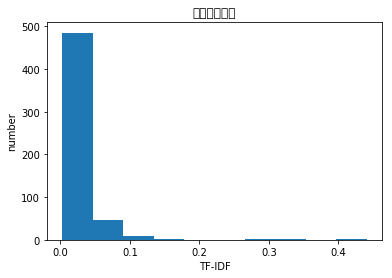

[('尾村', 0.44315385157788745), ('捷胜', 0.44315385157788745), ('沙角', 0.38500369066776596), ('黎明', 0.2600183965604257), ('板凳', 0.24960540205771597), ('题', 0.22839112738783482), ('熟', 0.21034116040671463), ('诗', 0.1755819407910358), ('人才', 0.1543414970007653), ('旅游区', 0.1506575828703652), ('名人', 0.14322310809759917), ('洞', 0.13432566670548174), ('村', 0.12070086001048061), ('痕迹', 0.11786358693039355), ('石头', 0.10348817895652054), ('过', 0.09737404967666333), ('中间', 0.09251496920094918), ('成', 0.08475052565103842), ('生活', 0.07789555033975479), ('开发', 0.07423206903031868), ('以前', 0.06988953238634062), ('住', 0.06748412743798413), ('算是', 0.06716155337039528), ('当地', 0.06593153982301128), ('据说', 0.06443364030249076), ('那里', 0.05807296804341728), ('应该', 0.05633450059641871), ('一些', 0.053856572711431426), ('小', 0.041119865167404075), ('里面', 0.035596331951256666), ('还有', 0.03519038636155141), ('但是', 0.03418174338387368), ('比较', 0.032774533373525705), ('没有', 0.026995304717142097), ('有', 0.024671033581

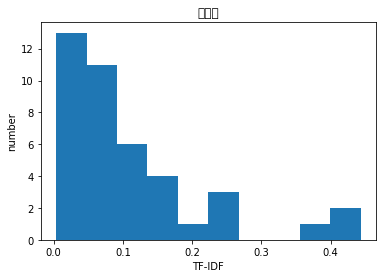

[('水库', 0.3911993748676157), ('供给', 0.3478918357535842), ('寻源', 0.2568850627938303), ('潭', 0.23897306560556533), ('下去', 0.2103905677060578), ('导到', 0.19113301489052045), ('看像', 0.1829197287858402), ('嘉兴', 0.17776678849287642), ('桥', 0.14290215390981018), ('起眼', 0.14107294959380573), ('老虎', 0.131334467214275), ('路边', 0.12826549398112608), ('相映成趣', 0.12699068560482782), ('水源', 0.12484511345820533), ('非凡', 0.11918062014546814), ('波光粼粼', 0.11897835096085324), ('😂', 0.11370931741785179), ('看海', 0.11258297134481245), ('视线', 0.11059990170453339), ('有人', 0.10890816376529276), ('青山绿水', 0.10732307989797443), ('一口', 0.10509147781102213), ('十大', 0.10477182790260749), ('天气', 0.10259648790122897), ('钓鱼', 0.10117405295405196), ('帐篷', 0.10094848748728459), ('昨天', 0.10092040743061273), ('导航', 0.09480461562394836), ('群山', 0.09037365932403903), ('绿树', 0.08904674763946312), ('远观', 0.08864824025568793), ('海边', 0.08512424164187278), ('环绕', 0.08507382603796552), ('搭', 0.08377503079080784), ('风貌', 0.083200839

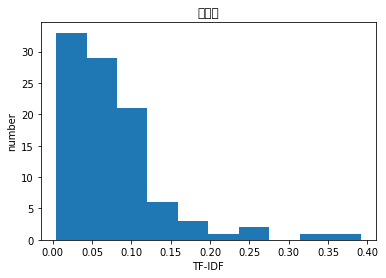

[('象山', 0.6461052418370972), ('青岛', 0.37324487083579816), ('观', 0.2932330753082948), ('气象台', 0.1611400789896771), ('观象台', 0.1520503705290203), ('奥博', 0.11338170039701742), ('维特', 0.1051787851714727), ('观天象', 0.09433512107484583), ('红瓦', 0.0841382818875292), ('青年', 0.07337160794377148), ('青旅', 0.07328816968040022), ('山顶', 0.06929322189052617), ('栈桥', 0.0684240007066796), ('有德', 0.06692025824528962), ('公园', 0.06477948141596454), ('北海舰队', 0.06465057996395199), ('天文', 0.06244608084178983), ('山上', 0.061326128757246454), ('老城区', 0.05767525200486787), ('俯瞰', 0.057211900440825275), ('水准', 0.05420325223906246), ('小山', 0.052076773046595366), ('旅舍', 0.05163444465406685), ('~', 0.05085600427512415), ('天文台', 0.047099330711556364), ('原点', 0.04648425026547446), ('信号', 0.04574413055984125), ('写生', 0.044970617829595994), ('老人', 0.04258356857849317), ('北服', 0.040528205207520714), ('基中', 0.040528205207520714), ('想山', 0.040528205207520714), ('杯鲜', 0.040528205207520714), ('蓝天', 0.04049541949436774), ('黄昏',

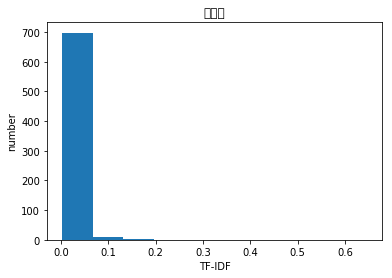

[('雪峰山', 0.5613583272247181), ('雪峰', 0.32899793947939254), ('闽侯县', 0.30508563448403203), ('福州', 0.26898653409573087), ('牡丹花', 0.1880074769694366), ('闽侯', 0.18711944240823938), ('寺', 0.1769423236676361), ('牡丹', 0.16678010478733438), ('庵树', 0.12058523496600662), ('腹碑', 0.12058523496600662), ('客饭', 0.10169521149467736), ('顶风冒雨', 0.10169521149467736), ('大禅林', 0.09617876409433355), ('车友们', 0.09355972120411969), ('！', 0.08509747196355001), ('要盖', 0.08378384059376866), ('护送', 0.07990778351321819), ('寒风刺骨', 0.07852536031386126), ('客堂', 0.07466969773279045), ('林业', 0.07252978387804701), ('崇圣', 0.07106074012688378), ('几百公里', 0.07038987002330356), ('盛开', 0.06935905034337904), ('77', 0.06858059863882728), ('福州市', 0.0677708271330897), ('开外', 0.0670133364777032), ('枯木', 0.06630178338192647), ('清修', 0.0657400957540249), ('最险', 0.06530933065530424), ('随缘', 0.06429689027746263), ('十米', 0.06146636362062797), ('毛毛细雨', 0.06003324042235981), ('看点', 0.058059336040949136), ('当今', 0.056505907823814), ('被子', 0

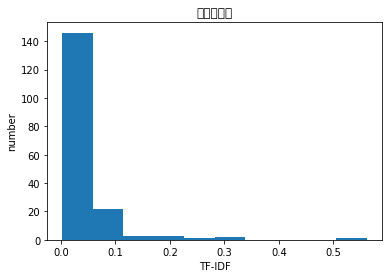

[('伊泰莲娜', 0.5053514989824269), ('手链', 0.3822014432747743), ('DIY', 0.2723881582506726), ('首饰', 0.24424931127653748), ('分七大', 0.2356285454348906), ('水晶', 0.22979541113927962), ('坦洲', 0.22565657031980016), ('晶石', 0.20860936626347729), ('精彩演出', 0.184486933265922), ('diy', 0.1725463944616175), ('示范点', 0.14649180624449243), ('首家', 0.1256534332010674), ('做', 0.10066833778415021), ('主题公园', 0.10033105896756006), ('粉', 0.09740087442450868), ('工业', 0.09726757373637167), ('眼前一亮', 0.09194856971061596), ('确定', 0.08573605506348521), ('窗口', 0.08535090755645726), ('节目', 0.08208391367528513), ('地带', 0.07975942602084897), ('形象', 0.07240849581801825), ('精彩', 0.072008585921336), ('黄', 0.06937772251816954), ('不断', 0.06462196257677918), ('主题', 0.0642140939129427), ('还行', 0.06158591060750169), ('80', 0.05824090879604455), ('几年', 0.05576781203786999), ('展示', 0.05527275195594486), ('镇', 0.055200546635518016), ('块', 0.05345359029999645), ('令人', 0.051836506393817136), ('每天', 0.05142082466596163), ('服务', 0.050590

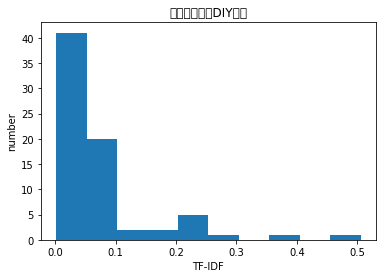

[('老子山', 0.5492655199561305), ('融水', 0.31406087200768285), ('西南郊', 0.19427439918525063), ('寿星', 0.18413730295665612), ('岩', 0.1633915109212671), ('伏地岩', 0.1472509163400005), ('岩口', 0.13150504876166522), ('炮竹', 0.12418363727700837), ('烧香拜佛', 0.12225912668289564), ('涨过', 0.12157051241069733), ('牛鼻', 0.11744730728709683), ('广西', 0.11636001289817681), ('人到', 0.11607478653835783), ('梵唱', 0.10942661046578273), ('约等于', 0.1050497260414186), ('纸钱', 0.10361527923841533), ('烧香', 0.10278006016930666), ('佛', 0.10104855485137007), ('鲁班', 0.0940261211979213), ('小狮子', 0.09089800058203325), ('廊檐', 0.09034668236868991), ('翁', 0.09007877725402676), ('！', 0.08907046937770506), ('赶过来', 0.0840915848469534), ('张嘴', 0.08391785537043085), ('2', 0.082949922795386), ('不设', 0.08068515439265883), ('昂首', 0.0798812517570006), ('不花', 0.0789970282888919), ('县城', 0.0778667763218563), ('蜡烛', 0.07562833980855195), ('善男信女', 0.07266445757134472), ('捐赠', 0.07174930594510484), ('还愿', 0.06975259271398052), ('香炉', 0.0685806816

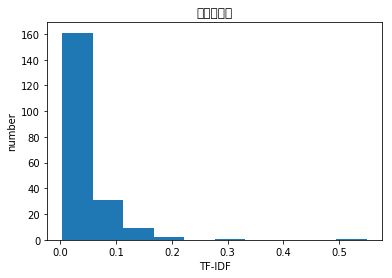

[('冰川', 0.6604534974110684), ('来古村', 0.2579101132662081), ('古冰川', 0.24729364518930325), ('4g', 0.1719400755108054), ('然乌湖', 0.1351032180299161), ('冰块', 0.11171368340523902), ('冰面', 0.10553346371900053), ('你好', 0.09553675060247745), ('雄加', 0.0950615929034153), ('乌去', 0.09103851566086764), ('湖面', 0.09052492580834327), ('东嘎', 0.08818409693130098), ('雅隆', 0.08818409693130098), ('丙察察', 0.08013794244620565), ('从然', 0.07909254178328841), ('美西', 0.07909254178328841), ('几大块', 0.07814686185254671), ('源头', 0.07781495680503005), ('骄', 0.07648932961896243), ('网络', 0.07486490387012182), ('帕隆藏布', 0.0727239845119878), ('浮冰', 0.07221504581117409), ('帕隆藏布江', 0.0704060277445247), ('縠', 0.06961183364684811), ('渐觉', 0.06852834414893186), ('再远', 0.06611109433649917), ('高崖', 0.06509254654337579), ('来错', 0.06416889132607877), ('棹', 0.06416889132607877), ('八人', 0.06352853177241038), ('天蓝色', 0.059927736528475994), ('并不一定', 0.059927736528475994), ('碧蓝色', 0.05936859540373806), ('皱', 0.059233598364384854), ('浮在', 

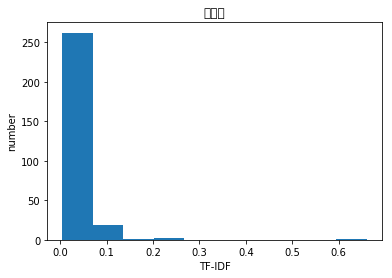

[('宴友', 0.3027992499613861), ('寓川', 0.3027992499613861), ('拜亲', 0.3027992499613861), ('营商', 0.24544815495199007), ('二年', 0.2235168812705763), ('陕西', 0.20038969222004968), ('陕西人', 0.19126921897111732), ('借宿', 0.1784392493673635), ('议事', 0.17364938865823615), ('1663', 0.16666092087505627), ('先贤', 0.1634706853465941), ('蓉城', 0.1500128551474188), ('清康熙', 0.13902489775292293), ('会馆', 0.13508937606973329), ('洛带', 0.13257874773215023), ('祭祀', 0.11693671498630338), ('科学', 0.11446203418208072), ('嘉庆', 0.11218392825942461), ('庆益', 0.10093308332046201), ('擎柱', 0.10093308332046201), ('斗枋', 0.10093308332046201), ('益泰', 0.10093308332046201), ('陕人', 0.10093308332046201), ('豆花', 0.09580078908611757), ('陕籍', 0.09412345924350807), ('首倡', 0.09412345924350807), ('简瓦', 0.09014008451448208), ('洛带镇', 0.08512162586056118), ('1797', 0.08050421108960014), ('那餐', 0.08050421108960014), ('布政司', 0.07737565447761367), ('始建', 0.07625428297219954), ('预', 0.0750064275737094), ('覆以', 0.07432862705458126), ('1885', 0.071

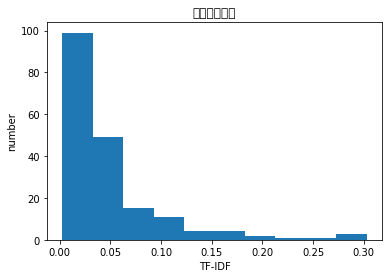

[('阳明', 0.6648512758986095), ('扶风', 0.3924989798902356), ('祠', 0.32135818655614456), ('王阳明', 0.2415483293719641), ('尹道', 0.15692772545100067), ('真祠', 0.15692772545100067), ('三组', 0.13741963579765476), ('贵阳', 0.13187301485087632), ('清嘉庆', 0.09118576557958995), ('山麓', 0.09028733209059527), ('十九年', 0.07887153064153084), ('巨儒', 0.07846386272550034), ('郑珍', 0.07846386272550034), ('王守仁', 0.07774516003489743), ('城东', 0.07175851582104661), ('赞之为', 0.07007354758947976), ('古建筑', 0.06843240716677715), ('1814', 0.06787646380318765), ('心学', 0.06787646380318765), ('总称', 0.057930102384002875), ('插天', 0.05728906488087499), ('哲学家', 0.05419244920601074), ('始建', 0.046105837607893496), ('纪念', 0.044183941340350814), ('清幽', 0.0413017139099068), ('部分', 0.04064490673649414), ('坐定', 0.039657432444778054), ('安享', 0.039657432444778054), ('清代', 0.039168952517719825), ('寺', 0.038378325501465894), ('芙蓉', 0.03570762835153328), ('共同', 0.03564871224814697), ('三', 0.035327995332626094), ('一朵', 0.034386247436164794), ('

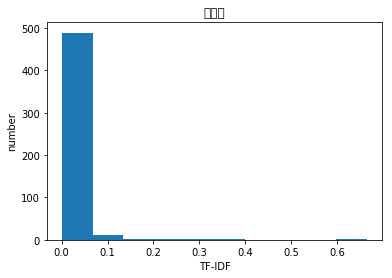

[('眷村', 0.42574080671554243), ('文化馆', 0.31961449673131237), ('村子', 0.24590276010739212), ('大陆', 0.2136653298707432), ('永康县', 0.19586547274216007), ('户', 0.1925539935053744), ('陆军军官', 0.18169503903999057), ('民宅', 0.17540524070413546), ('垂垂老矣', 0.1675246053378211), ('户主', 0.16511669437054174), ('精忠', 0.16296274461235402), ('二村', 0.16101426004524086), ('瀛', 0.14265708833364787), ('永康', 0.138554654008347), ('来台', 0.13621569290214086), ('第二代', 0.13411707095696382), ('思乡', 0.12633270487329065), ('里长', 0.12501330423131266), ('500', 0.12370056799819482), ('老兵', 0.12289132260228072), ('详细', 0.11765615901511249), ('村长', 0.11489213547615314), ('志愿', 0.11036925210172924), ('开办', 0.10815297420249036), ('捐赠', 0.10234184537185044), ('赴', 0.10043171656538684), ('由', 0.09636523614933204), ('回顾', 0.09573592433516181), ('凭借', 0.09440699064827834), ('拆掉', 0.0938429931023133), ('军队', 0.09315919643477766), ('情绪', 0.08438272094461685), ('以往', 0.08416500201331105), ('建了', 0.07423946742502642), ('总共', 0.071639

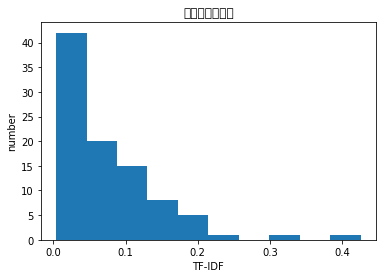

[('天缘', 0.45478714595093084), ('泰和', 0.4202660708391491), ('黄花', 0.35684996514881234), ('溪', 0.2724414636860028), ('青州', 0.23587590907699205), ('谷', 0.20103719546005383), ('青州市', 0.1865498128191419), ('景区', 0.13921428807278946), ('庙子', 0.13579982272096652), ('次畅', 0.11064498177205974), ('符合规范', 0.11064498177205974), ('班车', 0.10521474694093995), ('驼山', 0.09463514239886187), ('瀑布', 0.09368218913644312), ('云门山', 0.08902817870983845), ('忽悠', 0.07878851566611937), ('潍坊', 0.07301833933664058), ('人嘛', 0.0711748253891542), ('每辆车', 0.07062038333906509), ('西南方', 0.06992025031929437), ('绑定', 0.06833576149869568), ('程序', 0.06512500175415561), ('太像', 0.06490290533363449), ('成绩', 0.06426114813117259), ('人造', 0.06376589133652753), ('交通', 0.06195494179340895), ('境内', 0.05848112488640556), ('不好', 0.05808156744152998), ('分为', 0.05796540555481645), ('远道而来', 0.057461446563599895), ('缓缓的', 0.057289503070789206), ('元', 0.05657365630642396), ('更换', 0.05646620982812265), ('套路', 0.055549976930389856), ('承受', 0

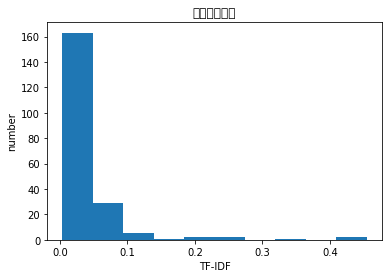

[('建妆设', 0.38839262449492806), ('秦池', 0.38839262449492806), ('西积', 0.38839262449492806), ('酒之城', 0.38839262449492806), ('这酒', 0.3275498041042839), ('刚建', 0.22832743677702835), ('博览园', 0.20934646850230748), ('没听说过', 0.19922459012408827), ('山东', 0.14239299566308647), ('酒', 0.14025414099981962), ('再次', 0.10804829863653789), ('占地', 0.10607625149252412), ('满好', 0.10381363328674134), ('力', 0.08883281824019015), ('下次', 0.07811158975114203), ('另', 0.0776914866169743), ('基本上', 0.07561001947368493), ('出名', 0.07541763346139677), ('挺不错', 0.06183719183497728), ('以前', 0.05470323388138542), ('好多', 0.054592453524232455), ('文化', 0.053956251464568214), ('哈哈', 0.05325576248353988), ('.', 0.051087544743766165), ('比', 0.05018100774632582), ('可能', 0.05016132597062375), ('朋友', 0.04761253989040643), ('还是', 0.044713045216089486), ('一去', 0.04352802605073959), ('环境', 0.04136240742066391), ('"', 0.041202938635106705), ('时间', 0.03965164112800557), ('给', 0.03879711579314581), ('挺', 0.034368760702007874), ('什么', 0.0

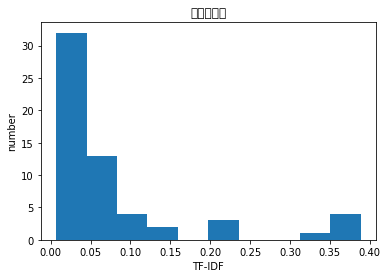

[('原起', 0.3171918559325527), ('唐天宝', 0.2532454193699154), ('夜听潮', 0.18333378646317816), ('影烟', 0.18333378646317816), ('耸翠出', 0.18333378646317816), ('迷塔', 0.18333378646317816), ('迷寺', 0.18333378646317816), ('重霄', 0.1709648572147273), ('六年', 0.163704052932156), ('宝塔', 0.15248196242979228), ('747', 0.1513605681818595), ('飞阁流丹', 0.14860981205695728), ('一仿', 0.1462269987178255), ('元佑', 0.1462269987178255), ('雕造', 0.1441252083974426), ('对仗', 0.14054432153239949), ('香亭', 0.14054432153239949), ('1087', 0.1389916389334086), ('陀罗尼', 0.1362408828085064), ('寺', 0.1345086162195801), ('混合结构', 0.1266227096849577), ('公元', 0.12103898343432276), ('主次', 0.11795902036846567), ('经幢', 0.11580646303549771), ('层峦', 0.11352532856342298), ('密檐', 0.10884354507568128), ('暮', 0.10830275845161323), ('工整', 0.10752111848285426), ('大圣', 0.10303651482333959), ('殿前', 0.09945562795829645), ('砖塔', 0.0983547313355979), ('诗文', 0.09775485660162082), ('极地', 0.0964746158272304), ('名寺', 0.09620217400262994), ('后经', 0.0947738444

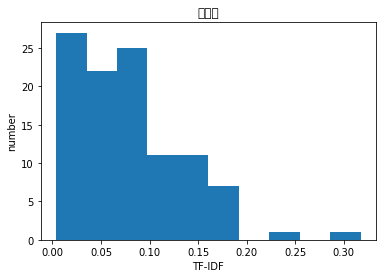

[('八宿', 0.46984050272864347), ('八宿县', 0.4409033715389716), ('昌都', 0.27646901300974114), ('县城', 0.20579195606176673), ('3260', 0.19412694380750437), ('怒江', 0.16990943292709307), ('左贡县', 0.1432607307535437), ('白马', 0.14077855655293134), ('川藏线', 0.1199077083730513), ('多拉', 0.11385920347891208), ('逆风', 0.11268015394862574), ('西藏自治区', 0.10194565975625583), ('然乌', 0.08818067430779432), ('海拔', 0.08496771284442485), ('所在地', 0.0833320856977702), ('东南部', 0.07960882068173349), ('市', 0.07910364048468423), ('神山', 0.07802088902276678), ('银鱼', 0.07325129741375418), ('上游', 0.06146567121389455), ('西藏', 0.0613846392782473), ('东部', 0.06069118711710028), ('齐备', 0.05988509249713869), ('卡若区', 0.0598715979283957), ('坑侈', 0.0598715979283957), ('宿来', 0.0598715979283957), ('市卡若区', 0.0598715979283957), ('波神', 0.0598715979283957), ('洛隆县', 0.0598715979283957), ('白玛镇', 0.0598715979283957), ('西巴村', 0.0598715979283957), ('酸菜汤', 0.0598715979283957), ('好得多', 0.058226386603315916), ('市政', 0.05781739472522033), ('3910', 

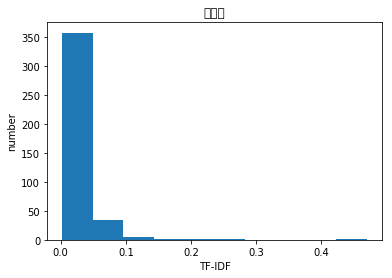

[('屏边', 0.6943003255213047), ('大围山', 0.41338693557851536), ('头绪', 0.17335412245188578), ('自然风', 0.15996980594441038), ('修在', 0.14454639677670422), ('县城', 0.13703638163616838), ('一个圈', 0.13598282894282773), ('很早以前', 0.10937870931679188), ('自然保护区', 0.09921808964002433), ('保护区', 0.09904077061154583), ('明确', 0.0986898289097396), ('影', 0.09284447667489361), ('树上', 0.09199511939339057), ('原始森林', 0.08960625073313684), ('云海', 0.08839006614754054), ('指示', 0.08830333759932132), ('路标', 0.0878457553830386), ('走', 0.08594701472372773), ('两条', 0.08157925017617182), ('氧吧', 0.07798006053237744), ('国家级', 0.07775110106687827), ('高处', 0.07489865763977935), ('长长的', 0.07454493292043156), ('陡', 0.07375457495731844), ('浓', 0.07352864293433452), ('观景台', 0.07127106245912135), ('公园', 0.06903519227474438), ('台阶', 0.06363561661365724), ('空气清新', 0.06267724151466386), ('挺大', 0.058604599412942646), ('同时', 0.054631419901527686), ('天然', 0.053357757268059136), ('酒店', 0.05220734525862502), ('很近', 0.05175605839204969), (

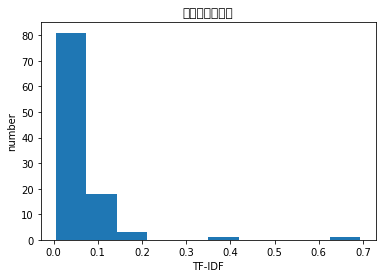

[('增城', 0.5963594171797214), ('长寿', 0.3824245560442507), ('参拜', 0.3517101088224494), ('斋菜', 0.2426373439691765), ('凤凰山', 0.22173566460639035), ('寺', 0.21116664926309792), ('信众', 0.20284587714445906), ('不光', 0.16426943766579605), ('他们', 0.13917314439483167), ('广州', 0.13365019797645386), ('寺院', 0.13319890782096644), ('临近', 0.12984866341174162), ('完整', 0.09613493762238715), ('便利', 0.09315577804078252), ('令人', 0.0885688799092274), ('深刻', 0.08673521414158562), ('好吃', 0.08103695422826113), ('博物馆', 0.08002148423748022), ('过来', 0.07206720740496196), ('印象', 0.06436949574025899), ('公园', 0.057505295652652326), ('其他', 0.056737136528423285), ('交通', 0.056358259343491), ('旁边', 0.053886476687991874), ('只有', 0.0533822212038033), ('建筑', 0.04870697638255158), ('最', 0.03978846887357683), ('从', 0.034818262617998016), ('非常', 0.030665144480405335), ('还有', 0.030617020043087726), ('位于', 0.029954919272796317), ('很多', 0.025789001741516427), (' ', 0.02446483559207006), ('我', 0.02341093776991447), ('人', 0.02149282

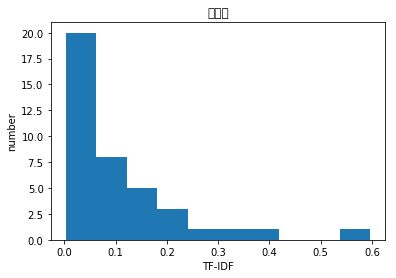

[('粤剧', 0.6946721367638381), ('会馆', 0.37472322250617307), ('恩宁路', 0.23447541321607723), ('八', 0.22341764880931536), ('仝人', 0.1566529374283996), ('艺人', 0.1301090571064398), ('戏班', 0.1273562817039007), ('西关', 0.11525627576399479), ('名伶', 0.09775303532641587), ('骑楼', 0.0861680313665939), ('行会', 0.0804499875497165), ('祖屋', 0.07930841213628172), ('恩宁', 0.0783264687141998), ('戏行', 0.0783264687141998), ('广州', 0.07800565312750579), ('邝', 0.07265972195939664), ('马师', 0.07083543697241372), ('独脚', 0.06808464607485237), ('解禁', 0.06516869021761058), ('团结', 0.06414189166180677), ('中人', 0.04949710516836283), ('新华', 0.04949710516836283), ('九', 0.04500512409517288), ('英', 0.04308401568329695), ('八合', 0.04199660773450148), ('八堂', 0.04199660773450148), ('庆和堂', 0.04199660773450148), ('德和堂', 0.04199660773450148), ('慎和堂', 0.04199660773450148), ('新和堂', 0.04199660773450148), ('普和堂', 0.04199660773450148), ('百和堂', 0.04199660773450148), ('福和堂', 0.04199660773450148), ('过八', 0.04199660773450148), ('、', 0.041932430

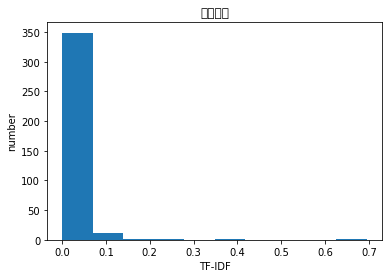

[('洑', 0.4712621294823059), ('烧烤', 0.3413128752562006), ('常德', 0.20733447064013966), ('花露水', 0.184604622210062), ('户外运动', 0.17393329288047316), ('河伏', 0.1684523007091408), ('潘潘', 0.14572245227906308), ('拿卡', 0.14206376387797637), ('培训', 0.14126128799913976), ('拓展', 0.13404496594445986), ('河', 0.13072440889121223), ('搞', 0.12017156612474747), ('等于', 0.11938323394319006), ('综合性', 0.11903985656891113), ('暴利', 0.11503215953510867), ('谷', 0.11416841543744219), ('12000', 0.10796899123285982), ('帮子', 0.10567743768148108), ('二十几', 0.10304844038097873), ('快乐', 0.09953807859377416), ('餐饮', 0.09605481432477707), ('专业', 0.09341048639516941), ('台', 0.09313802705059647), ('集', 0.09092731906353209), ('千亩', 0.08941838666509114), ('度假', 0.08540467545770931), ('90%', 0.08414896903912719), ('景区', 0.08235351381510111), ('西郊', 0.08207986721678355), ('空气', 0.08113524400691075), ('年卡', 0.08093738688999214), ('百年老', 0.08047111509546653), ('一体', 0.0798031794500425), ('竹海', 0.07972230370004554), ('山岭', 0.078591

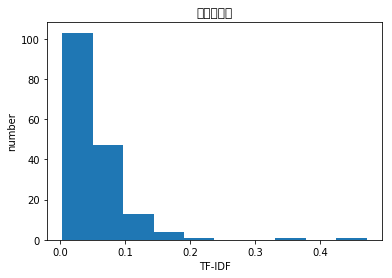

[('留云', 0.46019554093447007), ('普陀', 0.2598157599761776), ('东壁', 0.2417310966497218), ('闽东', 0.22764686664734354), ('云寺', 0.21699864201526428), ('禅寺', 0.21504148785435437), ('三沙人', 0.1717658136482051), ('十娘', 0.1717658136482051), ('依山', 0.1607868362142978), ('寺庙', 0.15601649887053978), ('榜山', 0.13923284832824262), ('花竹', 0.13167627313744545), ('全寺', 0.10927707225995424), ('精神抖擞', 0.10636212127922538), ('南普陀', 0.10303760596460933), ('留', 0.10210200965312677), ('佛教', 0.10068912552728439), ('颇', 0.09043113192578463), ('面海', 0.08926813541946776), ('妈祖', 0.08691582517163525), ('而建', 0.0867738563386914), ('望海', 0.08660525332539254), ('西行', 0.08580420732644217), ('遗风', 0.08532236887781881), ('痴迷', 0.08485402909525269), ('自发', 0.08404272311626244), ('捐赠', 0.0836944055811428), ('足见', 0.08236946410791772), ('山海', 0.07952152178182335), ('全方位', 0.07854354493934376), ('岸', 0.07585814406749472), ('绝好', 0.07564379963219629), ('南海', 0.07471186965539175), ('崇敬', 0.07340468257349012), ('虽小', 0.072765093

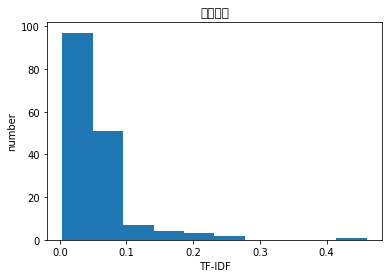

[('粘度', 0.37858225947918844), ('可堪', 0.3580354894891639), ('雪村', 0.3504413858933575), ('比雪乡', 0.3470725151534097), ('柴河', 0.3439361715285262), ('威虎山', 0.34100231800182507), ('关东', 0.28168071685972895), ('厚度', 0.24828443826369026), ('近些年', 0.20342062138697128), ('兴起', 0.19003400036029686), ('雪', 0.13824882771755298), ('以及', 0.08131830927251484), ('文化', 0.06488227629600647), ('景点', 0.035786611148965926), ('和', 0.02081276444296244), ('都', 0.018148852808646313), ('在', 0.010005979753656188), ('是', 0.007552463938495276), ('的', 0.004976619961010082), ('，', 0.0007484231016341496)]
defaultdict(<class 'float'>, {'以及': 0.08131830927251484, '和': 0.02081276444296244, '在': 0.010005979753656188, '是': 0.007552463938495276, '景点': 0.035786611148965926, '的': 0.004976619961010082, '都': 0.018148852808646313, '，': 0.0007484231016341496, '文化': 0.06488227629600647, '关东': 0.28168071685972895, '兴起': 0.19003400036029686, '厚度': 0.24828443826369026, '可堪': 0.3580354894891639, '威虎山': 0.34100231800182507, '柴河': 0.343

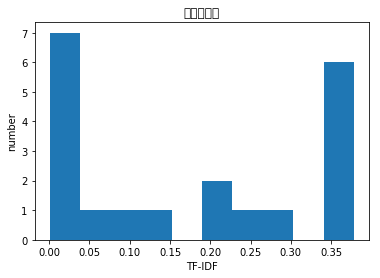

[('瞄', 0.47493151922114135), ('紧迫', 0.4656319025748222), ('足矣', 0.36683355477790947), ('顺道', 0.32907738411095067), ('庙', 0.2862895062825939), ('一眼', 0.23085467615546518), ('要是', 0.20985207019702026), ('小', 0.16944097698314034), ('逛', 0.15750260244671466), ('时', 0.11798288783917797), ('的话', 0.11367047381320763), ('很大', 0.11139279681881432), ('一下', 0.1065862553141265), ('时间', 0.10437513968198613), ('真的', 0.09702439992944743), ('不是', 0.08058230338260862), ('！', 0.051534891467982374), ('可以', 0.03908012335404128), ('是', 0.016532565617907304), ('。', 0.00683561653088354), ('，', 0.006553280698054947)]
defaultdict(<class 'float'>, {'。': 0.00683561653088354, '一下': 0.1065862553141265, '一眼': 0.23085467615546518, '不是': 0.08058230338260862, '可以': 0.03908012335404128, '小': 0.16944097698314034, '时': 0.11798288783917797, '是': 0.016532565617907304, '真的': 0.09702439992944743, '要是': 0.20985207019702026, '逛': 0.15750260244671466, '！': 0.051534891467982374, '，': 0.006553280698054947, '很大': 0.111392796818814

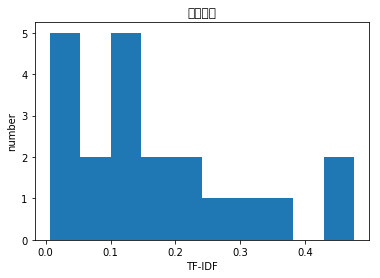

[('环秀山庄', 0.517078906764352), ('假山', 0.46481595947466325), ('景德路', 0.20966653199938654), ('苏州', 0.20170159487775824), ('园林', 0.1913819096635168), ('刺绣', 0.15003255947743682), ('湖石', 0.13089341325069537), ('戈裕良', 0.12847739532064797), ('苏州园林', 0.10256347220344599), ('叠山', 0.09968309379353003), ('此园', 0.09487105855075997), ('262', 0.09165657855592439), ('城中', 0.08879054409354174), ('中国之最', 0.08401703447323884), ('金谷园', 0.08335612379470246), ('754', 0.08126328169303927), ('磴道', 0.07575048658039377), ('古典', 0.07375307077876302), ('该园', 0.07277486361179804), ('半亩', 0.06826135899725577), ('辅', 0.0665513824917646), ('苏绣', 0.06356463529700418), ('今', 0.05916068646049545), ('平方米', 0.058481895616523075), ('2179', 0.05736951102362659), ('颐园', 0.05736951102362659), ('园景', 0.055740511221159764), ('池水', 0.05536647253171048), ('以山', 0.05425955375652294), ('博物馆', 0.05358051119808842), ('、', 0.052915938651328265), ('钱氏', 0.05050032438692918), ('洞壑', 0.04924561016803353), ('五代', 0.04749877233944508), ('

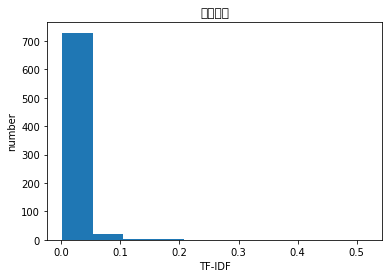

[('磨盘', 0.42307589299352494), ('2013.10', 0.410895831255369), ('诸葛', 0.40067374360015956), ('半日', 0.3074655529032583), ('烤鱼', 0.3029760137656824), ('冷门', 0.27413809697503944), ('岭', 0.24548578268384377), ('十一', 0.1695535669124802), ('…', 0.1683387563384945), ('就要', 0.14803110252141016), ('期间', 0.14171263669889309), ('游', 0.12798060617202892), ('人不多', 0.11960924883620455), ('起来', 0.09745236147018028), ('5', 0.09575969949644664), ('.', 0.08615301180190683), ('吃', 0.08253411266927642), ('风景', 0.05555197681328113), ('景点', 0.05018705360230307), ('不错', 0.03393849424844843), ('去', 0.020851730668854852), ('，', 0.005247933390865418)]
defaultdict(<class 'float'>, {'.': 0.08615301180190683, '…': 0.1683387563384945, '不错': 0.03393849424844843, '去': 0.020851730668854852, '吃': 0.08253411266927642, '景点': 0.05018705360230307, '期间': 0.14171263669889309, '起来': 0.09745236147018028, '，': 0.005247933390865418, '冷门': 0.27413809697503944, '风景': 0.05555197681328113, '5': 0.09575969949644664, '十一': 0.1695535669

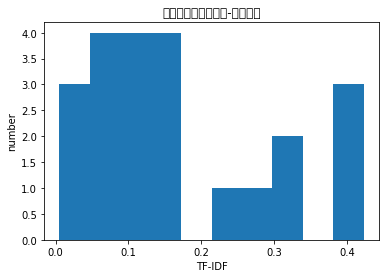

[('油菜花', 0.6740033238285726), ('莲湖', 0.47001041765650464), ('桥头', 0.17159109198153624), ('荷花', 0.15478841885663253), ('东莞', 0.15038941560325506), ('莲花', 0.13869832721869202), ('桥头镇', 0.1285334365679663), ('环湖', 0.11096250907033046), ('湖中', 0.10481897691206397), ('亲芳区', 0.09810020831948282), ('公园', 0.08275631144799735), ('很盛', 0.06471388941040591), ('拍摄', 0.06415446150138687), ('东莞市', 0.060371852079143785), ('广告词', 0.05916593946040381), ('6.7', 0.05700294561347228), ('冬春', 0.056258531697473385), ('童话故事', 0.05321778385466029), ('湖都', 0.052710665956595994), ('栈道', 0.0509036528734557), ('逆时针', 0.05019283167484912), ('๓', 0.050135975066504954), ('田', 0.050124238974076724), ('不堵车', 0.048894126656325046), ('花丛', 0.04820229106359607), ('花展', 0.048151092677622735), ('涂', 0.04605109788654073), ('山岭', 0.04576845850812186), ('亩', 0.04535108736000151), ('防晒霜', 0.043448692726341005), ('遮阳', 0.043355536122978156), ('夏天', 0.043255041424279134), ('爆棚', 0.0425556613960302), ('满塘', 0.0417608361122904), (

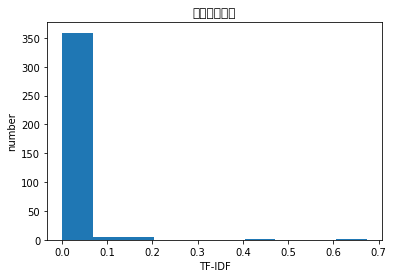

[('海原县', 0.5746543001711607), ('西吉县', 0.5087595357261707), ('月亮山', 0.40471816541763184), ('辖区', 0.3388234009726419), ('错误', 0.25716187981637456), ('定位', 0.24170414053915226), ('其实', 0.06200265312836437), ('所以', 0.05542056841678078), ('在', 0.026404421355637742), ('是', 0.009964963202749888), ('。', 0.008240302052644815), ('的', 0.0021887706753449497)]
defaultdict(<class 'float'>, {'。': 0.008240302052644815, '其实': 0.06200265312836437, '在': 0.026404421355637742, '是': 0.009964963202749888, '的': 0.0021887706753449497, '所以': 0.05542056841678078, '错误': 0.25716187981637456, '定位': 0.24170414053915226, '月亮山': 0.40471816541763184, '海原县': 0.5746543001711607, '西吉县': 0.5087595357261707, '辖区': 0.3388234009726419})
[0.008240302052644815, 0.06200265312836437, 0.026404421355637742, 0.009964963202749888, 0.0021887706753449497, 0.05542056841678078, 0.25716187981637456, 0.24170414053915226, 0.40471816541763184, 0.5746543001711607, 0.5087595357261707, 0.3388234009726419]


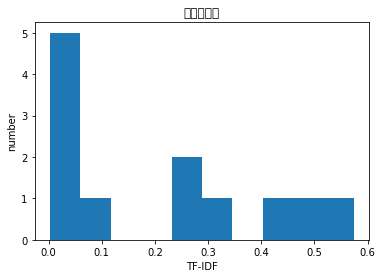

[('文庙', 0.46014868375006374), ('孔庙', 0.4106097266231989), ('恭城', 0.30596692552709687), ('恭城县', 0.196940330658922), ('广西', 0.18453300223866195), ('孔子', 0.1786960002263529), ('武庙', 0.15474735807141135), ('1477', 0.14517818865085477), ('油茶', 0.14162519153474165), ('乂', 0.13129355377261467), ('祭祀', 0.12024391938657393), ('保存', 0.1072931101913742), ('圣庙', 0.1057394005820915), ('完整', 0.10399933115734193), ('西山', 0.10233952395146252), ('学宫', 0.10138012857588183), ('南麓', 0.09954464934934992), ('高考', 0.09601404129693522), ('四大', 0.09158098309129327), ('政治家', 0.08985943993675863), ('祠庙', 0.08985943993675863), ('大成殿', 0.08890610115002616), ('思想家', 0.088722425096821), ('教育家', 0.08800920692254782), ('桂林市', 0.08800920692254782), ('宫殿式', 0.08459309815337232), ('自治区', 0.08135144488637296), ('周渭祠', 0.07784075473416663), ('常挂', 0.07784075473416663), ('迄今', 0.07458432762576897), ('茶江', 0.07258909432542739), ('印山', 0.06564677688630734), ('庙', 0.06539233504164293), ('全庙', 0.06426540951105376), ('祭拜', 0.063

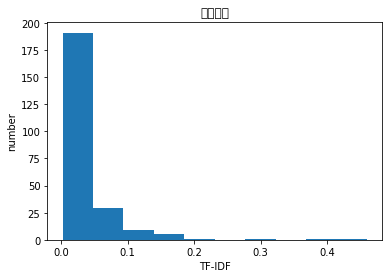

[('校区', 0.3460363527252301), ('江北', 0.3280868590400336), ('商学院', 0.2830305000280378), ('商', 0.28014708302318675), ('商大', 0.2698856742577459), ('母校', 0.2124339915893559), ('大学', 0.18326800622211825), ('游泳馆', 0.14640863382616817), ('二手物品', 0.13494283712887295), ('财专', 0.13494283712887295), ('校内', 0.1315041718844617), ('足球场', 0.12929757438172654), ('哈尔滨', 0.11011170822318053), ('大酒店', 0.10716467865625236), ('废弃', 0.09855664967572454), ('羽毛球馆', 0.09266447093634927), ('学校', 0.09021242402112253), ('自营', 0.08983908773599031), ('学生', 0.08828672249905836), ('设施', 0.08822204871241664), ('北校区', 0.08682373926019513), ('119', 0.08523934939296464), ('南校区', 0.0846554971420162), ('可转', 0.08230846752946541), ('毕业', 0.08091455523887164), ('最美', 0.07984853392099199), ('校车', 0.07932991043051574), ('通达', 0.07643715490132241), ('清纯', 0.07262046466213565), ('军训', 0.07206146485558546), ('毕业生', 0.0718443605251229), ('北区', 0.07101014287543374), ('球场', 0.07101014287543374), ('南区', 0.07051444204896583), ('深', 0.0

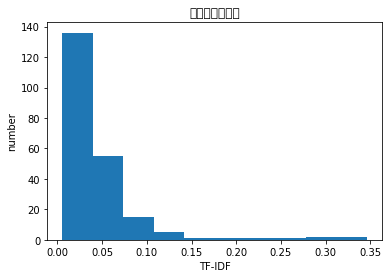

[('石库门', 0.4207946270978226), ('新天地', 0.24812340593144816), ('贺友直', 0.24247444304892202), ('主卧室', 0.22611548767856524), ('厨房', 0.21748239730582), ('冬冷夏热', 0.19654904917023022), ('亭子间', 0.18813116960112533), ('上海', 0.1841364857213216), ('夹层', 0.16746924612486522), ('各行各业', 0.16468945060996262), ('账房', 0.16468945060996262), ('厢', 0.1638311384295167), ('—', 0.15987842288230247), ('正上方', 0.15789987068223554), ('房租', 0.15160717192364626), ('会客厅', 0.14220577572243356), ('开窗', 0.13524821655328947), ('民居', 0.1347395244046767), ('小人', 0.12058041301535045), ('书房', 0.12017925349105858), ('展室', 0.12017925349105858), ('全称', 0.11561258449889229), ('式样', 0.11302783954696403), ('老先生', 0.10708569326352024), ('上楼', 0.1062627546746656), ('屋里', 0.1049751089719393), ('几间', 0.10336073732375824), ('书画', 0.10316648944707894), ('入门', 0.10297382728503637), ('再往', 0.09329809301532481), ('博物馆', 0.08988631521856204), ('做成', 0.08886108817433354), ('朝', 0.08772802337069271), ('一楼', 0.08077973865383095), ('作', 0.0777

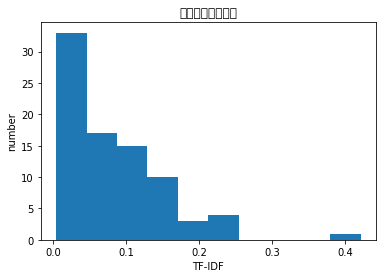

[('田东', 0.5469974944593167), ('有南', 0.42723447631984024), ('观音洞', 0.38241429756073153), ('居士', 0.3140956968145536), ('八卦', 0.27827045954008495), ('修行', 0.24885707611152866), ('拜佛', 0.23881834805039565), ('很深', 0.19334157808729321), ('山下', 0.15506094081898933), ('并', 0.08005215691661668), ('其实', 0.0636214796410362), ('不是', 0.049838918899980406), ('就是', 0.03223837485772812), ('地方', 0.029405917099029157), ('一个', 0.026006929776358653), ('。', 0.004227723999108173), ('的', 0.0022459172621542506), ('，', 0.0010132759040419057)]
defaultdict(<class 'float'>, {'。': 0.004227723999108173, '一个': 0.026006929776358653, '不是': 0.049838918899980406, '其实': 0.0636214796410362, '地方': 0.029405917099029157, '就是': 0.03223837485772812, '的': 0.0022459172621542506, '，': 0.0010132759040419057, '拜佛': 0.23881834805039565, '并': 0.08005215691661668, '很深': 0.19334157808729321, '八卦': 0.27827045954008495, '修行': 0.24885707611152866, '居士': 0.3140956968145536, '山下': 0.15506094081898933, '有南': 0.42723447631984024, '田东': 0.546

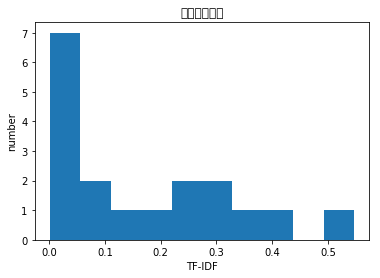

[('代言', 0.6050295981292992), ('家乡', 0.5570048990940967), ('呦', 0.3787557163033154), ('嘻嘻', 0.333541717742886), ('可是', 0.18395103902458326), ('我', 0.11537435821728702), ('、', 0.10621975885999396), ('为', 0.09007458244528589), ('这里', 0.04918521332755226), ('的', 0.0037785695761702533)]
defaultdict(<class 'float'>, {'、': 0.10621975885999396, '嘻嘻': 0.333541717742886, '我': 0.11537435821728702, '的': 0.0037785695761702533, '这里': 0.04918521332755226, '为': 0.09007458244528589, '可是': 0.18395103902458326, '代言': 0.6050295981292992, '呦': 0.3787557163033154, '家乡': 0.5570048990940967})
[0.10621975885999396, 0.333541717742886, 0.11537435821728702, 0.0037785695761702533, 0.04918521332755226, 0.09007458244528589, 0.18395103902458326, 0.6050295981292992, 0.3787557163033154, 0.5570048990940967]


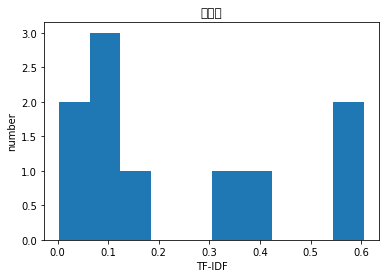

[('永登县', 0.5262716140360502), ('青龙山', 0.3978332214168162), ('公园', 0.2836137716595244), ('中川', 0.22209177491107143), ('中选', 0.21266331185792198), ('兰州', 0.14572731762384297), ('并且', 0.13751587242990587), ('打扫', 0.13414668177997513), ('乱糟糟', 0.133304719522112), ('错误', 0.12693889001432876), ('座椅', 0.12570053193503203), ('花草树木', 0.12570053193503203), ('公厕', 0.12189009586867065), ('亭台楼阁', 0.11463820760866537), ('长城', 0.11082007473668189), ('喷泉', 0.10450840603154213), ('机场', 0.10416171576113337), ('其', 0.10164309146432504), ('此外', 0.10071666828253274), ('公共设施', 0.09867195027333006), ('设有', 0.09542111848972683), ('各类', 0.09075473114255671), ('宜人', 0.09051464348804461), ('人文景观', 0.08833605909653482), ('形状', 0.08431954907833882), ('同', 0.08327999194111062), ('人来', 0.08245728886438768), ('自然景观', 0.08219352755833585), ('齐全', 0.08112968817349517), ('占地面积', 0.08024070929427754), ('；', 0.07848561202236089), ('亮点', 0.07779416196499156), ('遗址', 0.07639884517676152), ('决定', 0.07354511664907938), ('山水',

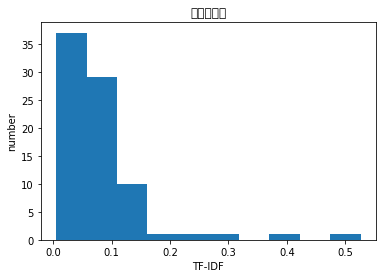

[('静海', 0.4873539431554097), ('议约', 0.32293345025639064), ('郑和', 0.32165492933817824), ('条约', 0.30115475400600356), ('海寺', 0.15463333335080376), ('英国', 0.14894336637650216), ('西洋', 0.1455469223175751), ('警世钟', 0.13611818117173313), ('两国之间', 0.1327362342349607), ('1842', 0.128671877566244), ('胁迫', 0.128671877566244), ('寺', 0.12703584886584493), ('割让', 0.12266075705211496), ('侵略军', 0.12105447383328163), ('长鸣', 0.11823907496001426), ('前事不忘', 0.11473968352147906), ('后事之师', 0.11422108205589009), ('谈判', 0.11422108205589009), ('挨打', 0.1105628466723906), ('朱棣', 0.10471695510720459), ('签订', 0.10471695510720459), ('平等', 0.09471427811445113), ('侵略者', 0.09204769449331995), ('佛龛', 0.08986590949016364), ('清政府', 0.08950858406677967), ('今人', 0.0868938211083433), ('书本上', 0.08454277094072941), ('净', 0.0788595961193175), ('寺里', 0.07037631148978056), ('陈列馆', 0.06889096423284223), ('折服', 0.06885632245743792), ('播放', 0.0666535396354045), ('愿', 0.06576632332915083), ('落后', 0.0652835528257383), ('非凡', 0.06511

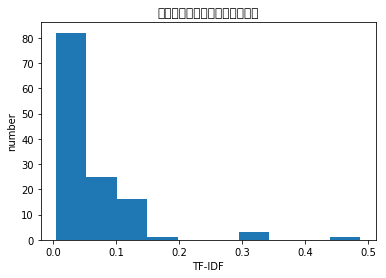

[('关注', 0.5971890601779843), ('网上', 0.3821919766186187), ('了解', 0.31205968166653797), ('好玩', 0.3028367570040533), ('去过', 0.24324058861534956), ('想', 0.21694508353841485), ('时间', 0.1908103769043156), ('什么', 0.16414543923164612), ('看看', 0.15165632663559558), ('会', 0.1470603163759467), ('没', 0.14555841843876838), ('里面', 0.13407473186102992), ('多', 0.12776793251954768), ('时候', 0.12331022123373596), ('有', 0.09292424333960793), ('可以', 0.07144319125580754), ('也', 0.06327696308856867), ('去', 0.059501442687965096), ('在', 0.04004203439102907), ('的', 0.013276993193797118), ('。', 0.012496333615507161), ('，', 0.008985142178723118)]
defaultdict(<class 'float'>, {'。': 0.012496333615507161, '也': 0.06327696308856867, '会': 0.1470603163759467, '去': 0.059501442687965096, '可以': 0.07144319125580754, '在': 0.04004203439102907, '多': 0.12776793251954768, '想': 0.21694508353841485, '时候': 0.12331022123373596, '有': 0.09292424333960793, '的': 0.013276993193797118, '看看': 0.15165632663559558, '里面': 0.13407473186102992,

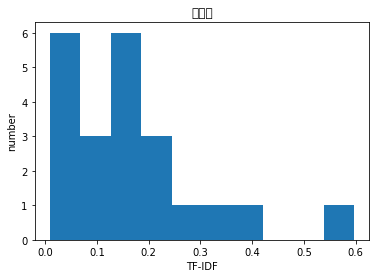

[('偕', 0.5082694278154203), ('淡水', 0.4414989261156484), ('马偕街', 0.33438613788580196), ('真理', 0.24894182647860869), ('马', 0.21156536045493307), ('礼拜堂', 0.11369211962417308), ('街', 0.10583393900661855), ('教堂', 0.09366709106968168), ('中正路', 0.09240230134647606), ('淡江', 0.09240230134647606), ('红砖', 0.0877419288773075), ('老街', 0.08562189775419991), ('新北市', 0.08061490001188085), ('红砖墙', 0.07886791380781405), ('=', 0.07772971530274916), ('白宫', 0.0771501313825643), ('大学', 0.07479046223121913), ('这条', 0.0734428768341632), ('重在', 0.07026108606720252), ('馬', 0.0699510889213594), ('博士', 0.06945047092591215), ('國民小學', 0.06608313609149194), ('這開始', 0.06608313609149194), ('马谐', 0.06608313609149194), ('黑须', 0.06608313609149194), ('命名', 0.05956817359746932), ('從捷', 0.05901671955622804), ('文创馆', 0.05716631120503728), ('里亮', 0.05573102298096699), ('全暗', 0.053566789974434835), ('~', 0.0533077045785916), ('運站', 0.05270789876180995), ('三岔路', 0.05195030302096413), ('出墙', 0.05195030302096413), ('小街', 0.051567

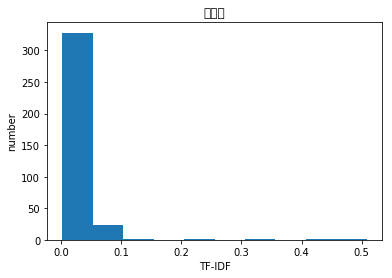

[('孩子', 0.5259310618737296), ('开心', 0.4154378662439632), ('图画', 0.4059941666385044), ('逼真', 0.3598871697938303), ('么', 0.22630673455512273), ('挺', 0.17967837980898507), ('不好', 0.16566189333892303), ('为了', 0.15903157007908159), ('少', 0.1511665076421394), ('点', 0.14254457465936857), ('玩', 0.11848782893858957), ('主要', 0.11518301000442782), ('环境', 0.10812042969460123), ('有点', 0.10440118635324097), ('一般', 0.09627662888945121), ('小', 0.08413070017087894), ('但是', 0.06993539478398414), ('就是', 0.05176190567715217), ('可以', 0.03880806401236646), ('很', 0.02684557322949477), ('了', 0.022031889537272923), ('是', 0.01641747286660107), ('的', 0.010818128208573292), ('，', 0.009761489281282782), ('。', 0.006788029850655178)]
defaultdict(<class 'float'>, {'。': 0.006788029850655178, '一般': 0.09627662888945121, '了': 0.022031889537272923, '但是': 0.06993539478398414, '可以': 0.03880806401236646, '孩子': 0.5259310618737296, '小': 0.08413070017087894, '就是': 0.05176190567715217, '开心': 0.4154378662439632, '很': 0.0268455732

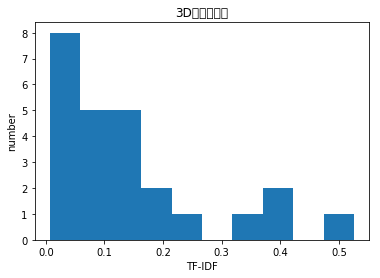

[('岩画', 0.5014846957739195), ('游牧民族', 0.4814640589899015), ('阿尔泰山', 0.29633492133180805), ('变更', 0.257738937116353), ('领地', 0.22991824853541692), ('追溯到', 0.2215763962495976), ('学者', 0.19700762699722618), ('手法', 0.18494269463552837), ('变迁', 0.14653625932010603), ('欣赏', 0.1415111425323785), ('久远', 0.1396023038623541), ('研究', 0.12183764193656599), ('千年', 0.11267261302465147), ('不断', 0.11158340350886699), ('带来', 0.1105016494311058), ('变化', 0.10919668088431818), ('北方', 0.10741250342279862), ('内容', 0.10632309180027241), ('甚至', 0.09911870774776492), ('历史', 0.0975714660116612), ('好好', 0.08509873204574384), ('山', 0.06444492593866338), ('更', 0.052636221723979235), ('应该', 0.04953217107437744), ('而', 0.044312820919506314), ('可以', 0.03335508623618219), ('和', 0.019442741856854684), ('。', 0.008751350787695837), ('的', 0.006198704805201539), ('，', 0.0006991573466685561)]
defaultdict(<class 'float'>, {'。': 0.008751350787695837, '可以': 0.03335508623618219, '和': 0.019442741856854684, '山': 0.064444925938663

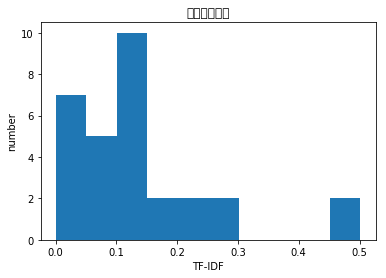

[('西岭雪山', 0.4976843046992425), ('西岭', 0.3462845132367335), ('买空', 0.24136535516597968), ('场镇', 0.19060450616901914), ('大邑', 0.17488037338910506), ('穿镇', 0.1652726946313931), ('山货', 0.15327888622189892), ('卫生', 0.1525440431484646), ('分岔', 0.14631931755136882), ('农家乐', 0.14458763207573236), ('所在地', 0.14409933847424825), ('经由', 0.1420662638903899), ('小镇', 0.13787876956336628), ('WIFI', 0.12974111312243378), ('直达车', 0.11642613585618493), ('镇', 0.11308901066674547), ('拉客', 0.10093989625880297), ('砍价', 0.09990956787669933), ('热水', 0.09968116467277781), ('吃点', 0.09696780152871498), ('环山', 0.09293892514364634), ('依山傍水', 0.09262768672043432), ('镇上', 0.08831098016912241), ('汽车站', 0.08450207965276058), ('四面', 0.08425436181783771), ('几家', 0.08396028025865118), ('大街', 0.08267781124978556), ('成都', 0.08242438459589739), ('小溪', 0.08199256408613644), ('仅仅', 0.0787811113031471), ('基本', 0.07799247767181197), ('餐馆', 0.07711185603675993), ('前后', 0.0762182101600467), ('菜', 0.07556381750218882), ('山里', 0.074

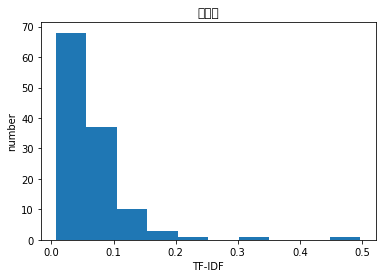

[('渔', 0.5143801947529707), ('寮', 0.4598902273652953), ('苍南', 0.31404894228833113), ('沙滩', 0.2010108818189044), ('马站', 0.14843449531899905), ('温州', 0.14353959068742167), ('晕车', 0.1283674995122247), ('桑美', 0.08639516289838932), ('心存侥幸', 0.0809552242961115), ('煞白', 0.07965718626177734), ('苍南县', 0.07851223557208278), ('最平', 0.0774880422797573), ('浮漂', 0.0774880422797573), ('灵溪', 0.0774880422797573), ('小凉', 0.07656154674927841), ('淡菜', 0.07656154674927841), ('乡土味', 0.07571572259862408), ('姐弟', 0.07421724765949952), ('沙难', 0.07354657861660403), ('平阳', 0.07291920962516536), ('没涂', 0.07291920962516536), ('大陆架', 0.07232988704424888), ('台风', 0.07193877407694929), ('贴', 0.07108872869738009), ('冰凉凉', 0.06982357011266643), ('干净', 0.06923583845854342), ('海挺', 0.06680860197999204), ('特别喜爱', 0.06680860197999204), ('那双', 0.06680860197999204), ('—', 0.06585121443826215), ('海鲜', 0.06544378899209062), ('脚感', 0.0653101270408675), ('海滩', 0.06466258705588838), ('我妹', 0.06308559347605446), ('浅水区', 0.06127652

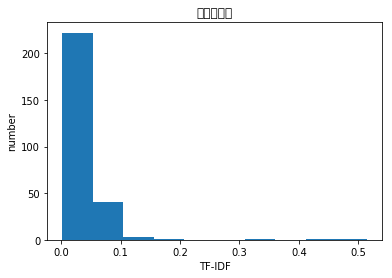

[('京杭大运河', 0.6828056578979377), ('运河', 0.38126162216333565), ('乌镇', 0.27003502637286037), ('大运河', 0.23375517385421737), ('白莲', 0.17902416395192053), ('西栅', 0.16041516844361486), ('开凿', 0.06600608272785725), ('伟大工程', 0.060517000160153635), ('塔', 0.05971296857007508), ('里程', 0.05455110290223404), ('隋朝', 0.054436086729350575), ('古代', 0.052930218247890085), ('隋炀帝', 0.05206120336838592), ('历史', 0.05140929293864025), ('杭州', 0.0503332435521402), ('船', 0.04817096997693159), ('工程', 0.04793070963626588), ('一条', 0.04782746618682391), (' ', 0.047614913701872964), ('河', 0.04511126355199583), ('最长', 0.04337381625341985), ('看到', 0.04321971307935672), ('中国', 0.04292836852667384), ('往来', 0.0424135064875701), ('伟大', 0.04174308886878527), ('南北', 0.041598571183072024), ('西栅走', 0.04114381896558566), ('塔寺', 0.03991881136269294), ('塔上', 0.03915971870210345), ('航运', 0.03794071293524046), ('1797', 0.03793500400846637), ('京杭', 0.03793500400846637), ('船只', 0.03745508974011631), ('通航', 0.03737054275188302), ('经济'

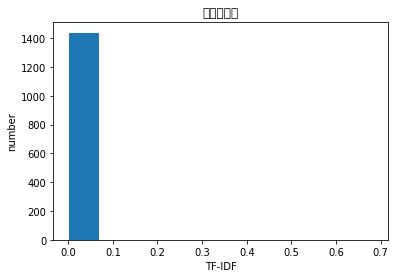

[('封寺', 0.7961191701292927), ('祝融峰', 0.20615345124382675), ('南岳', 0.16257737526611993), ('『', 0.15829662311024492), ('』', 0.15829662311024492), ('衡山', 0.119755351414133), ('住宿', 0.10821441702085016), ('下旨', 0.10583550877974596), ('隋炀帝', 0.09743272754239891), ('寺', 0.09070282934004696), ('改观', 0.07958793417268349), ('光天观', 0.07417618415769696), ('1987', 0.07273963903980152), ('高台', 0.06970303328170956), ('斋饭', 0.06862404657487091), ('寺庙', 0.06737492348484685), ('叫光', 0.06624436001531618), ('周公在', 0.06624436001531618), ('天观', 0.06624436001531618), ('开云亭', 0.06624436001531618), ('所请', 0.06624436001531618), ('杀贼', 0.06624436001531618), ('第二十二', 0.06624436001531618), ('祝融殿', 0.06416733645464807), ('佛寺', 0.06227715041844871), ('上', 0.0622581840536113), ('天台宗', 0.0551225663745329), ('道教', 0.05386014663236686), ('俗家', 0.05330811202141097), ('学佛', 0.05330811202141097), ('605', 0.05185929820114622), ('618', 0.05185929820114622), ('寺僧', 0.051231088460742855), ('观日台', 0.05065319151957885), ('笃信', 

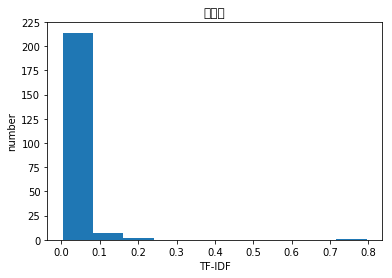

[('龙脊', 0.47443476952814595), ('茶园', 0.39961263801074703), ('茶树', 0.310534559042405), ('茶', 0.26431384562635046), ('龙胜', 0.19595784130067714), ('培植', 0.19156263012110553), ('种植园', 0.19156263012110553), ('制作', 0.1863643158336504), ('采茶', 0.17262582170596763), ('村民', 0.16711059809166134), ('原料', 0.16339386384085375), ('向往', 0.1584045476646573), ('品茶', 0.12828773588260461), ('茶叶', 0.1221743884448633), ('清香', 0.11971135278069947), ('梯田', 0.11945036757529537), ('采摘', 0.11579773416162585), ('优势', 0.10631040503259358), ('800', 0.10339247916297871), ('工艺', 0.09829283492193948), ('生长', 0.08975216181394219), ('欢迎', 0.08821298643242864), ('家里', 0.08462640276626031), ('美女', 0.08396395331254691), ('高山', 0.08125323210773418), ('在于', 0.07820664850143298), ('非常适合', 0.07590210053650741), ('海拔', 0.06928703782874022), ('风景区', 0.05800338963358132), ('打', 0.05687440206617756), ('特点', 0.05627306305425362), ('进', 0.04992345089186766), ('他们', 0.04721572025513175), ('出', 0.04602910862119332), ('自然', 0.04476662

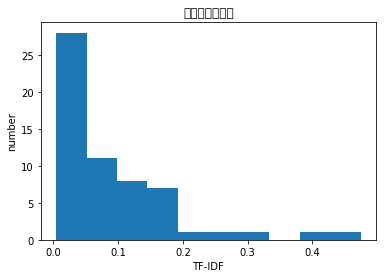

[('刘永福', 0.6489550838350737), ('钦州', 0.27188138705971465), ('故居', 0.23597532583392472), ('福哥', 0.20014727008472008), ('坭', 0.14873549111762627), ('永福', 0.13594069352985733), ('书房', 0.09920034954859906), ('三宣堂', 0.09332199512178896), ('身份证', 0.0899435856480568), ('兴陶', 0.08937253894988292), ('刘将军', 0.08937253894988292), ('黑旗军', 0.08657035520121788), ('分房', 0.08262089902931184), ('陶作坊', 0.08262089902931184), ('主房', 0.08111938547938422), ('学做', 0.0798187152806468), ('头领', 0.0786714428574058), ('抗法', 0.0786714428574058), ('草莽', 0.0786714428574058), ('登记', 0.0786177515144407), ('马房', 0.0776451727036519), ('军事化', 0.07508959851769186), ('跑上跑下', 0.07508959851769186), ('谷仓', 0.07436774555881313), ('这位', 0.07329121136222659), ('杰出贡献', 0.0713931580629021), ('侵略军', 0.06996515850291157), ('佣人', 0.06953217355666892), ('英雄', 0.06865108518420426), ('练兵场', 0.06797034676492866), ('信息', 0.06743519282170808), ('身份证号', 0.06631543543950465), ('各一', 0.06601570233100552), ('周转', 0.06414189286250975), ('炮楼', 0

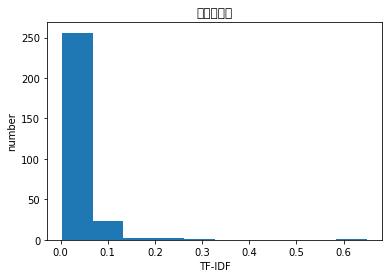

[('普渡寺', 0.6194980637332865), ('普度', 0.3164202359392291), ('外八庙', 0.29183776442373427), ('多尔衮', 0.21287044171557856), ('东城区', 0.15919063961888333), ('洪庆宫', 0.14322552563263935), ('大殿', 0.14205362647021033), ('府邸', 0.1303592166405335), ('写错字', 0.12389961274665731), ('前巷', 0.12389961274665731), ('北京', 0.12300285559778022), ('1776', 0.1182471455814057), ('寺碑', 0.1182471455814057), ('乾隆', 0.11362879495346194), ('东苑', 0.11112587914499465), ('故宫', 0.10894495051962898), ('南池子', 0.10746833781632804), ('山门', 0.10217314999285566), ('四十一年', 0.10146292270200365), ('所刻', 0.09535334247534419), ('石刻', 0.09142485009467236), ('明代', 0.08427341080853513), ('南城', 0.08096764326760086), ('满族', 0.0797412970525972), ('窗棂', 0.07945085531104813), ('藏于', 0.07547634205157304), ('紫禁城', 0.07375056408743469), ('皇城', 0.07067803304147799), ('寺', 0.07005461688877017), ('高台', 0.06729419754687047), ('太子', 0.06723423745727164), ('艺术', 0.06707311716278672), ('低矮', 0.059020150761901966), ('清香', 0.058530953222947185), ('专家',

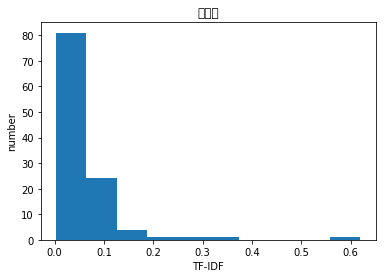

[('白云庵', 0.47242186917256984), ('福山', 0.4705596232947548), ('白云宫', 0.3347169981483035), ('东', 0.2008177488595698), ('环岛', 0.13336612687996366), ('庵', 0.10592174067529442), ('庙里', 0.09757110467506203), ('台子', 0.09482219567991859), ('顺化', 0.08939944216234917), ('好久好久', 0.08541385879788849), ('白云', 0.08429611632113207), ('庙', 0.08053604096791292), ('转山时', 0.07914813945557941), ('孤落', 0.07646373838121184), ('看顾', 0.07646373838121184), ('还结', 0.07646373838121184), ('岘港', 0.07438155514406745), ('很雷人', 0.07438155514406745), ('寺院', 0.07394386557782671), ('岛', 0.06813668261738484), ('小喇叭', 0.06511338593260856), ('险峻', 0.06338859278027818), ('庵堂', 0.06269185119450862), ('东极岛', 0.06168209531923386), ('山泉', 0.06025869155687983), ('安静', 0.06017089619535623), ('小屋', 0.05952644279362532), ('茅草屋', 0.05677304812068318), ('锁门', 0.056358262596560266), ('元宝', 0.053775842185876124), ('几尊', 0.05347318415669438), ('只有', 0.05334216425889733), ('荒山', 0.052091680272192235), ('厌烦', 0.05151088870809804), ('难以形容',

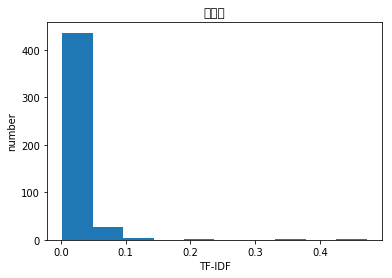

[('创意', 0.28464383614000777), ('新华', 0.25360912260763213), ('位年', 0.21517870194258273), ('汽车连', 0.21517870194258273), ('滕雕', 0.21517870194258273), ('福建省', 0.19508004282617986), ('凤岭', 0.17765176411280734), ('技术学校', 0.1744232040981155), ('园', 0.1698658641303006), ('艺术家', 0.16937271933531386), ('仓山区', 0.1669529388775309), ('理想国', 0.16495674505046407), ('鳌头', 0.1571090969571238), ('\ufeff', 0.15583936379654553), ('艺术化', 0.14861696162007787), ('串门', 0.13791813638480147), ('营房', 0.13499093671734785), ('军区', 0.12977801240585832), ('军营', 0.1226296965563226), ('福州市', 0.12093386571070959), ('园区', 0.11746579921200707), ('国画', 0.10761360073149373), ('好几家', 0.10221358073904754), ('艺术', 0.10076909281764351), ('联合', 0.09945260561700706), ('关着', 0.09650002565050834), ('进行', 0.09490005926209052), ('逐步', 0.09417049561841262), ('设计', 0.09300655438959564), ('仿造', 0.09285123549047129), ('彼此', 0.09236973881864043), ('美术', 0.09236973881864043), ('全新', 0.09219199362637048), ('福建', 0.08268267105332647), ('往来'

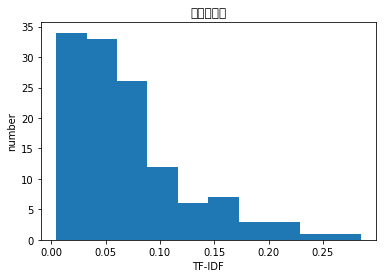

[('明月', 0.4375872718993066), ('古村', 0.3941885474311879), ('太湖', 0.3468290510503192), ('湾', 0.2824765781466333), ('西山', 0.24716065863964545), ('苏州', 0.18162358052722824), ('古村落', 0.16053504657371762), ('古', 0.12895344746812587), ('樟树', 0.12887171528608152), ('村子', 0.08888506589567396), ('码头', 0.0810126951679183), ('西洞庭', 0.07748815281943267), ('村里', 0.07217571430481473), ('1210', 0.07163431771421797), ('村口', 0.07154927490056728), ('一棵', 0.06205676606944096), ('古树', 0.055650588392617446), ('小村子', 0.05434519739762643), ('村落', 0.053006499223738984), ('花果', 0.05218829841536728), ('50', 0.05112339031805262), ('桔子', 0.05100796704045239), ('春秋时期', 0.050417145850690674), ('村民', 0.0494976653282157), ('石板路', 0.04936934552689052), ('古屋', 0.04626437744006554), ('若', 0.043662181562930516), ('一隐', 0.043383130973301536), ('凌如焕称', 0.043383130973301536), ('小筑物', 0.043383130973301536), ('屋山', 0.043383130973301536), ('托腮望', 0.043383130973301536), ('村墟', 0.043383130973301536), ('篱落', 0.043383130973301536),

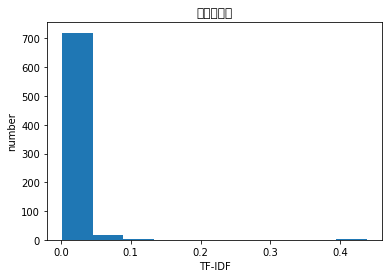

[('乌龟', 0.48173093065368433), ('绿葱葱', 0.32825817706478727), ('龟山', 0.30877720860097435), ('兴隆', 0.3053857300715231), ('华侨', 0.2704142179242011), ('农场', 0.260770053113878), ('惟妙惟肖', 0.21447481365481214), ('神', 0.1887310643450476), ('远看', 0.1842476121767455), ('形象', 0.15804429653004032), ('山峰', 0.15401085304612738), ('绿', 0.14741316858044787), ('遗迹', 0.14462796180030743), ('座', 0.13827484943019228), ('境内', 0.1359161940239037), ('像', 0.13451470365757795), ('这座', 0.11149046622680812), ('形成', 0.10335518352249852), ('样子', 0.09807046860089266), ('由', 0.08434482752403001), ('3', 0.08173381415389988), ('山', 0.0814626568649084), ('一样', 0.0655024076957339), ('一些', 0.05985789905590594), ('就', 0.0457972585926499), ('还有', 0.03911170890606953), ('大', 0.03875576366739674), ('这里', 0.025498694213548112), ('一个', 0.022683294783387542), ('很', 0.014583192795045486), ('在', 0.011815638690200228), ('是', 0.008918385536950492), ('的', 0.007835573634355627), ('，', 0.004418906081174533), ('。', 0.0036874291029058157

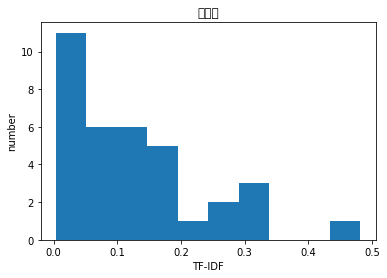

[('扎赉诺尔', 0.5975704940102157), ('猛犸象', 0.41325350492365487), ('矿区', 0.2582602389247821), ('满洲里', 0.2404990121952273), ('扎来', 0.18564564303010608), ('突显出', 0.14443301290172927), ('历史', 0.13946377045566652), ('黑山头', 0.13712855932397844), ('诺尔', 0.1337485213794544), ('启示', 0.13224908029499136), ('展品', 0.13217585474968993), ('展出', 0.12846908763366596), ('值守', 0.12503240644469477), ('博物馆', 0.11558971862428735), ('关于', 0.09674879461563496), ('蒙古', 0.09141702305626091), ('内蒙', 0.08906237328452915), ('族', 0.08726389410994725), ('化石', 0.08710805358001679), ('馆藏', 0.08449055140632424), ('精细', 0.0782090646517584), ('现已', 0.07707480157627272), ('废弃', 0.07591130190061003), ('馆内', 0.07069459514123266), ('好似', 0.06981719850626834), ('了解', 0.06941545915479684), ('无人', 0.0672951115484623), ('回味', 0.06623494488230221), ('一下', 0.0650153526802131), ('路途', 0.06297158250907782), ('让', 0.06144672928684407), ('百年', 0.06068811352466703), ('人文景观', 0.060368159456194975), ('沧桑', 0.05926694408691799), ('详细', 0.058

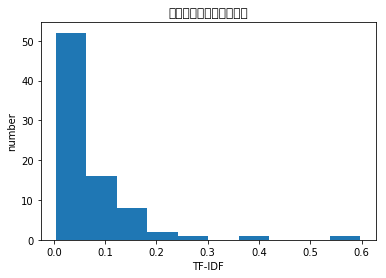

[('八塔', 0.5101259344702311), ('草原', 0.4224817590046889), ('那曲', 0.24400107078875138), ('当雄', 0.20555662744928566), ('塔群', 0.203580566015072), ('青藏公路', 0.17558745066301618), ('夏巴', 0.16437002718333749), ('兀立', 0.15812409402938613), ('白塔', 0.11418987805338336), ('苍茫', 0.11412329967425776), ('悲壮', 0.10700871386125796), ('藏北', 0.10495741881538131), ('祛灾', 0.1021870137156423), ('格萨尔', 0.10085021544162613), ('一组', 0.10015877199196242), ('青藏线', 0.09783298752409321), ('八座', 0.09594860309741583), ('三分之一', 0.09389777186217439), ('在天之灵', 0.0814322264060288), ('出藏', 0.0800080004958942), ('妖孽', 0.0800080004958942), ('路旁', 0.0774644899868582), ('今生今世', 0.07403922199944611), ('纸片', 0.07050501622761443), ('几分', 0.07012468539862023), ('保佑', 0.06504018488811622), ('战马', 0.06473339400644701), ('群中', 0.06025074816643567), ('避难', 0.0598404725545014), ('印有', 0.05964110505276008), ('大将', 0.05906443213781015), ('段', 0.05699853212532207), ('神秘', 0.05620372973809333), ('带上', 0.05607069398876184), ('显眼', 0.05562

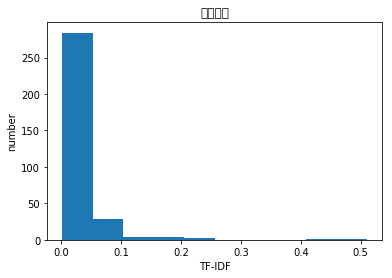

[('印山红', 0.7763795975173035), ('5.1', 0.3752441268396256), ('花期', 0.32399505707584153), ('想想', 0.19527419396456178), ('最佳', 0.17311232962568918), ('大片', 0.16699823864018265), ('天', 0.1455863273277237), ('左右', 0.12121102971554182), ('10', 0.10569140270823738), ('美', 0.08285321826341166), ('都', 0.030169492892010156), ('去', 0.0247166616941248), ('，', 0.0037323921819803155), ('的', 0.0027576049778088485)]
defaultdict(<class 'float'>, {'10': 0.10569140270823738, '去': 0.0247166616941248, '想想': 0.19527419396456178, '的': 0.0027576049778088485, '美': 0.08285321826341166, '都': 0.030169492892010156, '，': 0.0037323921819803155, '天': 0.1455863273277237, '左右': 0.12121102971554182, '最佳': 0.17311232962568918, '大片': 0.16699823864018265, '5.1': 0.3752441268396256, '印山红': 0.7763795975173035, '花期': 0.32399505707584153})
[0.10569140270823738, 0.0247166616941248, 0.19527419396456178, 0.0027576049778088485, 0.08285321826341166, 0.030169492892010156, 0.0037323921819803155, 0.1455863273277237, 0.1212110297155418

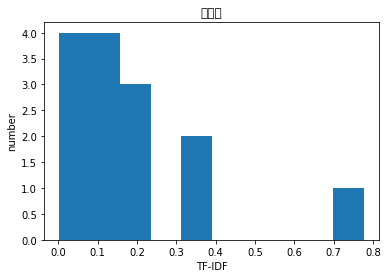

[('猴岛', 0.5427878863414215), ('新村', 0.2604253026763047), ('陵水县', 0.21854545888041169), ('疍', 0.2164445329298599), ('南湾', 0.21279236659232356), ('码头', 0.1812978332692384), ('村镇', 0.14191927308381652), ('渔排', 0.13575397900200462), ('鱼排', 0.12445504824295678), ('港口', 0.12043011014394898), ('水上人家', 0.11949644639308821), ('港', 0.11659324696096471), ('海龟', 0.10051013812690242), ('过海', 0.09922394913534291), ('爽洁', 0.09708685323445289), ('村', 0.09446276927037449), ('渔港', 0.09403717930778714), ('停车场', 0.09128115051020433), ('渡船', 0.09082909440423627), ('粥', 0.0891514087025915), ('仍旧会', 0.08398659013752643), ('佛上', 0.08398659013752643), ('往返', 0.08201613089164145), ('栅栏', 0.08088972596261274), ('渔村', 0.07664412552661612), ('海南', 0.07630828813835482), ('扎寨', 0.07442712104946553), ('渔民', 0.0741439694651928), ('知情', 0.07360487725842162), ('渔获', 0.07284848629347056), ('石斑', 0.0703134339248079), ('加一点', 0.06629835474500732), ('白话', 0.06433619549213676), ('装载', 0.06404540817036072), ('海鲜', 0.063619310

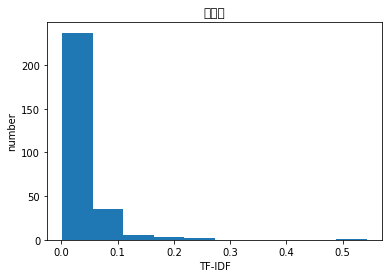

[('通天', 0.6188396183723779), ('峡', 0.405528796475987), ('山西', 0.12588755180472605), ('太行山', 0.12338585997469668), ('索道', 0.10987228224502468), ('长治', 0.09902417738474213), ('挂壁', 0.09318211236065299), ('缆车', 0.09317494047311198), ('潾', 0.08537034336382737), ('峡谷', 0.08418690396460445), ('景区', 0.07719384505716842), ('太行', 0.07353175587942315), ('平顺', 0.0709228725827153), ('、', 0.06897494645431092), ('凌空', 0.06699710663401831), ('仙人', 0.061847625831244854), ('千尺', 0.05844256206820909), ('特点', 0.05687339420438833), ('山顶', 0.05624314956610245), ('红叶', 0.054121070423187194), ('阁', 0.05347596995686713), ('上山', 0.053273204914595106), ('国庆', 0.05130342543478957), ('爬山', 0.05097820674368625), ('天河', 0.050620854487042496), ('亘如', 0.0493432224309069), ('厌则', 0.0493432224309069), ('各时景', 0.0493432224309069), ('喜则', 0.0493432224309069), ('垂玉', 0.0493432224309069), ('峡之行', 0.0493432224309069), ('峡乎', 0.0493432224309069), ('峭峡', 0.0493432224309069), ('峰拔', 0.0493432224309069), ('比绵', 0.04934322243090

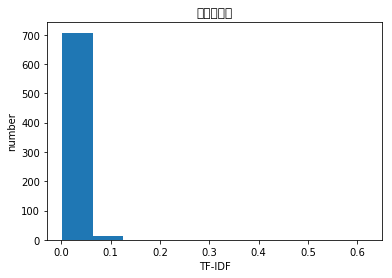

[('雁', 0.4951888649569312), ('山园', 0.4574939580076371), ('桂林', 0.3128943908423643), ('雁山区', 0.231781105190575), ('岭南', 0.15581594958482606), ('雁山', 0.13890777925079204), ('广西', 0.10858939623973422), ('园林', 0.10397411993665949), ('校区', 0.10068053356904183), ('唐岳', 0.09161158662011347), ('坐愚', 0.09161158662011347), ('路称', 0.09161158662011347), ('雁山大', 0.09161158662011347), ('广西艺术学院', 0.08543085335156181), ('接招', 0.08543085335156181), ('抬杠', 0.07925012008301012), ('砸', 0.07901041613017595), ('小姑娘', 0.0743513500908194), ('园', 0.07231980295952277), ('#', 0.07011888039951208), ('戏剧节', 0.06945388962539602), ('方竹', 0.06945388962539602), ('绿梅', 0.06945388962539602), ('读书会', 0.06874015574592884), ('四宝', 0.06535627971537672), ('!', 0.06137238239702057), ('西林', 0.061283404670692564), ('真水', 0.05849798670717478), ('丹桂', 0.058283110930553966), ('真山', 0.058283110930553966), ('绅士', 0.058283110930553966), ('升官发财', 0.05728015451142327), ('用钱', 0.056208838106977084), ('一园', 0.05604216197871948), ('理工大学',

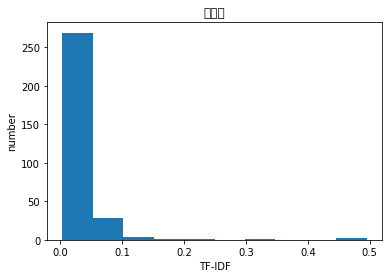

[('茅津', 0.7079739448909735), ('..................', 0.3810013035191112), ('植物', 0.33659648167409834), ('古都', 0.3054961057239321), ('各式各样', 0.22886233946133236), ('好奇', 0.21092489333191147), ('没见', 0.20092179283269468), ('过', 0.06946409849187708), ('很多', 0.04229049955895738), ('！', 0.03568714157326575), ('好', 0.03381224902145563), ('很', 0.01872048205560078), ('有', 0.01759966964837595), ('的', 0.007543909503160807), ('，', 0.0011345122177376383)]
defaultdict(<class 'float'>, {'好': 0.03381224902145563, '很': 0.01872048205560078, '很多': 0.04229049955895738, '有': 0.01759966964837595, '的': 0.007543909503160807, '过': 0.06946409849187708, '！': 0.03568714157326575, '，': 0.0011345122177376383, '植物': 0.33659648167409834, '没见': 0.20092179283269468, '..................': 0.3810013035191112, '古都': 0.3054961057239321, '各式各样': 0.22886233946133236, '好奇': 0.21092489333191147, '茅津': 0.7079739448909735})
[0.03381224902145563, 0.01872048205560078, 0.04229049955895738, 0.01759966964837595, 0.007543909503160807,

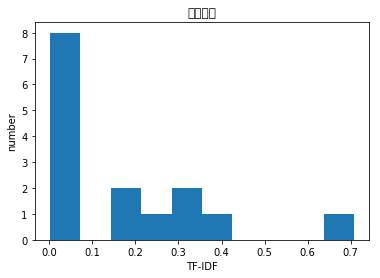

[('苏东坡', 0.5103370856899632), ('中岩', 0.33462040910827223), ('初恋', 0.23815730665531615), ('─', 0.21910766893283323), ('岩寺', 0.2002390922800103), ('青神', 0.17272584522117163), ('青神县', 0.16731020455413612), ('眉山', 0.13067827247784247), ('冥壑', 0.12893821301372904), ('王弗', 0.12023917469157656), ('响石', 0.10873967153502137), ('烤全羊', 0.09473096454603412), ('唤', 0.08711884831856163), ('青峰', 0.08088853588320563), ('岷江', 0.07289080063587797), ('适于', 0.07274736982387985), ('幽静', 0.07123882711254301), ('鱼池', 0.06728410215086071), ('流泉', 0.06532316394029483), ('中岩市', 0.06446910650686452), ('山借', 0.06446910650686452), ('王孚', 0.06446910650686452), ('许', 0.061891600561165654), ('下庙', 0.06011958734578828), ('无仙', 0.06011958734578828), ('恋爱', 0.05905515846529365), ('假到', 0.057575281740390546), ('王佛', 0.057575281740390546), ('退休工人', 0.057575281740390546), ('景区', 0.05673216320476143), ('地于', 0.054369835767510685), ('王夫人', 0.054369835767510685), ('地方', 0.053966353280689036), ('信佛', 0.052954639294510636), ('不

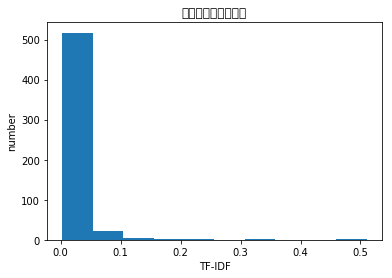

[('乌来', 0.6188018016355916), ('空中缆车', 0.5273197203399692), ('云里雾里', 0.34173463021012357), ('樱花', 0.26526869289377963), ('瀑布', 0.193113926227287), ('下雨', 0.1510575032819834), ('差', 0.14946070733119138), ('季节', 0.14429522583597953), ('想象', 0.12972910091726272), ('一样', 0.08714642961875929), ('虽然', 0.07922443223351675), ('风景', 0.06223265220739628), ('中', 0.061110049630028244), ('时候', 0.04840970987485531), ('我', 0.03978826657781414), ('、', 0.036631190384548824), ('和', 0.03269788683234275), ('不', 0.03220079190723467), ('一个', 0.030178557123340628), ('也', 0.024841569451677238), ('去', 0.02335935779565101), ('有', 0.018240319477993792), ('了', 0.015922967768733892), ('是', 0.0118652960226901), ('的', 0.010424689568982843), ('，', 0.0023516197424911724)]
defaultdict(<class 'float'>, {'、': 0.036631190384548824, '一个': 0.030178557123340628, '一样': 0.08714642961875929, '下雨': 0.1510575032819834, '不': 0.03220079190723467, '中': 0.061110049630028244, '也': 0.024841569451677238, '了': 0.015922967768733892, '去': 0

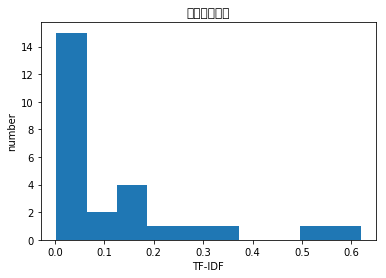

[('机荷', 0.5085160747370878), ('荷坳', 0.5085160747370878), ('烩', 0.33545344691601464), ('铁锅', 0.29823317445758357), ('农庄', 0.23562421040050222), ('服务区', 0.23197043080118168), ('深圳', 0.1845484034788134), ('火', 0.17063038893219373), ('菜', 0.14845949646843648), ('高速', 0.14078559570881147), ('放松', 0.11538448687468038), ('项目', 0.10518748623541059), ('特点', 0.09768661818512638), ('周末', 0.08890901222626282), ('游玩', 0.07549554144835051), ('交通', 0.06638244832914258), ('方便', 0.06104877718841341), ('特色', 0.04785750515187492), ('特别', 0.0434823243233908), ('还有', 0.036062731082863474), ('位于', 0.03528286543966328), ('比较', 0.03358699081255794), ('很多', 0.030375974977021703), ('很', 0.02689270168993636), ('有', 0.02528261100806425), ('地方', 0.023648500141389348), ('一个', 0.020915004297336663), ('在', 0.01089454315791462), ('的', 0.0072247465722954235), ('。', 0.003399973252116854), ('，', 0.0032595419866422127)]
defaultdict(<class 'float'>, {'。': 0.003399973252116854, '一个': 0.020915004297336663, '交通': 0.0663824483

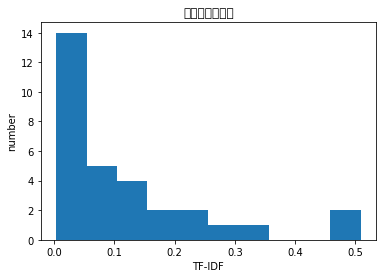

[('八宝山革命公墓', 0.5784666029829914), ('公墓', 0.35278990328172494), ('任弼时', 0.1994759570918715), ('革命先烈', 0.16109156916184292), ('石景山区', 0.1339748150393608), ('伟人', 0.13356737361945106), ('长安街', 0.10857885730732371), ('革命', 0.10803866243088847), ('最著', 0.10420072809267876), ('安葬', 0.10281414556173739), ('建制', 0.10103945709992498), ('火葬场', 0.09745675453855644), ('长眠', 0.09722199784222459), ('八宝山', 0.09645525285344925), ('园林式', 0.09357127927129241), ('火化', 0.09238353799172595), ('规格', 0.08331367194849576), ('骨灰', 0.07818256518184544), ('庄严肃穆', 0.07541342528214581), ('姥爷', 0.07170201381072672), ('安息', 0.06962206103133767), ('清明节', 0.06921202707982947), ('爱国主义', 0.06918615783065832), ('扫墓', 0.06875130339413577), ('归宿', 0.06854276370782493), ('教育', 0.06696507873393627), ('声名', 0.06671785167211645), ('这里', 0.06537678176351704), ('养老送终', 0.06427406699811014), ('县团级', 0.06427406699811014), ('后葬此', 0.06427406699811014), ('宫里太监', 0.06427406699811014), ('斯特朗', 0.06427406699811014), ('汤用彤', 0.064274066

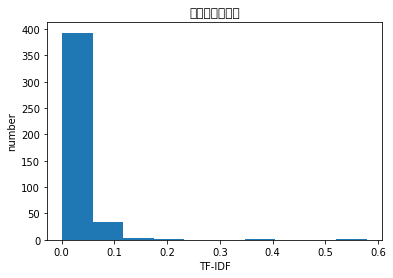

[('朱张', 0.5756760310715684), ('渡口', 0.29039885944912036), ('讲学', 0.2444047294518485), ('湘江', 0.23237157745147596), ('常同舟', 0.21486836155341552), ('涉江', 0.21486836155341552), ('渡学楼', 0.21486836155341552), ('二人', 0.20245525840069678), ('渡人', 0.18120861544822867), ('栻', 0.17739554675898334), ('岳麓书院', 0.13525591305577664), ('古渡', 0.12756532577684013), ('美德', 0.12485324687381677), ('朱熹', 0.1227063403447669), ('往返', 0.12100966697025989), ('张', 0.11826131687729201), ('朱', 0.1173373075922135), ('渡', 0.1066144895308751), ('教学', 0.09873389726821534), ('学子', 0.09358627612373757), ('南宋', 0.08961536535588326), ('`', 0.08363813833464909), ('雅致', 0.07785922371177668), ('设有', 0.0674041364689454), ('后人', 0.06630965339772531), ('渐渐', 0.06475239133744908), ('两岸', 0.060079187456515804), ('亦', 0.05842286241657314), ('东', 0.056261863201858754), ('分别', 0.05572625131104201), ('西', 0.0556537949985274), ('遗址', 0.05396707005607649), ('此地', 0.05220379211661307), ('于', 0.05159605305130726), ('”', 0.051031670454733

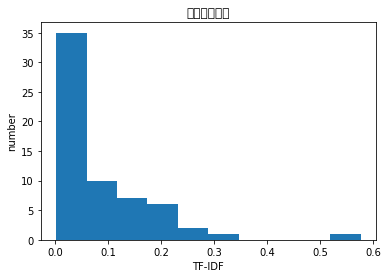

[('大昭寺', 0.8367242718123573), ('广场', 0.237254693021914), ('虔诚', 0.1740953276657942), ('拉萨', 0.15855038190748122), ('朝拜', 0.1550835179776603), ('藏民', 0.1422108059282741), ('八廓街', 0.13417874666631419), ('磕长头', 0.13133014875804566), ('信徒', 0.09224967324356105), ('信仰', 0.0872637508660409), ('长头', 0.08587573443118499), ('磕', 0.08229581636249671), ('八角街', 0.07763909015363406), ('转经', 0.07200883931718462), ('晒太阳', 0.05690112061092976), ('安检', 0.05270167562712542), ('西藏', 0.04664651663347191), ('朝圣者', 0.03940023580667445), ('很多', 0.03911959596265399), ('他们', 0.035961156392685927), ('人', 0.034366754984542155), ('布达拉宫', 0.03388449543058751), (' ', 0.033318051802025045), ('每天', 0.032049775775733834), ('叩拜', 0.030614247285426596), ('力量', 0.029697481632509817), ('朝圣', 0.027919858068727623), ('藏族', 0.027117640748998355), ('艳遇', 0.027098581724056752), ('在', 0.026767607818643), ('着', 0.02645502753369734), ('人们', 0.025819548121457862), ('这里', 0.024331995276185087), ('门前', 0.024096378085586137), ('藏传佛教'

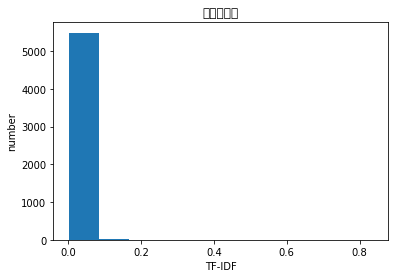

[('西校区', 0.4849715004717715), ('东校区', 0.4514190522787258), ('直通车', 0.36548411262761027), ('北京城', 0.3196610733150374), ('食堂', 0.27442844202739336), ('校区', 0.2472072784406311), ('植物', 0.1604167472374712), ('全', 0.1583884681197876), ('学校', 0.1503774324451926), ('分', 0.14404602687068474), ('面积', 0.11143513670837142), ('体验', 0.10903050676054263), ('周围', 0.10179962811356724), ('两个', 0.09914097539463199), ('最好', 0.09557727331717505), ('据说', 0.08762539022879968), ('吃', 0.08503436704782993), ('很大', 0.07352544059457627), ('一些', 0.07324129411391456), ('过', 0.0662110588585379), ('没', 0.05255486633422851), ('还有', 0.04785654392266231), ('很多', 0.04031001360771325), ('还是', 0.03884370823860351), ('和', 0.030071970813293113), ('就', 0.028018444842697176), ('去', 0.021483404400105016), ('了', 0.014644219195496704), ('在', 0.014457451432507607), ('是', 0.010912412704679195), ('的', 0.007190624322227005), ('，', 0.005406912121168687)]
defaultdict(<class 'float'>, {'一些': 0.07324129411391456, '了': 0.0146442191954967

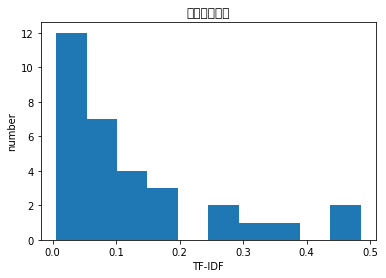

[('观前街', 0.7804211639139568), ('玄妙', 0.4661902847264224), ('观', 0.1936255042864304), ('道观', 0.15880458943768808), ('苏州', 0.11851589172143832), ('三清殿', 0.0934919535545891), ('观前', 0.08145245086797066), ('苏州市', 0.05075872919182452), ('进去', 0.04751940891992736), ('观是', 0.04686245897896797), ('观在', 0.043008173800604205), (' ', 0.03880636600127402), ('弥罗宝阁', 0.03774539582025237), ('香火', 0.03746715038870188), ('西晋', 0.03708620590301466), ('吴道子', 0.036063958476606116), ('主殿', 0.03427343989966447), ('咸宁', 0.03371899203200611), ('张允迪', 0.03235319641735917), ('烧香', 0.0319915830693649), ('276', 0.031767168126554717), ('宋代', 0.03168060412539409), ('题赞', 0.030170432371693624), ('颜真卿', 0.02914649991831804), ('老君', 0.028461626733394862), ('观内', 0.02833128725842458), ('绘像', 0.02798766832602807), ('配殿', 0.02783823652348732), ('道教', 0.02740734882308672), ('"', 0.026885679627787904), ('商业街', 0.02582938046388615), ('摹刻', 0.025433998096754576), ('金店', 0.02512924730852408), ('步行街', 0.024957703757234287), ('

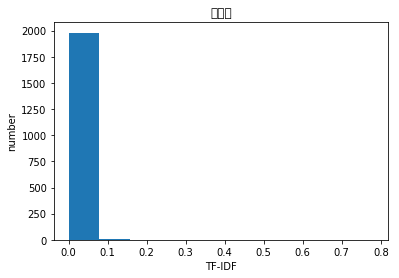

[('情人', 0.4957989943676186), ('奥帆', 0.47234377985722614), ('坝', 0.4631690415734342), ('灯塔', 0.2792512018627883), ('海风', 0.16737167222751703), ('青岛', 0.13030881920579868), ('坝上', 0.11936754473488947), ('吹', 0.11144112803632325), ('帆船', 0.1024407111623948), ('酒吧', 0.10189935745993223), ('中心', 0.09218278117565044), ('晚上', 0.08635074670699677), ('浪漫', 0.08294442576170385), (' ', 0.06639976443301635), ('大海', 0.0646091015162553), ('夜景', 0.06318899297287513), ('~', 0.06275040554814547), ('情侣', 0.058612881548725446), ('酒吧街', 0.056833994011012724), ('堤坝', 0.05380724990543675), ('防波堤', 0.05060570943123256), ('大坝', 0.046857759686302354), ('五四', 0.04480731691661854), ('极限', 0.043159920451303964), ('海边', 0.04156949794146028), ('国旗', 0.04068169010539564), ('尽头', 0.038717517874760604), ('白色', 0.03679563446834684), ('白天', 0.0366092290900932), ('基地', 0.03502573433753844), ('挑战', 0.03447850114051503), ('着', 0.03246117937970805), ('走', 0.03177375621614), ('海景', 0.030163318172729894), ('坐在', 0.02982717118

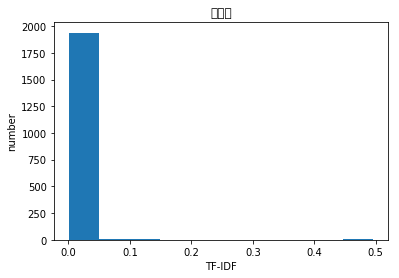

[('黎国', 0.31311643457729643), ('黎都', 0.31311643457729643), ('黎城', 0.29199149574016814), ('长治县', 0.2796341986904201), ('勤俭节约', 0.24974161806591147), ('变少', 0.2014626359742092), ('^', 0.1962907984127466), ('凋落', 0.18636680155452656), ('家乡', 0.16394395012984928), ('习', 0.16186459050614482), ('灯笼', 0.13665671879109692), ('海子', 0.1365636596516203), ('想象力', 0.12257813210480661), ('小吃街', 0.1191389154832334), ('放风筝', 0.11856729550499939), ('规定', 0.1172080697558654), ('概念', 0.11131688416098173), ('后花园', 0.10722191566805123), ('树叶', 0.10652046135561209), ('O', 0.10506487733078787), ('风景线', 0.10289615362276931), ('天地', 0.09775281956823183), ('锻炼身体', 0.09767490684280078), ('欢迎', 0.09429056152328846), ('完全', 0.09199340765015335), ('超出', 0.091902936150992), ('大大的', 0.09064164535342231), ('紧', 0.08880369029303338), ('算是', 0.08475912865323944), ('挨着', 0.08357848381000288), ('公园', 0.08341318575081753), ('河', 0.08099614480761615), ('评价', 0.08013800220240336), ('绿化', 0.07803823516675892), ('你们', 0.077218

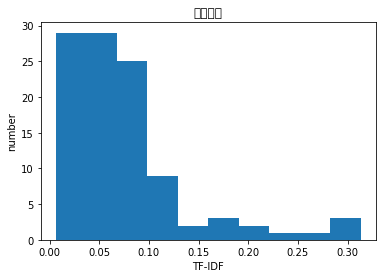

[('植物园', 0.7457331014229006), ('杭州', 0.29754652544528964), ('植物', 0.2356434834718647), ('玉泉', 0.2176373805314089), ('青芝坞', 0.11500202515801745), ('浙大', 0.10326565014499188), ('梅花', 0.09548940467819386), ('灵峰', 0.08877733076640126), ('西湖', 0.076945606509916), ('观赏植物', 0.07567208008778416), ('菊花', 0.07535036160680164), ('284.64', 0.06308098810247273), ('探梅', 0.06292710351467323), ('桂花', 0.06146247694653315), ('植物引种', 0.058438009036490865), ('年辟', 0.05786019260734247), ('竹类', 0.05786019260734247), ('韩美林', 0.05309003419074626), ('科研机构', 0.05263716416154584), (' ', 0.051066225415638405), ('驯化', 0.05022190893867016), ('区', 0.049507449577696386), ('春天', 0.0493914003976517), ('1956', 0.04849641485044206), ('分类', 0.04825102744515472), ('′', 0.04735381812002798), ('灵隐', 0.04507587963550812), ('实验区', 0.04500237202793304), ('里面', 0.044605116568925025), ('、', 0.04318943402558185), ('赏梅', 0.04143192381534317), ('鱼跃', 0.04074650466265301), ('树木', 0.040568062812546914), ('玉古路', 0.04023971280032924), (

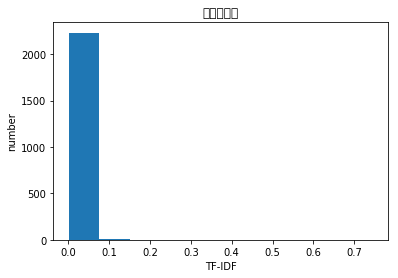

[('张家港', 0.5220767997087066), ('杨舍', 0.44273687478381857), ('杨舍镇', 0.22136843739190928), ('老街', 0.21511523400768218), ('能越', 0.2064334349967529), ('张家港市', 0.1866904357333856), ('办越', 0.16970181788168148), ('街不大', 0.16450558251176847), ('夜景', 0.11165344009022747), ('平静下来', 0.11161516480711495), ('还会来', 0.10699303055439705), ('享用', 0.10525197403493484), ('玩起来', 0.09577416361888626), ('亮灯', 0.09287325732250987), ('戏台', 0.09259807281716578), ('繁忙', 0.09106780209898771), ('碗', 0.08856962648713125), ('时尚', 0.08360795029483403), ('晚餐', 0.08317985699668407), ('东门', 0.08122279130837001), ('服装', 0.07904636924126003), ('冰', 0.07791057778303259), ('聚会', 0.07680537892192682), ('走走', 0.07670556924706028), ('名为', 0.07644061428014658), ('古香古色', 0.07623491673805788), ('近几年', 0.07525933570987221), ('逛街', 0.0750888129688127), ('商铺', 0.07097115696663339), ('不好玩', 0.06963073464264329), ('仿古', 0.06833334201086795), ('十分钟', 0.06805145208491042), ('爽', 0.06617518949515695), ('店铺', 0.06492846990194384), ('很累',

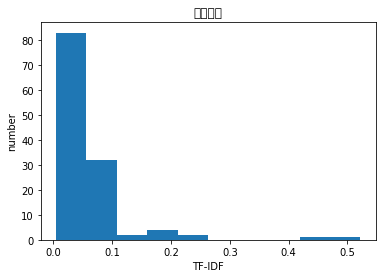

[('延安市', 0.32917582293785064), ('滴翠', 0.28225662623510483), ('三季', 0.26836383826873333), ('延安', 0.2518766173916901), ('高坡', 0.24583277801177783), ('缺水', 0.21784055177861866), ('游园', 0.20940515066846155), ('来临', 0.20556568863676378), ('夏', 0.2048088884706177), ('黄土', 0.20468392716511807), ('山川', 0.203330766544155), ('秋', 0.1977341982492509), ('春', 0.18296707772591553), ('每当', 0.1693766060232157), ('绚丽', 0.16855720562793838), ('后期', 0.15864997564018898), ('森林公园', 0.14400967358724762), ('正式', 0.142249793031246), ('北方', 0.11931634330880737), ('植被', 0.11673251618269143), ('夏季', 0.11522879541889645), ('第一个', 0.10721885484897918), ('爬山', 0.10014174647894443), ('散步', 0.09953340478094168), ('季节', 0.0953092127457287), ('建设', 0.09440903276721499), ('原因', 0.09207018032471222), ('本来', 0.09019313258347045), ('爬', 0.08489355438792927), ('属于', 0.07947546776255249), ('算', 0.07653152466607682), ('风光', 0.07276012248374993), ('、', 0.07258639148863054), ('少', 0.07216236705517587), ('最好', 0.0686428571169444

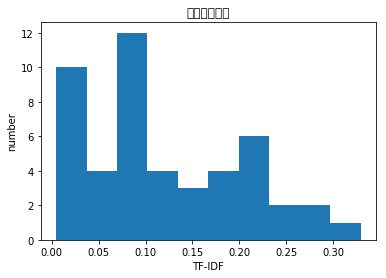

[('灵山', 0.6982082967747036), ('睡美人', 0.17860417062609565), ('上饶县', 0.13259396922191768), ('栈道', 0.09630046472877826), ('上饶', 0.09378419183118615), ('三清山', 0.07940621770130851), ('"', 0.07875290314236559), ('吉等', 0.07423510980354381), ('圣墙', 0.07423510980354381), ('左溪村', 0.07423510980354381), ('玉米秸', 0.07423510980354381), ('胸志', 0.07423510980354381), ('鲽', 0.07423510980354381), ('索道', 0.07084239046127833), ('1496', 0.06922671043196679), ('云碧峰', 0.06922671043196679), ('地下资源', 0.06922671043196679), ('数行', 0.06922671043196679), ('第三十三', 0.06922671043196679), ('重晶石', 0.06922671043196679), ('铌', 0.06922671043196679), ('面沙', 0.06922671043196679), ('冯雪峰', 0.06629698461095884), ('几畦', 0.06629698461095884), ('铁等', 0.06629698461095884), ('花千谷', 0.06421831106038976), ('钽', 0.06260596659226292), ('韩元', 0.06260596659226292), ('山峰', 0.06219121933221541), ('花岗岩', 0.061494410374451663), ('微曦', 0.06128858523938182), ('鄱阳湖畔', 0.06128858523938182), ('好者', 0.060174755176116854), ('石耳', 0.059209911688812754

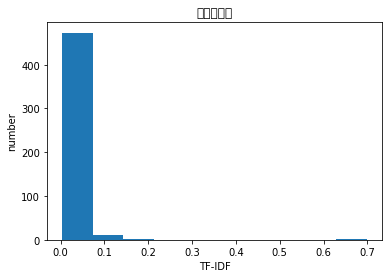

[('樟脚', 0.29430347816941294), ('卵石', 0.2270235199474018), ('油画', 0.16415225038108341), ('岔道', 0.15443216966513448), ('屋时', 0.14715173908470647), ('插建', 0.14715173908470647), ('樟脚村', 0.14715173908470647), ('巷道', 0.14684986456694385), ('石墙', 0.14384839753120396), ('古民居', 0.128798548142704), ('房屋', 0.12695963418119713), ('砌成', 0.12475258476421916), ('红褐', 0.12409999642366981), ('石头', 0.1227569325224268), ('藏青', 0.11417215123682097), ('新屋', 0.10744035833731103), ('美术家', 0.10657204078977572), ('老藤', 0.10657204078977572), ('石巷', 0.10497897236628274), ('岌岌可危', 0.10424430604997212), ('一小撮', 0.10224251629185324), ('村离', 0.10224251629185324), ('般配', 0.09942506366028271), ('村屋', 0.09751251315046217), ('石梁', 0.09582552404276784), ('房子', 0.09471375666007757), ('声称', 0.09361764651301112), ('上下左右', 0.09328062265716965), ('依山', 0.09183070083751803), ('较缓', 0.0914097689832544), ('新房', 0.09028583156921809), ('村落', 0.08989667606477668), ('泉州市', 0.08781022936573951), ('所剩', 0.08630116618609494), ('巷里', 0.

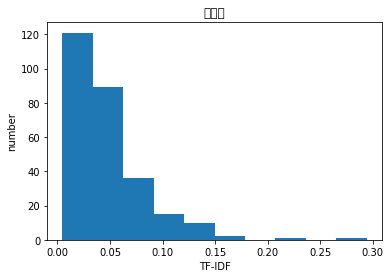

[('黄河', 0.6502225995104793), ('碛', 0.37985924127990395), ('画廊', 0.21209682110635464), ('浮雕', 0.19966685030996306), ('水蚀', 0.18992962063995197), ('壁画', 0.11581960969443257), ('快艇', 0.11553420176383844), ('冲刷', 0.11048635582006637), ('300', 0.10283944526883936), ('黄河水', 0.09940253640273489), ('口', 0.09796154213620979), ('鬼斧神工', 0.0960604769199221), ('口镇', 0.09047662915198648), ('形成', 0.08151880686872022), ('从碛口', 0.07861003789577375), ('包车', 0.0763419696447849), ('汽艇', 0.07157989035845227), ('坐船', 0.06890301368367162), ('沿黄', 0.0680571384675772), ('包船', 0.06503387678891025), ('古镇', 0.057583451891249186), ('抽成', 0.052406691930515836), ('天然', 0.05117952389370904), ('煤老板', 0.050371554472552434), ('大自然', 0.04661030949107792), ('晋陕', 0.04537142564505147), ('还价', 0.042692130474226424), ('吕梁', 0.04267207782163051), ('码头', 0.04144331951286758), ('250', 0.04113663328855776), ('坐', 0.04055211212317836), ('冲蚀', 0.03911687614720424), ('200', 0.038019056665698124), ('船老大', 0.03790312831127107), ('后悔'

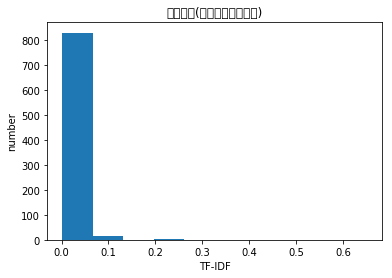

[('龙岗', 0.4605023928427007), ('浙西', 0.21476126311874158), ('漂流', 0.19080259098894575), ('龙井', 0.18831132093116942), ('公社', 0.14725679339253842), ('公路', 0.13585418622797868), ('、', 0.1230453321603788), ('大峡谷', 0.12245611409187526), ('107.8', 0.11736538179885611), ('中胜', 0.11736538179885611), ('包一正', 0.11736538179885611), ('地塔', 0.11736538179885611), ('垫钱', 0.11736538179885611), ('新溪', 0.11736538179885611), ('林川', 0.11736538179885611), ('毛山', 0.11736538179885611), ('沃村', 0.11736538179885611), ('穻', 0.11736538179885611), ('群干', 0.11736538179885611), ('茆里', 0.11736538179885611), ('西坞', 0.11736538179885611), ('许联', 0.11736538179885611), ('上营', 0.10944712444055385), ('东坞', 0.10944712444055385), ('完等', 0.10944712444055385), ('改乡', 0.10944712444055385), ('龙岛', 0.10481524081488766), ('双石', 0.09897975757606547), ('燕岭', 0.09897975757606547), ('农家乐', 0.09834489636763855), ('峡', 0.09645710126751457), ('年置', 0.0951360230299074), ('弟弟', 0.09510047269196722), ('昌城', 0.0936106097239493), ('建镇', 0.09226

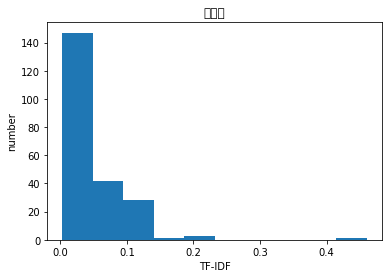

[('盆景', 0.6131615178573229), ('瘦西湖', 0.5753613615378885), ('盆景园', 0.3072951069747343), ('扬州', 0.20536311702763768), ('扬派', 0.13160169939702088), ('扬州市', 0.06424309310929273), ('红桥', 0.06424309310929273), ('园子', 0.06265645286938124), ('西园', 0.057892380836040716), ('曲水', 0.054397844709112075), ('价值连城', 0.05346876234813857), ('—', 0.048581505183760455), ('构思', 0.04653590527486023), ('石洞', 0.046493122086077074), ('艺术', 0.04600593730949481), ('一木一', 0.04249182129748936), ('禊', 0.04142496899511076), ('蜀冈', 0.03981629073301591), ('迷宫', 0.03906707932142404), ('里面', 0.03875998923358681), ('万景', 0.03861475309120026), ('卷', 0.03762962027058152), ('转至', 0.03723934125634933), ('巧妙', 0.03692944861242731), ('屈居', 0.03617248895397074), ('春色满园', 0.03456381069187588), ('盆子', 0.03302062678781807), ('亭桥', 0.032701774434641555), ('很多', 0.03227557942801116), ('古拙', 0.032121546554646364), ('里头', 0.03191393162189417), ('欣赏', 0.03186349658402172), ('龙华', 0.0318558663532774), ('西苑', 0.031728365107409257), ('靠里面

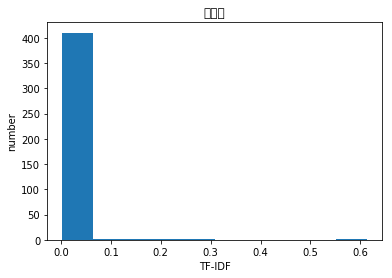

[('楼观', 0.6574292133745577), ('终南山', 0.2654718864602153), ('道教', 0.2496615624976297), ('宗圣宫', 0.13753354340698157), ('授经', 0.13753354340698157), ('高岗筑台', 0.13753354340698157), ('老子', 0.13127709907406324), ('包阔', 0.12825460633538308), ('福地', 0.12391954420413728), ('楼南', 0.12282677610194659), ('台', 0.11406436272118609), ('管径', 0.11354783903034811), ('周至县', 0.1096967321921861), ('天下第一', 0.10452347925220717), ('赵公明', 0.10319739612510674), ('古', 0.09434059258452315), ('求神', 0.09032729584892403), ('仙都', 0.08849062882007176), ('法门寺', 0.08489946561548754), ('曲江', 0.08228493053095787), ('隐士', 0.08165237144787034), ('景区', 0.0806854202833127), ('财神庙', 0.08066031199873192), ('北广场', 0.07806120824328613), ('问道', 0.07510559288636937), ('生硬', 0.07389876931497448), ('圣人', 0.07366993166567834), ('大雁塔', 0.07237343437627186), ('圈地', 0.06824210143224184), ('合适', 0.0677305832345286), ('修养', 0.06772288546245614), ('新建', 0.06560185259331598), ('香炉', 0.06405490974971595), ('道家', 0.06289011659431758), ('楼台', 0.

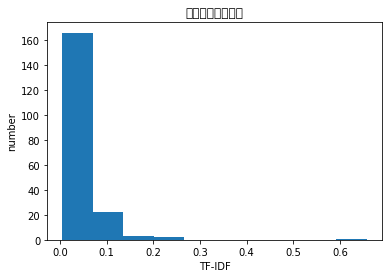

[('余姚', 0.5111269713727075), ('岗', 0.35649277365532867), ('商量', 0.32150673923639134), ('滑雪', 0.31695531805030536), ('蒋宋', 0.27137488237116775), ('奉化', 0.24360945599368444), ('溪口', 0.234556780184836), ('看雪', 0.19658357983054417), ('板块', 0.19634061633843933), ('相距', 0.15230206709509353), ('归', 0.1368577214508513), ('别墅', 0.12424150726670308), ('森林公园', 0.11459545648203688), ('避暑', 0.09843582189224445), ('内有', 0.09491328008453105), ('自然风光', 0.09398281011558693), ('可', 0.08997612738992107), ('冬天', 0.0728022087405175), ('不远', 0.06687822961629412), ('属于', 0.06324247031818564), ('夏天', 0.05668255270005286), ('确实', 0.056164059497464294), ('哦', 0.04625946587483958), ('应该', 0.04378326993576061), ('虽然', 0.04164067764526375), ('适合', 0.04041527305770876), ('不错', 0.03996685830102402), ('景区', 0.037708480760548155), ('风景', 0.03270973027537428), ('个', 0.030910573994140118), ('吧', 0.030560863891383787), ('但', 0.029024872003944362), ('还是', 0.02219919016857121), ('到', 0.020779642886503014), ('和', 0.01718613

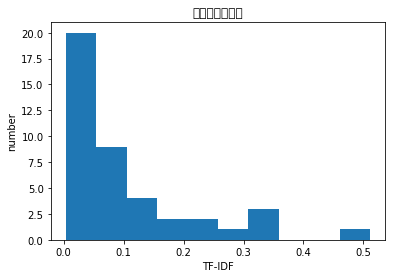

[('涂门', 0.535365691097036), ('清净寺', 0.291231525286271), ('关岳庙', 0.2314219791748049), ('东观西', 0.21562830678769696), ('东鲁巷', 0.21562830678769696), ('祖闾苏', 0.21562830678769696), ('间巷', 0.21562830678769696), ('通淮', 0.20108057217711028), ('泉州市', 0.18014139467440515), ('街', 0.15786724363737714), ('文庙', 0.15688215592139715), ('三十二', 0.14724755721511942), ('、', 0.12487330153329583), ('温陵路', 0.12064834330626617), ('棋盘', 0.11983201990654033), ('世家', 0.1164101532457743), ('厝', 0.11176400847434402), ('1005', 0.10910970784704625), ('孔子', 0.09900190739448106), ('中心地带', 0.08816758468103594), ('泉州', 0.08568838020315396), ('商贸', 0.08467047124091572), ('沿街', 0.06891268692881052), ('遗存', 0.06877276648855626), ('关帝庙', 0.06492728177864081), ('东起', 0.06357037512997862), ('繁荣', 0.06354658666252978), ('台', 0.05961092542494746), ('中山路', 0.05750867570741535), ('园', 0.05674026337609585), ('地段', 0.056071649966320046), ('街道', 0.05413881707811485), ('文化', 0.05391989944783915), ('街上', 0.04869053155138347), ('集', 0.0

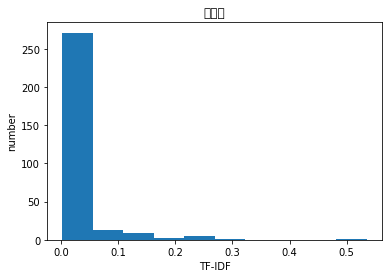

[('云门柏', 0.43395189453620053), ('槐底', 0.43395189453620053), ('虎窟', 0.43395189453620053), ('山观', 0.2875653396000341), ('山路', 0.19741262682332633), ('简易', 0.19070606896344097), ('戏台', 0.18152140206993567), ('顺', 0.1768572953125773), ('泉', 0.17112127839644767), ('见', 0.1701739765513309), ('三座', 0.16533474204487458), ('向上', 0.1444806617777486), ('石刻', 0.13850180242323365), ('石碑', 0.1346559490062276), ('两侧', 0.10905063155990868), ('台阶', 0.10656145746969471), ('再', 0.09837267838408106), ('上山', 0.09370287168850751), ('山上', 0.07296040874500145), ('就', 0.07207061066101983), ('看见', 0.06923328045318039), ('上面', 0.06657023356027761), ('可以', 0.04976361166708947), ('后', 0.04475899817787988), ('过', 0.04257794705628808), ('上', 0.026016298923240852), ('和', 0.019338201249767917), ('有', 0.010787699239835944), ('在', 0.00929706626467563), ('的', 0.004624031498236028), ('。', 0.0029014320439945535), ('，', 0.002086194258197728)]
defaultdict(<class 'float'>, {'。': 0.0029014320439945535, '上': 0.02601629892324085

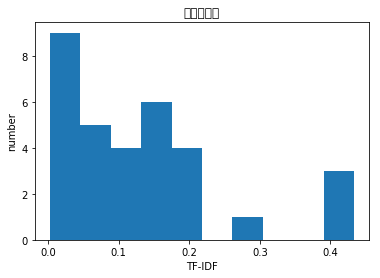

[('深圳湾', 0.30790922929353975), ('公园', 0.26973506576327594), ('Jusco', 0.2531328869412045), ('东滨路', 0.2531328869412045), ('38000', 0.22606482504680675), ('某晚', 0.21897679569982578), ('骑行', 0.2147194805467982), ('社区', 0.21381304040991048), ('肿么样', 0.20518875150883795), ('发神经', 0.1899366086181801), ('街道办', 0.1881107058881486), ('南山区', 0.1562589481710609), ('招商', 0.14917091882407998), ('婚庆', 0.14455832377043182), ('深圳市', 0.13800180619707456), ('买菜', 0.13173318197256095), ('海滨公园', 0.13137866633501255), ('骑', 0.12738054885869537), ('绿化带', 0.12518667797858354), ('尿', 0.11438877254977103), ('豪宅', 0.11343602632883794), ('条路', 0.09853271678517628), ('工业', 0.09744354887729514), ('准确', 0.09479441838011897), ('海滨', 0.09328665695179267), ('住宅', 0.09200787565538102), ('深圳', 0.09186586712550814), ('夜', 0.09099639046283954), ('自从', 0.08909006952315016), ('办', 0.08353530164322243), ('神马', 0.08281388318055168), ('算不上', 0.0824247195247254), ('公共', 0.082352430734311), ('卡', 0.08216069115399753), ('吓', 0.08

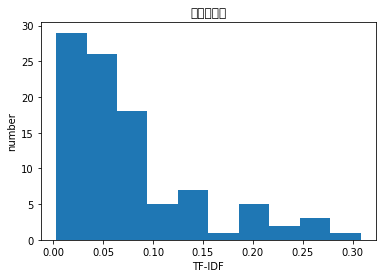

[('华山', 0.549252941473329), ('五里', 0.5347656782372543), ('第一关', 0.4215267230288454), ('关', 0.22497614204181302), ('从玉泉', 0.13118973964906683), ('关口', 0.10423472207738366), ('万夫莫开', 0.09910768218863479), ('天险', 0.08370467679498934), ('爬', 0.08358859521670577), ('院', 0.06898838601120733), ('一夫当关', 0.06813653150468643), ('第一个', 0.06535330138033747), ('开始', 0.06509334555109857), ('走', 0.05558175579329029), ('玉泉', 0.04989091760103274), ('爬山', 0.04930119825394339), ('上山', 0.04661396561843293), ('登山', 0.04535876542338034), ('当关', 0.04531126645307867), ('到', 0.043465403362285764), ('坡路', 0.04343229965683883), ('路', 0.04182217247673599), ('峪', 0.040848464812645875), ('入关', 0.040173343800726714), ('绝岭', 0.039315214910868326), ('刚刚开始', 0.038753316635663636), ('险关', 0.038190085733373486), ('院到', 0.0368397018372716), ('这里', 0.035721124945067864), ('必经之路', 0.034856291608013325), ('此据险', 0.03408571380575933), ('西依绝', 0.03408571380575933), ('关是', 0.033468303632595696), ('后面', 0.03287770517969512), (' 

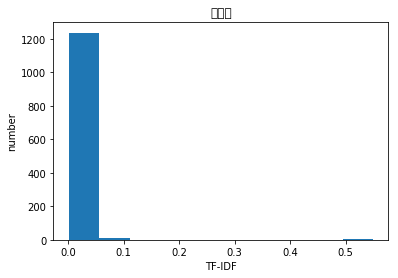

[('淮南', 0.8831776834416445), ('凉爽', 0.31885898993864364), ('秋天', 0.29941961446956283), ('风景', 0.10714182751647183), ('还是', 0.07271419800844563), ('很', 0.0668060336410171), ('不错', 0.0654563978732562), ('可以', 0.048287529712802695), ('在', 0.027063893583570964), ('。', 0.008446110401190204), ('的', 0.0044868740608647005), ('，', 0.002024313828009843)]
defaultdict(<class 'float'>, {'。': 0.008446110401190204, '不错': 0.0654563978732562, '可以': 0.048287529712802695, '在': 0.027063893583570964, '很': 0.0668060336410171, '的': 0.0044868740608647005, '还是': 0.07271419800844563, '，': 0.002024313828009843, '风景': 0.10714182751647183, '凉爽': 0.31885898993864364, '秋天': 0.29941961446956283, '淮南': 0.8831776834416445})
[0.008446110401190204, 0.0654563978732562, 0.048287529712802695, 0.027063893583570964, 0.0668060336410171, 0.0044868740608647005, 0.07271419800844563, 0.002024313828009843, 0.10714182751647183, 0.31885898993864364, 0.29941961446956283, 0.8831776834416445]


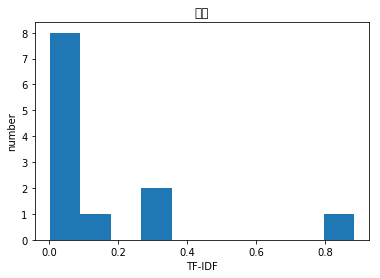

[('百魔洞', 0.7745724872975276), ('天坑', 0.21049520978380834), ('巴马', 0.20505507648707044), ('百魔', 0.1611734326832181), ('洞', 0.151968598457413), ('养生', 0.11886998317415481), ('磁疗', 0.11733949338920496), ('负氧离子', 0.11500199032890765), ('钟乳石', 0.10923727714994257), ('溶洞', 0.10194421561736532), ('候鸟', 0.09448989733587941), ('吸氧', 0.08102684776050376), ('空气', 0.0709545372671542), ('洞里', 0.0662328673001105), ('洞内', 0.06526266269765585), ('地磁', 0.06487239445696182), ('县甲', 0.05972238012959725), ('洞口', 0.05857516510057484), ('磁场', 0.0584127307521424), ('长寿', 0.058192440696038523), ('阳河', 0.05741542141637973), ('乡坡', 0.055693107028207164), ('崖', 0.05003691097901185), ('河池市', 0.04930686025733944), ('瑶族', 0.048474675937164924), ('负离子', 0.04338312234497016), ('含量', 0.04235221966056588), ('石灰岩', 0.04144085190425841), ('篆', 0.03995117784124786), ('泉水', 0.03944130286081116), ('洞天', 0.03928460014457331), ('洞中', 0.03921474377359043), ('居住', 0.03773227002062594), ('人', 0.03508355732856138), ('适宜', 0.03436

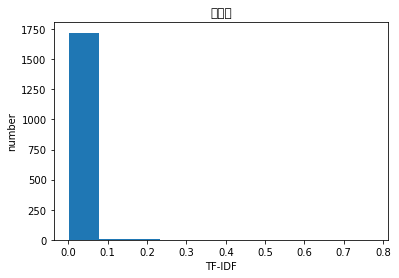

[('玩', 0.4804880429714677), ('小朋友', 0.4666568809510431), ('周末', 0.3599091396302382), ('经常', 0.35427749820219395), ('好多', 0.2893432897729006), ('一起', 0.27076706226475433), ('过去', 0.2568847227677316), ('带', 0.25057802371670673), ('人', 0.1024793315522425)]
defaultdict(<class 'float'>, {'一起': 0.27076706226475433, '人': 0.1024793315522425, '周末': 0.3599091396302382, '好多': 0.2893432897729006, '带': 0.25057802371670673, '玩': 0.4804880429714677, '经常': 0.35427749820219395, '过去': 0.2568847227677316, '小朋友': 0.4666568809510431})
[0.27076706226475433, 0.1024793315522425, 0.3599091396302382, 0.2893432897729006, 0.25057802371670673, 0.4804880429714677, 0.35427749820219395, 0.2568847227677316, 0.4666568809510431]


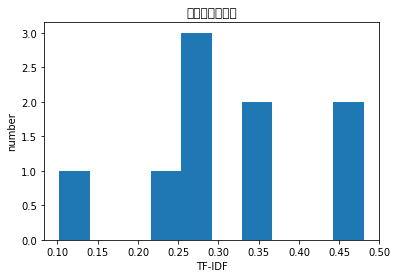

[('九个', 0.30370902390805266), ('龙头', 0.28426804180467363), ('出水口', 0.2431489772796553), ('山东省', 0.20480121784921163), ('为泰沂', 0.20287635261500298), ('平邑县', 0.20287635261500298), ('龙潭', 0.19440408656542313), ('之亚', 0.19429047463496787), ('平邑', 0.19429047463496787), ('龟蒙顶', 0.19429047463496787), ('因其状', 0.18819869726196714), ('龟蒙', 0.18819869726196714), ('1125', 0.183473547636751), ('东蒙', 0.183473547636751), ('1156', 0.17634861996842854), ('625', 0.1667776629522857), ('伏卧', 0.1588433865558955), ('临沂市', 0.15634928594886116), ('九', 0.1554259681782215), ('岱宗', 0.1530850866353576), ('得名', 0.1501094236721088), ('蒙山', 0.14351412961921478), ('平方公里', 0.12910337567606456), ('神龟', 0.11982707455658236), ('冻住', 0.11900462630406985), ('分支', 0.10422637512959025), ('东山', 0.10123634130268422), ('云端', 0.09691588513617384), ('枯水期', 0.09456438022348274), ('古称', 0.0897503915922465), ('主峰', 0.0767866766160974), ('山脉', 0.07457211290866629), ('高峰', 0.07166428990612918), ('总面积', 0.07111093189014343), ('而', 0.06

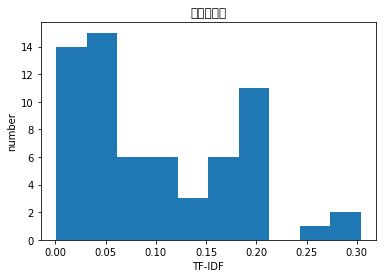

[('大汾', 0.5010293783593204), ('遂川县', 0.44745319397561456), ('挖个', 0.3262713919708878), ('井冈山', 0.2898318791604587), ('回答', 0.21121602167171272), ('老乡', 0.1918281591309384), ('一线', 0.16827719711683783), ('河水', 0.14966734320542427), ('沙滩', 0.144060466589081), ('隔', 0.13745575878077837), ('洞', 0.13562885301857266), ('却是', 0.1189298388927607), ('热', 0.11525246179116706), ('热情', 0.11304891010546148), ('冷', 0.11095701517650729), ('问', 0.10725179900604452), ('道路', 0.10694908453536361), ('神奇', 0.10664823753165817), ('不知', 0.10649850715723706), ('目前', 0.0946630291063024), ('随便', 0.09404534641547595), ('沿着', 0.08699497813898854), ('水', 0.07795524258424227), ('开发', 0.0749522457376105), ('完全', 0.07360105500424263), ('之', 0.06671644567157273), ('出来', 0.06661076036484041), ('路', 0.05763265989454677), ('而', 0.05088731850582839), ('你', 0.048572416058210485), ('会', 0.039422747755292725), ('没', 0.03902013102638394), ('景点', 0.03839091685853215), ('位于', 0.03476340870268411), ('比较', 0.033092501818111714), 

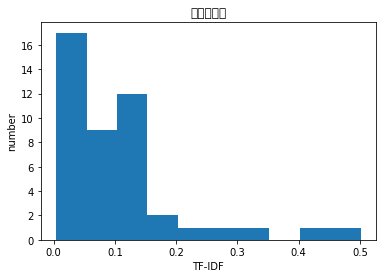

[('孟孝', 0.6241680234216228), ('琚', 0.6241680234216228), ('............', 0.32159508881946564), ('碑', 0.22494346010441965), ('很快', 0.1631379424914665), ('下雨', 0.13779526002372444), ('好看', 0.09455865465786015), ('什么', 0.0587833320379172), ('走', 0.05549658858973656), ('我们', 0.050203340612562666), ('没有', 0.036412902843701404), ('还', 0.03288763167619989), ('就', 0.027790336008114293), ('的', 0.004754721806645689), ('，', 0.0021451569558156693)]
defaultdict(<class 'float'>, {'下雨': 0.13779526002372444, '好看': 0.09455865465786015, '就': 0.027790336008114293, '我们': 0.050203340612562666, '没有': 0.036412902843701404, '的': 0.004754721806645689, '走': 0.05549658858973656, '还': 0.03288763167619989, '，': 0.0021451569558156693, '什么': 0.0587833320379172, '很快': 0.1631379424914665, '碑': 0.22494346010441965, '............': 0.32159508881946564, '孟孝': 0.6241680234216228, '琚': 0.6241680234216228})
[0.13779526002372444, 0.09455865465786015, 0.027790336008114293, 0.050203340612562666, 0.036412902843701404, 0.0047547

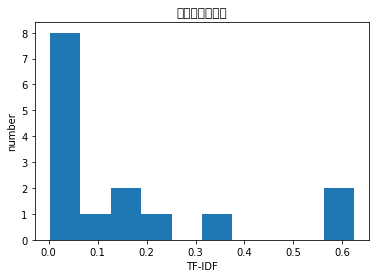

[('菩萨', 0.3402944339591536), ('宋太祖', 0.23996252756025108), ('赵匡胤', 0.23996252756025108), ('大悲', 0.1991481995376378), ('铜铸', 0.1991481995376378), ('隆兴寺', 0.1731225721436926), ('正定', 0.1476776566424005), ('千眼', 0.14566074641152715), ('阁内', 0.14518335420734502), ('千手', 0.14380867319655488), ('千手观音', 0.13476332438920527), ('"', 0.12357083368072899), ('手臂', 0.11845700782864439), ('铸造', 0.11677658790988019), ('分持', 0.1164819840383705), ('原铸', 0.1164819840383705), ('双铜', 0.1164819840383705), ('各臂', 0.1164819840383705), ('好几丈', 0.1164819840383705), ('4o', 0.10862332662947462), ('柴荣', 0.10402630673925604), ('铸钱', 0.10402630673925604), ('周世宗', 0.10076466922057872), ('神态自若', 0.10076466922057872), ('七段', 0.0982347466125604), ('听寺', 0.0982347466125604), ('造于', 0.0982347466125604), ('19.2', 0.09616764933036016), ('两臂', 0.09616764933036016), ('乾隆', 0.09241165233365478), ('开宝', 0.09157062944014158), ('敕令', 0.09157062944014158), ('铁水', 0.09157062944014158), ('僧人', 0.08919446856856872), ('净瓶', 0.0883089

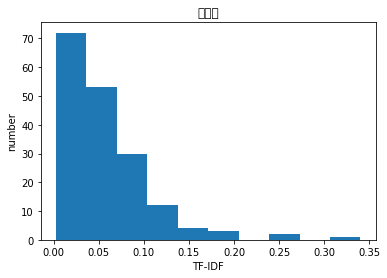

[('骑楼', 0.7563710806740029), ('海口', 0.3957987231012978), ('老街', 0.36204015066436707), ('南洋', 0.16288363192525832), ('海南', 0.11102789947542185), ('建筑', 0.06989855052071263), ('海口市', 0.0650802253985081), ('中山路', 0.05948618065255193), ('小吃', 0.059070353619864964), ('街道', 0.05848935406709628), ('清补凉', 0.049637862845865195), ('历史', 0.042398180965675235), ('吃', 0.042158663004993484), ('小吃街', 0.04054732581984825), ('名街', 0.03962611438927816), ('特色', 0.03941649972758579), ('得胜', 0.0370312586186817), ('老', 0.033096507073560884), ('街', 0.0311849424374197), ('沙路', 0.031025406033473795), ('风格', 0.03045050308015118), (' ', 0.029491617132483338), ('、', 0.02882755008340224), ('味道', 0.02829312808372421), ('文化', 0.028231283954280637), ('建筑风格', 0.02820592766965014), ('华侨', 0.027947983342282344), ('博爱路', 0.026922483796465335), ('洋派', 0.026520039041721885), ('有', 0.025505483702697156), ('巴洛克', 0.025420534108049203), ('很', 0.024705126667716636), ('保留', 0.024538209312531978), ('广州', 0.022248697699289163), (

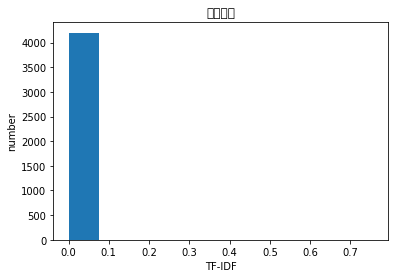

[('酒庄', 0.4614083974709914), ('天漠', 0.3132093052685157), ('好酒', 0.275989924223469), ('官厅水库', 0.26690523981268605), ('品酒', 0.22925805876574035), ('八达岭长城', 0.21629392061077488), ('学了', 0.20953855056763585), ('酿', 0.2045578518410252), ('礼貌', 0.16928156901815533), ('品位', 0.16821829594536739), ('庄园', 0.15286940635403892), ('天蓝', 0.14717489772359127), ('喝酒', 0.14645045106775612), ('身处', 0.12738726752758264), ('霾', 0.12667474877229223), ('国外', 0.1253304740092728), ('温馨', 0.12233873897996264), ('一进', 0.12150184241635785), ('顺道', 0.11954170498657679), ('停下来', 0.11954170498657679), ('晒太阳', 0.11419884684480217), ('发呆', 0.11040784126650575), ('雾', 0.10366751023836236), ('真实', 0.09356035136368636), ('热情', 0.0837975794899543), ('工作人员', 0.08278522536450415), ('像是', 0.07583277634487062), ('全国', 0.0712813878107995), ('特别', 0.06351354404962158), ('一天', 0.06287950469365018), ('原来', 0.060801462038636435), ('空气', 0.05962654307358199), ('安静', 0.05827527153865763), ('近', 0.05781524775666011), ('！', 0.0561621

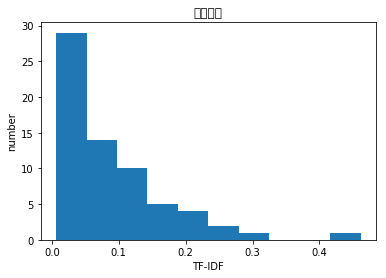

[('清溪', 0.5040245448961478), ('蜀山区', 0.38359513336080386), ('西北边', 0.3206357195868551), ('合肥市', 0.2927858246976941), ('合肥', 0.24139934332297358), ('外景地', 0.22571157064042882), ('标注', 0.20918509255931214), ('公园', 0.19755972269133945), ('新人', 0.17880711808288705), ('遍地', 0.15631782161682026), ('婚纱照', 0.1488082300871623), ('早就', 0.13832699274129112), ('呼吸', 0.12950431071174942), ('垃圾', 0.12784269525018743), ('地图', 0.12508292157951978), ('未', 0.11892329577025615), ('当', 0.090068795372083), ('好去处', 0.08284396672781554), ('空气', 0.0793760802196265), ('休闲', 0.07685806428353455), ('开发', 0.07396048689804817), ('拍', 0.06797513636928608), ('把', 0.06507622944400511), ('知道', 0.05028478249941039), ('！', 0.04984284092465679), ('个', 0.039626117306707224), ('这', 0.038029166837741615), ('但是', 0.03405668758421485), ('多', 0.03379779553522741), ('上', 0.029640275009946544), ('很多', 0.029532746939312907), ('、', 0.024682215282875265), ('人', 0.02461290137722544), ('好', 0.023612125754333323), ('地方', 0.02299202480

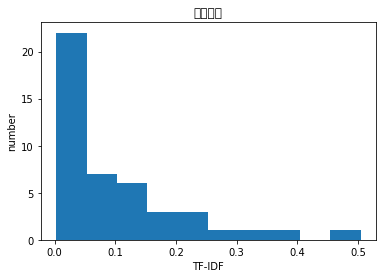

[('昌珠寺', 0.774603821983506), ('唐卡', 0.32699059076416714), ('珍珠', 0.22625759938075313), ('雍布拉康', 0.15798005816673935), ('文成公主', 0.1353159113547392), ('寺庙', 0.1303548182510469), ('西藏', 0.12425195573148672), ('寺', 0.08423466931796432), ('第一座', 0.08314151105123606), ('山南地区', 0.07929619959099976), ('佛堂', 0.07505829121572331), ('松赞干布', 0.06833543564352523), ('乃东', 0.0645503184986255), ('泽当', 0.05867631274749517), ('措巴', 0.05740547078532836), ('之宝', 0.05594264251353165), ('珍宝', 0.05495110608891464), ('山南', 0.05063792152556452), ('三圣寺', 0.04965955313080644), ('喇嘛', 0.049158608352712525), ('’', 0.046410123814381164), ('‘', 0.045361699832545), ('供奉', 0.0423622614548069), ('一件', 0.040521696899156745), ('转经', 0.03999634046644311), ('29026', 0.03827031385688557), ('憩息', 0.038218072453031854), ('泽', 0.038218072453031854), ('莲花生', 0.034528326711401616), ('乃东县', 0.034177984184855174), ('那幅', 0.033911757108192664), ('吐蕃', 0.03366701002007069), ('壁画', 0.032422094214064966), ('大殿', 0.031630982242344334),

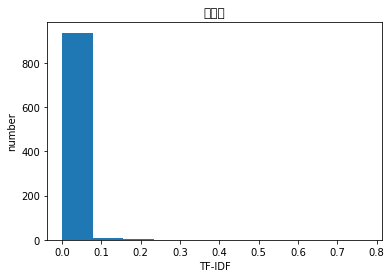

[('西湖', 0.7870212925032714), ('博物馆', 0.29287609122069097), ('西泠印社', 0.16831459931223777), ('王祠', 0.13174486135550864), ('多人多', 0.12293492645698706), ('白堤', 0.11314810034958572), ('世博会', 0.09356891302443981), ('开馆', 0.08241913388687314), ('杭州', 0.08026521762094324), ('南山路', 0.07903693158373279), ('举办', 0.07358834733818519), ('馆内', 0.0644842162352621), ('23889', 0.0632042525524885), ('指览', 0.0632042525524885), ('闭展', 0.0632042525524885), ('介绍', 0.06215994865588653), ('紧邻', 0.059674380584606404), ('平方米', 0.057540153130750005), ('以南', 0.05656267374341723), ('历史', 0.05653873641232024), ('发展中国家', 0.05644568142902447), ('林志炫', 0.05644568142902447), ('画展', 0.05602674369675458), ('F2', 0.054675885325643846), ('了解', 0.0527645414908244), ('标本', 0.05191569384383829), ('卓尔不群', 0.04742489814393413), ('F1', 0.044774757591880245), ('发达国家', 0.044774757591880245), ('外楼', 0.04418841731911794), ('浙江', 0.04381341237034429), ('干预', 0.0436531305887575), ('甄别', 0.043401997084961286), ('必经之地', 0.04242918395371

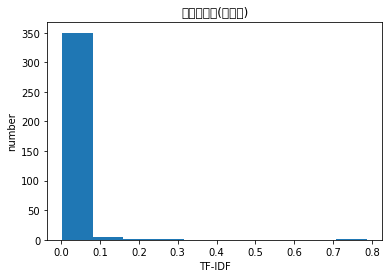

[('镇江', 0.5757076516896734), ('镇远', 0.3871173147218403), ('阁', 0.34188405665453425), ('舞阳', 0.3037337339283228), ('夜景', 0.2506020695697634), ('祝圣桥', 0.22856895501570598), ('晚上', 0.15213796559672182), ('楼阁', 0.09766789763774195), ('白天', 0.08547925556119138), ('灯光', 0.08326781611084284), ('河边', 0.07742581403627873), ('阁楼', 0.07515723082288955), ('河', 0.06732248214139946), (' ', 0.06569591110618227), ('古城', 0.05465779955901595), ('夜晚', 0.05288608610939685), ('古镇', 0.05011274713197101), ('掩面而过', 0.04412688642964908), ('漂亮', 0.039895930129525796), ('舞', 0.037980387764975365), ('点缀', 0.036217732959691176), ('呼应', 0.03615327792385232), ('广场', 0.035458320429809856), ('新', 0.03509677455593933), ('客栈', 0.03379518323272333), ('江边', 0.032237583884911346), ('登阁', 0.03135695592826553), ('灯火辉煌', 0.03072915145553683), ('亮灯', 0.02977866215048762), ('它', 0.029571775251058346), ('建筑', 0.029361876930737513), ('仿古', 0.029213655455758592), ('楼', 0.028799472434766073), ('一座', 0.02869523953379502), ('大桥', 0.0


defaultdict(<class 'float'>, {' ': 0.06569591110618227, '!': 0.005283360834533151, '...': 0.004570948643349297, '10': 0.012883518594986558, '6': 0.00430820937071412, '~': 0.004241268558940066, '…': 0.00608088312613709, '、': 0.007087058738824506, '。': 0.018508261448503347, '一': 0.007609771893941886, '一下': 0.002466625841480416, '一个': 0.013623548977304507, '一些': 0.002567896731474549, '一圈': 0.008007989281135532, '一定': 0.005563341134151962, '一家': 0.004675710745732169, '一座': 0.02869523953379502, '一样': 0.00843013643705521, '一次': 0.006291006653261016, '一眼': 0.005342453472574461, '一般': 0.006730977678659321, '一起': 0.0031120961513977055, '上': 0.02269513954323718, '下': 0.006858518097451615, '下雨': 0.004870864544036019, '不': 0.014536449302836691, '不是': 0.0018648407461521307, '不至于': 0.009456576016842263, '不错': 0.01716339303479679, '个': 0.005688967090790845, '中': 0.003940999520845222, '也': 0.02002547328524769, '了': 0.019510633125184036, '交通': 0.0030885705755564143, '人': 0.007067156484706399, '从': 0.0

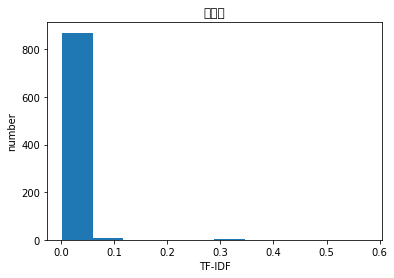

[('双子', 0.5913450901658114), ('伶仃', 0.44547325809672755), ('亭', 0.2719609134968036), ('沙滩', 0.16093010100925415), ('亭子', 0.1464013950427558), ('海水', 0.13102671018764367), ('园道', 0.09920377599743828), ('岛', 0.08840028414363364), ('吹', 0.08421684986991891), ('⋯', 0.08071738295026148), ('铲子', 0.07564622910842052), ('云淡风轻', 0.07088257975981928), ('螃蟹', 0.06872755154722461), ('南区', 0.06499371804188304), ('werargrwaDvsavava', 0.062188939267472675), ('太陽燦爛', 0.062188939267472675), ('张翅', 0.062188939267472675), ('李璐', 0.062188939267472675), ('基本上', 0.06053290681274024), ('海风', 0.05967905075146276), ('手电', 0.05953005789332128), ('其未', 0.0579932555112215), ('曲弯', 0.0579932555112215), ('雙子', 0.0579932555112215), ('一无所求', 0.05379757175497032), ('亭会', 0.05379757175497032), ('挺怡', 0.05379757175497032), ('阻擋', 0.05379757175497032), ('风', 0.05337786538050501), ('来', 0.05286114420095179), ('大海', 0.05276310049916083), ('北翼', 0.05244686327657051), ('收放', 0.0513432540926785), ('石岸', 0.0513432540926785), (

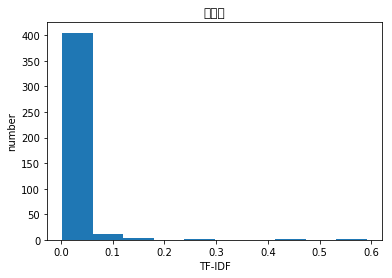

[('历代帝王', 0.6548593114497342), ('庙', 0.29125424640742176), ('帝王', 0.21128249573773603), ('供奉', 0.17780790008999467), ('三皇五帝', 0.16711941901435187), ('祭祀', 0.1411274309679407), ('皇帝', 0.13168194402598804), ('牌位', 0.11460037950370351), ('太庙', 0.11126301197328621), ('历朝历代', 0.10132461235645066), ('关帝庙', 0.0987507101586848), ('关羽', 0.09672566033172107), ('历代', 0.09486377111480938), ('白塔寺', 0.08847606151139238), ('景德门', 0.0786425493782095), ('百家姓', 0.07234701708145883), ('名臣', 0.06781625696914767), ('地位', 0.06725927149931986), ('崇圣', 0.06626246276099881), ('景德', 0.06543167364089991), ('殿', 0.06443334991473033), ('故宫', 0.06414752802921185), ('历史', 0.06286541637580231), ('庙宇', 0.06249008484589632), ('开国功臣', 0.06210346251970757), ('皇家', 0.061713871113307436), ('阜成门', 0.059742059149220116), ('中学', 0.05946708713684176), ('配殿', 0.058050739569901144), ('景德殿', 0.056221442579926194), ('大殿', 0.05576142778033692), ('北京', 0.054318688632407595), ('排位', 0.05272869464406119), ('明代', 0.049620757604399365),

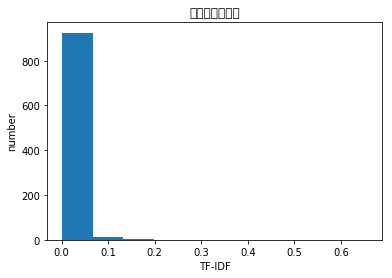

[('王岗', 0.49706260933839297), ('汉墓', 0.2747459158429733), ('吕柯墓', 0.24853130466919648), ('新馆', 0.2341734685539359), ('天煞', 0.2317637127114757), ('对放', 0.2317637127114757), ('熟料', 0.2317637127114757), ('尚', 0.2125562869431115), ('博物馆', 0.18426323955855925), ('小是', 0.17066501896871797), ('巢湖', 0.15438614104207465), ('旧馆', 0.15072778497741796), ('一片狼藉', 0.14755069856102412), ('差到', 0.13837064660755977), ('此前', 0.13041377848642616), ('上建', 0.12637265301544076), ('仰慕', 0.12134974844249079), ('尘土飞扬', 0.11816684769563632), ('通知', 0.11355472887055904), ('馆藏', 0.10101570602154152), ('必不可少', 0.0992852019629547), ('拆除', 0.099133853053622), ('相应', 0.09490006551164167), ('原址', 0.09241474866998996), ('公共服务', 0.07500805369767294), ('抱', 0.07060997061469003), ('一颗', 0.07037906983108617), ('上次', 0.06434905805916293), ('放', 0.06226809932557835), ('文物', 0.06213698506549325), ('心', 0.06138599946900794), ('感受一下', 0.055950041626687326), ('展示', 0.05436615577050281), ('家', 0.05308112887592354), ('根本', 0.05174

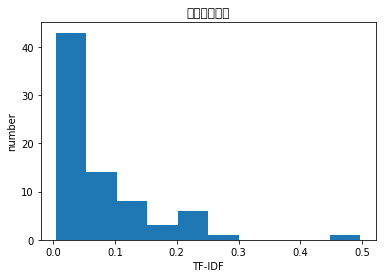

[('白洋淀', 0.500119710015592), ('鱼均', 0.21335837908619465), ('贴饼子', 0.1922442941464148), ('杂鱼', 0.18823069287430572), ('小碗', 0.17982668389269324), ('窝心', 0.17278916960797808), ('黑鱼', 0.17211284923502476), ('吃饭', 0.1637947227067301), ('340', 0.15962626709886207), ('岛', 0.15209857605526428), ('嘱咐', 0.15152326575177696), ('鲫鱼', 0.14785798901106914), ('结账', 0.14284922697438476), ('一盆', 0.14220630862063197), ('领到', 0.14137305765902503), ('饭店', 0.13974329863989582), ('一顿饭', 0.13115996828076668), ('米饭', 0.12353150048775469), ('怎么回事', 0.12332567435347132), ('我们', 0.12038471152365382), ('一条', 0.11528429738639023), ('鲤鱼', 0.11512749150614224), ('最贵', 0.11346114266252594), ('一斤', 0.11209406383222215), ('鸡蛋', 0.11023119992683204), ('领', 0.10457044903625232), ('汤', 0.10316270780336928), ('完后', 0.09612519351865408), ('中心', 0.09294710069703856), ('孩子', 0.09238240805095475), ('老婆', 0.090099755015442), ('这家', 0.08647323438458661), ('岛上', 0.08246674603982568), ('游船', 0.07853253484098768), ('一日游', 0.077331

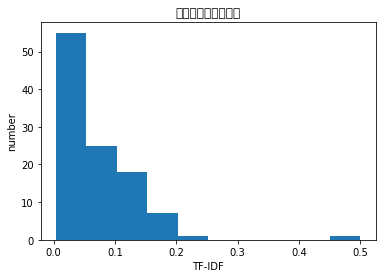

[('揣想', 0.29926355754081124), ('立克式', 0.27907322688069885), ('牛腿', 0.22455045604372945), ('挑高', 0.20922615860436394), ('红地毯', 0.19741557229103754), ('红砖墙', 0.17858029943729656), ('介紹', 0.17311583510397135), ('闭上眼', 0.16723577890555258), ('大人物', 0.16692424128435332), ('廊道', 0.1631511099511406), ('这幢', 0.15981115258225456), ('通风', 0.15511365497102692), ('相互辉映', 0.15490779906182553), ('面孔', 0.1523561998742107), ('出头', 0.14932481657383737), ('厅堂', 0.14407057027785378), ('探', 0.14337201186128756), ('咩', 0.1387833949271144), ('日光', 0.12904993290829583), ('澎湃', 0.12677692024999607), ('歷史', 0.12496052992333267), ('沒有', 0.11783643757320887), ('不已', 0.11687576014710507), ('探索', 0.11610773287002855), ('精湛', 0.11514912201244354), ('拿出', 0.11391815758363819), ('柱子', 0.11288214950561919), ('走廊', 0.10451452435597795), ('映入眼帘', 0.10261416647253795), ('典雅', 0.10057499731069276), ('工艺', 0.10041660382677442), ('阶梯', 0.09849131499269496), ('赞叹', 0.09799287874571766), ('时刻', 0.0961893788816299), ('二楼', 0.0

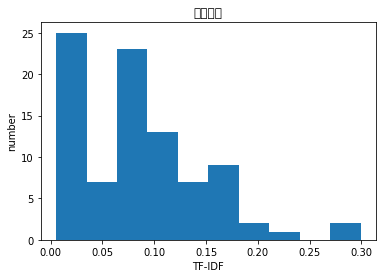

[('清源山', 0.5468555086292309), ('阿弥陀佛', 0.22848135470368852), ('1364', 0.2121334580920692), ('弥陀', 0.20377557940908994), ('二十四年', 0.15968136690397558), ('一啸台', 0.15835562403408945), ('左峰', 0.15835562403408945), ('建仿', 0.15835562403408945), ('泉窟', 0.15835562403408945), ('连心石', 0.15835562403408945), ('公尺', 0.15611976391423907), ('至正', 0.1553335887254533), ('泉州市', 0.1417439279441725), ('岩外', 0.1369881549215117), ('石室', 0.13564983898342145), ('立像', 0.1348190889073656), ('岩面', 0.12630442036522282), ('泓', 0.1213959749049358), ('为省', 0.11767885468524608), ('后壁', 0.10937110172584617), ('观瀑', 0.10400252147318761), ('面宽', 0.09716004233799873), ('云台', 0.09287199126067999), ('门额', 0.09081382238436786), ('岩', 0.08785671871157438), ('”', 0.08775615565047071), ('5.6', 0.08752933762618252), ('“', 0.08725327151454362), ('舍利塔', 0.08356948214006733), ('木构', 0.08207855253406751), ('5.77', 0.07917781201704473), ('风泽区', 0.07917781201704473), ('法师', 0.07623509273488946), ('石刻', 0.07581211061200137), ('福建省', 0

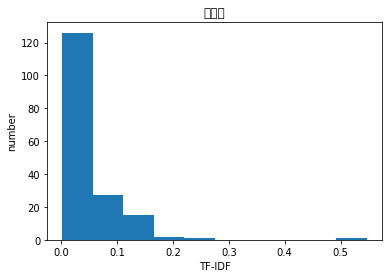

[('少帅', 0.5230091648741806), ('张学良', 0.29874688592012133), ('有汉卿', 0.25529700410470185), ('台安', 0.23807295259717048), ('凌海', 0.21077347684724362), ('老帅', 0.1915604397989249), ('将军', 0.1851599120410628), ('大帅府', 0.18213048181289), ('张作霖', 0.17632537383218091), ('锦州', 0.16070504350172402), ('枭雄', 0.15962447962024684), ('夏威夷', 0.14086288288339105), ('衣冠冢', 0.13612614733231915), ('陵寝', 0.1345352647262841), ('回过', 0.13250186620907325), ('出生地', 0.13214939145252932), ('感兴趣', 0.1200920842618629), ('辽宁', 0.1200580741911418), ('陵墓', 0.11258880952640399), ('沈阳', 0.10616752356268558), ('拜访', 0.1043875943912034), ('建在', 0.0925799560205314), ('美国', 0.09033487666089855), ('不远', 0.08854348869332694), ('一代', 0.08736475089551346), ('大陆', 0.08656951331240069), ('—', 0.08416656590608444), ('经营', 0.08414784043163147), ('市内', 0.08006506508801775), ('再也', 0.07963846141399873), ('旧址', 0.07826046121875464), ('故居', 0.07524933228233804), ('一句', 0.06842629181990435), ('有关', 0.06447487309199391), ('真实', 0.06431455

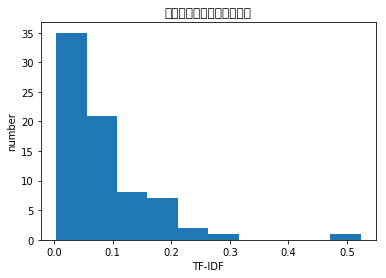

[('邢台', 0.508569283223237), ('大峡谷', 0.36262274299451025), ('峡谷', 0.33883913322398246), ('太行', 0.1726397325207064), ('石英砂', 0.16165991607263022), ('太行山', 0.1489826417544692), ('一线天', 0.12289580386363513), ('峡', 0.12241425277356127), ('垄断性', 0.11880175425605548), ('太行山区', 0.11068855971172412), ('黄巢', 0.10968831525720153), ('群型', 0.09929937990115527), ('岩', 0.09181989105663747), ('山岳', 0.0806712700480214), ('旅游区', 0.07537154762374457), ('云崖', 0.07450864122880436), ('写生', 0.07345591284530997), ('邢台市', 0.0725017660383309), ('独树一帜', 0.06979712245746746), ('其所', 0.06744447009011875), ('典型性', 0.06709296967544333), ('雄险', 0.0652164137108318), ('石岩', 0.06168417331255575), ('不可多得', 0.061482627204072715), ('群是', 0.05988918066874871), ('辅以', 0.058099742735529564), ('嶂', 0.056826166819773254), ('入口', 0.0558526761752509), ('乃至', 0.054936162514304436), ('砂岩', 0.052328339727319734), ('瀑布', 0.0522690884395599), ('正在', 0.05021801452009277), ('一奇峡', 0.049649689950577634), ('倾扑', 0.049649689950577634), ('旋

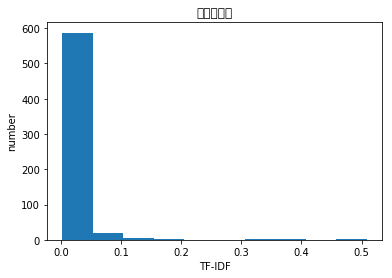

[('蠡园', 0.7855347350800167), ('范蠡', 0.32891927100079615), ('西施', 0.3094759687887749), ('无锡', 0.13977666249098347), ('园林', 0.11878049899763254), ('蠡湖', 0.10912329316406197), ('太湖', 0.10411307962098981), ('蠡', 0.10050829633532023), ('鼋头渚', 0.07251404959974223), ('假山', 0.07204859390055575), ('江南', 0.06300547070927243), ('湖之滨', 0.061104869948993175), ('桃花', 0.05997639911322188), ('越国', 0.059568056952900086), ('泛舟', 0.055656769842431265), ('五里湖', 0.05136910390665406), ('偕', 0.049019925500190034), ('荷花', 0.0462740615157125), ('层波叠影', 0.0450445792756619), ('大夫', 0.04292623310144386), ('园因', 0.04178570360282622), ('得名', 0.03980934379502859), ('园子', 0.039793178890194826), ('湖因', 0.03526795225715487), ('"', 0.035016119749306095), ('湖而', 0.03471418780374796), ('渔庄', 0.03435456226872981), ('无锡市', 0.03371604768150483), ('长廊', 0.03309718422562599), ('美人', 0.031368215861310146), ('见长', 0.030971352848827915), ('真水', 0.0308438590546957), ('相传', 0.030606993381109702), ('春秋', 0.028663914610008202), ('摩天轮

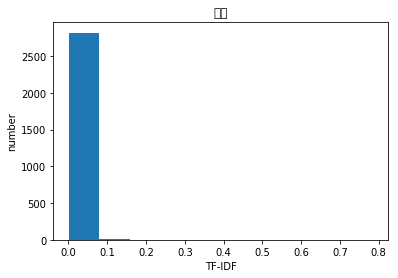

[('南河', 0.5158992943422462), ('扬州', 0.35284928311259095), ('街区', 0.3026409454602209), ('盐商', 0.23164866773987008), ('巷', 0.2280437132993626), ('丁家湾', 0.1695858266593761), ('会馆', 0.14119531367377416), ('老街区', 0.1307132597322211), ('以何园', 0.12659421879752225), ('古运河畔', 0.09704757063093424), ('古巷', 0.09585797696782854), ('、', 0.09480057347879373), ('许氏', 0.09407599362974864), ('何园', 0.08145214431965132), ('家训', 0.0802490519492483), ('下', 0.07951101810201024), ('为首', 0.07214566542495116), ('花园', 0.0705245022219334), ('住宅', 0.06902105026272982), ('老城区', 0.06755807561166918), ('区内', 0.0659745493717625), ('为北至', 0.06329710939876113), ('傅家甸', 0.06329710939876113), ('劝勉', 0.06329710939876113), ('平园', 0.06329710939876113), ('廖可亭', 0.06329710939876113), ('引市', 0.06329710939876113), ('新仓', 0.06329710939876113), ('许云甫', 0.06329710939876113), ('关心', 0.06240340269608013), ('老街', 0.06150909615094934), ('关注', 0.06067435648524133), ('尊德堂', 0.05902666103848587), ('贾氏', 0.0565286088864587), ('古民居', 0.0554

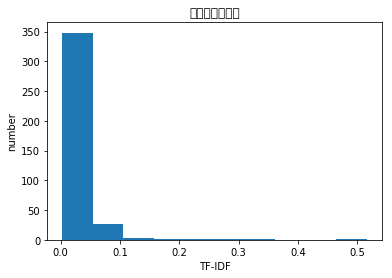

[('天台山', 0.43457483636953437), ('酒店', 0.4008733610793899), ('萤火', 0.19067690289460573), ('一往', 0.17744518211193158), ('想要', 0.17675096789136696), ('温泉', 0.16613883507840854), ('冷', 0.16524948788427044), ('清凉凉', 0.15711497601628038), ('恒温', 0.14006045246043097), ('吗', 0.13903520604335226), ('难耐', 0.13748250734051462), ('之光', 0.1372391905915773), ('可圈可点', 0.12439278000145151), ('被子', 0.11574350952201377), ('玩法', 0.11564408509999646), ('酷暑', 0.11337275060514447), ('炎炎夏日', 0.11121358324035412), ('空灵', 0.10992637974759248), ('泡温泉', 0.10643061582443608), ('游泳池', 0.10589408832117533), ('各项', 0.10582785076211357), ('偏高', 0.10343636806664526), ('暖和', 0.09718620336263377), ('池子', 0.09704772931837423), ('补充', 0.09093789742162255), ('价格', 0.09018273375477832), ('依山傍水', 0.08901383637893032), ('睡觉', 0.08606344817544519), ('团购', 0.0859176932936796), ('尽兴', 0.08534329356879651), ('玩水', 0.08250756122527528), ('潺潺', 0.0811335861633872), ('公共设施', 0.08068458701586007), ('这家', 0.08040523992347112), ('环境', 

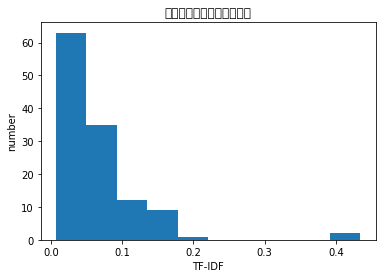

[('扁鹊', 0.7301547589428121), ('名医', 0.19980035990630732), ('中医', 0.1723597892076763), ('神医', 0.1592796612558222), ('纪念馆', 0.14287229446609748), ('砭石', 0.1332503821293577), ('中医学', 0.1276111269524529), ('看诊', 0.1276111269524529), ('郎中', 0.10721714300433274), ('墓', 0.09977135976411691), ('中医药', 0.09654607043748395), ('指甲', 0.08876286994480281), ('药品', 0.08400231416993224), ('中药', 0.08229714702796626), ('医学', 0.08093918000702473), ('器械', 0.07665789185106146), ('馆内', 0.07289223281655821), ('保健用品', 0.07144537626454427), ('医史展', 0.07144537626454427), ('碾器', 0.07144537626454427), ('青蒿素', 0.07144537626454427), ('十大', 0.07086079627271658), ('药方子', 0.06662519106467885), ('江湖', 0.06555215532861543), ('满口胡', 0.06380556347622646), ('陈列', 0.06217375350963725), ('兜售', 0.060384406816449826), ('研学', 0.060253252826416456), ('良方', 0.060253252826416456), ('遗著', 0.060253252826416456), ('成就展', 0.05898537827636102), ('抓药', 0.05698482066494797), ('914', 0.056165750687908626), ('坐诊', 0.056165750687908626), ('针

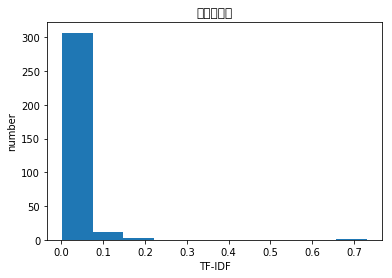

[('炉', 0.32239533289635236), ('李娥', 0.2798840141674121), ('神姑', 0.2798840141674121), ('投炉', 0.26100115773492116), ('孝妇', 0.24211830130243017), ('偏东南', 0.23603937930508676), ('齐桓公', 0.23107253838292172), ('博山区', 0.2232354448699392), ('桑园', 0.2232354448699392), ('作恶', 0.2200267754634132), ('铁匠', 0.21000914223266656), ('博山', 0.1969445148671521), ('铁牛', 0.1872279035205964), ('殉葬', 0.18226106259843133), ('阜', 0.18226106259843133), ('神庙', 0.1481330390826617), ('办事处', 0.1477040191399754), ('城西', 0.1242293432894478), ('西岸', 0.12360714520518411), ('琉璃', 0.12240382389443247), ('融化', 0.11158320443270216), ('现为', 0.10749707362686244), ('女儿', 0.09211326907728559), ('供奉', 0.08851709693702277), ('园内', 0.07815856117467242), ('来自', 0.07661248940534199), ('河', 0.07239966874125976), ('街道', 0.07027180091441772), ('村', 0.06807981248737262), ('时期', 0.05854004698856489), ('故事', 0.05414777686289324), ('人们', 0.04706224007093793), ('重要', 0.04624384390082387), ('高', 0.03495778974400318), ('被', 0.0259061915690743

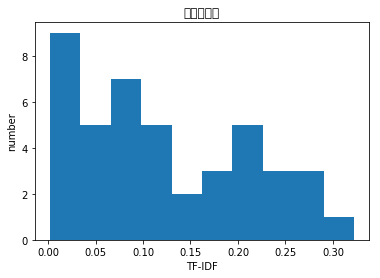

[('都城', 0.4728565199248668), ('埃菲尔铁塔', 0.3521629362254256), ('欧式', 0.20399629693158872), ('欧洲', 0.19824587517932019), ('天', 0.18684019319168085), ('婚纱照', 0.1332876653220251), ('成单', 0.1107085906064638), ('爱蜜', 0.1107085906064638), ('落影', 0.1107085906064638), ('那九堡', 0.1107085906064638), ('杭州', 0.10544443718588678), ('767', 0.09887027509168304), ('371', 0.09577029962558022), ('法国', 0.09229274225316111), ('临平', 0.09140112960124125), ('门禁卡', 0.09140112960124125), ('359', 0.08974004825030768), ('缩小', 0.08923387694867248), ('萧山区', 0.08830115413513842), ('535', 0.08703195957690227), ('化石林', 0.08703195957690227), ('762', 0.08589662635696398), ('万户', 0.08589662635696398), ('城堡', 0.08492614929092607), ('模仿', 0.08484972581255278), ('广厦', 0.08227090275986589), ('例如', 0.08202922976921363), ('余杭区', 0.08083200864469664), ('逆袭', 0.08017873595839044), ('335', 0.0774004470421855), ('未央', 0.07692144822164652), ('拍', 0.0761067383613587), ('345', 0.07602295308834772), ('建筑', 0.07494018340357154), ('某地', 0

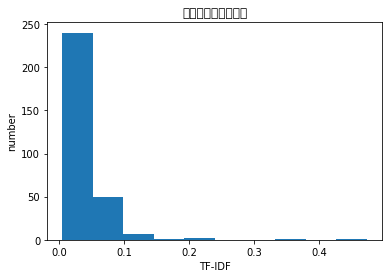

[('哈尔滨火车站', 0.3869058769169432), ('哈尔滨', 0.31610028160164), ('哈站', 0.3158421479176391), ('火车站', 0.31366074184720927), ('广场', 0.259180552817529), ('机场', 0.17055458068006238), ('车站', 0.16432172308034054), ('站', 0.13383191722086088), ('大巴', 0.11856834578749037), ('东站', 0.10400647193885336), ('前', 0.09612656664486695), ('老旧', 0.09468991097916665), ('乱', 0.08938394414636366), ('出租车', 0.08643065631734609), ('脏乱差', 0.08456329748178144), ('地下通道', 0.08421241138479135), ('冰雕', 0.08400914424888198), ('老站', 0.08304878480513914), ('火车', 0.07619429133287793), ('街', 0.07596800212408497), ('候车室', 0.07368662603882234), ('冰城', 0.07149325120462721), ('·', 0.07064830798906963), ('司机', 0.06373932899252777), ('进站', 0.06347338194070389), ('老', 0.062330312871926905), ('今', 0.06115907416039077), ('中央大街', 0.06106945285724864), ('半圆形', 0.06075101540314317), ('天津', 0.05968154089334492), ('-', 0.057261459241127126), ('人十来', 0.055340512836427255), ('行人', 0.054837805192116604), ('西站', 0.05344177181952781), ('乘客', 0.

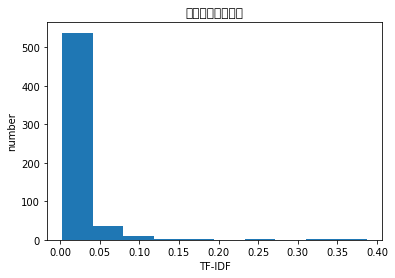

[('不予置评', 0.49354840144464807), ('校风', 0.4401342358571885), (' ', 0.27442532171343453), ('母校', 0.27227452739133906), ('支持', 0.2553663727398226), ('图书馆', 0.2510720901366506), ('好看', 0.19547307091227223), ('喜欢', 0.1941918523466587), ('嘿嘿', 0.19254077431215108), ('大气', 0.16752061453662276), ('学校', 0.1541658183257143), ('湖', 0.15094052625398366), ('旅行', 0.14462006844202477), ('壮观', 0.11001559761741134), ('啥', 0.10339656686800257), ('呢', 0.08896480332145658), ('漂亮', 0.08332674953815754), ('哦', 0.08298308819517942), ('的话', 0.07691899918207167), ('我', 0.07502960267715145), ('一下', 0.07212522135519395), ('~', 0.0620082763457916), ('不是', 0.05452876125212498), ('没', 0.05387885564789005), ('还有', 0.049062170673559634), ('很', 0.036586644454439314), ('不错', 0.03584750995884273), ('。', 0.018502211338082556), ('的', 0.007371774240878455), ('，', 0.006651751009878414)]
defaultdict(<class 'float'>, {' ': 0.27442532171343453, '~': 0.0620082763457916, '。': 0.018502211338082556, '一下': 0.07212522135519395, '不是'

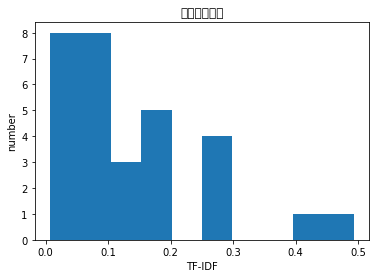

[('鹤山', 0.3554830876915202), ('没修', 0.27111944211588956), ('打球', 0.24688561812306803), ('居民楼', 0.23612697327890517), ('桌椅', 0.219706299502659), ('下棋', 0.21787618007131665), ('上刻', 0.20805525930678728), ('文人墨客', 0.20207935074674635), ('打牌', 0.18511267603637088), ('几块', 0.18441265565524004), ('有座', 0.17314332834780566), ('转悠', 0.17180274099949291), ('巨石', 0.168489335798422), ('正面', 0.16431842330960897), ('山上', 0.1593068689521534), ('亭子', 0.1394122432922929), ('不少', 0.13224379552627422), ('清净', 0.1320753747572291), ('一面', 0.1315204588302551), ('公园', 0.126208231701346), ('看来', 0.12194214640879768), ('市民', 0.1167354353408195), ('寺庙', 0.1075802730393662), ('古代', 0.10544777999042208), ('傍晚', 0.10535386354848365), ('修', 0.10225482572872348), ('靠近', 0.10205059211466626), ('字', 0.1009431951596653), ('平时', 0.09725765510555047), ('些', 0.09041809376669765), ('山顶', 0.09000149237108133), ('吸引', 0.08780183361448532), ('另外', 0.08362590999015827), ('有人', 0.08140580994078449), ('这边', 0.07904843234230925)

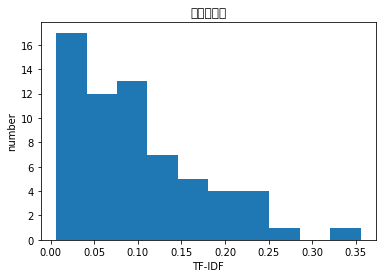

[('筐子', 0.6654844817104919), ('🍁', 0.5446257489885628), ('红叶', 0.29470350844208115), ('沟', 0.2796685483809185), ('秋天', 0.19105657979054866), ('一大', 0.17627429215141968), ('一去', 0.0903370054605278), ('特色', 0.07586003877312764), ('特别', 0.06892483840622664), ('值得', 0.05999243395413064), ('里面', 0.05782329448659294), (' ', 0.045677360719715905), ('是', 0.013034700888270752), ('的', 0.002863028240612748)]
defaultdict(<class 'float'>, {' ': 0.045677360719715905, '是': 0.013034700888270752, '特别': 0.06892483840622664, '特色': 0.07586003877312764, '的': 0.002863028240612748, '里面': 0.05782329448659294, '一去': 0.0903370054605278, '一大': 0.17627429215141968, '值得': 0.05999243395413064, '秋天': 0.19105657979054866, '红叶': 0.29470350844208115, '沟': 0.2796685483809185, '筐子': 0.6654844817104919, '🍁': 0.5446257489885628})
[0.045677360719715905, 0.013034700888270752, 0.06892483840622664, 0.07586003877312764, 0.002863028240612748, 0.05782329448659294, 0.0903370054605278, 0.17627429215141968, 0.05999243395413064, 0.19

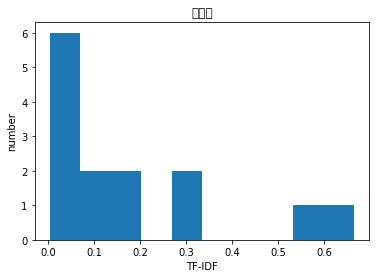

[('青木', 0.42564933822488576), ('魏辅', 0.3968489605727719), ('飞凤桥', 0.32195908906862347), ('川', 0.26350021396458895), ('新街', 0.20674486565684244), ('唐', 0.1931145452771264), ('老街', 0.15570021745563628), ('三孔', 0.14495287898115575), ('御洪', 0.1201697104300751), ('飞风桥', 0.1201697104300751), ('魏家坝', 0.1201697104300751), ('桥原', 0.11206225421706026), ('济川桥', 0.11206225421706026), ('桥面', 0.10778371682910078), ('魏氏', 0.09921224014319298), ('金溪', 0.09584734179103056), ('古镇', 0.09544771673792302), ('龙场', 0.09446968228234054), ('能力差', 0.09212252006005416), ('礅', 0.09110478393017814), ('原址', 0.08936864997286835), ('水泥', 0.08507289054071808), ('古朴', 0.08091485980343353), ('风雨', 0.08026734195344276), ('道路交通', 0.07825476985631087), ('垮塌', 0.07373084615307189), ('瓦当', 0.0732975897009859), ('筑起', 0.07267638601540519), ('当即', 0.07134362708727696), ('石栏', 0.06848435738418689), ('廊柱', 0.06848435738418689), ('溪河', 0.06728021751845342), ('惹眼', 0.06702866832078344), ('窗棂', 0.06666120605232864), ('古筝', 0.065734

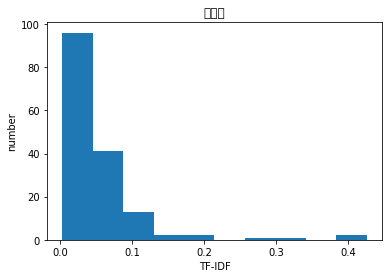

[('花车', 0.48058811501882726), ('主题乐园', 0.43273486531899097), ('巡游', 0.4152427717967628), ('孩子', 0.2781364756128221), ('室内', 0.2563998042049309), ('游乐', 0.230997098653581), ('非常适合', 0.20867813302139213), ('稍微', 0.18915023381486565), ('玩', 0.18798540074767395), ('项目', 0.16659144855064675), ('设施', 0.13163174077560058), ('一点', 0.11803917954089854), ('几个', 0.1147309166039316), ('各种', 0.1049166988055598), ('能', 0.07124647932978265), ('小', 0.06673826134075732), ('但是', 0.05547756817169739), ('就', 0.03343874241236123), ('去', 0.0256394682113465), ('有', 0.020020759796225918), ('是', 0.013023469345917457), ('的', 0.005721122540167891), ('。', 0.005384732437050325), ('，', 0.005162323396065512)]
defaultdict(<class 'float'>, {'。': 0.005384732437050325, '一点': 0.11803917954089854, '但是': 0.05547756817169739, '去': 0.0256394682113465, '孩子': 0.2781364756128221, '室内': 0.2563998042049309, '小': 0.06673826134075732, '就': 0.03343874241236123, '是': 0.013023469345917457, '有': 0.020020759796225918, '玩': 0.18798540074

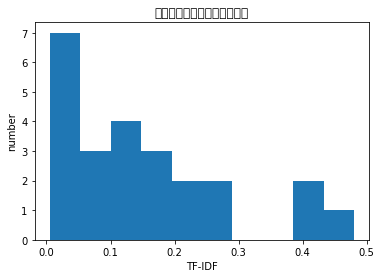

[('九鲤湖', 0.8395789532211775), ('仙游', 0.25979538199556396), ('瀑布', 0.14047176234165284), ('祈梦', 0.10592355394901078), ('仙游县', 0.09792156918082665), ('鲤', 0.07788909808748778), ('石四奇', 0.0741289998362028), ('徐霞客', 0.06888686522328065), ('九', 0.06884747001633269), ('福建', 0.06836197434377307), ('景区', 0.06813200616704125), ('莆田', 0.06488883130911535), ('通仙桥', 0.06412651887597264), ('飞瀑', 0.06378263434102442), ('水量', 0.05611626239844218), ('十八弯', 0.053806070357808), ('玉华洞', 0.05130121510077811), ('飞潭', 0.05130121510077811), ('以湖', 0.05034866398198959), ('汉武帝', 0.049994017607854116), ('莆田市', 0.04716072365977186), ('三绝', 0.046168489221192835), ('九真观', 0.04447739990172168), ('游洋', 0.04447739990172168), ('…', 0.04191490906070585), ('九个', 0.04139412809501696), ('.', 0.03705235310092759), ('水库', 0.03660263986989393), ('元', 0.035345571361755646), ('兄弟', 0.03361155004131049), ('到', 0.03355070525305524), ('炼丹', 0.03326556307629212), ('壮观', 0.033007117759664785), ('客车', 0.032200078555367044), ('武夷山', 

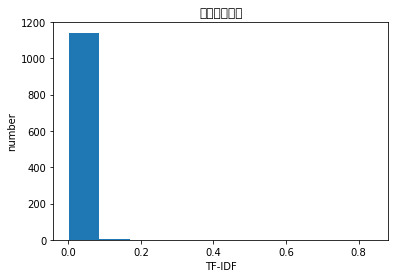

[('山庄', 0.4083792818314228), ('秀水', 0.38018067451954035), ('阿尔山', 0.1778634451648814), ('碟恋', 0.1560487644036401), ('内卧', 0.14552066610025144), ('垂首', 0.14552066610025144), ('河水', 0.1398445180316293), ('飞光', 0.13936212338886306), ('扎兰屯市', 0.13160327716726597), ('558', 0.12883402508547437), ('扎兰屯', 0.12883402508547437), ('洒入', 0.12446446949347409), ('卧牛山', 0.12267548237408597), ('牛岭', 0.12267548237408597), ('萦', 0.12267548237408597), ('养鱼池', 0.11393637119008543), ('低眉', 0.11214738407069733), ('翠绿', 0.10953228876097747), ('凭心', 0.10715778993089187), ('含羞', 0.10248745549611951), ('葱笼', 0.10040353027050977), ('楚楚动人', 0.09964393023350392), ('而论', 0.09603397467850949), ('异彩', 0.09490836090154961), ('青山', 0.09244986434889595), ('回环', 0.0908816829670219), ('胭脂', 0.09007141965685118), ('俄式', 0.08625424621922154), ('残旧', 0.0838472663241658), ('一湾', 0.0830812803988118), ('染红', 0.08188469062722126), ('余辉', 0.08109985297397584), ('青绿', 0.0808828659234941), ('弯弯的', 0.07804196825974541), ('淙淙', 0.075

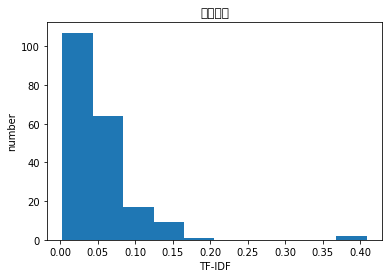

[('铁岭', 0.4556168641613641), ('油菜花', 0.43463667647752235), ('炖菜', 0.18783429428386325), ('万亩', 0.1630740204401945), ('物流', 0.16032487471713266), ('田', 0.1478778824942557), ('活烧', 0.12863016975819397), ('畅扬', 0.12863016975819397), ('田间', 0.12640684435759464), ('花籽', 0.1061972043207631), ('铁岭市', 0.10259540279599721), ('扶摇', 0.09860833775390158), ('花海', 0.09435451262309127), ('欢心', 0.09051251624951341), ('江村', 0.08647136871988495), ('赵本山', 0.08647136871988495), ('跻身', 0.08244511717820724), ('拗', 0.079160296543576), ('丹东', 0.07561883285316093), ('闲置', 0.07543868476102315), ('应季', 0.07526109204727892), ('如黛', 0.07491328978241946), ('轻风', 0.07491328978241946), ('一跃', 0.07457488873924871), ('快意', 0.07330594776821647), ('妈妈', 0.07312200877784192), ('东北', 0.07301004367941878), ('大锅', 0.07201703132839506), ('夏初', 0.07109891818717098), ('闻名全国', 0.07048204088951043), ('雀跃', 0.06944291311587521), ('虽说', 0.06837562236778408), ('千亩', 0.06827987630809704), ('轻盈', 0.06614957252419816), ('铺上', 0.0658134

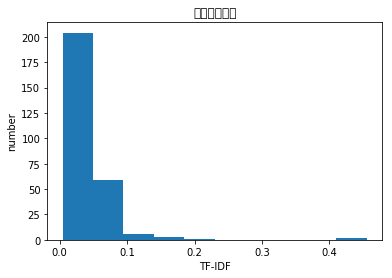

[('榆次', 0.4996862872143603), ('于大宋', 0.4878247674635556), ('成平', 0.4878247674635556), ('文庙', 0.2218255871980888), ('二年', 0.21605813880431235), ('建筑群', 0.21124975223414513), ('现存', 0.14822153633392132), ('老东西', 0.13167973348097736), ('始建', 0.1228494716012576), ('城中心', 0.12062668508304522), ('古老', 0.09760683713884587), ('留存', 0.09670644163567035), ('大规模', 0.0911501741015378), ('翻新', 0.08218087921755075), ('不多', 0.07223480272025805), ('大气', 0.059062153300557425), ('之一', 0.055884513356794584), ('挺大', 0.0551599493425282), ('"', 0.051751276133588264), ('最', 0.04495852787080755), ('希望', 0.04451551731557614), ('下来', 0.03998038274590026), ('一处', 0.039113353978587465), ('算', 0.03851643619041354), ('做', 0.03239231081031742), ('更', 0.029426291646396756), (' ', 0.027643762727226785), ('游客', 0.026822965138681956), ('非常', 0.017324865618292228), ('多', 0.01667415833608927), ('不错', 0.012638630382827105), ('还', 0.01198475815075226), ('这里', 0.011277138825127861), ('了', 0.01058626259620977), ('一个', 0.01003

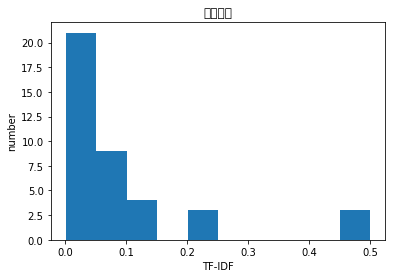

[('玉皇山', 0.7121124385348431), ('西湖', 0.2787823066659588), ('钱塘江', 0.271179179587563), ('紫来', 0.20868781331874514), ('八卦', 0.19964730205562486), ('田', 0.17384863254457572), ('凤凰山', 0.1059097720497068), ('杭州', 0.104749160628219), ('福星', 0.09111361825028245), ('爬', 0.08668966244837528), ('山顶', 0.07834843794930496), ('俯瞰', 0.07762599993514216), ('玉皇', 0.07761864385706009), ('飞云', 0.07591278528131758), ('十景', 0.0758665569880441), ('二百三十', 0.06956260443958172), ('山姿', 0.06956260443958172), ('洞', 0.06698531680339476), ('万松', 0.059737541751968666), ('紫气东来', 0.05327964667256199), ('虎跑', 0.052287213882150824), ('南宋', 0.051602498561175665), ('钱塘', 0.05045845401150266), ('缸', 0.04609404555658545), ('山不高', 0.04570700269067446), ('名词', 0.04453019040801752), ('变好', 0.04316171923461197), ('介于', 0.04209715720651515), ('亡后', 0.041241976283383656), ('农时', 0.041241976283383656), ('厂庆', 0.041241976283383656), ('园墩', 0.041241976283383656), ('寺佛', 0.041241976283383656), ('尊祀', 0.041241976283383656), ('浩潮', 0

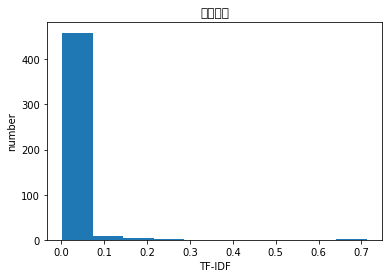

[('索道', 0.722936074352629), ('苍山', 0.4567787412779453), ('感通', 0.22280127804463762), ('洱海', 0.215814772850861), ('大理', 0.10376892868623142), ('感通寺', 0.08794533443530089), ('坐', 0.08719732996524025), ('缆车', 0.07547860809554596), ('珍珑', 0.06389984619377842), ('棋局', 0.06155655400360153), ('清碧溪', 0.06119555722519698), ('单程', 0.05895523849083524), ('洗马潭', 0.0504612545560479), ('易燃物品', 0.047924884645333815), ('寺', 0.04748095943332998), ('草莓', 0.04681258066261428), (' ', 0.04627256508743928), ('很甜', 0.04623454867226183), ('密闭性', 0.04589666791889773), ('线呢', 0.04589666791889773), ('古城', 0.04397199464875678), ('元', 0.04015994535771279), ('但观', 0.039874157643472005), ('下山', 0.039708455758040564), ('很长', 0.03870101292714528), ('切记', 0.038442705968082753), ('打火机', 0.03836435007799999), ('炒鸡美', 0.03693393240216091), ('·', 0.036448764951339634), ('俯瞰', 0.03627402463580005), ('喜洲', 0.036069864965092256), ('咪咪', 0.0359301378637334), ('探险者', 0.03490571567572483), ('火柴', 0.03490571567572483), ('人座', 0.0

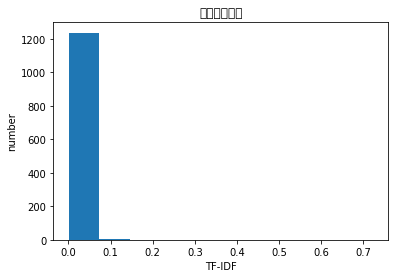

[('新北区', 0.6921776757336022), ('酒吧', 0.2879811730550583), ('招牌菜', 0.2804096739131975), ('小食', 0.1976653597862809), ('恐龙', 0.180759751839683), ('档次', 0.1628853887171487), ('放风筝', 0.16167455212926285), ('一两个', 0.14905769046217027), ('划船', 0.13821837813565413), ('健身', 0.1334346781325426), ('午饭', 0.13297469541252688), ('晚上', 0.12201936278469291), ('玩耍', 0.11457063678335379), ('园', 0.11234873596486668), ('饭店', 0.11152159328968268), ('悠闲', 0.10567423128629044), ('美食', 0.10271717678136637), ('场所', 0.09733822698575967), ('白天', 0.09640829777205967), ('广场', 0.07998376429581928), ('不远', 0.07403950921708835), ('孩子', 0.07372541966630483), ('开放', 0.06887769056040825), ('不同', 0.06667915719966758), ('当然', 0.06648687759637427), ('周围', 0.06440823569586177), ('几个', 0.060823269991379283), ('公园', 0.05686976914881982), ('离', 0.056398923997942066), ('不要', 0.05333751832658866), ('带', 0.05197252530791795), ('哦', 0.051212900964461246), ('有', 0.042455098052504234), ('一般', 0.04048839505871992), ('门票', 0.037952461

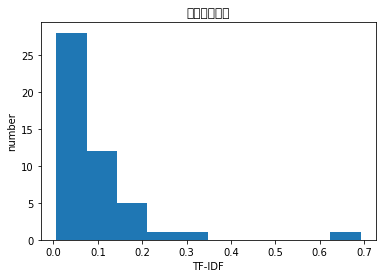

[('峣', 0.6873795604620196), ('杨升', 0.33331824133443244), ('精舍', 0.2678255041110351), ('明万历', 0.1995708431578319), ('庵', 0.18738562559401928), ('旧居', 0.18429864130781978), ('碧', 0.1838058691951849), ('祠', 0.17365261404245624), ('其', 0.14168017394107277), ('改建', 0.13593391569278934), ('塑像', 0.1356279333894588), ('供奉', 0.13409442108551006), ('东南', 0.129808744660453), ('年间', 0.12202057210507423), ('山脚下', 0.1153313660133332), ('西', 0.10982063572222799), ('村', 0.10313400867178694), ('纪念', 0.08953393635317397), ('将', 0.07565335043928889), ('为', 0.07179999462355115), ('人们', 0.07129451886328408), ('高', 0.05295750471218238), ('”', 0.033566626746983304), ('“', 0.03337427415402246), ('在', 0.009083766860235236), ('是', 0.006856382216100013), ('。', 0.00283486548316883), ('，', 0.002038331418442431)]
defaultdict(<class 'float'>, {'“': 0.03337427415402246, '”': 0.033566626746983304, '。': 0.00283486548316883, '在': 0.009083766860235236, '塑像': 0.1356279333894588, '是': 0.006856382216100013, '村': 0.103134008

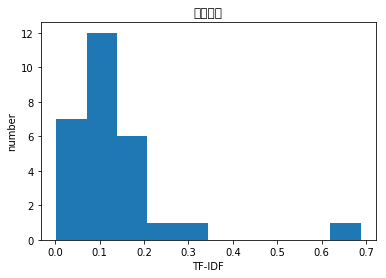

[('东戴', 0.35911578749163037), ('农家院', 0.29658869593006515), ('德元', 0.25085486155656567), ('烧高香', 0.18013587362220193), ('功课', 0.1463692892657572), ('～', 0.1450889915007929), ('海鲜', 0.142515727240333), ('电话', 0.13696827751847446), ('18003349111', 0.1352095420657898), ('干净', 0.1256446692775034), ('15326298030', 0.12542743077828283), ('河德元', 0.12542743077828283), ('河晨缘', 0.12542743077828283), ('15133526212', 0.12227829432751953), ('河区', 0.12227829432751953), ('房间', 0.11824613277515644), ('洒扫', 0.11752979508219885), ('金姐', 0.11564531949077587), ('众僧', 0.1111511082682664), ('老板', 0.1107623698237713), ('寺', 0.10637770065289089), ('院内', 0.10343305692433455), ('总听', 0.10202551551361919), ('寺庙', 0.09877295854675752), ('东戴河', 0.09847881464755773), ('干爽', 0.09796557250718495), ('老妇人', 0.09747034262636504), ('一位', 0.09537253728273096), ('首选', 0.09012434537717), ('庙门', 0.08978282401423543), ('宜家', 0.0892293176427158), ('袅绕', 0.08793367410694923), ('卫生', 0.08545306846040313), ('有模有样', 0.084834142640

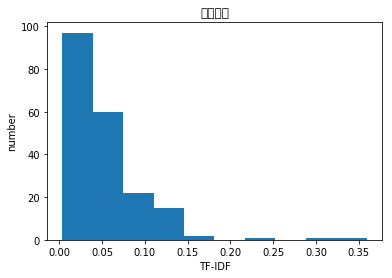

[('西蜀', 0.3759558746556739), ('辣椒', 0.25478060510619), ('川西', 0.2313373211261424), ('廊桥', 0.2277414142247264), ('辣度', 0.21882224184937135), ('流韵', 0.20175624991546867), ('古镇', 0.20091504920420603), ('九宫格', 0.19885631121148575), ('风神', 0.18797793732783696), ('雕窗', 0.184690257981566), ('红油', 0.1757551538625987), ('锅底', 0.16686663636477925), ('酒庄', 0.1571336328063026), ('洲际', 0.15520158144156498), ('每栋', 0.14415785420349858), ('特色旅游', 0.14243941121820022), ('限度', 0.14006764087239992), ('漂着', 0.13957022957247187), ('盆', 0.1370007793464654), ('高层建筑', 0.13612914772414894), ('坝子', 0.1318192674427899), ('隐匿', 0.12565162588201398), ('门楣', 0.12389705750320323), ('一层层', 0.10796403235671372), ('火锅', 0.10270299672463984), ('茶馆', 0.10059283902860536), ('古街', 0.09582739359370047), ('高级', 0.09578576886370016), ('及其', 0.0844803705590334), ('成都', 0.08055399040027601), ('厚重', 0.07632404059513637), ('爽', 0.07561734643679005), ('满满的', 0.07330907460983938), ('民居', 0.07028149367149801), ('古色古香', 0.0693544751

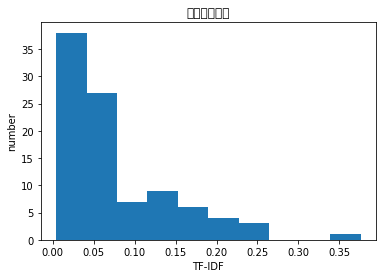

[('茅坪', 0.6110610362391686), ('象山', 0.42672316633652096), ('庵', 0.3667217369843961), ('远观', 0.23211235900596955), ('大巴', 0.22222740559168522), ('途中', 0.20598042645997847), ('停留', 0.20156666970850798), ('司机', 0.1911420876739097), ('景区', 0.16226587657423755), ('不会', 0.12761607671029576), ('经过', 0.11774007078679229), ('只能', 0.11758448769698067), ('所以', 0.07462608805769314), ('从', 0.06692064639115777), ('会', 0.06528985753603339), ('这里', 0.03836428405282738), ('去', 0.026416648705925843), ('在', 0.017777322837793385), ('的', 0.005894540522501433), ('。', 0.005547953802802061), ('，', 0.0026594015627807543)]
defaultdict(<class 'float'>, {'。': 0.005547953802802061, '从': 0.06692064639115777, '会': 0.06528985753603339, '去': 0.026416648705925843, '只能': 0.11758448769698067, '在': 0.017777322837793385, '的': 0.005894540522501433, '这里': 0.03836428405282738, '，': 0.0026594015627807543, '所以': 0.07462608805769314, '远观': 0.23211235900596955, '不会': 0.12761607671029576, '景区': 0.16226587657423755, '象山': 0.4267231

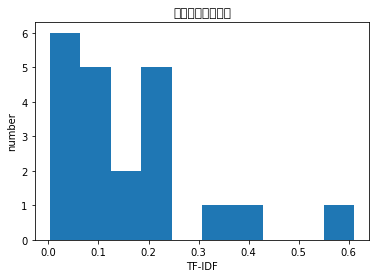

[('夹金山', 0.7458352051861253), ('垭口', 0.37870870077855523), ('4114', 0.2074807780660983), ('四姑娘山', 0.15415136502521717), ('海拔', 0.10990191792514437), ('松茸', 0.09393218086912236), ('宝兴县', 0.09265065838597093), ('风干', 0.08959528371712935), ('小金县', 0.08022921568379879), ('防滑链', 0.075963344345635), ('大雪山', 0.06593106461433881), ('红军', 0.06573453634617078), ('翻越', 0.06371641671867763), ('我区', 0.06176710559064729), ('烧烤', 0.05884088346919196), ('雪', 0.0573084122837311), ('大熊猫', 0.05689610088691569), ('第一座', 0.05607984793564353), ('雪山', 0.048956862190993586), ('小金', 0.0482614386004769), ('雅安', 0.04228982024854696), ('牦牛肉', 0.04161029226741225), ('店家', 0.04160219883322646), ('云海', 0.03962098033837707), ('4930', 0.038720610578407096), ('串香', 0.038720610578407096), ('头涨', 0.038720610578407096), ('车不太多', 0.038720610578407096), ('烤串', 0.03859748047965933), ('时候', 0.03831957964513632), (' ', 0.03730133959745616), ('疼感', 0.03610825798404595), ('卖', 0.03591534250837769), ('山巅', 0.03515895093158081), (

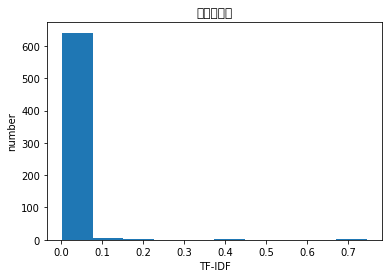

[('极地', 0.40767513796606203), ('表演', 0.2978166432041992), ('白鲸', 0.2707032165967038), ('海豚', 0.24025224480023757), ('动物', 0.2196299493033971), ('海洋公园', 0.18933169153026536), ('湘湖', 0.17035680819467325), ('海洋', 0.1455232966053888), ('企鹅', 0.1304933450257203), ('萧山', 0.12776481153125846), ('北极熊', 0.12109813700001668), ('海洋馆', 0.11598564554541457), ('海狮', 0.10342771622981997), ('可爱', 0.09723889479350971), ('推车', 0.09547245363022432), ('狼', 0.09296805667805859), ('杭州', 0.09223506142979189), ('240', 0.08989529986879115), ('门票', 0.08177765074222058), ('太贵', 0.07967031381963145), ('湘', 0.07854625579901389), ('海底', 0.07671377869974602), ('海洋生物', 0.07107360332454751), ('孩子', 0.0668880167355399), ('鱼类', 0.06636958075282479), ('抢', 0.06634453458695601), ('小孩子', 0.06333227499585668), ('亲子', 0.06317671851977805), ('跳水', 0.053622809590795587), ('场馆', 0.05327638963739531), ('带', 0.053046582211518235), ('北极', 0.05297249717302963), ('伴侣', 0.05253400920767863), ('海豹', 0.05244870734546443), ('水族馆', 0.051

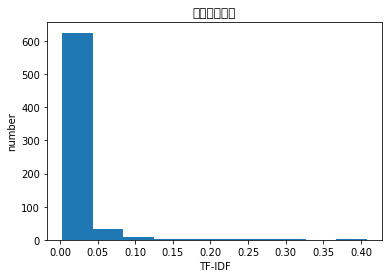

[('西王母', 0.7545021932066173), ('祖庙', 0.3247938360655293), ('天池', 0.2948045258857905), ('庙', 0.16483729432198954), ('王母娘娘', 0.12886828429092137), ('慈惠堂', 0.091489238748451), ('天山', 0.09068856972301474), ('蟠桃会', 0.08761734618800475), ('几建', 0.07952627690359157), ('招商引资', 0.07612029440517754), ('几毁', 0.0752101525243114), ('曾毁', 0.0752101525243114), ('票中票', 0.07105318619644324), ('娘娘庙', 0.06501306254452077), ('阶梯', 0.06457728340861327), ('极盛', 0.06219159735576632), ('此庙', 0.06219159735576632), ('供奉', 0.06205613710890846), ('收钱', 0.061355501328102066), ('中景', 0.06037682119508708), ('1932', 0.05854440368073398), ('重建', 0.055004403211389045), ('后往', 0.05472317045410013), ('1933', 0.05348621584819976), ('还要', 0.05284590112654043), ('毁于', 0.052078151081802485), ('瑶池', 0.05155374612306324), ('管理者', 0.05140905756672771), ('善男信女', 0.048413859350227684), ('乾隆年间', 0.047903081882109434), ('一座', 0.047595574182862005), ('九十年代', 0.04700198714737504), ('战乱', 0.04643105664867881), ('反感', 0.046346173760640

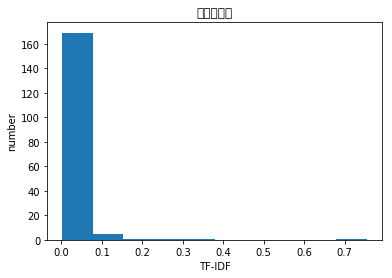

[('视死如归', 0.36557329272869765), ('忠魂', 0.339764980669002), ('壮士', 0.2913273526454784), ('墓园', 0.25106884514473554), ('隔海相望', 0.2449103683853871), ('两字', 0.24436313784149588), ('野草', 0.23303001789301764), ('划过', 0.21368710246176723), ('墓地', 0.2080155501889751), ('野花', 0.1789461785530956), ('缅怀', 0.17488988738429884), ('肃穆', 0.17295309799072048), ('他们', 0.15858275849345346), ('清朝', 0.15280937238070755), ('静静', 0.14973420775767354), ('半', 0.1383460028749124), ('岁月', 0.13582759401989306), ('瞬间', 0.13216447148975674), ('拍拍', 0.11365530079219896), ('此处', 0.11194691032361814), ('时期', 0.10289268307076073), ('棒', 0.09772463351120796), ('可是', 0.08506331070482452), ('开放', 0.07936069833435147), ('起来', 0.07319399962821121), ('照片', 0.07306457804150152), ('确实', 0.07164141544160783), ('感受', 0.0669758877284693), ('那里', 0.05757228078150684), ('历史', 0.05500717366971939), ('一些', 0.05339223791272427), ('虽然', 0.053115766793693016), ('环境', 0.0523895120536272), ('一下', 0.0512865927028037), ('那', 0.051050778826

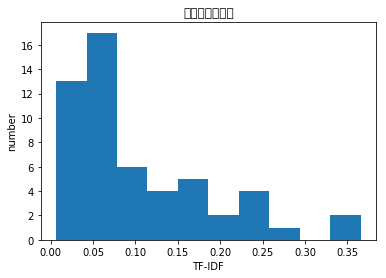

[('汤旺河', 0.7427175593252533), ('石林', 0.2565602519662341), ('伊春', 0.23266709210912542), ('小兴安岭', 0.16489794537119262), ('奇石', 0.15022589675366613), ('林海', 0.10530955652320854), ('景区', 0.0915696639958694), ('森林', 0.0856840942931852), ('塔', 0.07106427356061618), ('伊春市', 0.06956482633150653), ('公园', 0.06716916893674002), ('林场', 0.0671618324623347), ('5A', 0.06548159358050078), ('风景区', 0.061812796273252646), ('石头', 0.0600971274592291), ('一线天', 0.05943911637448377), ('兴安', 0.0587592573668436), ('三天', 0.057054553665462866), ('氧吧', 0.050581504756308425), ('观光', 0.05037270478918963), ('级', 0.04557092163224107), ('林业局', 0.04519375355636808), ('99.8%', 0.04478640118362715), ('夜景', 0.042391255963988635), ('国家', 0.041226227610492064), ('秋天', 0.03984227952525987), ('茅兰沟', 0.039650810350225364), (' ', 0.039462367712686755), ('山色', 0.03891566767520154), ('施业', 0.0383060070657031), ('北区', 0.0379091140617972), ('母树林', 0.0377554165757856), ('登记', 0.03772964942386194), ('观景', 0.03767650026214138), ('五营', 

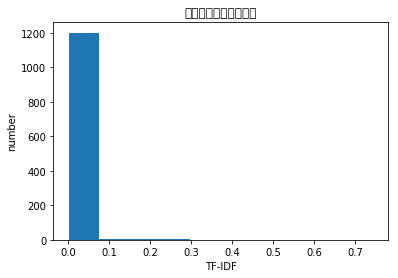

[('棋盘山', 0.480069687434555), ('石台', 0.38553151277246867), ('山城', 0.32473013099041087), ('考古', 0.2981905101386406), ('太多能', 0.2059221498114856), ('子村', 0.18713325831127625), ('高句丽', 0.17239768218610912), ('考古工作者', 0.16863219105999072), ('内秀', 0.15774241655410773), ('考量', 0.14740214339428845), ('子', 0.14696045810417901), ('研究所', 0.1283063658965848), ('1987', 0.11671594673540782), ('真相', 0.11539845958156504), ('岸', 0.10512814989940827), ('沈阳', 0.09899186540808833), ('无缘', 0.09733223821639576), ('本次', 0.09717263101292496), ('湖北', 0.09618654372499957), ('北岸', 0.09447312465677704), ('完毕', 0.08645581407336017), ('归', 0.08447320886928635), ('这一', 0.08135254493980619), ('原有', 0.0769725108640852), ('水库', 0.073461167303519), ('命名', 0.07152468011879107), ('等到', 0.06884638617020039), ('研究', 0.06647402883913887), ('所在地', 0.06626358639261062), ('对外开放', 0.06583463644242045), ('古城', 0.06110183091392477), ('文物', 0.05951447636650938), ('内部', 0.059348087471318166), ('山下', 0.05837409240201315), ('最早', 0.05

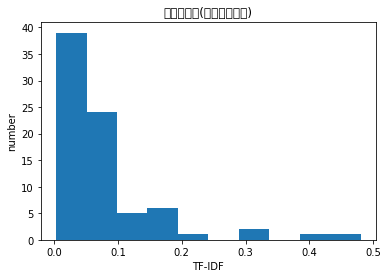

[('简介', 0.7865544682811138), ('故居', 0.6175209052550484)]
defaultdict(<class 'float'>, {'故居': 0.6175209052550484, '简介': 0.7865544682811138})
[0.6175209052550484, 0.7865544682811138]


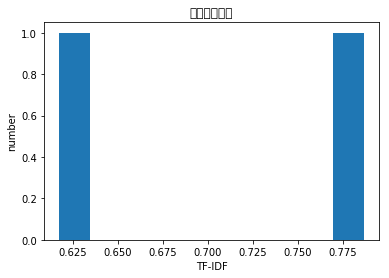

[('日月潭', 0.6287110596964766), ('文武庙', 0.5874307564459256), ('台湾', 0.13431652387404205), ('孔子', 0.12097852217259303), ('庙宇', 0.10758606918963562), ('文武', 0.08478532085207208), ('供奉', 0.08333348681077545), ('关公', 0.08077652860487314), ('寺庙', 0.07692876504504001), ('XX', 0.07390412072399875), ('庙', 0.07378516255476843), ('錢', 0.057633766922445505), ('背山面', 0.052974667203276746), ('庙里', 0.04597316934534763), ('捐献', 0.043549723515523844), ('关羽', 0.043173862597070504), ('岳飞', 0.04146582489578085), ('庙前', 0.04008162201395075), ('廟', 0.03944903732357885), ('认同', 0.03912570481203572), ('风铃', 0.03902102186904805), ('佳處', 0.03764197879803143), ('化堂', 0.03764197879803143), ('大爐', 0.03764197879803143), ('宫和益', 0.03764197879803143), ('廟蓋', 0.03764197879803143), ('星門', 0.03764197879803143), ('有欲揽', 0.03764197879803143), ('气敛', 0.03764197879803143), ('獅像', 0.03764197879803143), ('登抵', 0.03764197879803143), ('華表和櫺', 0.03764197879803143), ('華表狂', 0.03764197879803143), ('霸炫酷', 0.03764197879803143), ('牌坊'

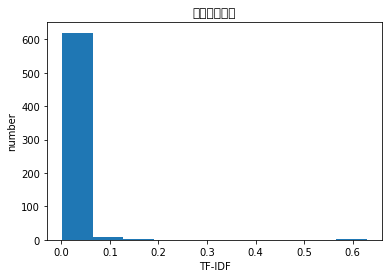

[('郴州', 0.4431888124564329), ('开花', 0.2813073579111121), ('数百种', 0.25090538912892746), ('蚊子', 0.24028679255814311), ('绿肺', 0.21428799487289749), ('一举两得', 0.19725665494929434), ('杨梅', 0.18466640729886222), ('花展', 0.17934232393266067), ('毒', 0.17896397984277002), ('里会', 0.1762478505351871), ('季节', 0.14370879046574572), ('赏花', 0.1402712665716654), ('摘', 0.14008159140720675), ('生物', 0.13671491643512707), ('植物园', 0.13438383512850824), ('学到', 0.12805228882550407), ('原始森林', 0.12634067369340357), ('空气', 0.11732428506572774), ('环境', 0.11673542385002231), ('婚纱照', 0.10997531724019154), ('茂密', 0.10764627865642011), ('农家乐', 0.10205566859234151), ('免费', 0.09816131047521094), ('带上', 0.09348052518504811), ('知识', 0.09260692033854855), ('空气清新', 0.08837201482505981), ('爱好者', 0.08812244180761857), ('植被', 0.08800559896235986), ('春天', 0.08707021808218647), ('植物', 0.08685781046868744), ('新鲜', 0.08508164994341015), ('玩玩', 0.08433738342926578), ('景致', 0.08360837382370075), ('小朋友', 0.0828309178317021), ('树木', 0

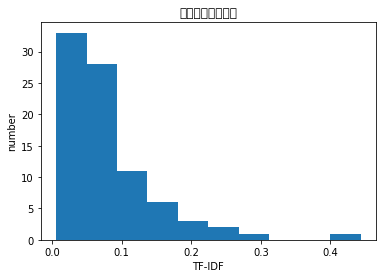

[('江阴', 0.3902452855526435), ('军事博物馆', 0.28202947106200993), ('炮台', 0.25512406858015946), ('鼻', 0.23999482398651306), ('鹅', 0.21079209561939713), ('两门', 0.17857675892088018), ('嘴', 0.17520316959194587), ('炮', 0.15748089644038876), ('炮团', 0.1472253933966197), ('拼过', 0.13729257899492792), ('镇航', 0.13729257899492792), ('在线听', 0.1314822550433152), ('大炮', 0.12913045233175843), ('江阴人', 0.12735976459323614), ('刺刀', 0.1128635011933513), ('百万雄师', 0.11046961247167565), ('渡江战役', 0.10503151781374458), ('还设', 0.10503151781374458), ('收费', 0.10193527299053746), ('历史', 0.09877426012837051), ('游击', 0.09801628093600075), ('炮筒', 0.09669256921897663), ('几门', 0.09400982368733664), ('吵起来', 0.09366450524114942), ('沧海一粟', 0.09299787238996779), ('小屁孩', 0.08655055369924716), ('横渡', 0.08356210280007849), ('渡江', 0.08274302146772905), ('做事', 0.0821198788535078), ('效率', 0.07973772162825436), ('巨坑', 0.0788613773942147), ('小男孩', 0.07815065213261724), ('对照', 0.07620828223954941), ('遗址', 0.07395526323212193), ('纪念地', 0

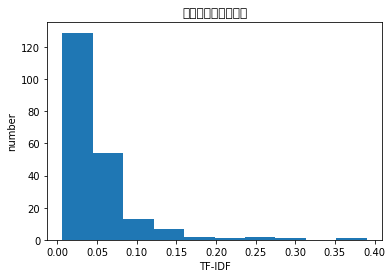

[('梓路', 0.7855319141412669), ('奇墅', 0.22875064308629298), ('寺', 0.20600883029185474), ('黟县', 0.1541400260293651), ('宏村', 0.15142378562746128), ('—', 0.1388555963658204), ('寺院', 0.1039563824765207), ('梓岭', 0.08423634105476321), ('寺庙', 0.07651265831014332), ('遗产地', 0.07358796275604162), ('843', 0.06954561234773086), ('逍遥自在', 0.05284511190916419), ('黄山市', 0.04952068248340491), ('奇伟', 0.04872843405201321), ('重建', 0.0472270998555795), ('深幽', 0.0452614088268118), ('Iphone5', 0.04211817052738161), ('东岔', 0.04211817052738161), ('偶寻至', 0.04211817052738161), ('唐风徽韵', 0.04211817052738161), ('因风而静', 0.04211817052738161), ('尖及', 0.04211817052738161), ('蕴华', 0.04211817052738161), ('高庵', 0.04211817052738161), ('居士', 0.04184327493195188), ('如云', 0.041659018822655554), ('信众', 0.039578259186175274), ('实相', 0.03927659570706334), ('禅修班', 0.03927659570706334), ('而响', 0.03927659570706334), ('融结', 0.03927659570706334), ('香火', 0.03817223922458028), ('藏式', 0.037862571199510794), ('阿菊', 0.037614380994183697), (

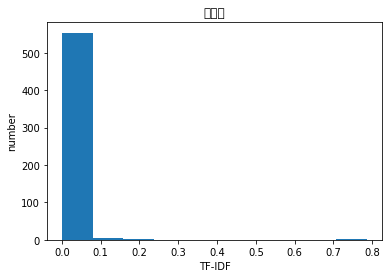

[('围龙屋', 0.41121551368279813), ('客家', 0.3496456397615247), ('围屋', 0.27307637266127954), ('围龙', 0.25738723086763854), ('兴宁市', 0.24305745535085488), ('客家人', 0.2360790682926887), ('遗制', 0.14410285367888986), ('六百人', 0.1343807067902036), ('灰沙', 0.1343807067902036), ('月光光', 0.12465855990151732), ('建筑', 0.1138027614834205), ('兴宁', 0.11046975133113238), ('童谣', 0.10708718986928319), ('没打', 0.10611948943035687), ('居住', 0.10505006229121472), ('磐安', 0.10436393953420715), ('集中反映', 0.10280387842069953), ('巷子', 0.10183288064865832), ('粘土', 0.09736504298059692), ('墙基', 0.09593742943392113), ('梅州', 0.09236228700936867), ('夯筑', 0.0920159461262173), ('秀才', 0.08764289609191066), ('郎', 0.08764289609191066), ('流派', 0.08281657129103946), ('体育中心', 0.08178981353074476), ('民居', 0.08007586171105407), ('半圆形', 0.07909571338233648), ('土楼', 0.07672120723620111), ('当前', 0.07509474314773988), ('采光', 0.07489146287797015), ('独具一格', 0.07469108671155011), ('卵石', 0.07410658159197846), ('其乐融融', 0.07240163701748184), ('最富',

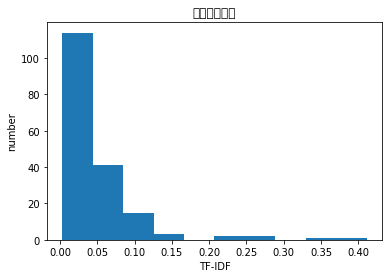

[('清华', 0.4551993733901052), ('校长', 0.2367023773518394), ('交大', 0.16150383890106543), ('梅贻琦', 0.15810000096164936), ('吴晗', 0.15314293855115776), ('梅', 0.1395382478398231), ('校园', 0.13264607500769127), ('之谓', 0.12629448028470489), ('大陆', 0.12005954833548024), ('新竹', 0.11678176232487579), ('清华大学', 0.10382422961245785), ('該', 0.10263541041727785), ('大學', 0.09911510016821042), ('、', 0.09721784042184811), ('储安平', 0.08851511875087888), ('叶笃正', 0.08851511875087888), ('周培源', 0.08851511875087888), ('息兵', 0.08851511875087888), ('校格', 0.08851511875087888), ('梅竹赛', 0.08851511875087888), ('由南迁', 0.08851511875087888), ('考進', 0.08851511875087888), ('赵九章', 0.08851511875087888), ('陈芳允', 0.08851511875087888), ('霹靂', 0.08851511875087888), ('非谓', 0.08851511875087888), ('判断', 0.08774269783151332), ('交清', 0.0825432940132289), ('吴宓', 0.0825432940132289), ('宋平', 0.0825432940132289), ('校务', 0.0825432940132289), ('梅竹会', 0.0825432940132289), ('清交', 0.0825432940132289), ('北大', 0.08209772538674975), ('统治', 0.08095

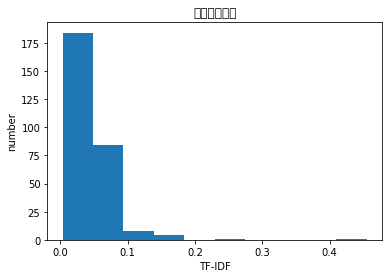

[('杨虎城', 0.6429464874438235), ('杨将军', 0.35891606512067703), ('蒲城县', 0.21997852058036715), ('槐院', 0.1738932194334208), ('纪念馆', 0.17387075659421522), ('故居', 0.15376618339114315), ('正院', 0.14095731701461475), ('将军', 0.12611998063880306), ('院落', 0.11487572729591095), ('两院', 0.10247507399615685), ('事迹', 0.10004698890155647), ('分正', 0.0869466097167104), ('张惠兰均', 0.0869466097167104), ('母孙', 0.0869466097167104), ('考院', 0.0869466097167104), ('谢宝贞', 0.0869466097167104), ('厢房', 0.08438556823374907), ('一莲', 0.0810806071389768), ('女厅', 0.0810806071389768), ('浦城', 0.0810806071389768), ('城东', 0.07951634615249747), ('图版', 0.077649215601869), ('长安县', 0.07178321302413541), ('巷', 0.06961043781172223), ('止园', 0.0683518214870276), ('偏院', 0.06746017094905547), ('传统式', 0.0666535749242909), ('1250', 0.061594168371321874), ('渭南市', 0.061181264392465996), ('东院', 0.059705737336867744), ('北朝南', 0.059054427372186226), ('风致', 0.057356180809449514), ('西院', 0.05638794284534802), ('西安事变', 0.05638794284534802), ('四进', 0

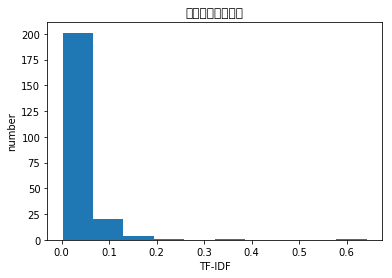

[('碧莲峰', 0.6383583388031648), ('阳朔', 0.4459220229921231), ('阳朔县', 0.1781492445113501), ('漓江', 0.1767013079450864), ('山水园', 0.16193576944748714), ('西街', 0.1338083850029405), ('含苞欲放', 0.12954861555798972), ('桂林', 0.12305904526169903), ('万古流芳', 0.10536055757529741), ('山水', 0.08890832263060647), ('鉴山', 0.08639825541618777), ('一朵', 0.08120555309029166), ('举世无双', 0.0778080022336066), ('碧莲', 0.07389681008008321), ('甲', 0.0730275022417945), ('桂林山水', 0.06990621125921509), ('甲天下', 0.0677859521627632), ('山河', 0.06270440263925112), ('字', 0.05922159484212327), ('少年', 0.05313712351213895), ('莲花', 0.04912167809938256), ('一带', 0.04831834395376971), ('上碧莲', 0.04632448904212002), ('恩率', 0.04632448904212002), ('王元仁', 0.04632448904212002), ('迎江阁', 0.04632448904212002), ('醉美之地', 0.04632448904212002), ('努力', 0.04582052504676236), ('电视塔', 0.04464667774740504), ('石刻', 0.04435532124264338), ('电视台', 0.04392824614421917), ('→', 0.04384736769540511), ('画窗', 0.043199127708093886), ('八扇', 0.040073766374067746), ('碑

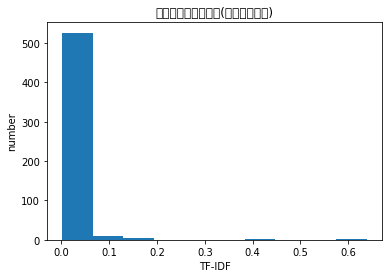

[('昭通', 0.6594601812185206), ('周五', 0.2533906404392429), ('闭馆', 0.22192037743645213), ('.........................', 0.2064105193279796), ('一查', 0.16970477520682745), ('市容', 0.16585752598163206), ('布展', 0.15722947549291277), ('抓紧时间', 0.14316541561773), ('放过', 0.14126817132782185), ('观摩', 0.13697856897668212), ('于是', 0.13566528515807846), ('好远', 0.12957134656110014), ('专程去', 0.12424028237268392), ('老城区', 0.11323230968821113), ('周一', 0.10781950003580505), ('偶然', 0.10369590520979186), ('公共设施', 0.10324321364971537), ('缺少', 0.10063021918369296), ('距离', 0.10032252183015958), ('城市', 0.09632861545844236), ('马上', 0.09432372486298374), ('不能', 0.09254806339330876), ('陈列', 0.09232300517164525), ('专业', 0.08824435212036474), ('外观', 0.08639888023327526), ('一定', 0.07483848192285744), ('得到', 0.07454774438530151), ('司机', 0.07331494809851052), ('终于', 0.0700191139408805), ('同时', 0.06709636964980248), ('旅行', 0.06653251785802358), ('打', 0.06179380038056704), ('休息', 0.0615744816509677), ('显得', 0.0613489552140

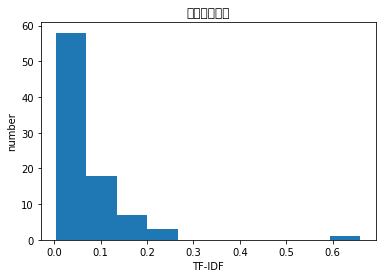

[('傣族', 0.3994578243546914), ('古镇', 0.3583070073645537), ('允', 0.2920956866159928), ('孟连', 0.2793291610938838), ('佛寺', 0.24855261309024168), ('土司', 0.22009119015607465), ('娜', 0.21225179100721323), ('上城', 0.17424916794813441), ('傣家', 0.16143571415369765), ('府', 0.15523542081742894), ('竹楼', 0.1534636797918168), ('宣抚司', 0.1396645805469419), ('傣味', 0.1168382746463971), ('上中下', 0.10259548706461236), ('很爱娜', 0.08458357646919552), ('宣撫', 0.07887699999405932), ('傣汉', 0.07553886674860714), ('象脚鼓', 0.06983229027347095), ('組合', 0.06746384704378693), ('下城', 0.06412571379833475), ('丽江', 0.06340390079191457), ('司署', 0.0628566144384876), ('方式', 0.06217338989530162), ('我個', 0.06034245325289457), ('臣子', 0.058769524226939505), ('星星', 0.05632279180096408), ('所谓', 0.05622836305288519), ('砖混', 0.055551580701186785), ('激活', 0.054855432444578286), ('云南', 0.054513361421353934), ('白哈巴', 0.05442202450540357), ('城', 0.053095999733112936), ('景洪', 0.053062947751803306), ('認為', 0.052542805358052065), ('传人', 0.0522

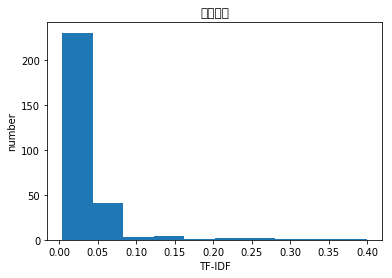

[('龙池', 0.7669536004159212), ('小龙', 0.31140695466307633), ('独库', 0.2568884972926739), ('池', 0.16268351105324125), ('库车', 0.13492988304493464), ('大小', 0.1316616238959851), ('天山', 0.12339400354744776), ('公路', 0.11846410228528576), ('湖水', 0.10261068262966853), ('217', 0.08374376931017906), ('国道', 0.06589956343735966), ('碧绿', 0.06476579337960435), ('大', 0.06410076574673475), ('布鲁克', 0.058447547754234754), ('高山', 0.05554038874366412), ('湖泊', 0.05512815822355528), ('停车', 0.054213624675164), ('天池', 0.047752527484286725), ('沿独库', 0.04449650723261648), ('雪山', 0.04219476410676549), ('路边', 0.04052139641795483), ('镶嵌', 0.038017498281388), ('水面', 0.03668266811455435), ('两个', 0.03595459446993798), ('云杉', 0.03580716434214492), ('碧蓝', 0.03441537233235277), ('库车县', 0.03338766361512141), ('深处', 0.032386831041242216), ('水质', 0.03196359811053128), ('绿草如茵', 0.03191497595474446), ('池水', 0.028763207402786393), ('巴音', 0.028009780825942375), ('路过', 0.027657764279805975), ('翡翠', 0.027143065641911057), ('白云', 0.

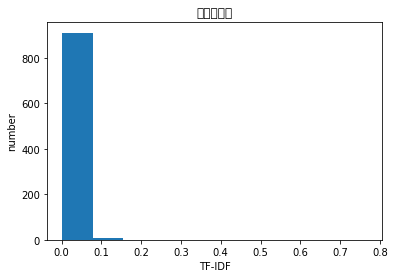

[('黑线', 0.3667371747450795), ('飞越', 0.3106801548894262), ('丛林', 0.2976464801574869), ('冒险', 0.2303420645801907), ('彩弹', 0.21175852465427988), ('难易', 0.20871481849003193), ('蓝线', 0.19729713797106774), ('旗山', 0.19551424939918008), ('CD', 0.16193865333934604), ('红线', 0.1525810184415511), ('乐不思蜀', 0.14701163902170072), ('三家', 0.13892650683270094), ('飞跃', 0.13835434394913873), ('线路', 0.137227873517315), ('最难', 0.13566940858423437), ('挑战性', 0.12781366414367715), ('依据', 0.12419108115981096), ('保障', 0.12130535397298182), ('多家', 0.1196985923312787), ('顶级', 0.11951596517855824), ('尤', 0.11879809583479722), ('标记', 0.11433857969477393), ('等级', 0.11419006414486813), ('法国', 0.11066545577601855), ('真人', 0.1063336008327744), ('以', 0.10588032844633123), ('度假区', 0.10353998679323316), ('贯穿', 0.09835878615964357), ('全世界', 0.09519054175650044), ('树上', 0.09424947467619572), ('800', 0.09370755946626864), ('黑色', 0.09177095064418177), ('温泉', 0.08866857229613975), ('游戏', 0.08602322149670366), ('多种', 0.081014700

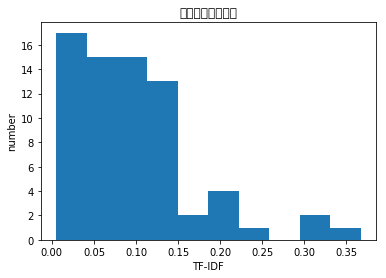

[('石林', 0.6101661720165625), ('怪', 0.2375018695617375), ('西岭雪山', 0.21149179083568798), ('怪石', 0.18095904328439447), ('众石', 0.1649838455493754), ('乱离', 0.15385292662763353), ('紧裹', 0.15385292662763353), ('次地', 0.14734175645984698), ('方园', 0.1264771926870134), ('暗洞', 0.12379455107195356), ('翠林', 0.11948662806778519), ('几百亩', 0.1177005088117983), ('群群', 0.11329345881676381), ('此图', 0.11329345881676381), ('云南', 0.10633061850243937), ('奇缘', 0.10315616739774035), ('地洞', 0.10153271322846981), ('石海', 0.09722479022430146), ('重峦叠嶂', 0.0969903550895003), ('宜宾', 0.09461497649610212), ('悬念', 0.09383147859438706), ('莽莽', 0.0907136200565149), ('卡斯特', 0.09009590845770371), ('云杉', 0.08851037289289669), ('搞不清楚', 0.08783837017707379), ('若有', 0.08495449132293342), ('苔藓', 0.0791938559494363), ('前山', 0.07888941988342474), ('不同', 0.07729833920637535), ('千奇百怪', 0.07393394068119984), ('怪石嶙峋', 0.0717136643309074), ('洞里', 0.07037275013295113), ('石头', 0.0688164167184486), ('吃力', 0.06798628522808127), ('低矮', 0.067

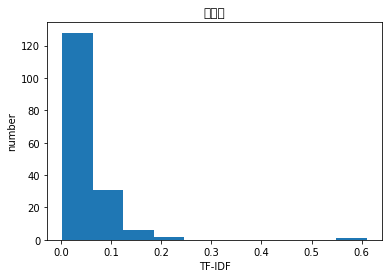

[('朝阳', 0.470186008992067), ('悬空寺', 0.42969636427699764), ('据明', 0.23940253777038167), ('殷纣王', 0.2232508337734963), ('采暖', 0.2232508337734963), ('淇县', 0.2070991297766109), ('山原', 0.18820284745475901), ('武定', 0.17963413078464885), ('殷', 0.1747957217828402), ('空中楼阁', 0.17338304786023814), ('东魏', 0.1707912699730156), ('七大', 0.1314041604803004), ('志', 0.12158198266474586), ('寺', 0.11709681630856905), ('而生', 0.11559430099931294), ('行宫', 0.10912145275363104), ('凌空', 0.10835177599730769), ('七年', 0.10777023464667292), ('故称', 0.10173248805703558), ('气势雄伟', 0.10031981413443353), ('飞檐', 0.0977814199664546), ('古刹', 0.0965835123868042), ('绝壁', 0.09262452787581134), ('设', 0.09174193067299417), ('故宫', 0.09105114998343611), ('创建', 0.08924149911302114), ('金碧辉煌', 0.08664972122579859), ('遥望', 0.08139044649783946), (';', 0.08010413854246841), ('依山', 0.0747001121511699), ('寺院', 0.07386189105165379), ('记载', 0.07182797191925229), ('半山腰', 0.07056440469050788), ('冬季', 0.06422939276636296), ('千年', 0.06182499542

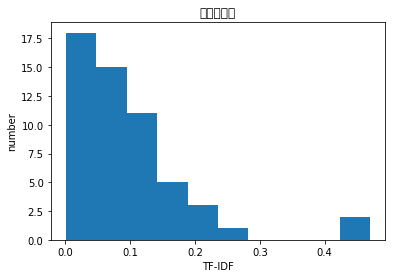

[('是友', 0.32624121937716755), ('多克', 0.3042307943581272), ('陈列馆', 0.25960460591511814), ('黄金', 0.2417275461450561), ('国货', 0.23819951930100627), ('罗马柱', 0.21521196084654043), ('重见天日', 0.21521196084654043), ('民国', 0.20457356113635758), ('修葺一新', 0.18370757425158896), ('罗马', 0.17024314993459252), ('展览厅', 0.1658864201053501), ('之风', 0.1637227496849013), ('虽不大', 0.15996150790763905), ('建筑', 0.14722480992667314), ('中山路', 0.1450157508465532), ('发掘', 0.1325296720298923), ('长沙', 0.13203515632467322), ('重视', 0.12693060430433586), ('电梯', 0.12547238983509174), ('柱子', 0.12305811774494721), ('根', 0.12300532582751288), ('遮挡', 0.12274267477654162), ('模型', 0.11417493318474192), ('原貌', 0.11261612545277991), ('阿', 0.11254015811745016), ('展厅', 0.10471195341770356), ('展品', 0.1037195498059689), ('2000', 0.09947575784689547), ('好找', 0.09620562084202115), ('装饰', 0.09198527346017529), ('16', 0.08917432935683837), ('气派', 0.08838446920790714), ('相', 0.08467391137048974), ('雄伟', 0.08302935640773461), ('进门', 0.082

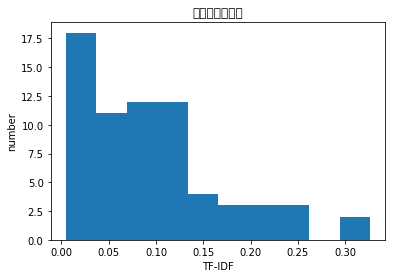

[('恐龙', 0.7334418244703009), ('昌吉', 0.34207635958730365), ('化石', 0.3056616170985663), ('门溪龙', 0.1505543080463706), ('中加', 0.1454480838312434), ('馆', 0.11771127707740761), ('龙', 0.09487278017735765), ('亚洲', 0.09132570766548702), ('蜥脚类', 0.08502708495149096), ('第一具', 0.07887556343355633), ('奇台县', 0.07689521583062901), ('三楼', 0.07565999073121282), ('奇台', 0.07390910225790856), ('出土', 0.07337709154488478), ('我区', 0.0727240419156217), ('体长', 0.07074369431269441), ('将军庙', 0.06841527191746073), ('序言', 0.06841527191746073), ('互动', 0.06772468456875104), ('准噶尔盆地', 0.06603449084771593), ('悉尼歌剧院', 0.06603449084771593), ('区', 0.06463404766546316), ('马', 0.05838171698381637), ('45', 0.05488726537412838), ('吐鲁番', 0.054842241866454124), ('澳大利亚', 0.051962414229813285), ('博物馆', 0.05070045027784493), ('加拿大', 0.050220475262318535), ('人必', 0.050046454596776827), ('拜托', 0.04891541006084941), ('骨架', 0.047711406766679364), ('分类', 0.044381950350358516), ('真是假', 0.04429139069122695), ('该馆', 0.04415726063802861),

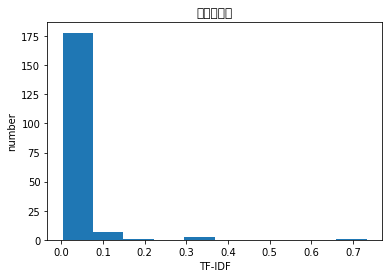

[('史前', 0.4124010097871542), ('卑南', 0.4048856830981493), ('自然史', 0.21405419149204405), ('台灣', 0.1733981568333806), ('博物', 0.16504651512216587), ('博物馆', 0.1646580705681277), ('遺址', 0.15716926630300906), ('台湾', 0.15094652313361828), ('国立', 0.12970103862366386), ('文化公园', 0.12843384757703855), ('俾南', 0.126907523949039), ('南島', 0.126907523949039), ('展覽著', 0.126907523949039), ('館路', 0.126907523949039), ('三大主題', 0.11834548955753846), ('农会', 0.11834548955753846), ('史前史', 0.11834548955753846), ('該館', 0.11834548955753846), ('台东人', 0.11333702050862575), ('東市', 0.11333702050862575), ('館', 0.1130694408146065), ('太麻里', 0.10702709574602202), ('台東縣', 0.1047749861171252), ('自费', 0.103895752123594), ('並非', 0.10122142077453733), ('的點', 0.10122142077453733), ('分為', 0.09522423181864036), ('吹冷气', 0.09120448267671194), ('種類', 0.09120448267671194), ('適', 0.08930035111682018), ('遺跡', 0.08817663090919534), ('950', 0.08619601362779922), ('分別', 0.08531332359550063), ('來', 0.08085061125108413), ('號', 0.07858463315

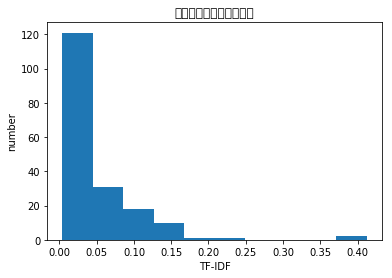

[('打球', 0.4445033013048283), ('两杆', 0.35967844346191613), ('高尔夫球', 0.2733569606261052), ('拍外景', 0.2340929886952227), ('上个月', 0.2325113932732474), ('球场', 0.22442880131182263), ('高尔夫球场', 0.22047229862340814), ('枯', 0.19949986387288812), ('干枯', 0.19915102267380544), ('建得', 0.1912652998628475), ('老外', 0.15749050989081145), ('城内', 0.15026296498080588), ('看好', 0.14802416554628334), ('东方', 0.14130051773897717), ('下雪', 0.13948711625446492), ('消费', 0.11686210144281085), ('满好', 0.11399648408525163), ('地上', 0.11377378044809054), ('不行', 0.10156588619072564), ('力', 0.09754623386309338), ('大学', 0.096536957702388), ('早', 0.08602304568003577), ('打', 0.08280464846791306), ('冬天', 0.08050979915196406), ('找到', 0.0795151607266809), ('经常', 0.07340063774109502), ('过来', 0.07119290960915607), ('很棒', 0.07102601955447546), ('新', 0.07029489511043684), ('挺不错', 0.0679026658803294), ('夏天', 0.06268355057148277), ('不少', 0.05952432966266123), ('哈哈', 0.05847950301126928), ('比较', 0.0563383917531721), ('.', 0.056098609565

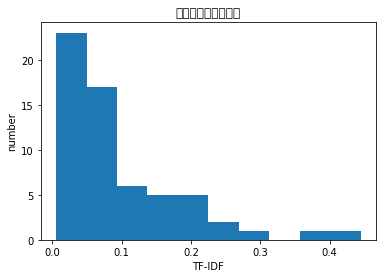

[('齐云山', 0.41501322627624365), ('海拨', 0.21122121478013972), ('2061', 0.20970708825141118), ('思顺', 0.20970708825141118), ('拨高快', 0.20970708825141118), ('10.14', 0.19555883883421324), ('上犹', 0.1872826434743025), ('崇义', 0.1814105894170153), ('桂东', 0.1699879306115419), ('日有', 0.1507099492799959), ('酸枣', 0.1457066054429688), ('约伴', 0.1432040947486474), ('五指峰', 0.13545810086783597), ('武功山', 0.13545810086783597), ('上火', 0.13200698088192817), ('五小时', 0.13026877297167266), ('三县', 0.12828550450288717), ('可带', 0.12682691205114088), ('驴友', 0.12528727498061012), ('草原', 0.12438738802429164), ('珠三角', 0.12000930914297643), ('详情', 0.10452011376266654), ('星期六', 0.10359739805041186), ('山下', 0.10285128160352824), ('留宿', 0.09835520519443007), ('糕', 0.09792365404003903), ('可', 0.09785128884094849), ('金顶', 0.0953588277873694), ('较差', 0.09146235797287192), ('上山', 0.09056375432394051), ('徒步', 0.09013844149130666), ('700', 0.08433822059792156), ('温差', 0.08394693176056427), ('湖南', 0.07972213963615998), ('干粮', 0.

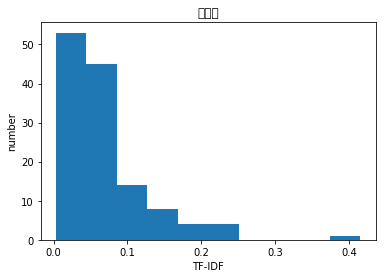

[('柯坪', 0.8200066550024642), ('出生', 0.40428052899050393), ('长大', 0.30976934286243), ('～', 0.1762636671799041), ('美丽', 0.14911233691004402), ('这里', 0.09772769685728842), ('我', 0.05731026431599881), ('在', 0.045285266234441394)]
defaultdict(<class 'float'>, {'在': 0.045285266234441394, '我': 0.05731026431599881, '这里': 0.09772769685728842, '～': 0.1762636671799041, '美丽': 0.14911233691004402, '出生': 0.40428052899050393, '长大': 0.30976934286243, '柯坪': 0.8200066550024642})
[0.045285266234441394, 0.05731026431599881, 0.09772769685728842, 0.1762636671799041, 0.14911233691004402, 0.40428052899050393, 0.30976934286243, 0.8200066550024642]


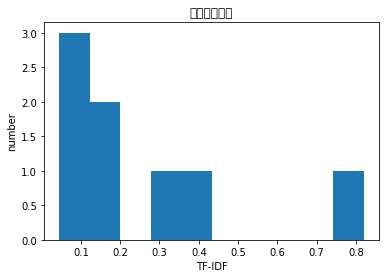

[('向日葵', 0.5644343338564705), ('校区', 0.3900056928050154), ('浙江工业大学', 0.32025782010700826), ('浙工大', 0.2562062560856066), ('朝晖', 0.19810708593391), ('小和山', 0.17825272513590873), ('母校', 0.1621925234962242), ('屏峰', 0.15796375503950325), ('工大', 0.15081299724516845), ('大学', 0.10883009471960978), ('浙江', 0.09522613861671674), ('杭州', 0.087226106410812), ('学校', 0.07652981517917613), ('浙大', 0.062138174934650674), ('浙江省人民政府', 0.05941757504530291), ('高校', 0.059045467741172544), ('！', 0.058858448416536674), ('年', 0.05741238681548578), ('首批', 0.05524674791772984), ('共建', 0.05452937212327016), ('月', 0.05241190716050851), ('校园', 0.05146504429651869), ('牵头', 0.048331602480817214), ('协同', 0.04716597460749645), ('入选', 0.047149936532053655), ('之江', 0.044916512041686965), ('化工', 0.04402379687420222), ('1953', 0.040001974227665195), ('工业', 0.03966077336820259), ('1960', 0.03914369055044401), ('行列', 0.038752618084871564), ('大片', 0.036935432123954795), ('种', 0.03689172665290376), ('西溪', 0.036568592578998096), 

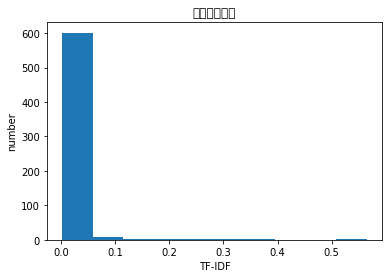

[('石狮', 0.7884317688127344), ('一楼', 0.517832041393635), ('博物馆', 0.28810451035528517), ('"', 0.16489582632103741), ('的', 0.0055209064262443765)]
defaultdict(<class 'float'>, {'的': 0.0055209064262443765, '"': 0.16489582632103741, '一楼': 0.517832041393635, '博物馆': 0.28810451035528517, '石狮': 0.7884317688127344})
[0.0055209064262443765, 0.16489582632103741, 0.517832041393635, 0.28810451035528517, 0.7884317688127344]


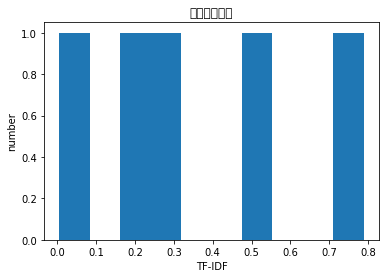

[('大佛', 0.7841040480317684), ('乐山', 0.5524925128972704), ('佛', 0.06707068194458882), ('三江', 0.064650085531223), ('岷江', 0.06448920473940264), ('凌云', 0.06186573612848599), ('排队', 0.04515949801687906), ('乐山市', 0.04431875680385034), ('青衣江', 0.043818832348550864), ('佛像', 0.041700451800910684), ('大渡河', 0.04109744366336595), ('栈道', 0.04084977006807962), ('壮观', 0.03476994217507984), ('坐船', 0.031951724174955634), ('震撼', 0.03140401663064222), ('71', 0.03121427540007574), ('看', 0.029700015861178056), ('佛是', 0.029322941977560787), ('一尊', 0.029280010257294573), ('脚下', 0.028641218149064625), ('成都', 0.028381222479485917), ('汇流处', 0.028128798219787185), ('弥勒佛', 0.026785377640764448), ('古人', 0.02561719196918109), ('峨眉山', 0.025502643473238818), (' ', 0.02508327862093121), ('导游', 0.024514690747389607), ('！', 0.023450438603206298), ('了', 0.02307950906201588), ('到', 0.022697351391714037), ('去', 0.022300994129129236), ('石刻', 0.022186787165572028), ('90', 0.02129171800934666), ('景区', 0.02085567980365203), ('

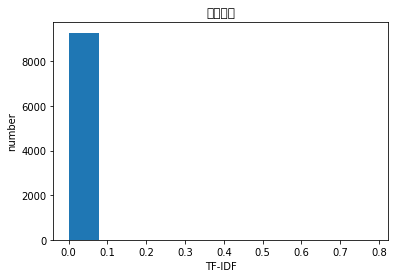

[('峪口', 0.48739779146633666), ('秦岭', 0.468087186673674), ('沣', 0.37174361277745693), ('丰裕', 0.2943387502436767), ('西安', 0.20438409595487722), ('峪', 0.16369569756739996), ('烧烤', 0.14281733517027126), ('农家乐', 0.13695815721744742), ('口', 0.0901818984871361), ('夏天', 0.07927487767962911), ('周末', 0.07715799900513548), ('避暑', 0.06883500625929077), ('滦镇', 0.06362651417711185), ('郊游', 0.06164745139533566), (' ', 0.056961906818266274), ('有山有水', 0.05647079555709148), ('长安区', 0.051755248983210565), ('西安市', 0.05110510654907796), ('骑车', 0.050656707704054386), ('东佛沟', 0.0490340027982871), ('西沣', 0.0490340027982871), ('黎元坪', 0.0490340027982871), ('210', 0.04882305996567596), ('一钻', 0.04572583945818084), ('进山', 0.04532223465269239), ('好去处', 0.045190028885072626), ('72', 0.043465675112985956), ('自助', 0.04284130216083306), ('沟', 0.04253175395453762), ('净业', 0.042417676118074565), ('、', 0.0416152110260501), ('骑行', 0.04159299780128505), ('去', 0.04136746619509926), ('国道', 0.040344232477255285), ('王村', 0.039

[0.056961906818266274, 0.03296214296713055, 0.0019298232721898438, 0.0019409458065301798, 0.025204904137798384, 0.0416152110260501, 0.0162283124544438, 0.0026285048722734052, 0.0025560048840235082, 0.01714231792586333, 0.005321890719654217, 0.0029735021486916847, 0.006942721987541321, 0.0032594817302142513, 0.007186711575905398, 0.009299835984626253, 0.0064497280688092995, 0.008819064672364374, 0.0023690129595183586, 0.007531591291549701, 0.0034217937198025724, 0.015459311177021037, 0.01651493492252147, 0.00393007252379042, 0.004083803004824179, 0.0038011966855986405, 0.01328070608163388, 0.01542922691429072, 0.009601458003499357, 0.02563133072537375, 0.015432709047168898, 0.009886338168702677, 0.012320407589718712, 0.007088211561496259, 0.038113470004454586, 0.015432668879251805, 0.0055354772119822334, 0.0050665543796558936, 0.0033342555370213865, 0.0029898833919299954, 0.0029224980252144216, 0.007428821156211635, 0.009867231001610612, 0.006012207398431705, 0.005558293999084674, 0.008

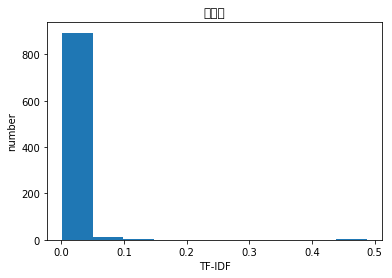

[('饭庄', 0.2591844381376413), ('北海公园', 0.2591844381376413), ('仿膳', 0.2120542084723771), ('漪澜', 0.19671255554930403), ('应当', 0.189791528080404), ('复原', 0.1818693089135895), ('腾退', 0.17876397223115034), ('伴以', 0.17643199352828293), ('令人讨厌', 0.16468742514902937), ('商榷', 0.15139030108872562), ('音量', 0.14808066638500425), ('笔墨纸砚', 0.14574868768213683), ('解说', 0.1450315683022835), ('布置', 0.14119672869890437), ('平面图', 0.1408097785841888), ('风骚', 0.13910637472592738), ('乾隆帝', 0.13013208306685053), ('仿品', 0.12256803433660297), ('器物', 0.11850031674183248), ('引领', 0.11506538183599073), ('布展', 0.11233582881928268), ('开放', 0.11005246440679764), ('乾隆皇帝', 0.10947223811438718), ('颐和园', 0.10627630737986779), ('北海', 0.10252168959741799), ('少量', 0.10144927717181686), ('仿照', 0.09774031373810024), ('书画', 0.09675095007942706), ('在意', 0.09657026885898545), ('帝王', 0.09495144539432628), ('应有', 0.09308141595670824), ('老太太', 0.0924251917311285), ('知', 0.09107459165586819), ('原以为', 0.09093465445679474), ('乾隆', 0.0

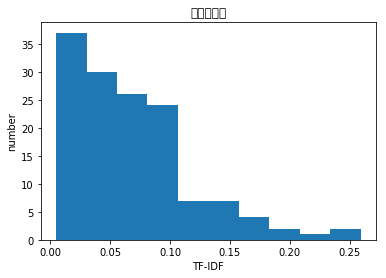

[('汤泉', 0.3547470559017419), ('茗', 0.32383644243874415), ('温泉', 0.28154521408042665), ('阳', 0.26722333601839615), ('泉池', 0.2662530379298028), ('商城县', 0.26045084505327826), ('信阳', 0.16539776905964493), ('汤', 0.16255576268597746), ('三省', 0.1390250011397771), ('温泉水', 0.1304509759233952), ('车程', 0.1173839770417332), ('湖北', 0.09732558296954195), ('安徽', 0.09651709155780752), ('河南', 0.09429167914052214), ('交界处', 0.0872778080915261), ('疗养', 0.08629598089191022), ('泡温泉', 0.07729773673805652), ('水塔', 0.07529913964373082), ('休嫌', 0.06021521513629959), ('储于', 0.06021521513629959), ('加热器', 0.06021521513629959), ('增食', 0.06021521513629959), ('懊苦', 0.06021521513629959), ('扬汤', 0.06021521513629959), ('故教', 0.06021521513629959), ('暖玉起', 0.06021521513629959), ('气绕', 0.06021521513629959), ('沸沸', 0.06021521513629959), ('流别', 0.06021521513629959), ('火云疑', 0.06021521513629959), ('筑井修', 0.06021521513629959), ('蒸烟', 0.06021521513629959), ('郁浮', 0.06021521513629959), ('、', 0.060123197634065206), ('水温', 0.05844

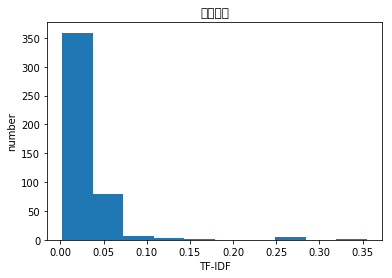

[('雪海', 0.4968098836047106), ('梅花', 0.464610127289775), ('光福镇', 0.28959706889850706), ('光福香', 0.2453293588718042), ('苏州', 0.24475073885384266), ('香', 0.12446253897989135), ('司徒', 0.1204362816928207), ('景区', 0.1028917036926012), ('观音寺', 0.1028596850928561), ('清墨', 0.08769279844075722), ('象雪', 0.08769279844075722), ('开滿', 0.08177645295726807), ('赞过', 0.0758601074737789), ('邓尉', 0.0758601074737789), ('韩雪', 0.07395546964358377), ('花期', 0.07319108674882503), ('铜', 0.07187093437279288), ('树头', 0.06994376199028973), ('氤', 0.06803912416009462), ('每年', 0.06742605423822758), ('绿梅', 0.0664829217411376), ('天外飞仙', 0.06516717134360149), ('快过', 0.06457828391094249), ('喜洋洋', 0.06092984309275592), ('饰演', 0.05811107102331141), ('月初', 0.057125501248405874), ('吴中区', 0.057105736008496305), ('鹅黄', 0.0562064331931163), ('开', 0.05593824297225505), ('洞天福地', 0.05318340594976462), ('交通状况', 0.05288904980468638), ('初春时节', 0.052465715991992), ('季节', 0.05173589265167257), ('梅林', 0.05155265736011462), ('辅以', 0.051308

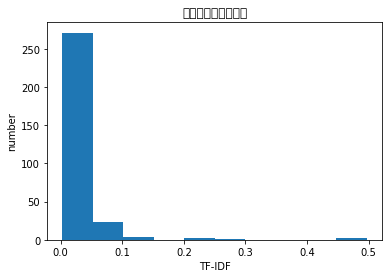

[('西禅寺', 0.6332419375143855), ('福州', 0.3019313204420076), ('古寺', 0.19838803668614893), ('福州大学', 0.18055492595621245), ('寺庙', 0.1707548553778501), ('大禅林', 0.1679354357716928), ('荔树', 0.1542717040468638), ('西禅', 0.1542717040468638), ('四朝传', 0.14024700367896709), ('唐音', 0.1343116462795848), ('怡山', 0.13010044318651667), ('周莲', 0.12622230331107037), ('联句', 0.11174857720842096), ('古刹', 0.10314600657810051), ('香火', 0.09995598797787354), ('点明', 0.09802788767282494), ('之麓', 0.09727485110577158), ('名列', 0.09262203297384064), ('福大', 0.08276080987142649), ('西郊', 0.08060864765889665), ('楹联', 0.0757397176802104), ('撰写', 0.0726146936450707), ('钟声', 0.0700443393029692), ('荔枝', 0.06997094688117045), ('镌刻', 0.06945161086241548), ('五', 0.06531715779295315), ('柱', 0.06402855097319154), ('工业', 0.06368343156861027), ('响', 0.06290939381626133), ('千古', 0.06083445600557364), ('宋代', 0.0607476476071831), ('塔', 0.06069142238857497), ('寺院', 0.060320408888311604), ('坊', 0.05939244401763117), ('唐朝', 0.05887574122898

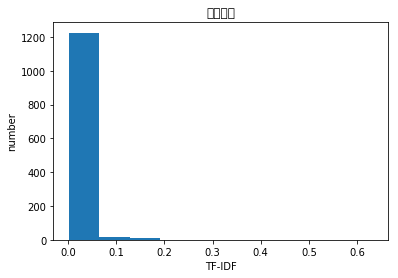

[('佛学院', 0.7035511798394938), ('色达', 0.29593675886268955), ('五明', 0.27734092795412774), ('红房子', 0.252641962507164), ('喇荣', 0.15438049074667354), ('震撼', 0.14364987404915308), ('红色', 0.13305325461524445), ('喇嘛', 0.12110822159904552), ('觉姆', 0.11865617020717836), ('信仰', 0.10932233440570568), ('色达县', 0.10826611959783464), ('达', 0.07658214961397135), ('密密麻麻', 0.07419459423799799), ('天葬', 0.06635664086987879), ('学院', 0.06498722807680522), ('喇荣寺', 0.06230920515587356), ('虔诚', 0.058636547154996034), ('僧舍', 0.05373626465963144), ('房子', 0.049357403599407615), ('色', 0.0475430516200663), ('壮观', 0.04557966041953351), ('坛', 0.04549765027679553), ('修行', 0.044527826657087946), ('心灵', 0.04240683910376022), ('漫山遍野', 0.040923054276035244), ('高反', 0.03989224695284733), ('你', 0.03802383494261707), ('修行者', 0.037611132399223916), ('绛红色', 0.037173365325367684), ('佛国', 0.03520849119189856), (' ', 0.03462138099696325), ('我', 0.03384572954882058), ('经堂', 0.033648099905367095), ('了', 0.0336369570411285), ('世界', 0

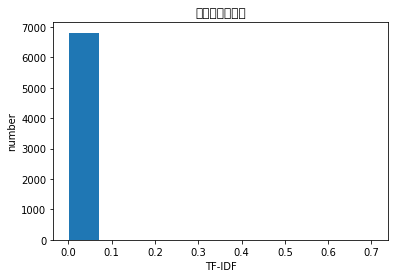

[('东湾', 0.7140629162294665), ('几百米', 0.37086650246832636), ('泳场', 0.3151867123353123), ('中段', 0.19621727607522851), ('锁', 0.19408899944773345), ('五分钟', 0.19331396175474885), ('一段距离', 0.18144664580044928), ('顾名思义', 0.1606886654986144), ('通往', 0.13674868125306922), ('情侣', 0.1345167612238294), ('路', 0.11672829862741968), ('不用', 0.08364745502246666), ('完', 0.07472839093992413), ('叫', 0.070987262443455), ('只有', 0.06273766304800302), ('真的', 0.04815204945755961), ('走', 0.042069737243394405), ('不过', 0.03953056687143724), ('景点', 0.038878184833416), ('就是', 0.025868903210758014), ('一个', 0.020868631007692602), ('也', 0.017178075957053424), ('有', 0.012613276873806494), ('在', 0.010870387494438805), ('。', 0.010177304229885305), ('的', 0.003604363838465106), ('，', 0.0032523148456622426)]
defaultdict(<class 'float'>, {'。': 0.010177304229885305, '一个': 0.020868631007692602, '不用': 0.08364745502246666, '也': 0.017178075957053424, '只有': 0.06273766304800302, '在': 0.010870387494438805, '就是': 0.025868903210758014

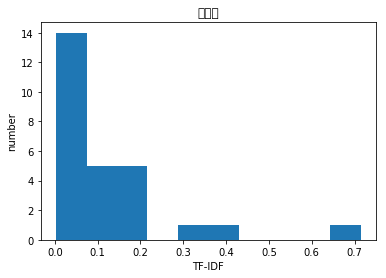

[('嗡嗡', 0.3869476555846366), ('几小时', 0.36266214490491727), ('开通', 0.2667818838011184), ('闹', 0.264968555791367), ('奇景', 0.26425669310723765), ('那会', 0.24446308726906357), ('设施', 0.22592128724377064), ('十一', 0.17891237073876562), ('人太多', 0.17340289215729937), ('感叹', 0.16945427916881886), ('路程', 0.16534381801652986), ('全部', 0.14775709573962684), ('神奇', 0.14711275827125658), ('服务', 0.13837614272816356), ('必要', 0.13035399765374622), ('挺', 0.1223158510217538), ('才能', 0.12147012164215804), ('真心', 0.11745258030631216), ('自然', 0.10561948681273522), ('基本', 0.1041290667040069), ('开发', 0.10339065946412622), ('完全', 0.10152679935413328), ('里面', 0.09915736643259164), ('可惜', 0.09834678624178572), ('当地', 0.09182965625008083), ('可能', 0.08926020533114534), ('东西', 0.0886415625268752), ('一些', 0.0750116040391964), ('觉得', 0.07147296337239771), ('有点', 0.07107098789544407), ('知道', 0.07029397779372104), ('让', 0.06809841806076944), ('好', 0.066015607940916), ('真的', 0.06558944197267746), ('一般', 0.0655402047182190

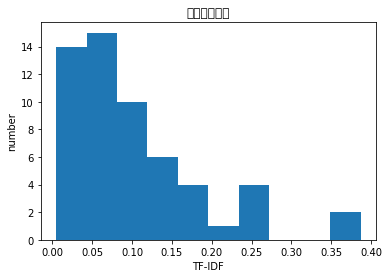

[('塔尔寺', 0.5319863959983964), ('金瓦寺', 0.49503479381910265), ('宗喀巴', 0.27390899893672843), ('大金瓦殿', 0.23717451548973553), ('菩提树', 0.18270833514384868), ('大师', 0.1809819521943126), ('黄金', 0.09422388315166427), ('之宝', 0.09294470300419105), ('大经堂', 0.08214205411018227), ('磕长头', 0.07712335325194773), ('在世', 0.07690808453380449), ('铜像', 0.07544132387925781), ('信徒', 0.0728691468122206), ('寺庙', 0.07219173855661322), ('磕头', 0.06865288226312118), ('塔', 0.06842431957806311), ('磕', 0.06645106163887184), ('时所铸', 0.06358339176496747), ('脐带血', 0.06358339176496747), ('鎏顶', 0.06358339176496747), ('虔诚', 0.06310146094077412), ('寺', 0.062199948380825446), ('化身', 0.06007335647805402), ('金顶', 0.057825777430883504), ('做瓦', 0.05678427844331662), ('封赐', 0.05500386597990029), ('树外', 0.05500386597990029), ('1606', 0.05362287078438845), ('鱼贯而行', 0.05362287078438845), ('包裹', 0.05306863990203476), ('宝塔', 0.052883434861101274), ('出生', 0.04864451973308622), ('光可鉴人', 0.048204752658249445), ('八次', 0.047709382776028375)

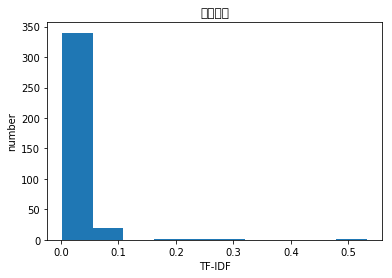

[('波密', 0.8144286747645294), ('广场', 0.31202356149571514), ('波密县', 0.2704595771390489), ('锅庄', 0.14823056704358012), ('跳', 0.1149063045674338), ('舞', 0.09049569816153531), ('雪山', 0.0890961382830441), ('墨脱', 0.08093103658281761), ('县城', 0.06775151372720417), ('晚上', 0.06224720731245379), ('邮戳', 0.05393682154291209), ('波蜜', 0.04779133306015943), ('跳舞', 0.04476089953172318), ('邮局', 0.04267415580063585), ('藏族', 0.03781903141265771), ('城', 0.03753248782532543), ('八宿', 0.0365613078754692), ('318', 0.03498383254602032), ('八一镇', 0.03260446849104781), ('小苹果', 0.03163596812460014), ('冰川', 0.03112845587280435), ('！', 0.030999917622315867), ('搭车', 0.03077285434192589), ('热闹', 0.02986957554094597), ('农贸市场', 0.028277151512819027), (' ', 0.027589366005413157), ('圈圈', 0.027285232049918777), ('小城', 0.026988640787065803), ('森林', 0.026123727484243204), ('城真得', 0.025624465146768007), ('波墨', 0.025624465146768007), ('用够', 0.025624465146768007), ('至然', 0.025624465146768007), ('国道', 0.025299979279423162), ('海拔'

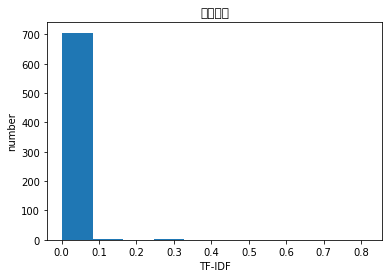

[('兰屿', 0.6712939357711593), ('猫头鹰', 0.32251142937714766), ('文物', 0.31207740345676455), ('馆', 0.19337468248806577), ('馆分', 0.1892646081351981), ('一层', 0.13002428429867766), ('送人', 0.1241463738017576), ('花花绿绿', 0.12266509324621769), ('用过', 0.11388097720828798), ('历史博物馆', 0.11017431311549189), ('一些', 0.10838067172889795), ('旅游者', 0.1042418873759168), ('劳动', 0.09708377983300298), ('出售', 0.09229904360442581), ('做成', 0.0914890038361152), ('再现', 0.09134458176001531), ('二层', 0.08574310057177943), ('两层', 0.08355745351665074), ('物品', 0.07891046969523255), ('生活', 0.07837828927352872), ('相当于', 0.07598620441841203), ('纪念品', 0.07163583534716333), ('别致', 0.07117630463822254), ('没见', 0.07084888370847348), ('上下', 0.06864442652225682), ('使用', 0.06850339918052416), ('看出', 0.06840516479931256), ('外观', 0.06776932000533695), ('做', 0.06630729605058147), ('到底', 0.06526927621837018), ('严重', 0.061032673242008485), ('内容', 0.0608370036478382), ('场景', 0.05982251730858258), ('图片', 0.0562347328361882), ('古代', 0.055

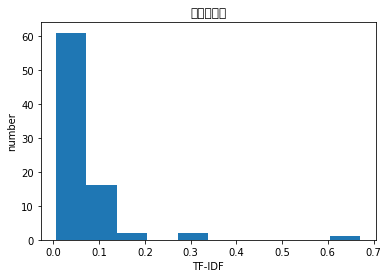

[('游泳馆', 0.39627376054410574), ('必然', 0.3906847332687181), ('固路', 0.32618417373982933), ('啦', 0.21158287616512358), ('恒温', 0.20566798628484548), ('168', 0.18224541899903288), ('南昌', 0.1787071174757007), ('水温', 0.17724092018534768), ('泳池', 0.17498024088631367), ('疗养', 0.17447834673507653), ('东湖', 0.17253876146486952), ('拿来', 0.1634301201829866), ('浴场', 0.1563848817707109), ('培训', 0.1531421303067412), ('团购', 0.12616351479331558), ('泉水', 0.12060425057762854), ('标准', 0.11736224782359614), ('门票价格', 0.1168331181263211), ('室内', 0.11627941552766588), ('评论', 0.11485404774133125), ('子', 0.11274451610445982), ('水中', 0.11216409104406684), ('游泳', 0.1061169429421313), ('挺好玩', 0.10424855864192284), ('馆', 0.09430475295884014), ('均', 0.09257108009801387), ('一位', 0.08008248568121615), ('娱乐', 0.07917192548928147), ('像是', 0.07457738224219623), ('三个', 0.07278340549766431), ('天', 0.06848964911187856), ('价格', 0.06621319909789526), ('很多', 0.06545235240704676), ('那种', 0.06327173201531502), ('贵', 0.060373622371

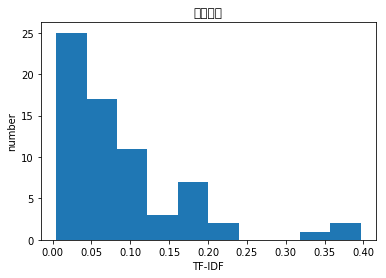

[('尼玛', 0.4524338835126087), ('青海湖', 0.41398864832764043), ('牧场', 0.30974388909067146), ('电热毯', 0.21138738151511224), ('黑马河', 0.16104732355980764), ('床铺', 0.1409249210100748), ('彭毛家', 0.12260639963382039), ('湖边', 0.12044813541463402), ('住', 0.10004512220673195), ('帐篷', 0.09763804821443901), ('日出', 0.0924807646768193), ('家', 0.09165163873514445), ('茅坑', 0.09111252457243693), ('住宿', 0.08943423155329909), ('饭菜', 0.08584738500162761), ('洗澡', 0.0718248971267492), ('藏民', 0.07066748138945145), ('包车', 0.06694430009184187), ('铁皮', 0.06587819828264041), ('床位', 0.06321525684253625), ('老板', 0.062441182256249894), ('15109768292', 0.061303199816910195), ('姚师傅', 0.061303199816910195), ('接水到', 0.061303199816910195), ('不惯', 0.06037261131849707), ('洗漱', 0.05879530518641431), ('老子', 0.05851449789312337), ('家烧', 0.05716727399621428), ('老腰', 0.05716727399621428), ('标间', 0.055796179280136346), ('我们', 0.05517722191388156), ('~', 0.05494649213173227), ('乡有', 0.0547479124853428), ('听魏', 0.0547479124853428), ('

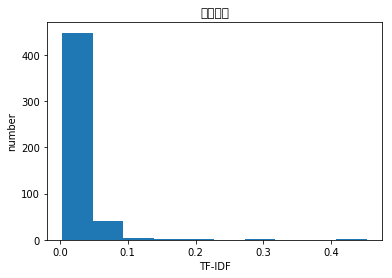

[('北区', 0.30100044069869003), ('将府', 0.286000364174554), ('公园', 0.28571082751412175), ('铁路', 0.2255584020053937), ('漫', 0.22511281741837053), ('咖啡', 0.150986657457959), ('南区', 0.1494496227784932), ('打鸟者', 0.143000182087277), ('行驼', 0.143000182087277), ('鸟者', 0.143000182087277), ('哉', 0.1356031621133793), ('湿地', 0.13301484176029665), ('野鸭', 0.13252011751590453), ('台路', 0.12370467558107855), ('酒仙桥', 0.11095103950326576), ('酒仙', 0.10962443943469473), ('红橙', 0.10626776125229243), ('东四环', 0.10530746563399218), ('府', 0.10497874112179187), ('将', 0.10206177250114974), ('紫色花', 0.102017225600522), ('北下', 0.09200792563631094), ('漕运', 0.08911784195250734), ('蒲公英', 0.08722305010378273), ('可恨', 0.08052390381246759), ('石灰', 0.07961583626960998), ('觅', 0.07890189691925456), ('火车', 0.07875458304347727), ('点将台', 0.07783069421396017), ('遛弯儿', 0.0773245014929948), ('冰上', 0.07707814522504998), ('居住区', 0.07590781201105147), ('跑道', 0.07579601409454097), ('瀑布', 0.07527226425616472), ('郊野', 0.07298269491893629

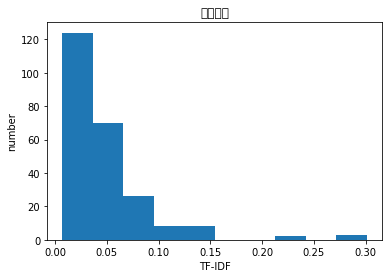

[('金榜', 0.7183721067476793), ('公园', 0.2866779717687769), ('泡茶', 0.21968923406529922), ('厦禾路', 0.20744061463003297), ('厦门', 0.17791965025436474), ('火车站', 0.1742667049298542), ('厦门市', 0.10024127481985208), ('金榜题名', 0.07715476496878841), ('厦门人', 0.0747999941290347), ('拐进去', 0.06366150099931175), ('文化公园', 0.06223283014215371), ('画仙', 0.06149324754087507), ('金亭山', 0.06149324754087507), ('个灰常', 0.057344499823588795), ('北近', 0.05319575210630251), ('梧', 0.05319575210630251), ('聊天', 0.05237793818516191), ('面积', 0.05077292451934773), ('锻炼', 0.04994874628184887), ('极受', 0.04984624021637618), ('青灯', 0.04904700438901623), ('黯', 0.04904700438901623), ('铁路', 0.04849755590162971), ('万石山', 0.04771140594022197), ('覆盖率', 0.0474737908722681), ('风景', 0.04693999609751281), ('村山', 0.04569749249908991), ('酒后', 0.04569749249908991), ('山', 0.045415399554060855), ('废弃', 0.04491211674703917), ('感谢上帝', 0.044898256671729954), ('水蛮', 0.0441932807098863), ('三两只', 0.04356265822293569), ('综合性', 0.043455312491467196), (

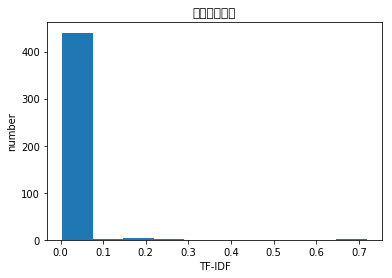

[('聊斋', 0.7253946094348834), ('蒲松龄', 0.28972869168882), ('淄川', 0.22573739316823466), ('家庄', 0.20964528645239902), ('蒲', 0.20693313347562117), ('淄川区', 0.17285553902697343), ('洪山', 0.14763300717296096), ('狐仙', 0.1147395633435428), ('淄博市', 0.11177437737938764), ('城', 0.10488793541578804), ('满井寺', 0.10387782786843305), ('观狐园', 0.10387782786843305), ('淄博', 0.10379513339349981), ('石隐园', 0.0963624967979449), ('组群', 0.08067452244860678), ('鬼怪', 0.07315919137811863), ('表现形式', 0.0696485847581212), ('宫', 0.06383053991993523), ('名园', 0.061354495308715715), ('特價門票', 0.0556965794694606), ('梦幻', 0.05519063735172107), ('故事', 0.053876709716883485), ('传出去', 0.05193891393421653), ('故居', 0.049250054032379836), ('镇', 0.04867078282951261), ('园林', 0.047409419327871016), ('张店区', 0.04697155029198742), ('人鬼', 0.04598315497060238), ('情未了', 0.04598315497060238), ('故里', 0.04515467530408382), ('短篇小说', 0.044423582863728384), ('身處', 0.044423582863728384), ('霏', 0.044423582863728384), ('陈列馆', 0.04432023823229162), ('个

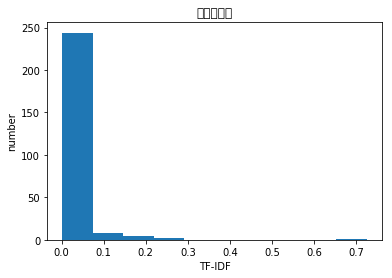

[('动物', 0.3346246274489956), ('动物园', 0.2542195052640421), ('东营', 0.23969743749482914), ('白虎', 0.20099611464470304), ('黑熊', 0.19470128062029132), ('标牌', 0.1768214472241873), ('鬣狗', 0.16000197219179935), ('种类', 0.15573244547082668), ('趴着不动', 0.15109402312213388), ('黑豹', 0.14289794172548714), ('狮子', 0.14115900360365657), ('平面设计', 0.14084400152733786), ('豢养', 0.13313917335995765), ('区人', 0.13193605245767245), ('变色龙', 0.13081060801522926), ('非洲狮', 0.13081060801522926), ('简单明了', 0.12875666781708), ('金钱豹', 0.11984871874741457), ('迫切', 0.11818666776951273), ('票价', 0.11649103255687915), ('斑', 0.11483202199136026), ('斑马', 0.11165263735076779), ('水禽', 0.1045820003965642), ('羊驼', 0.10434146780512824), ('小熊猫', 0.10363915800376643), ('长颈鹿', 0.10341120264792893), ('金丝猴', 0.10252806019841493), ('犀牛', 0.10108263730320055), ('草泥马', 0.09783732314588549), ('梅花鹿', 0.09496218365388014), ('周末', 0.09397303846156325), ('25', 0.09080085988744037), ('鹿', 0.08991064505526333), ('鹦鹉', 0.08970304336053278), ('非洲', 

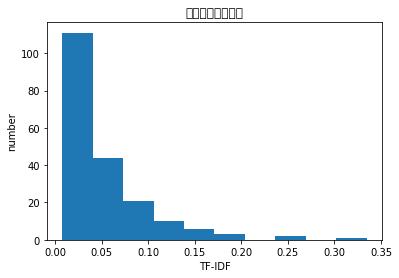

[('梅山', 0.5689846150246828), ('龙宫', 0.4168903789048917), ('溶洞', 0.21371798222431693), ('新化', 0.20580132899013917), ('新化县', 0.17290635793637885), ('游入', 0.13246719955609762), ('娄底市', 0.11908255743352927), ('辉哥', 0.11672581801565511), ('资江', 0.11468431747297506), ('登熊山', 0.10471544103199631), ('灵额', 0.09765063368615974), ('峰点', 0.093517986314026), ('九条', 0.09147828452847177), ('九股', 0.09058582634032317), ('九龙', 0.08861212466046474), ('鹅管', 0.0848820193562733), ('上万个', 0.0835210189944866), ('青龙', 0.07901069061149008), ('湖南省', 0.07290465931539324), ('凉快', 0.06717266576222426), ('景观', 0.06698557529982962), ('洞内', 0.06601708115447952), ('可通', 0.06444293263677459), ('笼', 0.06265019119982213), ('葱', 0.062012961056421366), ('黄帝', 0.06031028526464085), ('石钟乳', 0.05908080108271855), ('深圳', 0.05700429668430688), ('化成', 0.05449508523169101), ('五湖四海', 0.05267379374099338), ('绝世', 0.05267379374099338), ('油溪', 0.05235772051599816), ('油溪镇', 0.05235772051599816), ('洞中舞', 0.05235772051599816), ('酸掉', 0.0

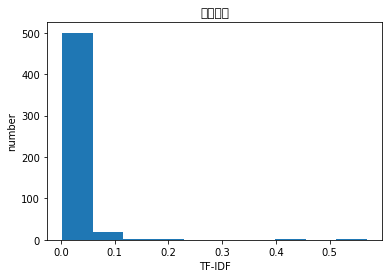

[('输变电', 0.442367311404987), ('围坝', 0.41252223984369746), ('泵站', 0.3950639921490037), ('～', 0.3688869071671946), ('入库', 0.331927423208828), ('生态区', 0.27392601953953344), ('湖心岛', 0.22123350869038724), ('饮水', 0.21213510188888451), ('工程', 0.13374053769326463), ('凉快', 0.1135075830662315), ('包括', 0.09244835643729163), ('、', 0.08833826211614375), ('逛逛', 0.0793798718418299), ('夏天', 0.06501724684502884), ('主要', 0.050187841974297265), ('等', 0.04049793897956163), ('和', 0.019713217529356272), ('可以', 0.016909551017169875), ('去', 0.01408311503226092), ('很', 0.01169722328752752), ('。', 0.0029576980966932414)]
defaultdict(<class 'float'>, {'、': 0.08833826211614375, '。': 0.0029576980966932414, '去': 0.01408311503226092, '可以': 0.016909551017169875, '和': 0.019713217529356272, '夏天': 0.06501724684502884, '很': 0.01169722328752752, '等': 0.04049793897956163, '～': 0.3688869071671946, '主要': 0.050187841974297265, '包括': 0.09244835643729163, '凉快': 0.1135075830662315, '逛逛': 0.0793798718418299, '工程': 0.1337405376932

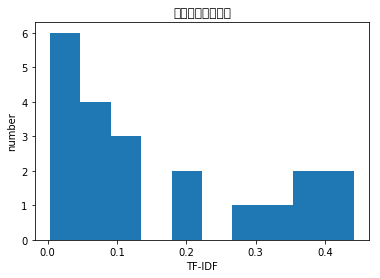

[('景不差', 0.5376448635613055), ('雾城', 0.4358132980757559), ('沙滩', 0.30917695947289414), ('BBQ', 0.2893374753766645), ('烧烤', 0.2723398752589421), ('单', 0.19184110241125088), ('好玩', 0.1742297393463972), ('满好', 0.14370732908956751), ('一起', 0.1414391226360836), ('可能', 0.13887482694915262), ('朋友', 0.13181835029165992), ('力', 0.1229696586144544), ('人少', 0.10648573667197128), ('是因为', 0.10268761980292801), ('收费', 0.09306304889849978), ('很小', 0.08886198911079445), ('重要', 0.08883238729646467), ('挺不错', 0.08560010275778239), ('一点', 0.07880039042656109), ('哈哈', 0.07372098579768473), ('.', 0.0707195613180418), ('更', 0.06486302300558823), ('需要', 0.06470726637919266), ('适合', 0.056342636549549546), ('给', 0.053706143504407465), ('喜欢', 0.050305146629019123), ('地方', 0.05000626435858657), ('和', 0.047918143477929706), ('门票', 0.04779173925886572), ('特别', 0.045973076348205445), ('风景', 0.04560039571940211), ('不是', 0.04237681391580981), ('这', 0.04135556973109337), ('还是', 0.030947728636552475), ('我', 0.0291544813

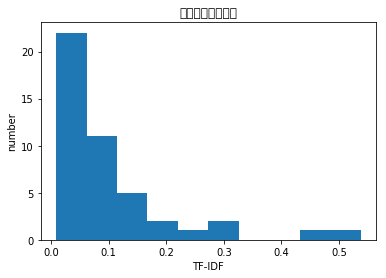

('empty file: ', '/Users/monabai/Desktop/data/pinglun/牛王岛.txt')
[('满族', 0.6986363824265306), ('永陵', 0.34431179281672536), ('赫图阿拉', 0.3129752128010846), ('女真', 0.13772471712669015), ('长廊', 0.11758049946774694), ('满清', 0.10935273455306709), ('历史', 0.10793313377689871), ('文化', 0.10727678713047402), ('阿接', 0.09652614796718523), ('大清', 0.09465675864517971), ('尽至', 0.0900138453640237), ('赫图', 0.08620439254782543), ('清门', 0.08350154276086215), ('汗王', 0.08140504959049634), ('启运', 0.07824380320027115), ('发祥', 0.07317978734150235), ('老城', 0.07310280168101016), ('发家史', 0.06886235856334508), ('各部', 0.06886235856334508), ('尽展', 0.0674849798285127), ('皇太极', 0.06556088170910583), ('壁画', 0.0654205215084701), ('560', 0.06457099156797502), ('努尔哈赤', 0.06367552701231444), ('镇西', 0.06285803192214257), ('八旗', 0.06186814178101176), ('统一', 0.06090553528491602), ('清朝', 0.059967430904780676), ('定都', 0.05904857910594429), ('入关', 0.056882747859461534), ('顺治', 0.05661040222042075), ('全为', 0.055962195794447694), ('

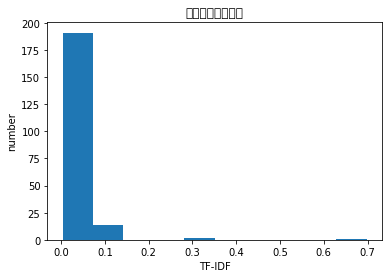

[('散散步', 0.5669954629010222), ('没事', 0.5240214029782198), ('~', 0.36172807772141413), ('那边', 0.33571328347539225), ('过去', 0.2518151748400708), ('漂亮', 0.24304517646261845), ('挺', 0.17856169305830497), ('可以', 0.07713375000075223), ('的', 0.007167262938361445)]
defaultdict(<class 'float'>, {'~': 0.36172807772141413, '可以': 0.07713375000075223, '挺': 0.17856169305830497, '漂亮': 0.24304517646261845, '的': 0.007167262938361445, '那边': 0.33571328347539225, '过去': 0.2518151748400708, '没事': 0.5240214029782198, '散散步': 0.5669954629010222})
[0.36172807772141413, 0.07713375000075223, 0.17856169305830497, 0.24304517646261845, 0.007167262938361445, 0.33571328347539225, 0.2518151748400708, 0.5240214029782198, 0.5669954629010222]


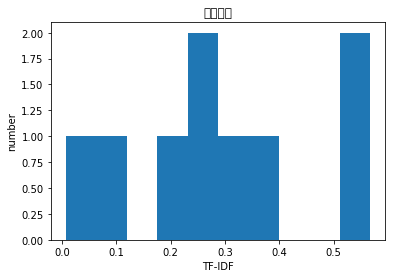

[('长寿', 0.4439888917603801), ('寿', 0.4112665043664714), ('寿字', 0.2437980268516633), ('山海关', 0.20598339703697982), ('书法', 0.1877812737249118), ('九重天', 0.1775383880165351), ('山', 0.16658026486865565), ('字', 0.13349455381904482), ('-', 0.12965658095394525), ('寿字来', 0.12530700016557664), ('悬阳洞', 0.12530700016557664), ('这领', 0.12530700016557664), ('医学知识', 0.11190764428863377), ('线车', 0.10567729861117917), ('石头', 0.10453361312338103), ('笔体', 0.1015734748257522), ('人待', 0.08817411894880935), ('刚一进', 0.08706457080019485), ('寿山', 0.08229732322393322), ('爬山', 0.07767542344624881), ('太懒', 0.07599544291718852), ('117', 0.07599544291718852), ('、', 0.0750693078369008), ('漫天要价', 0.06951099181267671), ('上用', 0.06889796734699036), ('提成', 0.06842880876266492), ('~', 0.06738813098708352), ('武则天', 0.06712077585402025), ('狐狸', 0.06691578582986887), ('返璞归真', 0.06681456849103727), ('秦皇岛', 0.0665158608429749), ('各种', 0.0652960075399349), ('两回', 0.0649488596234676), ('奇峰怪石', 0.06356045572212128), ('有关', 0.0632

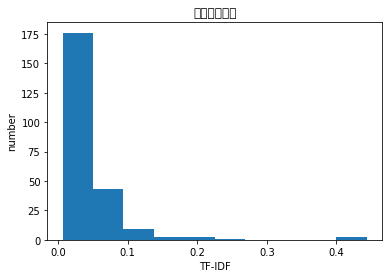

[('王家', 0.7448936266607471), ('大院', 0.5246890060062416), ('乔家大院', 0.21543729661601335), ('看院', 0.1242537423661685), ('平遥', 0.07424984670150567), ('山西', 0.06437642652803471), ('晋商', 0.05862737831811982), ('院落', 0.058342529798762), ('归来', 0.05814223448532389), ('乔家', 0.05677393665463154), ('故宫', 0.054628168377088664), ('灵石县', 0.05373711522838776), ('民间', 0.05153372322233848), ('介休', 0.049316627722191086), ('导游', 0.0473069768170181), ('王氏家族', 0.04334822545762031), ('红门堡', 0.04197761566424611), ('建筑', 0.03941694110623411), ('高家', 0.03807940148402546), ('院子', 0.03722990478335981), ('砖雕', 0.03696608638460305), ('讲解', 0.034433989589049724), ('石雕', 0.03382336644831342), ('静升', 0.03358209253139689), ('家族', 0.03302763414059317), ('气派', 0.032602961415260596), ('民居', 0.03181846978228939), ('木雕', 0.029451230766955157), ('建筑群', 0.028578505457342127), ('、', 0.028004763485279315), ('王氏', 0.02688902788956655), ('由静升', 0.023292144735697), ('灵石', 0.02315238254032476), ('比', 0.022821176556557167), ('细节', 

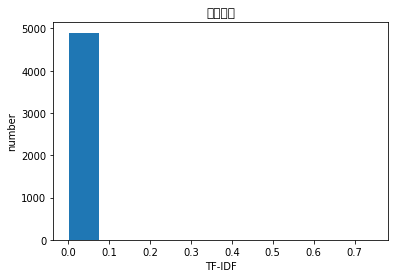

[('武汉长江大桥', 0.501268389117492), ('长江大桥', 0.3613100721255823), ('纪念碑', 0.26830046983864125), ('长江', 0.21570682084016382), ('天堑', 0.2108755369948481), ('变通途', 0.20218791210037926), ('大桥', 0.1953977108158414), ('武汉', 0.17341968868948487), ('一桥', 0.1535429957074103), ('万里', 0.13215176897590797), ('飞架', 0.12551053473994286), ('南北', 0.12161122666364715), ('桥', 0.10449703808130043), ('武昌', 0.10107069834160162), ('建成', 0.08787049699713394), ('象征', 0.07935530396128652), ('长江天堑', 0.07652957712233086), ('桥头', 0.074832762694734), ('黄鹤楼', 0.07306424244292957), ('第一座', 0.06712645418561965), ('"', 0.06391895208896882), ('第一', 0.060905248309613046), ('题字', 0.053996205184868515), ('桥下', 0.053235274612108724), ('火车', 0.05105030233815069), ('中国', 0.05019952759648966), ('横跨', 0.04983407680597117), ('社会主义', 0.04950081185197539), ('中国共产党', 0.048109999135465924), ('傻妮', 0.04634779493363541), ('谰言', 0.04634779493363541), ('雄健步伐', 0.04634779493363541), ('题署', 0.04634779493363541), ('之记', 0.04322086122755071), 

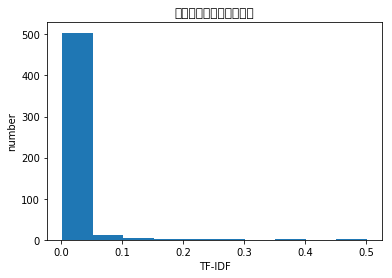

[('十渡', 0.5187161456394781), ('滋儿', 0.16805964328518738), ('盛仪庄', 0.16805964328518738), ('竹排', 0.16622753921362332), ('心里美', 0.13404434456557227), ('河北', 0.133935086290938), ('认不', 0.12610245581635487), ('917', 0.12489020495005862), ('别太高', 0.12489020495005862), ('六里桥', 0.12376162639369448), ('拒马河', 0.11905575155442384), ('再住', 0.1182576468827909), ('手下留情', 0.1182576468827909), ('狼狈不堪', 0.11749667707597261), ('舀水', 0.11749667707597261), ('镇北', 0.11414667036376909), ('划划', 0.10899260581926305), ('木筏', 0.10855636927563059), ('野三坡', 0.10507931026703451), ('北京市民', 0.1043976324280066), ('山清水秀', 0.10405286637843332), ('交通业', 0.10135968975688389), ('身手', 0.1005483879075075), ('风景区', 0.09983156967443822), ('惨淡', 0.09977542989866806), ('北京郊区', 0.09903735428862499), ('泼水', 0.09810236261796008), ('房山区', 0.09787673282108288), ('有山有水', 0.09677429146868535), ('仗', 0.09637888574134712), ('农家乐', 0.09388235809198461), ('攻击', 0.09102161484545697), ('同学聚会', 0.08920995500096915), ('蹦极', 0.0890785655321269

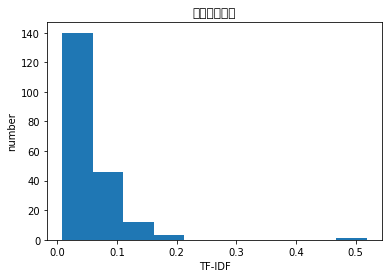

[('溶洞', 0.4403916356794139), ('灵山', 0.4185798615575312), ('灵', 0.2243097138616754), ('山洞', 0.22147327864040905), ('钟乳洞', 0.21322603663860193), ('竖井', 0.20877438674335103), ('洞', 0.20078918956309008), ('幻洞', 0.1483479076746165), ('转塘镇', 0.13833936091637022), ('曲折离奇', 0.13248473637608188), ('篇里', 0.12833081415812395), ('班级', 0.12020542962914676), ('别于', 0.10661301831930096), ('瑶琳', 0.10583232653067556), ('杭州', 0.09419601223213797), ('此洞', 0.09074984702076631), ('全班同学', 0.08947119965300607), ('温度', 0.08741055263486655), ('幻境', 0.08721045502506128), ('美仑美奂', 0.08600648456215015), ('武侠', 0.07730692168077388), ('钻进', 0.07543161891450254), ('石灰岩', 0.07352668007860448), ('锦绣', 0.07235844640714295), ('式', 0.07230294629648865), ('石洞', 0.07020763087897879), ('喀斯特', 0.06963883293029165), ('不宜', 0.0693322549427157), ('低', 0.06920791585520605), ('恐高症', 0.06833604749986782), ('钟乳石', 0.06783521298925607), ('余年', 0.06767205553831612), ('大学', 0.06715788167594089), ('天梯', 0.06474504709312252), ('岩洞', 0.0

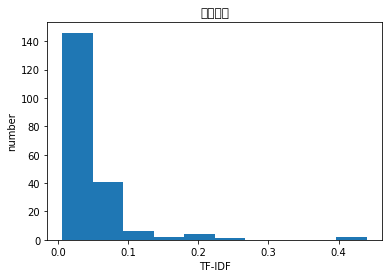

[('苏铁', 0.6872639754304716), ('攀枝花', 0.4979140328592674), ('铁树', 0.3604825865331375), ('铁树开花', 0.20714425353486268), ('植物', 0.1136650827159964), ('奇观', 0.08350172453166163), ('开多花', 0.06830723890310707), ('钒', 0.06830723890310707), ('雄花', 0.0636987735381087), ('雌花', 0.0636987735381087), ('一株', 0.06072577558838182), ('外出', 0.05872025040387683), ('珍稀', 0.05645513055588161), ('开花', 0.05258976700466431), ('自然保护区', 0.0523053236399366), ('铁矿', 0.0490902839593194), ('哑巴', 0.04873081208437866), ('濒临灭绝', 0.04806539618815225), ('朵花', 0.04615271024755016), ('常见', 0.04578283856446959), ('不怪', 0.04429965349703186), ('保护地', 0.04361714604864705), ('桫椤', 0.04361714604864705), ('艳红', 0.04361714604864705), ('繁荣昌盛', 0.03909025974552846), ('种子', 0.036205663287191894), ('活化石', 0.0342796934058506), ('圆圆的', 0.03342182151407523), ('国家一级', 0.03206540943156776), ('推广', 0.03186860744841388), ('俗话说', 0.03146553797378734), ('名不副实', 0.031036446508493572), ('高温', 0.030633377033867034), ('物种', 0.029711159753249124), 

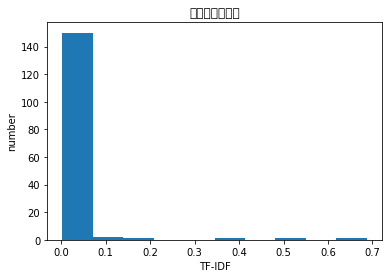

[('慢城', 0.47850836750773823), ('高淳', 0.44530303946370514), ('漆桥', 0.2910402705532062), ('固城', 0.24535006976811363), ('武家', 0.23925418375386912), ('水漫', 0.2155548706633005), ('游子', 0.18672411953421497), ('国际', 0.1785154635149418), ('闻名全国', 0.17101112894137016), ('瑶池', 0.1639997930351308), ('比较慢', 0.15286490791909615), ('总部', 0.15069415898075245), ('生活节奏', 0.13658541247275435), ('嘴', 0.12380173362393461), ('山庄', 0.11667936918974443), ('螃蟹', 0.11497018070140508), ('后花园', 0.10687261718413744), ('谷', 0.1057615425857965), ('南京', 0.10259164715167557), ('老街', 0.10109343625577073), ('湿地', 0.09676783010741014), ('特产', 0.09386792944391575), ('古镇', 0.08263005088012301), ('湖', 0.06809289111504523), ('风情', 0.06762297428026005), ('城', 0.06530452108465083), ('等等', 0.0625281090816191), ('风景区', 0.061797648996373654), ('山', 0.04609931279951176), ('公园', 0.04157072466628545), ('景点', 0.023914099834011257), ('有', 0.01551693648696155), ('是', 0.010093740134607003), ('，', 0.0050012739949187885), ('的', 0.0033255

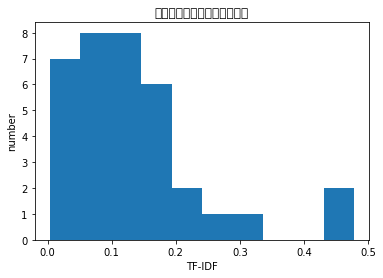

[('设备', 0.3939613183551634), ('圣诞', 0.3308761603011623), ('乾坤', 0.32878149464269324), ('更新', 0.2664879456532517), ('分享', 0.23260662282598848), ('亲们', 0.21555152632446145), ('布置', 0.19975302325175773), ('现场', 0.1775740530881569), ('咯', 0.17011612111503227), ('旧', 0.16240298396521097), ('内有', 0.15834501949461058), ('氛围', 0.15299766314149388), (' ', 0.14583930293033007), ('刚', 0.12875219802278626), ('下', 0.12434014182325125), ('以为', 0.12307128211237114), ('是因为', 0.12288641211899642), ('还好', 0.11745273880876962), ('希望', 0.11742453585185199), ('呀', 0.11673750140630589), ('想象', 0.11375578368269605), ('原来', 0.10533362106428683), ('好玩', 0.10425048118651689), ('体验', 0.10395416738816483), ('第一次', 0.09918337492554802), ('照片', 0.09556054963725698), ('一点', 0.09430053273880727), ('几个', 0.09165758860272116), ('点', 0.09033562246420544), ('一起', 0.08463019372424606), ('呢', 0.0827383145121952), ('自己', 0.07458291261148765), ('进去', 0.07363692403646233), ('没有', 0.0700050548338155), ('有点', 0.0661627857654958

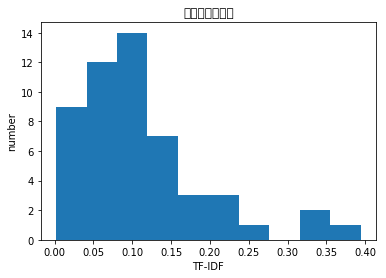

[('苏州河', 0.5985495075877827), ('路桥', 0.24833078366717237), ('四行', 0.2229731736317829), ('桥', 0.22060253847974345), ('闸北', 0.2097624100983964), ('黄浦', 0.18441452742655706), ('桥梁', 0.16667322611227992), ('河南', 0.1641594741693273), ('仓库', 0.14451520624903957), ('一端', 0.12702020745930967), ('连接', 0.1187466152284038), ('服装市场', 0.11540052981373587), ('上海', 0.10614790850218456), ('刚造', 0.10293430394347525), ('交通干道', 0.09835656594517375), ('见证人', 0.09835656594517375), ('圈内', 0.09545086922497711), ('浦路', 0.09545086922497711), ('忠烈', 0.09444262294732933), ('大革命', 0.09065069959005494), ('大桥', 0.08418406955632765), ('八百', 0.08033082487098502), ('日寇', 0.08033082487098502), ('新桥', 0.07901847342622025), ('两岸', 0.07816622446199689), ('研究', 0.07806673551220318), ('初建', 0.07595134318567931), ('多花点', 0.0744184136858688), ('数个', 0.07408790920510962), ('壮举', 0.07197513418108396), ('南京路', 0.07188226625239055), ('抗击', 0.07056034386194264), ('焕发', 0.06998481580984173), ('时代', 0.06894201486095294), ('勇士', 0.06

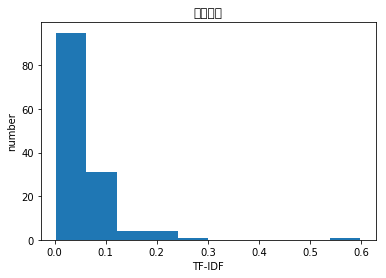

[('二仙', 0.5635984003621787), ('乐氏', 0.24780058612612574), ('宋塑乐氏', 0.24780058612612574), ('仙女', 0.21556844983254614), ('泽州县', 0.21436400057745697), ('1127', 0.18996479549295797), ('备案', 0.18248404531144896), ('晋城市', 0.16921725875013324), ('侍女', 0.16497488174755087), ('文物局', 0.16420912225445392), ('960', 0.15823146315919867), ('塑有', 0.15249896597579887), ('晋代', 0.14711687783318828), ('二', 0.1408355869426567), ('庙', 0.1387812764390081), ('被盗', 0.13335567927064462), ('山西省', 0.1179298062595102), ('申请', 0.11129728165077099), ('北宋', 0.10517045309968573), ('这方面', 0.09864263725407277), ('仙', 0.09819916289623325), ('近年', 0.09776369553549911), ('祭祀', 0.09569702209290455), ('仅存', 0.09569702209290455), ('台上', 0.0938750251439087), ('宋代', 0.09099339254417023), ('大殿', 0.08192434447973841), ('公元', 0.08180033701851153), ('庙宇', 0.07869432495755055), ('四', 0.07525442088441175), ('珍贵', 0.07158763969813961), ('用来', 0.07126582841210169), ('文物保护', 0.07032538187139228), ('雕像', 0.06911128821266752), ('对外开放', 0

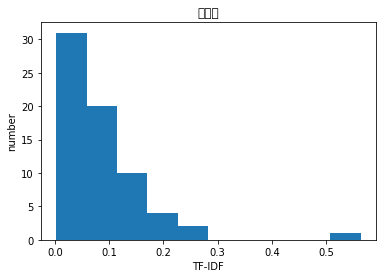

[('德山', 0.3764808924516267), ('沅江', 0.3321419085747638), ('谈天', 0.29137628755965556), ('常德', 0.29048415696286595), ('下道', 0.28707939349076583), ('所示', 0.2761757576719516), ('不符', 0.2371557646944953), ('南岸', 0.18875772998288579), ('摩托', 0.17698685832926814), ('乡村', 0.15913696598362206), ('东侧', 0.15098902611769408), ('吹风', 0.1487535065597491), ('村落', 0.14418036494157954), ('大桥', 0.14214128596974138), ('平常', 0.14193181775527333), ('宜人', 0.14045794192012495), ('清凉', 0.1358405078367208), ('不虚此行', 0.12795477774527034), ('地图', 0.11942014500097711), ('朋友', 0.115727947915075), ('此地', 0.11467994094259572), ('特意', 0.10131395745683393), ('久', 0.09806464964940026), ('位置', 0.07650634525248515), ('开', 0.07527361639231753), ('算', 0.07453669415587627), ('一片', 0.07240963747793547), ('来到', 0.07195172722097856), ('小时', 0.06039708061498586), ('只是', 0.05245077191663089), ('才', 0.051346489895588564), ('而且', 0.049871941130032814), ('与', 0.04458966861821108), ('和', 0.0420690169489384), ('走', 0.0391369513909038

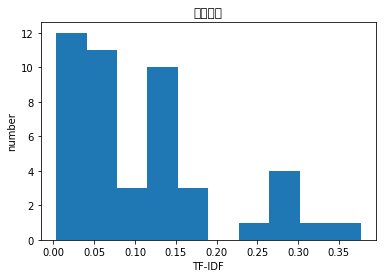

[('甘加', 0.6502769106551008), ('草原', 0.6258212032799013), ('桑科', 0.1910314741599931), ('甘南', 0.10373012088538762), ('牛羊', 0.06577430147010777), ('夏河', 0.06416332040647163), ('白云', 0.06325468692590465), ('八角', 0.05560169558271861), ('夏河县', 0.051699271911043), ('山坡', 0.049370857510983905), ('若尔盖', 0.043153362542081526), ('羊儿', 0.043039506992838594), ('经幡', 0.04068336413237548), ('鼠疫', 0.040445548014243785), ('草场', 0.03995740664336161), ('甘家', 0.03959447560595345), ('白石', 0.03780159872632958), ('藏民', 0.03685611587822103), ('野花', 0.0348905052719778), ('高原', 0.03172026881555195), ('旱獭', 0.031636754698439566), ('成群', 0.03155790038677768), ('起伏', 0.031105103566294645), ('拉卜楞寺', 0.030856950463278854), ('路过', 0.029809555696077343), ('我们', 0.028777282630025842), ('雀跃', 0.025891036839990406), ('美', 0.025589961176516896), ('翠绿', 0.02524686432330371), ('城', 0.02508758553258552), ('3300m', 0.02397918170848071), ('上云时', 0.02397918170848071), ('不议', 0.02397918170848071), ('串花', 0.02397918170848071), ('

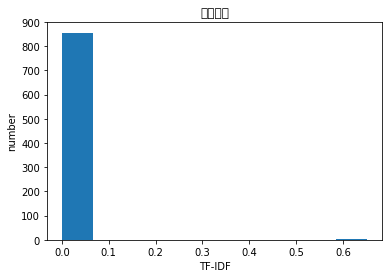

[('可园', 0.5780428775714915), ('名园', 0.302117062214976), ('东莞', 0.2851264392058344), ('四大', 0.20305819588995644), ('岭南', 0.19704117385335976), ('园林', 0.18783317018093473), ('广东', 0.17486284234513258), ('园', 0.16922085259963263), ('东莞市', 0.12804028787503935), ('可堂', 0.11348556847345621), ('清晖园', 0.09839031885672966), ('张敬修', 0.09457130706121351), ('可', 0.09046210568737727), ('余荫', 0.0880512290751082), ('莞', 0.08699843347218496), ('梁园', 0.08218991299478999), ('顺德', 0.08075735867807754), ('、', 0.07742996658083769), ('山房', 0.07686993605142421), ('清代', 0.07364720388663959), ('番禺', 0.06655671870050694), ('区西博', 0.06619991494284945), ('博厦', 0.06619991494284945), ('可羡', 0.06619991494284945), ('园夸', 0.06619991494284945), ('厦村', 0.06173362381354892), ('佛山', 0.0580779067393048), ('六阁', 0.05674278423672811), ('可洲', 0.05674278423672811), ('可轩', 0.05674278423672811), ('如可楼', 0.05674278423672811), ('粤', 0.05673073625982978), ('之一', 0.05416977391401868), ('合称', 0.053848241552699974), ('青砖', 0.050601075

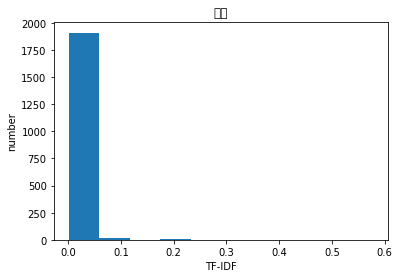

[('国子监', 0.7430741872804422), ('孔庙', 0.4682528363776687), ('雍和宫', 0.28433933153388413), ('孔子', 0.1453099437656254), ('学府', 0.12463522399234248), ('最高', 0.07440500255230517), ('古代', 0.06935059001533378), ('北京', 0.0658434572044825), ('右学', 0.06378832277102016), ('左庙', 0.056967295721671), ('胡同', 0.052794038124814514), ('导游', 0.04284522891078419), ('太学', 0.040553139785013466), ('祭祀', 0.039793599053317176), ('三代', 0.038098558061496285), ('文化', 0.03749137048399794), ('讲解', 0.036995241833788495), ('皇帝', 0.036940821858886606), ('和', 0.03564182405788312), ('古制', 0.035174110727445744), ('教育', 0.03195144109623128), ('科举制度', 0.03068361116240798), ('中央党校', 0.029712924198633812), ('状元', 0.028585356682660306), ('高考', 0.028244398052451006), ('街', 0.02806558601274589), ('成贤街', 0.02700183697740407), ('学子', 0.0267145300264851), ('元代', 0.026619840788008685), ('、', 0.02633371477897777), ('石碑', 0.025883959310259184), ('进士', 0.025766475055538852), ('明', 0.02567417776055161), ('地方', 0.025443193093325666), ('科

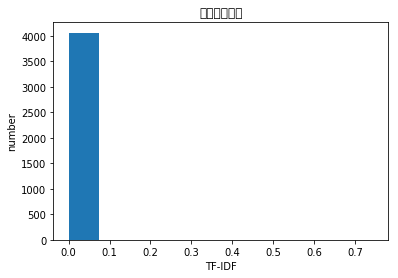

[('洞口', 0.6574251100867037), ('大石头', 0.5641922770130655), ('简单', 0.35479876296961044), ('东西', 0.2063282387482721), ('一样', 0.19106692524605753), ('一个', 0.13233184981058535), ('比较', 0.10625454722863507), ('就是', 0.08201975043759957), ('这里', 0.07437829039510836), ('有', 0.03999156102450161), ('的', 0.034283906833082224), ('是', 0.02601444073047441), ('，', 0.0025779412622602338)]
defaultdict(<class 'float'>, {'一个': 0.13233184981058535, '一样': 0.19106692524605753, '就是': 0.08201975043759957, '是': 0.02601444073047441, '有': 0.03999156102450161, '比较': 0.10625454722863507, '的': 0.034283906833082224, '这里': 0.07437829039510836, '，': 0.0025779412622602338, '东西': 0.2063282387482721, '简单': 0.35479876296961044, '洞口': 0.6574251100867037, '大石头': 0.5641922770130655})
[0.13233184981058535, 0.19106692524605753, 0.08201975043759957, 0.02601444073047441, 0.03999156102450161, 0.10625454722863507, 0.034283906833082224, 0.07437829039510836, 0.0025779412622602338, 0.2063282387482721, 0.35479876296961044, 0.6574251100

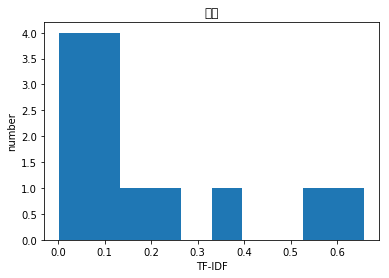

[('鸟类', 0.6793375296985081), ('自然保护区', 0.6409531944123646), ('建设', 0.3261088445878954), ('这个', 0.11682143895946023), ('不错', 0.08674477235681234), ('。', 0.011193037622852349), ('的', 0.0059461394401358735)]
defaultdict(<class 'float'>, {'。': 0.011193037622852349, '不错': 0.08674477235681234, '的': 0.0059461394401358735, '这个': 0.11682143895946023, '自然保护区': 0.6409531944123646, '建设': 0.3261088445878954, '鸟类': 0.6793375296985081})
[0.011193037622852349, 0.08674477235681234, 0.0059461394401358735, 0.11682143895946023, 0.6409531944123646, 0.3261088445878954, 0.6793375296985081]


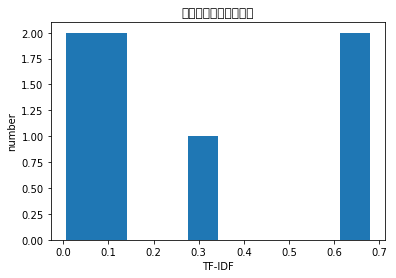

[('漂流', 0.5516864763091764), ('落差', 0.21709682397472896), ('至起', 0.21209386357679016), ('厚密', 0.19778458625687398), ('漂点', 0.17886875055014217), ('南昆山', 0.16916603161704158), ('漂一漂', 0.16916603161704158), ('刺激', 0.16404520643136705), ('随水', 0.15761336614172), ('运载', 0.14405485968332948), ('感都', 0.1392959469265703), ('皮艇', 0.13217708633263853), ('水流', 0.13135062975142753), ('清远', 0.12163164127047747), ('昆山', 0.1176538804306583), ('大巴', 0.11360401840830311), ('居家', 0.10838125879227534), ('大观园', 0.10355853169280616), ('缓缓的', 0.10240844618747338), ('小溪流', 0.1017085851505852), ('住房', 0.09956304313748954), ('缓', 0.09667395646335164), ('水道', 0.09256636915676054), ('客运', 0.09046721160196756), ('套餐', 0.0890886004614971), ('胆小', 0.08903532579082594), ('跟上', 0.08898218824944583), ('惊险刺激', 0.08877099537502661), ('玩乐', 0.0874978470317401), ('峡', 0.08715499819319063), ('十块钱', 0.08153428142526883), ('慢悠悠', 0.07955997987102204), ('负责', 0.07523779619544937), ('一玩', 0.07502077529086479), ('飘', 0.0743047

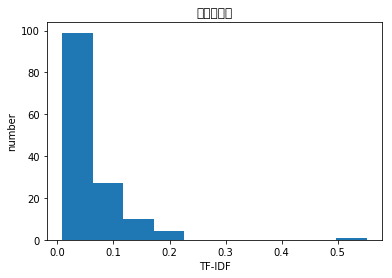

[('实实在在', 0.5147204893596286), ('人不太多', 0.4515042586961452), ('看书', 0.4390068273683427), ('悠闲', 0.2691875966514468), ('自', 0.25745481615141896), ('散步', 0.22336200753831784), ('舒服', 0.1877171569259052), ('好去处', 0.18224312149596322), ('.', 0.14305815525745633), ('那里', 0.12728360840847125), ('适合', 0.11397516467715382), ('让', 0.1071632162176295), ('个', 0.08717095035376701), ('感觉', 0.07384918205460561), ('很', 0.05751727628870636), ('人', 0.0541443409004678), ('在', 0.023300911008413208), ('是', 0.017587412173288224), ('的', 0.007726031945501855), ('，', 0.006971407305294904)]
defaultdict(<class 'float'>, {'.': 0.14305815525745633, '个': 0.08717095035376701, '人': 0.0541443409004678, '人不太多': 0.4515042586961452, '在': 0.023300911008413208, '很': 0.05751727628870636, '感觉': 0.07384918205460561, '散步': 0.22336200753831784, '是': 0.017587412173288224, '的': 0.007726031945501855, '舒服': 0.1877171569259052, '适合': 0.11397516467715382, '那里': 0.12728360840847125, '，': 0.006971407305294904, '让': 0.1071632162176295,

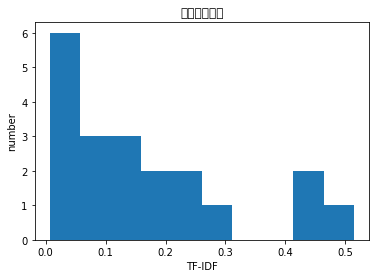

[('酿酒', 0.6082814376376234), ('酒瓶', 0.3515747228580573), ('藏室', 0.25431720597139446), ('华蓥山', 0.2097074665286552), ('有酒', 0.2097074665286552), ('酒', 0.20566767436472297), ('广安', 0.20173361292717518), ('底楼', 0.17174858125595518), ('平方', 0.15577152774052647), ('好几百', 0.15349208588925972), ('取水', 0.15230230711891948), ('眼花缭乱', 0.1184920291646201), ('项目', 0.11780960753273605), ('井', 0.11669458099220084), ('本土', 0.11324432553694265), ('有名', 0.09712963400643597), ('一口', 0.09443325229015644), ('生动', 0.08993872652404174), ('设置', 0.08878466191234646), ('二楼', 0.08836398215783864), ('纯', 0.08725012840059211), ('形象', 0.08160509715685424), ('一带', 0.0742562024207234), ('各种', 0.0741946553526459), ('雕塑', 0.0716372582903501), ('自', 0.06740991507089615), ('历史', 0.06368411678940611), ('全国', 0.054656168466747354), ('博物馆', 0.05278237578456788), ('另外', 0.05026588611910895), ('了解', 0.04754635049691556), ('这种', 0.046151232053603795), ('不是', 0.04489046653659436), ('非常', 0.04045361554777853), ('还有', 0.040390129

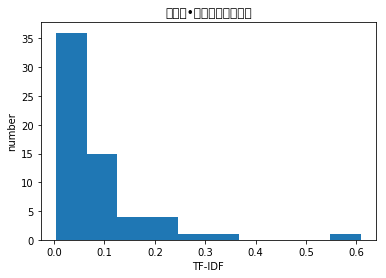

[('龙潭山', 0.76066620811481), ('吉林市', 0.32453911702725113), ('水牢', 0.2740601594352617), ('旱牢', 0.18607727603246124), ('高句丽', 0.17968422867197875), ('吉林', 0.15950891886539076), ('公园', 0.08426963374859003), ('山上', 0.0750844927564788), ('龙潭', 0.07205327722252042), ('南天门', 0.06880219144610356), ('名山', 0.06841010788792962), ('遗址', 0.062314403844832236), ('四大', 0.054730776725507774), ('贮水池', 0.049620606941989664), ('恶龙', 0.045676693239210274), ('御道', 0.04566753123605248), ('松花江', 0.04531384714750802), ('松鼠', 0.043875884084519076), ('龙凤', 0.043835225781358386), (' ', 0.03936619308085767), ('北山', 0.037097111445738795), ('山顶', 0.035349576399613), ('俯瞰', 0.03502362379042177), ('成潭', 0.03491627198028676), ('388', 0.03427134642456582), ('森林公园', 0.03317478649961568), ('有泉', 0.03273328900243938), ('大润发', 0.03192645664437514), ('山势', 0.03132640260467002), ('爬', 0.03042122611629458), ('锻炼', 0.03022877151897027), ('东部', 0.029341590329517164), ('没于', 0.029256392619800384), ('古城堡', 0.029241366539087352), (

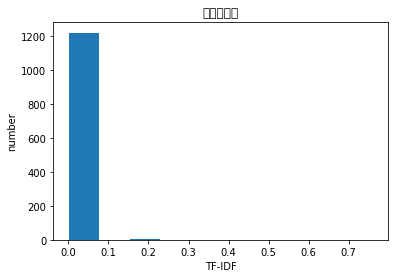

[('大理', 0.5951132294024681), ('人民', 0.45478448589614057), ('古城', 0.3344387097222635), ('路', 0.2385817359478609), ('摆摊', 0.16205963228868267), ('热闹', 0.0977812306421575), ('一条街', 0.09693053628740184), ('酒吧', 0.08897657078836224), ('小店', 0.0857302590467094), ('摆地摊', 0.077560105547458), ('路上', 0.07396795316892353), ('店铺', 0.07143014661520135), ('文艺', 0.06856242319548951), ('晚上', 0.06843983765232041), ('这条', 0.06766453731679561), ('街道', 0.06522195099827305), ('洋人街', 0.06474979137757712), ('一条', 0.06239055615274356), ('地摊', 0.06206910222341485), ('很多', 0.06158430989763359), (' ', 0.0570421404273973), ('米线', 0.055793150256809115), ('卖', 0.055719903167102146), ('小吃', 0.05555728710427077), ('吃', 0.05472700466577359), ('苍山', 0.053454268974584294), ('各种', 0.050232608451198084), ('丽江', 0.05020242541012973), ('洱海', 0.049806617437353984), ('逛', 0.04814846038531436), ('街', 0.04736060848835538), ('小摊', 0.04713748497423311), ('特色', 0.04583924300095141), ('再回首', 0.04485386790114278), ('街上', 0.043535463

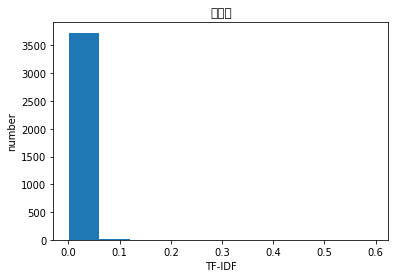

[('独墅', 0.375181718247205), ('爱奇艺', 0.23540250021671388), ('贾静雯', 0.23540250021671388), ('罗嘉良', 0.22544009150320854), ('利物浦', 0.21837165003191833), ('西安交通大学', 0.1984468326049076), ('片子', 0.1967992582849398), ('新片', 0.1935162887799529), ('苏州大学', 0.1753932444262618), ('学校', 0.1687575637804716), ('文星', 0.16805917525324376), ('翰林', 0.16507729978450367), ('邻里', 0.1605976002253016), ('工业园区', 0.15836239424146628), ('校名', 0.1558271242179553), ('私信', 0.14570464768684152), ('办学', 0.13785114508462212), ('古城区', 0.1310155994149126), ('杂志', 0.11849957434655761), ('大学', 0.11427791158679529), ('教学楼', 0.11398474923011706), ('不近', 0.11372289606147962), ('洋气', 0.11055075314835489), ('合作', 0.11047456603892752), ('湖', 0.11015133256300173), ('英国', 0.10857234147743355), ('前年', 0.10350139542412408), ('校园', 0.09457224258502438), ('评为', 0.09351990296355936), ('图书馆', 0.09161199442022036), ('教堂', 0.08945057324589976), ('城内', 0.0889386729991258), ('围墙', 0.08834432684722242), ('一所', 0.08725616423516643), ('建筑', 0.0

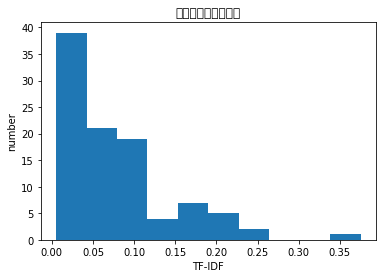

[('盆景', 0.8227422437165184), ('滩', 0.399285512737047), ('九寨沟', 0.18958837769463419), ('浅滩', 0.10748490400739162), ('海子', 0.08671909572818992), ('滩流', 0.08516766748996077), ('水中', 0.08480634318070923), ('钙化', 0.07076551370872265), ('甲珠措', 0.05523100633361717), ('植物', 0.05076705753705577), ('生长', 0.04963855442620337), ('树木', 0.048898725043091056), ('一个个', 0.04702767168509701), ('九寨', 0.03892404699450834), ('巨大', 0.038407118659392094), ('犹如', 0.038141114509572735), ('第一个', 0.03747076621180871), ('灌木', 0.03732176796916561), ('杜鹃', 0.03698672898963498), ('小树', 0.03634006692888815), ('像', 0.0359226678919456), ('一株株', 0.03476696213735347), ('碳酸盐', 0.03466673437634716), ('荷叶', 0.034538695576662136), ('水', 0.034373605084859225), ('海', 0.03427212668015445), ('柳', 0.033914996020773136), ('一盆', 0.033276285108301995), ('景点', 0.03159912174682717), ('树正沟', 0.031576400541622314), ('灌木丛', 0.03021924765130582), ('出沟', 0.030010467001286602), ('寨', 0.028348406043448682), ('盆', 0.02791906255365324), ('千姿百态

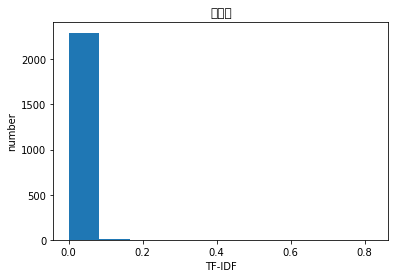

[('俶', 0.6837263136998771), ('西湖', 0.4419930226917724), ('保', 0.42417560255534514), ('宝石', 0.13082140642987972), ('山', 0.1306310025843276), ('塔', 0.1302944464173887), ('保叔塔', 0.09479875229794285), ('山上', 0.09204713628523659), ('杭州', 0.07353685387582341), ('爬', 0.06270277809545519), ('爬山', 0.052210704288647776), ('吴越王', 0.044750661786039016), ('俯瞰', 0.044587336087329794), ('全景', 0.04287977015234384), ('边', 0.038610603456288285), ('从保', 0.037610203230087486), ('钱弘', 0.035516292947083125), ('抱朴', 0.033589714900603126), ('氧化铁', 0.03310691392498615), ('山顶', 0.03200163187185706), ('山不高', 0.031115248590307513), ('吴越国', 0.030499951085705582), ('美景', 0.029449101312152365), ('远望', 0.026777686123450748), ('紫云', 0.02641962124709311), ('道院', 0.026077834147448894), ('黄龙洞', 0.024000353027016568), ('山路', 0.023947744239490323), ('杭州人', 0.02331938725900783), ('有座', 0.023086571575985208), ('北', 0.023041281379178054), ('上山', 0.022733828547962045), ('登山', 0.022416617588805157), ('断桥', 0.022354818209524174)

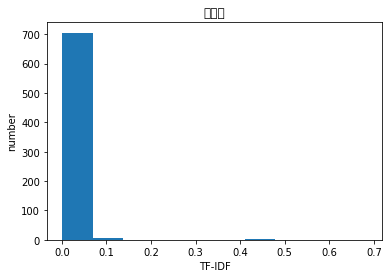

[('兰湖', 0.5294063249492594), ('腊八节', 0.4566109225141041), ('素菜', 0.3281405890794104), ('粥', 0.29986234856895894), ('美味', 0.19874047983304757), ('地铁', 0.18490644716606408), ('参加', 0.17463760524349614), ('满好', 0.17456917743789704), ('半小时', 0.15363577350617214), ('力', 0.14937799129761084), ('坐车', 0.14714011644120883), ('好吃', 0.12259090960900841), ('还要', 0.11726503236135698), ('真心', 0.11099076980024346), ('下来', 0.107052606471583), ('挺不错', 0.10398314144236877), ('远', 0.09944053617210205), ('站', 0.09290770827777982), ('哈哈', 0.08955292629919856), ('.', 0.08590693130456144), ('美', 0.06969785573785153), ('给', 0.06523979921081619), ('来', 0.04626220331285256), ('很', 0.03453932908660124), ('地方', 0.030372676505523513), ('也', 0.022111488516631722), ('是', 0.010561303594867448), ('。', 0.008733432318884564), ('，', 0.007326121065520494), ('的', 0.004639509676359267)]
defaultdict(<class 'float'>, {'.': 0.08590693130456144, '。': 0.008733432318884564, '也': 0.022111488516631722, '哈哈': 0.08955292629919856, '地

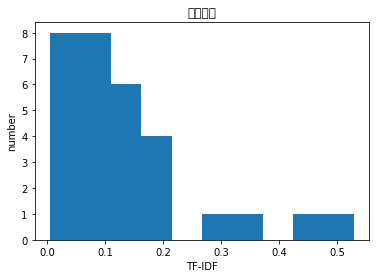

[('滑雪', 0.4636614091709592), ('天池', 0.2906152758273778), ('滑雪场', 0.20120717640813243), ('天荒坪', 0.1729965916527086), ('80', 0.1560459806930388), ('温泉', 0.15073378984764932), ('蓄水池', 0.14695438701507169), ('安吉', 0.1388773181679), ('门票', 0.13038794574217852), ('水电站', 0.11681166137637364), ('星星', 0.11270057821211962), ('漂亮', 0.10872223019402086), ('沙地', 0.10699660123196894), ('露营', 0.10525822772431453), ('水库', 0.1044629524963104), ('只座', 0.09760819465708327), ('日场票', 0.09760819465708327), ('蓄水库', 0.09515752240954936), ('928', 0.09315517738666783), ('龙百瀑', 0.09315517738666783), ('￥', 0.08938331164111281), ('娃哈哈', 0.08870216011625236), ('蓄能', 0.08466362569266654), ('江南', 0.08410053773286738), ('二重', 0.08309202183477564), ('算高', 0.0810896768118941), ('泰姬陵', 0.07939671821745457), ('清奇', 0.07839762139908558), ('泡', 0.07555523463144465), ('超级', 0.07509626533492716), ('妹子', 0.07422500664296801), ('地老天荒', 0.07410493532523854), ('单纯', 0.07352417004051177), ('天文馆', 0.07317628449511646), ('抽水', 0.072

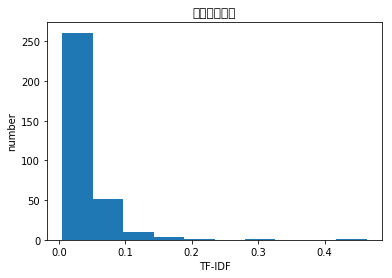

[('动物园', 0.5537701740837748), ('动物', 0.5141342724805964), ('大连', 0.2593854344028985), ('散养', 0.22274397526547482), ('二期', 0.21083560330967993), ('圈养', 0.1395024822005363), ('森林', 0.1382500160851989), ('一期', 0.13757906285340615), ('胡萝卜', 0.10317835356584788), ('区', 0.10283539841608068), ('羊驼', 0.10101715091642503), ('放养', 0.09677350382509617), ('大象', 0.08305199722903073), ('喂', 0.07854035545278128), (' ', 0.07505834779154023), ('老虎', 0.07449653902017545), ('驼', 0.07380727457776423), ('缆车', 0.07344605685274629), ('草泥马', 0.06888743866485658), ('表演', 0.06863666108535998), ('长颈鹿', 0.06006991439210765), ('接触', 0.05869472222127932), ('可爱', 0.053041712195416625), ('野生', 0.0519033089791667), ('孩子', 0.05118926463039935), ('羊', 0.048080096896958385), ('滨海', 0.04624499794020281), ('熊猫馆', 0.045283430065475846), ('斑马', 0.04127278403555571), ('带', 0.038772961762860186), ('大熊猫', 0.03861672695975778), ('两期', 0.037482406642871564), ('可以', 0.03712924899351195), ('近距离', 0.037038867675079606), ('去', 0.0340

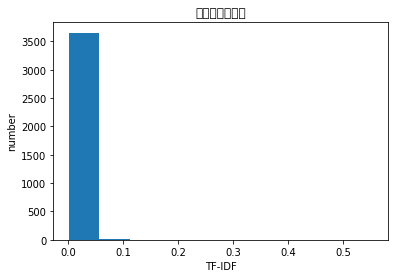

[('狩猎场', 0.7731102549342972), ('假', 0.3173647147775802), ('家乡', 0.2857024908341433), ('肯定', 0.22337407880315352), ('棒', 0.21679488000457214), ('名字', 0.18896702137684498), ('超级', 0.18158337443369427), (' ', 0.1236852173633657), ('景色', 0.10506669810234558), ('不是', 0.08601759400589935), ('不过', 0.0850250399763692), ('这', 0.0839446451561735), ('我', 0.05917854865312612), ('是', 0.052943070283491996), ('的', 0.0077525116311020666)]
defaultdict(<class 'float'>, {' ': 0.1236852173633657, '不是': 0.08601759400589935, '我': 0.05917854865312612, '是': 0.052943070283491996, '棒': 0.21679488000457214, '的': 0.0077525116311020666, '肯定': 0.22337407880315352, '超级': 0.18158337443369427, '这': 0.0839446451561735, '不过': 0.0850250399763692, '景色': 0.10506669810234558, '名字': 0.18896702137684498, '假': 0.3173647147775802, '家乡': 0.2857024908341433, '狩猎场': 0.7731102549342972})
[0.1236852173633657, 0.08601759400589935, 0.05917854865312612, 0.052943070283491996, 0.21679488000457214, 0.0077525116311020666, 0.223374078803153

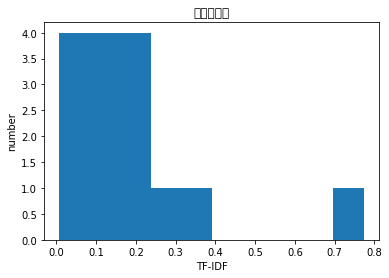

[('青龙峡', 0.6355494509300049), ('太行山', 0.20887178995269032), ('大峡谷', 0.1867564377158794), ('瀑布', 0.17273285368249566), ('峡谷', 0.16966007254520651), ('山西', 0.10872792814515288), ('攀岩', 0.10751648049136843), ('漂流', 0.09699695945308373), ('岩层', 0.09663183168313096), ('循环水', 0.09517632301228454), ('青龙', 0.09003658122944196), ('水势', 0.08842414335548263), ('长治', 0.07982452532469103), ('真水', 0.07619638703891125), ('悬崖峭壁', 0.07072140538462036), ('景区', 0.07000519951508198), ('飞瀑', 0.07000462838459999), ('山崖', 0.06843862442579336), ('高悬', 0.060901385064006046), ('地质', 0.060098039015561246), ('飞流直下', 0.059884449647718926), ('游硕', 0.05966420644779861), ('马奇', 0.05966420644779861), ('山岩', 0.0577900456454122), (' ', 0.05747726580952136), ('看样子', 0.05673596093322931), ('半天空', 0.055638858133913165), ('矫龙', 0.055638858133913165), ('水流', 0.05542544436487276), ('缺水', 0.05363576424155111), ('龙潭', 0.053315338400196886), ('松影', 0.05328418031794905), ('由青', 0.05328418031794905), ('飞潭', 0.051613509820027714), 

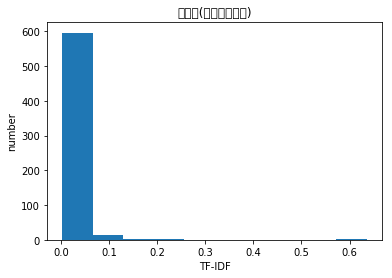

[('水晶', 0.3896284755457972), ('购物', 0.3592205837596397), ('瑞金路', 0.3537065816886543), ('带到', 0.30813545002555726), ('兴致', 0.2915892378186717), ('泸定', 0.2745964996022288), ('铁索桥', 0.21281345067230775), ('欣赏', 0.20843554068819278), ('博览', 0.20832524183622472), ('冰川', 0.17348199751315738), ('为了', 0.134218788141389), ('欢迎', 0.12901353019552747), ('免费参观', 0.12475996280227099), ('馆', 0.11061856410892544), ('店', 0.10929144814438874), ('购买', 0.10756621563292347), ('推荐', 0.09617448616569038), ('说实话', 0.09430738558972958), ('兴趣', 0.0899677638105902), ('让', 0.08442674999222215), ('被', 0.07931007750721085), ('真', 0.07061364778500688), ('当然', 0.06671541962402879), ('就是', 0.06552868950883312), ('完', 0.06309832681478031), ('买', 0.06239823106510712), ('不', 0.05640472776602878), ('东西', 0.05494781855063156), ('建议', 0.05357805182620485), ('可', 0.04997655878580875), ('再', 0.04855967949537202), ('没有', 0.04661449912310286), ('没什么', 0.04597089032730934), ('其实', 0.04310631045442435), ('人', 0.04265671462691157

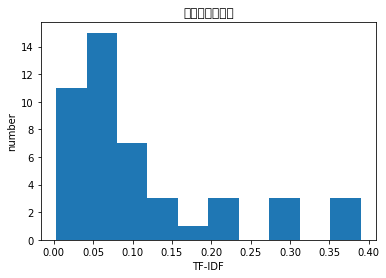

[('宝昌', 0.47720339329773726), ('宝昌镇', 0.47720339329773726), ('太仆寺旗', 0.37514655554674164), ('锡市', 0.1590677977659124), ('炊烟', 0.14141276306267916), ('一斤', 0.13331230366451227), ('烤牛肉', 0.12341758769825707), ('奶糖', 0.1193554832527055), ('莜面', 0.11614066743756718), ('北去', 0.11268580511617077), ('有见', 0.10447025265917072), ('烧火', 0.10447025265917072), ('第一顿', 0.1035852866847413), ('奶制品', 0.10274818068508706), ('午饭时间', 0.1011986195710548), ('张北', 0.10013042436334488), ('午饭', 0.09908288707131604), ('尕', 0.09396784745037567), ('张家口', 0.09242929429237846), ('风干', 0.09201639810300075), ('住宿费', 0.0857387077265878), ('牛肉干', 0.08533653733570698), ('主路', 0.08418914661255555), ('取暖', 0.08394531969130828), ('落脚点', 0.08335204061290132), ('热气', 0.08169751171029217), ('加油站', 0.0791917463977105), ('之路', 0.07620663997798395), ('买', 0.06950289605272854), ('田野', 0.06868402980309626), ('内蒙古', 0.06730304235070608), ('牛肉', 0.06689557963726095), ('羊肉', 0.06689557963726095), ('气味', 0.06565939700026024), ('很久没',

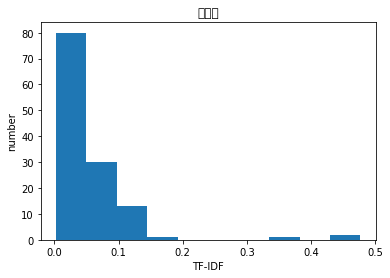

[('葡萄', 0.7172297741110094), ('棚内', 0.34848888540354644), ('紫葡萄', 0.34848888540354644), ('棚里', 0.2416321789113041), ('棚', 0.2068303601742961), ('口味', 0.13085283708934878), ('水果', 0.1275857393059132), ('适宜', 0.12475217591306649), ('气温', 0.12344472301089703), ('超赞', 0.12159644608307175), ('乡', 0.11096098171345502), ('绿', 0.10430086916104124), ('出行', 0.10395512093790965), ('挂', 0.10105229971671233), ('基地', 0.09273115319343456), ('自驾', 0.08098124158984575), ('之', 0.05196060750756362), ('！', 0.01966975722484934), ('在', 0.008360049491834663), ('，', 0.0031265574808941815), ('。', 0.002609007486281024)]
defaultdict(<class 'float'>, {'。': 0.002609007486281024, '口味': 0.13085283708934878, '在': 0.008360049491834663, '自驾': 0.08098124158984575, '！': 0.01966975722484934, '，': 0.0031265574808941815, '气温': 0.12344472301089703, '之': 0.05196060750756362, '绿': 0.10430086916104124, '基地': 0.09273115319343456, '出行': 0.10395512093790965, '乡': 0.11096098171345502, '挂': 0.10105229971671233, '水果': 0.1275857393059

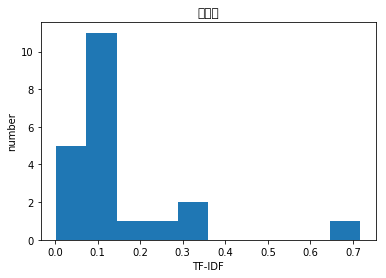

[('叆', 0.5317059135706305), ('旺山', 0.44823378820637794), ('靆', 0.38011577352935244), ('岭', 0.21370126270678155), ('茶文化', 0.20521116223972816), ('生态园', 0.1803937314219028), ('叇', 0.17723530452354347), ('＂', 0.17137564028523888), ('这池', 0.14941126273545932), ('吕洞宾', 0.1227659046280426), ('茂林修竹', 0.1074427139141846), ('主题', 0.09660123707302384), ('葫芦', 0.09222983405677489), ('山岭', 0.08867113183084693), ('要数', 0.08137709779219139), ('神奇', 0.08091077899990023), ('缺', 0.08066354635673062), ('水潭', 0.08012159059658665), ('弥漫着', 0.0731295149076358), ('雨后', 0.07175145763205211), ('池', 0.06948699177802581), ('陶醉', 0.06238212695339306), ('起伏', 0.061634403576369116), ('山脚', 0.06049083823344969), ('品种', 0.05941386836950602), ('相传', 0.0578055593424842), ('茶', 0.05716291779266154), ('山坡', 0.05590159092625957), ('景区', 0.05574967419543601), ('不足', 0.053221173797137644), ('满好', 0.05080065509868807), ('蜿蜒', 0.0507410447061496), ('感到', 0.04828324035222718), ('雨', 0.045693997877898865), ('停', 0.044658865866

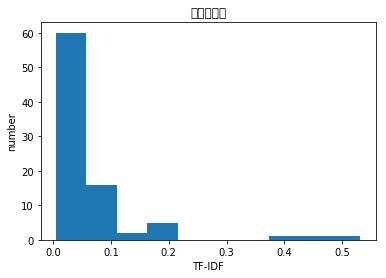

[('看大屏', 0.40977255948127367), ('文艺活动', 0.29254590891955207), ('宝安', 0.287355264207813), ('新闻联播', 0.2795573098428787), ('区政府', 0.2615418681347277), ('居民楼', 0.21901068133315535), ('稀稀拉拉', 0.20971470119438088), ('逢年过节', 0.20834436724827024), ('十几个', 0.18435440150965093), ('偌大', 0.17120641131247694), ('商业区', 0.169154304165155), ('广场', 0.16463711688105465), ('图书馆', 0.15947188920337754), ('不太多', 0.1583798212805078), ('大楼', 0.1562189488447177), ('建了', 0.15531730097895668), ('祥和', 0.14397167888538204), ('十年', 0.14337704695071551), ('气氛', 0.11227952193198758), ('配套', 0.10990057682848166), ('圣地', 0.10592592492428556), ('新建', 0.10479872735947152), ('居民', 0.10054992092312846), (' ', 0.09960286585433846), ('大片', 0.09451838866524907), ('平时', 0.09020767519165317), ('另外', 0.07756406339235403), ('安静', 0.06895004472029373), ('周边', 0.0688760859664979), ('休闲', 0.06831084716868509), ('一片', 0.06740886653179272), ('可能', 0.056751398315345244), ('只有', 0.05433331237358163), ('一', 0.04711074446672706), ('和', 0.

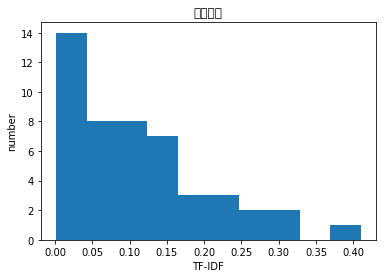

[('古樟', 0.5692832362804191), ('樟树', 0.5168657303700248), ('老僧', 0.18902104656898255), ('苏州', 0.18210940312471263), ('园', 0.1373560681633368), ('下小坐', 0.12169328768888753), ('历称', 0.12169328768888753), ('双观', 0.12169328768888753), ('自梁', 0.12169328768888753), ('西山', 0.11437928562965574), ('有名', 0.11127631172392628), ('园林', 0.11108064586673842), ('庙', 0.10962815165036734), ('樟', 0.08608547047528033), ('吴中', 0.08243138064749223), ('浓荫蔽日', 0.08132617661148844), ('种花', 0.07767208678370034), ('蜗牛', 0.0737723058596198), ('园内', 0.07288375540493883), ('弹琴', 0.0726549411394435), ('两株', 0.07239031003339608), ('浓荫', 0.07150524727284802), ('纹路', 0.06867091500443587), ('千年', 0.06740119915321038), ('园是', 0.06728388376341955), ('俗人', 0.06728388376341955), ('环岛游', 0.06635509691959868), ('和蔼', 0.06475093502974608), ('搭讪', 0.06453745380878953), ('两棵', 0.06412096293394522), ('笑话', 0.06391772925985185), ('句', 0.06282373107693305), ('枝繁叶茂', 0.06093639885407588), ('修身养性', 0.06067341153729996), ('难得', 0.05991

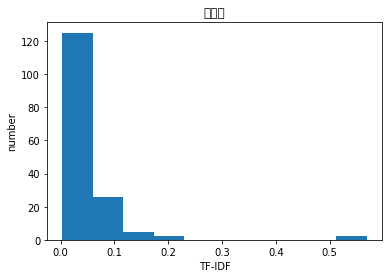

[('民雄菁埔', 0.44899523455445695), ('繪村', 0.44899523455445695), ('菁埔彩', 0.44899523455445695), ('不太理', 0.4009831767532413), ('派出所', 0.24278523410175865), ('猫咪', 0.22638582849858688), ('旁邊', 0.21945797376076767), ('脏', 0.14250920401749512), ('车站', 0.13331945588383742), ('…', 0.11539830729124892), ('连', 0.0867000358959197), ('很小', 0.0742099708337068), ('"', 0.04763201443606254), ('而且', 0.04743950214304129), ('有点', 0.04617152683053902), ('小', 0.03720688447992128), ('着', 0.03352107291284045), ('就是', 0.02289175343933503), ('人', 0.02235250699557423), ('地方', 0.020880488140584255), ('在', 0.019238715169743948), ('一个', 0.018466942790442434), ('都', 0.01744759725880769), ('，', 0.002158514093565066), ('的', 0.0015947759289130815)]
defaultdict(<class 'float'>, {'…': 0.11539830729124892, '一个': 0.018466942790442434, '人': 0.02235250699557423, '在': 0.019238715169743948, '地方': 0.020880488140584255, '小': 0.03720688447992128, '就是': 0.02289175343933503, '有点': 0.04617152683053902, '的': 0.0015947759289130815, '着':

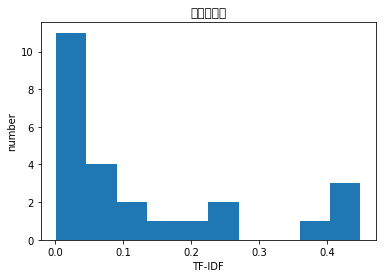

[('命河', 0.7319453742790999), ('命', 0.26293067136250725), ('命字', 0.22948393133751227), ('巴马', 0.22512185305625368), ('水晶宫', 0.21690480647385002), ('草书', 0.18572935006249236), ('字', 0.09779136036154919), ('社乡', 0.08783344491349197), ('草体', 0.08783344491349197), ('体', 0.07823022671887653), ('狂草', 0.07630803689362697), ('高处', 0.0758012851566343), ('长寿', 0.07259906542155702), ('田野', 0.07077791177585491), ('酷似', 0.06856626521673967), ('大自然', 0.06323103873495092), ('草写', 0.06114325805262771), ('鬼斧神工', 0.06081347899694295), ('田垌', 0.058555629942327984), ('百魔', 0.055295604068127106), ('长命', 0.0522960991078761), ('称奇', 0.05205342792358422), ('”', 0.051907521751843114), ('“', 0.05161006718548469), ('拐', 0.050050286755852304), ('生命', 0.04940998126792682), ('脱俗', 0.04748792236931736), ('阳河', 0.04502437061125074), ('之河', 0.0438608170130758), ('飘逸', 0.042894813057092605), ('俯视', 0.04259991425533288), ('广袤', 0.04235575667142925), ('寿星', 0.040995672303234844), ('河流', 0.03908715095222477), ('巨型', 0.0372

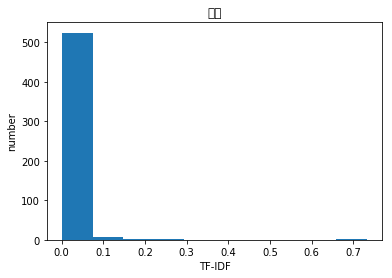

[('灵谷', 0.8753173476115689), ('寺', 0.25437911528495977), ('中山陵', 0.18834797483184257), ('无梁', 0.16204937663982388), ('殿', 0.10067845122577708), ('钟山', 0.09468142889731346), ('阵亡将士', 0.07997795619544683), ('塔', 0.07831857958477867), ('明孝陵', 0.07143256617374917), ('紫金山', 0.07048322077671856), ('开善', 0.061343945580550556), ('国民革命军', 0.0561527995094945), ('南朝', 0.05374517259015733), ('寺庙', 0.05273514504161552), ('公墓', 0.05206505777666554), ('南京', 0.04945942683895555), ('萤火虫', 0.046859515058347394), ('宝志', 0.04089596372036704), ('梁武帝', 0.031819463159623106), ('景区', 0.03166200171663335), ('朱元璋', 0.030471809832896435), ('禅林', 0.030274078590914858), ('桂花', 0.02788608934840552), ('玄奘法师', 0.02769026721723425), ('坡下', 0.02456987810465467), ('赐名', 0.023941089801067943), ('风景区', 0.023315981333197656), (' ', 0.02279850726893504), ('精舍', 0.022727463301777155), ('禅师', 0.022415259351895835), ('禅寺', 0.02183998037705628), ('南京市', 0.021290095292547488), ('三大寺', 0.02073452200170851), ('里面', 0.0199444496475

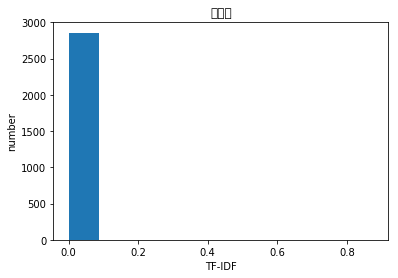

[('小要', 0.5987135854684259), ('逼真', 0.523645730370242), ('3D', 0.31604826978700934), ('一起', 0.19430688465187246), ('效果', 0.17781241132066986), ('停车', 0.16361908859452373), ('震撼', 0.1389307230152735), ('想象', 0.1305889243887223), ('不远', 0.12808405004597745), ('不好', 0.1205213055826263), ('好玩', 0.1196770640087011), ('算', 0.11663432543753018), ('少', 0.1099757131480044), ('两个', 0.108512537451715), ('最好', 0.1046119670406664), ('比', 0.09542947633111525), ('朋友', 0.0905450080138835), ('啊', 0.07061026148229888), ('很', 0.05859157111249539), ('但', 0.05558794213992685), ('要', 0.055191105394122225), ('但是', 0.05087896145529443), (' ', 0.04185500966789495), ('人', 0.036770424527582155), ('还', 0.03629188784586571), ('地方', 0.034348917256773394), ('也', 0.025006215350950583), ('去', 0.023514179836110014), ('。', 0.0049383850651825495), ('，', 0.0047344117946067086), ('的', 0.0026234456807960717)]
defaultdict(<class 'float'>, {' ': 0.04185500966789495, '。': 0.0049383850651825495, '一起': 0.19430688465187246, '也': 

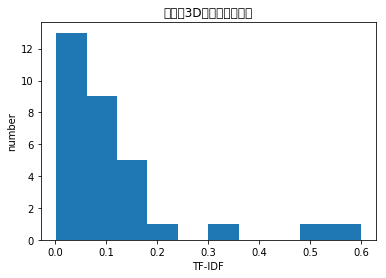

[('上海', 0.5299034689416828), ('古城墙', 0.5128920708549864), ('路大境', 0.21690320422365172), ('城墙', 0.1887919140285977), ('大境', 0.1783086546115667), ('中华路', 0.15024274173151794), ('西门', 0.12899320867890263), ('大镜阁', 0.11629783563172125), ('老', 0.11227445877043868), ('最老', 0.10750248678681346), ('欲了解', 0.10060536859193048), ('连成', 0.09952699896549762), ('人民', 0.0976079486448411), ('城区', 0.09645238665836732), ('唯一', 0.09380750773786724), ('拆除', 0.0927774677183214), ('看且', 0.09142586382985014), ('段', 0.09073925201809631), ('老城', 0.08807662786882006), ('破墙', 0.0872633214768904), ('小东门', 0.08491290155213971), ('北门', 0.0839617201499922), ('纷纷', 0.08278134461929468), ('保留', 0.07350077424088204), ('扫街', 0.07201482201404176), ('摄影留念', 0.07179066177444046), ('路口', 0.06565236632822066), ('庙', 0.06513286481029266), ('一段', 0.06368286691367894), ('遗迹', 0.06099595414786456), ('旧称', 0.059503621735459214), ('加快', 0.05913486853616407), ('关帝庙', 0.05836356751111591), ('一堵', 0.055824096059716444), ('指着', 0.0557

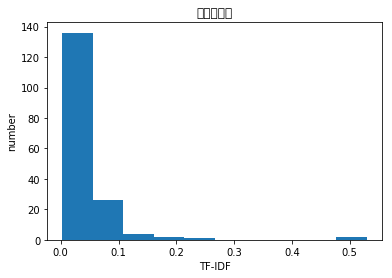

[('开福区', 0.40638018854696367), ('经此', 0.36823029669683405), ('导到', 0.34104018024906846), ('水井', 0.27609687728533855), ('白沙', 0.26497410670797145), ('社区', 0.23881375389651377), ('井', 0.23171976527922417), ('一口', 0.18751557158160814), ('导航', 0.16916064040194537), ('圈', 0.1688330283645109), ('错', 0.16667123220749816), ('幸福', 0.1451989011380942), ('政府', 0.14115237785450258), ('桥', 0.1274907329727861), ('古代', 0.1258584323960877), ('一大', 0.1236587926210498), ('故事', 0.10939721109619356), ('找到', 0.10542548676805472), ('而已', 0.10166090560654206), ('有名', 0.09643488070423986), ('找', 0.08702089681752832), ('不', 0.07444684912326256), ('把', 0.07442996110786891), ('呢', 0.07271585340420053), ('并', 0.07158811698992344), ('跟', 0.07154627310059222), ('一样', 0.06715960191443988), ('觉得', 0.058477076907928846), ('知道', 0.05751246557653077), ('！', 0.05700700153072025), ('其实', 0.05689468095604969), ('啊', 0.05405767932079941), ('什么', 0.049661603450380974), ('特别', 0.04835170344404815), ('现在', 0.04734104297978469)

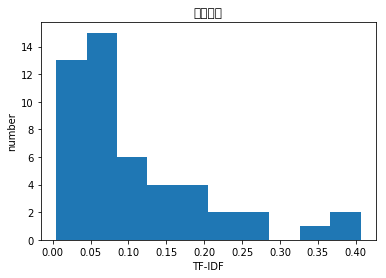

[('康定', 0.8984794814167771), ('河', 0.21901137955841568), ('康定县', 0.14433937175817643), ('河水', 0.12965819911688517), ('湍急', 0.09565614000090426), ('城', 0.07960932849538993), ('折多河', 0.07682567771603145), ('大渡河', 0.06446193736952889), ('瓦斯', 0.06255520387634073), ('情歌', 0.06034889679232909), ('水流', 0.05973483518757942), ('河流', 0.05750073459460215), ('雅拉', 0.0570803448065833), ('折多山', 0.0565586017517851), ('河边', 0.04941934079401513), ('急', 0.045432873273897015), ('溜溜', 0.04305673402669575), ('流经', 0.04156652757054125), ('穿城', 0.03982254643811784), ('城而过', 0.039818290814813875), ('一条', 0.03695018382242812), (' ', 0.03643893415537132), ('沟', 0.031606468026784004), ('县城', 0.02975326272182878), ('奔腾', 0.029243265997526864), ('这条', 0.028288098379035675), ('贯穿', 0.027793066114777647), ('支流', 0.027515134231402682), ('稻城', 0.025132203820202245), ('城中', 0.023278004036916045), ('牛窝沟', 0.021434388601346402), ('清澈', 0.020272817363737074), ('晚上', 0.01990859436381467), ('水声', 0.019497727890324397), ('城

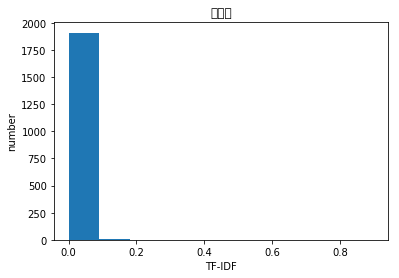

[('银瓶', 0.6314823532105098), ('东莞', 0.27368754365633174), ('嘴', 0.17382680559717742), ('东莞市', 0.1498203589592485), ('谢岗', 0.13621403365286805), ('快快乐乐', 0.13616277623735612), ('网页', 0.12302306419480193), ('-', 0.10795647865966403), ('人次', 0.10689973208013726), ('剑及履及', 0.09737921178985579), ('洛伦', 0.09737921178985579), ('山', 0.09349433938064453), ('山顶', 0.09249689054721247), ('统计局', 0.08696623636099449), ('数码', 0.08566605728230266), ('好好', 0.08547100975069935), ('樟木', 0.08506943346157357), ('丁啉', 0.08423949974730158), ('嘴山', 0.08423949974730158), ('嶂', 0.0835909651116159), ('惠阳', 0.07766964372602449), ('898', 0.07655326093213319), ('第一峰', 0.07464205736081775), ('银屏', 0.0699834049108561), ('爬', 0.0682296029458432), ('惠州市', 0.0676600610352346), ('哭', 0.06267057410396466), ('白云', 0.05708369710714703), ('最高峰', 0.05488579812841508), ('惠州', 0.05392152049149459), ('率', 0.04939442386335669), ('含垢忍辱', 0.04868960589492789), ('图苦', 0.04868960589492789), ('头振通', 0.04868960589492789), ('柏拉图', 0.048

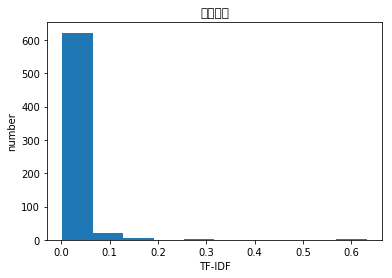

[('都江堰', 0.6893443837364456), ('秦堰楼', 0.6476459522844936), ('全景', 0.11239308052956641), ('秦国', 0.08398772722054208), ('鱼嘴', 0.07812392014796271), ('玉垒', 0.06376101785265359), ('水利工程', 0.05657548336677457), ('雄峙', 0.05626023654477427), ('二王庙', 0.049586993448844326), ('整个', 0.0475326841402532), ('江岸', 0.04745092934395986), ('俯瞰', 0.044521454490813836), ('安澜', 0.042618760576147864), ('嘴', 0.04170201758360814), ('景区', 0.04111632220864565), ('地震', 0.03982601230507818), ('登上', 0.0364971981015316), ('眺望', 0.034308236361430156), ('而立', 0.033912142659740276), ('沙堰', 0.033057995632562884), ('依山', 0.03280285094834903), ('汶川', 0.03269388524140246), ('峻', 0.03252213919573427), ('建于', 0.03161824132966406), ('全貌', 0.030705993859635742), ('拨', 0.030277527273382208), ('壮观', 0.030092136445138373), ('爬', 0.029463590299501206), ('得名', 0.02901482441529266), ('爬上去', 0.028607535353174084), ('最佳', 0.028128995229313808), ('位置', 0.027263313902255684), ('王庙', 0.026851564360886555), ('爬楼', 0.02595824949289016), (

defaultdict(<class 'float'>, {' ': 0.007148808163694788, '.': 0.008296872072681023, '~': 0.003769084774111249, '“': 0.006620019383317554, '”': 0.00665817385786749, '、': 0.00629805088136438, '。': 0.009278202185239892, '一下': 0.0021920144346804986, '一个': 0.006918187708113406, '一定': 0.004943969963354372, '一座': 0.0025500575809641935, '一点': 0.0030816403385489737, '上': 0.007563176887116525, '不是': 0.004971679650642642, '不错': 0.005447349609518913, '个': 0.005055609882831459, '个人': 0.003056319793787012, '中': 0.0035022449256336646, '之前': 0.003259883443875006, '也': 0.00569472687936828, '了': 0.006387868015929744, '人': 0.006280364360946112, '从': 0.010174157071788937, '会': 0.0016543705158983053, '但': 0.006329589340695183, '但是': 0.0014483488671087209, '其实': 0.0021155195086922265, '内': 0.007150139317620847, '再': 0.00238315337650888, '出': 0.0033037827445240595, '则': 0.004458558362592952, '到': 0.010195905901840776, '去': 0.0073630452013450885, '又': 0.0020933927582042836, '及': 0.003668473745729253, '可以': 0.

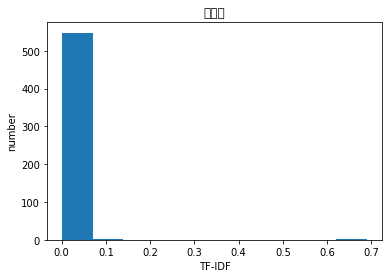

[('季节', 0.5385882138924245), ('海子', 0.42304547120396074), ('海', 0.36242476075598007), ('九寨沟', 0.16991266926364565), ('枯水期', 0.14880604964080288), ('干涸', 0.14714695120373836), ('水', 0.12428508579660771), ('变化', 0.12138197111540995), ('湖水', 0.11222628344249773), ('海和下', 0.10598919767289909), ('草滩', 0.09795619916050247), ('长海', 0.09142625926356554), ('海都', 0.08942066792026965), ('下', 0.08269898685957137), ('没水', 0.0825471489459305), ('车上', 0.08082215503080538), ('季节性', 0.07661244452549032), ('雨季', 0.07623387914754565), ('五彩池', 0.07602616891750473), ('时涸', 0.07403713909221057), ('时盈', 0.07403713909221057), ('放牧', 0.07085573830738846), ('水位', 0.06713992011450234), ('上下', 0.06667757774211444), ('若希', 0.06650942574525102), ('花繁叶茂', 0.06640409916232058), ('水量', 0.0647889141240311), ('时候', 0.06399485317823908), ('随', 0.061701028117716564), ('维奇', 0.06169761591017548), ('树似', 0.05705698846426124), ('水浅', 0.05611714220495866), ('翠绿色', 0.05559167564878701), ('没有', 0.05509666719704929), ('床上', 0.05

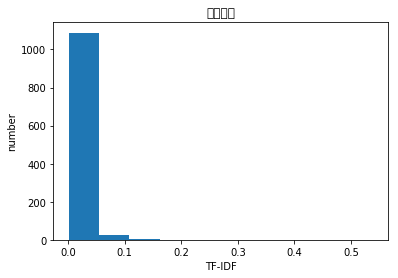

[('偶戏馆', 0.5071146492473123), ('布袋戏', 0.3805101653227884), ('偶戏', 0.342138946094305), ('台北', 0.29223113498045333), ('霹雳', 0.18725006470008906), ('傀儡戏', 0.18115510133204332), ('布偶', 0.14810448037414634), ('木偶戏', 0.14273548116013343), ('台湾', 0.12063460187710297), ('戏偶', 0.10142292984946247), ('落末', 0.10142292984946247), ('吊线', 0.09458025743386514), ('图即', 0.09458025743386514), ('布偶戏', 0.08221311976350752), ('热络', 0.08221311976350752), ('殉葬品', 0.08089491260267048), ('精细', 0.07631728275883107), ('中时', 0.07610203306455768), ('学习班', 0.0753704473479102), ('可怖', 0.07468935734013546), ('丝线', 0.07405224018707317), ('好戏', 0.07046967723250568), ('越做越', 0.06604682665138621), ('京华', 0.06429277769273443), ('发展', 0.06382500990165045), ('有所区别', 0.06300330967755258), ('体内', 0.060213839738671476), ('伸进', 0.060213839738671476), ('发行', 0.05991466867536397), ('禁忌', 0.05906798808302731), ('转为', 0.05816404686118697), ('人偶', 0.05711160733062727), ('蒙上', 0.055574015817765714), ('馆', 0.05237466576774613), ('写满',

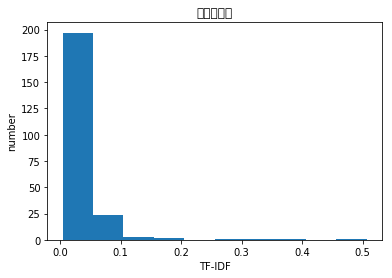

[('天门山', 0.2513618077458637), ('栗子', 0.24847550407462346), ('南辛房', 0.22231984028104781), ('谭拓寺', 0.22231984028104781), ('青菁', 0.20732064985350773), ('天门', 0.2072658125897665), ('门洞', 0.19970569292939597), ('刺球', 0.19854668591222105), ('内有条', 0.1923214594259676), ('931', 0.18021178920741382), ('苹果园', 0.1586043665845206), ('班主任', 0.14538474755314287), ('小溪', 0.14085494297890147), ('一个天', 0.13640567062925235), ('门头沟', 0.13101282590455968), ('荡秋千', 0.1280438954866499), ('小编', 0.1192699315453632), ('奇绝', 0.1181877431695052), ('爬', 0.11682776655216777), ('核桃', 0.11492756666402267), ('两句', 0.11236202201773891), ('敬业', 0.10692376435371934), ('不明', 0.10166044101060664), ('山前', 0.09947910215426185), ('两公里', 0.09896647309334185), ('口感', 0.09860760487436017), ('难看', 0.09543521452435322), ('引导', 0.09531261217005751), ('串', 0.09418127918050499), ('张家界', 0.0918723682129274), ('灰常', 0.09036203973772428), ('未能', 0.08515736990203819), ('甜', 0.08290805371665694), ('山不高', 0.08212970096367775), ('人间仙境', 0.

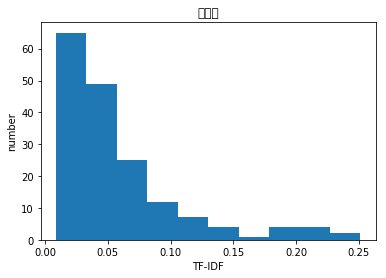

[('举手', 0.6619142123291762), ('攀峰', 0.31049158960071505), ('请举手', 0.27488797512711644), ('词藻', 0.22166697644811117), ('真会选', 0.2118252955432018), ('老牛', 0.20026624297536424), ('露宿', 0.17918212701823433), ('奶', 0.16950862400243974), ('外国游客', 0.16308144630208538), ('马儿', 0.15414642344561422), ('~', 0.14921494845192815), ('牦牛', 0.14027692864074573), ('多余', 0.13814298587745305), ('园子', 0.10617823270016964), ('形容', 0.08449435677979587), ('集中', 0.08317140548029374), ('喝', 0.07841170282671023), ('新鲜', 0.0775309005685348), ('热', 0.07659007941584278), ('山路', 0.07573364229114034), ('任何', 0.07290800576319814), ('！', 0.06713360689568207), ('多少', 0.0606716329500589), ('美景', 0.058207144748844135), ('这些', 0.05384262654094885), ('照片', 0.049451886298112535), ('点', 0.046748024657943345), ('拍', 0.04577804955574426), ('？', 0.04428756642148052), ('据说', 0.04323426316292123), ('过', 0.032668457572755584), ('走', 0.027606707428208945), ('上', 0.019961327784320734), ('很多', 0.0198889126983199), ('人', 0.01657562866

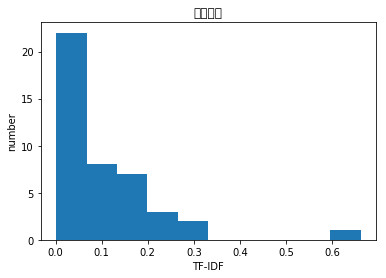

[('鸟类', 0.36311667292979233), ('百余种', 0.31482813158404294), ('白天鹅', 0.26984201516986), ('珍禽', 0.2636594421552967), ('丹顶鹤', 0.2560410277415577), ('水渠', 0.2451564729711508), ('荒地', 0.23965658749434984), ('天鹅湖', 0.23784934199011656), ('品种繁多', 0.22612525025770894), ('天鹅', 0.2009509039647735), ('一大群', 0.19357104957933913), ('飞过', 0.18849875394670548), ('栖息', 0.1869312913356166), ('硕大', 0.1818509357749374), ('吐槽', 0.1663672827417503), ('常年', 0.14058004861375323), ('水库', 0.13807403669629242), ('好美', 0.1333927444321288), ('心', 0.11050857224656117), ('季节', 0.08798618731913681), ('传说', 0.08386754826689287), ('对于', 0.07166039704393838), ('其中', 0.0676218770870672), ('此', 0.06690333386648517), ('一种', 0.06689634768425883), ('像', 0.054562547012816376), ('一样', 0.05313884805409977), ('得', 0.05044784078550827), ('对', 0.04833108982672541), ('景区', 0.043746460390829134), ('等', 0.040959781435416405), ('什么', 0.03929386602432127), ('中', 0.03726277319764736), ('有', 0.03336692860876661), ('这个', 0.03122145501121

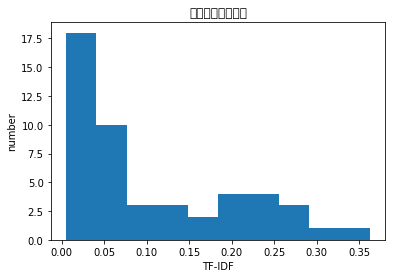

[('军垦', 0.635362994264595), ('犁', 0.4813309820195385), ('石河子', 0.3249766992648558), ('兵团', 0.18644825250886696), ('石河子市', 0.13614921305669891), ('游憩', 0.130801013410512), ('广场', 0.12977675495004887), ('犁铧', 0.10311239084946047), ('雕像', 0.09660383109264593), ('雕塑', 0.08713553943002803), ('第一', 0.08669898816878284), ('播种', 0.07243221461631645), ('新疆', 0.06613069819701176), ('一犁', 0.05772931983056083), ('有多苦', 0.051556195424730236), ('绿洲', 0.05110009577123717), ('战士', 0.050019017140137324), ('标记', 0.049723693986163865), ('犁地', 0.046795211813937566), ('王震将军', 0.04425549837068704), ('凸凹不平', 0.04376657970445694), ('城市', 0.04368109728636045), ('当来', 0.040896240315648126), ('第四代', 0.03861792376995418), ('一物', 0.03843367710020605), ('从无到有', 0.037914629568305894), ('几丝', 0.03759345529862636), ('第三代', 0.03759345529862636), ('华彩', 0.03633960722426024), ('馕', 0.036216107308158225), ('几串', 0.03609526351121938), ('迈出', 0.03609526351121938), ('恰是', 0.03597696398418365), ('血泪史', 0.03597696398418365), (

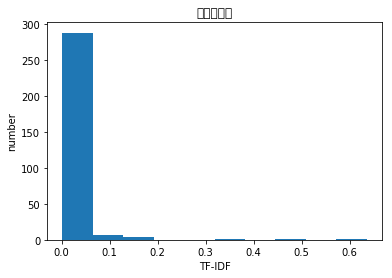

[('谷布', 0.6396324871772371), ('电饭锅', 0.47994405959852426), ('昌都县', 0.22849406579329534), ('神山', 0.16670574036489139), ('洞口', 0.15683642572012244), ('风格', 0.14289476359497344), ('乃宁', 0.1279264974354474), ('乃宁洞', 0.1279264974354474), ('洞谷布', 0.1279264974354474), ('日通', 0.119295716244993), ('风', 0.10980157306333704), ('佛塔', 0.10519545148884213), ('石芽', 0.09598881191970486), ('溶洞', 0.09494195155065012), ('异峰', 0.09340337267362976), ('5400', 0.08784639078156443), ('水电费', 0.08784639078156443), ('塑像', 0.08184233426752469), ('建有', 0.07681992532380261), ('半山腰', 0.07541321173739819), ('乡', 0.07275390096520082), ('洞', 0.06925950799400005), ('三千', 0.06578770078419892), ('负重', 0.06528957095090318), ('突起', 0.06528957095090318), ('如意', 0.06457785808979405), ('石灰岩', 0.06340507795461142), ('慢行', 0.06246234575392122), ('裸露', 0.054395381114894725), ('峰顶', 0.051209699396077696), ('容纳', 0.050544775073714125), ('石柱', 0.049795763377258384), ('交界', 0.048007679446748094), ('别有洞天', 0.04772650267140697), ('和', 

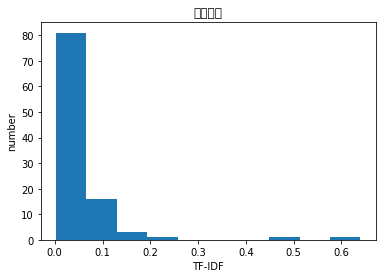

[('南坪', 0.7483832049202153), ('郭亮', 0.4323009692098412), ('仙山', 0.23161617789630448), ('丹分', 0.16262350569661937), ('万', 0.1524575780582703), ('剑峰', 0.12357702967532311), ('黑龙潭', 0.09338702858593935), ('村', 0.08233906966749975), ('磨', 0.0806241503755803), ('瀑布', 0.06929304135613668), ('景区', 0.06619586740738695), ('沟', 0.05872346046291721), ('辉县市', 0.05836439258986608), ('新乡市', 0.0549231243001436), ('分沟', 0.05038472227306989), ('峡谷', 0.04812840650833615), ('·', 0.04801553531114177), ('太行山', 0.04702524618112078), ('南马庵', 0.037611719570768455), ('太行', 0.03736623654249162), ('新乡', 0.03589275284231405), ('丹', 0.0325642531399191), ('日月星', 0.031052275493539103), ('长沟', 0.02956791012665807), ('绝壁', 0.02910384994482582), ('村庄', 0.028239230339465154), (' ', 0.02770766015178778), ('村子', 0.027521561108911515), ('沟沟', 0.0274615621500718), ('萬', 0.026832436327478237), ('公路', 0.026122061599111956), ('景点', 0.025937671824924905), ('王莽', 0.02568416879936168), ('壁挂', 0.025546005404602883), ('坡坡', 0.02401

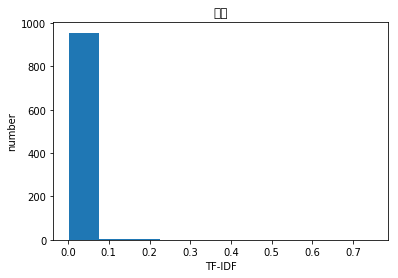

[('回音壁', 0.7284980268610366), ('回音', 0.3875446024676949), ('天坛', 0.29581195664574245), ('天坛公园', 0.1858563080172512), ('说话', 0.12057547659230694), ('穹宇', 0.1201265168298686), ('声波', 0.11100298390608111), ('声音', 0.09704228767276891), ('墙壁', 0.09053722097921077), ('围墙', 0.09003221368109014), ('皇', 0.08354199285165073), ('听到', 0.08261770118550778), ('规则', 0.06011364594039744), ('神奇', 0.055582568569621724), ('贴墙', 0.050179431080831186), ('配殿', 0.0489312386448468), ('效果', 0.047962246104729676), ('另一端', 0.04767869048059397), ('磨砖对缝', 0.04700573669863865), ('3.72', 0.045093993877296075), ('193.2', 0.044487929020275346), ('墙', 0.04398843990156672), ('听', 0.04389165567649625), ('二百米', 0.04300647973117341), ('回声', 0.04167280790480617), ('传到', 0.040870561913551685), ('靠墙', 0.04072638451525444), ('祈年殿', 0.03947100157181353), ('听见', 0.03920494059768371), ('对方', 0.03896611958268875), ('喊', 0.038879795115864674), ('61.5', 0.03848501971394942), ('弧度', 0.037831865793983684), ('光滑', 0.03672446123450581),

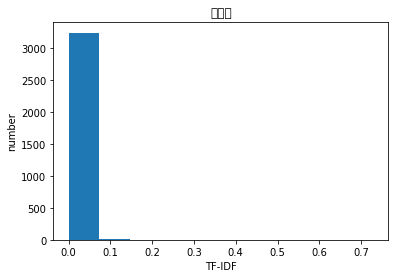

[('洛河', 0.5594421482540731), ('果大色', 0.19461054913089273), ('周家庄', 0.17380041081646153), ('日东', 0.17380041081646153), ('豆饼', 0.17380041081646153), ('京福高速', 0.16835107825386864), ('莒县', 0.16835107825386864), ('皮薄肉', 0.16412424753777335), ('亚欧大陆桥', 0.15522134281535663), ('馓子', 0.15522134281535663), ('致密', 0.1529902725020303), ('蜜桃', 0.1529902725020303), ('京沪', 0.14331410922334217), ('日照市', 0.13605939177204954), ('甘美', 0.13521737740814616), ('多汁', 0.13363794594465406), ('联结', 0.13218013418759908), ('镇', 0.1275461778349708), ('山东半岛', 0.12673080162500625), ('石榴树', 0.12621180466091853), ('鲜甜', 0.12570664927889016), ('蜜', 0.1229296563335375), ('桥头堡', 0.1229296563335375), ('南距', 0.11282780763022286), ('林园', 0.10835008312428286), ('石榴', 0.10574607954748749), ('果园', 0.09201766931579163), ('葡萄', 0.08942525472938855), ('东南部', 0.08625523534026747), ('山青水秀', 0.08570437313515311), ('洲', 0.08392093750059561), ('香气', 0.08088369428004852), ('兴起', 0.07918490620730011), ('高速公路', 0.07884588679185633), ('优越

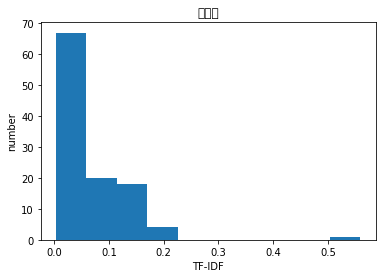

[('长城', 0.4353708805226525), ('岭', 0.20671843143839844), ('桦树', 0.2004583737384738), ('草甸', 0.17741670316432775), ('走乡', 0.17144402275659149), ('不到长城非好汉', 0.15382072157865273), ('林区', 0.13051251559610538), ('白桦林', 0.1294551483239206), ('道', 0.1233778330322457), ('崇礼', 0.12182963949459293), ('缆车', 0.11571998525609298), ('遗址', 0.11543948629049754), ('秋天', 0.10894124263933114), ('高级', 0.10442592201470524), ('古长城', 0.09941193954623656), ('开车', 0.09933497529762297), ('落叶松', 0.09909521258462807), ('生肖', 0.09660788246158229), ('凤车', 0.09192380928604556), ('应作个', 0.09192380928604556), ('盘伏', 0.09192380928604556), ('初级', 0.08976680943742453), ('林', 0.086393360728161), ('上去', 0.08305511576725462), ('氧吧', 0.08298338420961925), ('滑雪场', 0.08196052429814808), ('林海', 0.08062578607745735), ('越野车', 0.07917625526157898), ('北京', 0.07894466429545886), ('风车', 0.0778353942139118), ('体育局', 0.0733184155627961), ('园', 0.072566277041162), ('50', 0.0722163457887942), ('森林', 0.07028612683273172), ('沿天路', 0.069690

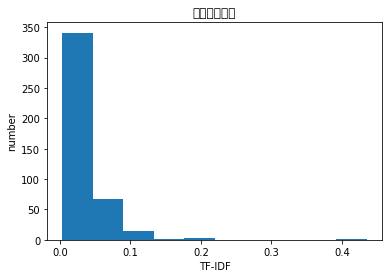

[('州政府', 0.44591619513800723), ('金银滩', 0.40363883959889374), ('海北', 0.37672043241312214), ('东北侧', 0.3485334007993304), ('藏家', 0.32134657614294443), ('青海湖', 0.28666217520508475), ('苑', 0.27307814651312634), ('投资', 0.20597946337071169), ('草原', 0.1762488861700304), ('风情', 0.12876524587593383), ('建设', 0.11576534416686896), ('由', 0.09088636382375809), ('位于', 0.0412336994500925), ('上', 0.03562846106282691), ('是', 0.009610069241067503), ('的', 0.004221638818912754), ('。', 0.00397341523907356), ('，', 0.0009523246832942395)]
defaultdict(<class 'float'>, {'。': 0.00397341523907356, '上': 0.03562846106282691, '是': 0.009610069241067503, '的': 0.004221638818912754, '风情': 0.12876524587593383, '，': 0.0009523246832942395, '位于': 0.0412336994500925, '由': 0.09088636382375809, '建设': 0.11576534416686896, '苑': 0.27307814651312634, '草原': 0.1762488861700304, '藏家': 0.32134657614294443, '投资': 0.20597946337071169, '青海湖': 0.28666217520508475, '东北侧': 0.3485334007993304, '州政府': 0.44591619513800723, '海北': 0.376720432413

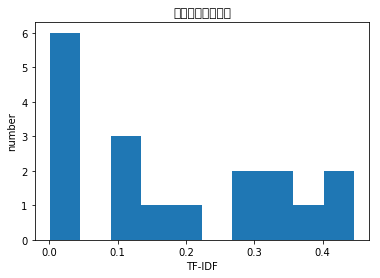

[('女人街', 0.4666818056099194), ('还价', 0.3112674071997333), ('脱胶', 0.3034672860400121), ('砍价', 0.2623336145343576), ('忧', 0.2284320044623858), ('指甲', 0.21108368750092055), ('赚点', 0.20787005761752111), ('拼命', 0.1565293892771042), ('商户', 0.15439481827239407), ('店主', 0.15261938108304002), ('杀', 0.15137541195314447), ('欢喜', 0.14586728260554244), ('好贵', 0.1283392027908786), ('服务态度', 0.1234150505007503), ('敢', 0.12313033392591057), ('里面', 0.12188004472673125), ('有人', 0.11677611447291428), ('火', 0.1140195059510555), ('不会', 0.10452034225587416), ('店铺', 0.09966597717396618), ('买', 0.09898213880642141), ('和谐', 0.09591272196370444), ('购物', 0.09497176729983568), ('上次', 0.08798093125883089), ('东西', 0.08716357034566735), ('最深', 0.08352775363106177), ('规划', 0.08337117142202036), ('虽', 0.08239174030071465), ('不怎么', 0.08177708428617876), ('几天', 0.08169598648208534), ('街', 0.07774343678189892), ('管理', 0.07745718006937499), ('小小的', 0.07645130483716486), ('反正', 0.06679844740407961), ('你', 0.0658846086073295

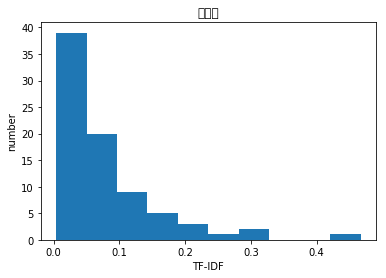

[('皮影', 0.5930857045273112), ('晓寒', 0.35952266591545723), ('而丝', 0.20128520729647983), ('扯动', 0.1877051545640285), ('毫不介意', 0.17976133295772861), ('无师自通', 0.16975330132694919), ('送机', 0.1631611794162308), ('15025086036', 0.13278206915232468), ('龙师', 0.13219719363791357), ('意味深长', 0.12950916645211527), ('接机', 0.12805725234502824), ('木棍', 0.1258535977836113), ('和顺', 0.12139860447995778), ('猪八戒', 0.1126948919298123), ('腾冲', 0.11125819481357346), ('小游戏', 0.11029288259351253), ('制定', 0.10901668154524145), ('两根', 0.10364701064981564), ('谭', 0.10364701064981564), ('买下', 0.10351327719723054), ('一个劲', 0.10043614032248065), ('孙悟空', 0.10020964213819852), ('胆量', 0.0945734110120471), ('推广', 0.09390921605839271), ('借着', 0.08778921035956198), ('艺术馆', 0.08702769634910637), ('出去玩', 0.08150671187722379), ('向导', 0.07964728924211659), ('服务员', 0.07906473270441794), ('咨询', 0.0758596475328079), ('主动', 0.07579477371614136), ('赚钱', 0.07484659475010816), ('自行', 0.06852073118060138), ('小巷', 0.067497935807173), (

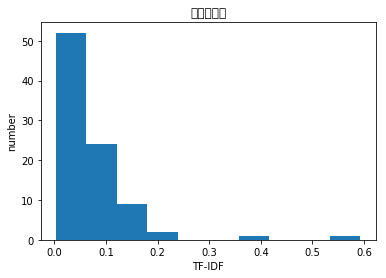

[('三坊七巷', 0.530635833642475), ('官巷', 0.48908760303665455), ('郎', 0.2939295012291586), ('严复', 0.23127854548189558), ('刘涛', 0.18502283638551645), ('郎官', 0.1622429668331365), ('数世皆为', 0.15464967698234316), ('南后', 0.1477467191215515), ('巷', 0.1470294553375161), ('巷子', 0.11611635753542175), ('因宋', 0.11598725773675737), ('巷南', 0.10816197788875766), ('坊', 0.10687817050526638), ('一巷', 0.10560666871153392), ('译著', 0.09665604811396447), ('杨桥', 0.0940189198389972), ('福州', 0.08624331291934625), ('子孙', 0.08145505490041677), ('埠', 0.07836836014299778), ('七巷', 0.0770928484939652), ('犹传', 0.07210798525917177), ('远溯', 0.07210798525917177), ('居此', 0.07182803332583124), ('宋代', 0.070984995356917), ('故居', 0.06267706444770266), ('巷内', 0.062189588554101394), ('东街口', 0.05802018758776677), ('福州市', 0.0543222421048952), ('巷口', 0.05185394262349432), ('闹区', 0.049375276000272694), ('街', 0.048650576472151416), ('门庭', 0.04579212149411581), ('"', 0.04511686643651975), ('西头', 0.044730317649362895), ('东头', 0.04305086602

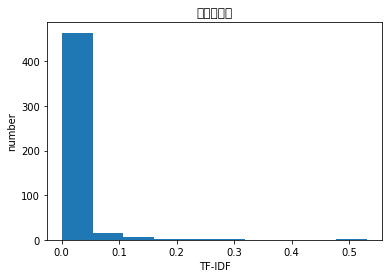

[('赣州', 0.47646674184326837), ('八境', 0.4083190388841855), ('镜台', 0.3782105672427359), ('赣江', 0.24293498380459433), ('八', 0.1999770120260519), ('八景', 0.18977438640461616), ('章江', 0.1399164085094126), ('贡江', 0.1361063462947285), ('台下', 0.13134900448311215), ('城墙', 0.12529912100014415), ('宋代', 0.1159480966416381), ('台', 0.10669065046953222), ('嘉祜', 0.10525308671564415), ('贡二水', 0.10525308671564415), ('1063', 0.08876488831350261), ('27.8', 0.08876488831350261), ('有藏兵', 0.08876488831350261), ('1055', 0.08531783331910872), ('古城墙', 0.08439690185623513), ('台内', 0.08274319398521268), ('章', 0.08191399200450893), ('可眺', 0.08068738418061351), ('台高', 0.07979597927709735), ('郁孤台', 0.07897596625604837), ('北宋', 0.07445176645917105), ('建于', 0.07034624992971512), ('中华门', 0.06854103291188164), ('十余', 0.06602982841642152), ('颇似', 0.06602982841642152), ('汇合', 0.06351566685438648), ('登台', 0.06264660349565097), ('三层', 0.05740725477361952), ('嘉佑', 0.05596656340376504), ('此台', 0.05265064417069891), ('年间', 0.05

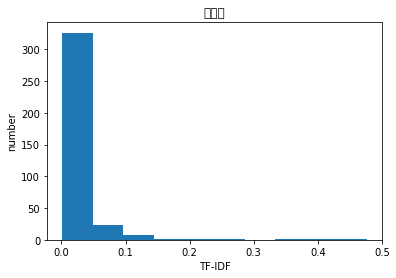

[('八斗子', 0.666982157909538), ('渔港', 0.4809190159356656), ('基隆', 0.26142850465156187), ('漁港', 0.15264100475824904), ('台湾', 0.10878849474059117), ('岬角', 0.09904230061723145), ('渔业', 0.09011043690773198), ('灣', 0.08972888186624528), ('海产', 0.08227593165226949), ('基隆市', 0.07262820348571222), ('北部', 0.0707764372555579), ('海鲜', 0.06849639318836005), ('最大', 0.0638906736438752), ('渔火', 0.06221596765998908), ('半岛', 0.061648479981329905), ('九份', 0.057985221904447305), ('海景', 0.05348009816851363), ('农委会', 0.05226478590869771), ('正滨', 0.05226478590869771), ('澳底', 0.05226478590869771), ('第一类', 0.05226478590869771), ('夕照', 0.05098553487454949), ('白带鱼', 0.04873865222891385), ('山海', 0.04839351000977569), ('天然港', 0.04667599625371039), ('海產', 0.04667599625371039), ('潮境', 0.04667599625371039), ('集結', 0.045212518549129985), ('多元', 0.044146349044355146), ('東側', 0.04407735705127899), ('海科', 0.04407735705127899), ('船', 0.04331011283946068), ('港口', 0.043220777506195227), ('基隆屿', 0.04314986257392653), ('北', 0.

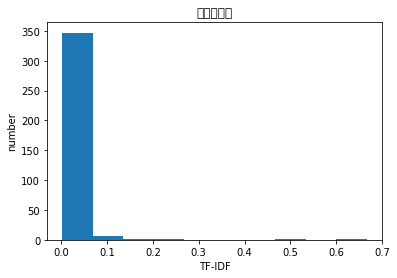

[('贝江', 0.5795531278880237), ('融水苗族自治县', 0.3863687519253491), ('脊江', 0.3273085551537974), ('流于', 0.1755746718004322), ('146', 0.15810013357656477), ('古称', 0.14479790580764476), ('千米', 0.12903869217982625), ('完贝江', 0.11699620170627782), ('贝江鱼', 0.11699620170627782), ('境内', 0.11533207190406172), ('峰峦', 0.1057393376884691), ('环江毛南族自治县', 0.10448553796968264), ('九万大山', 0.09866841060555986), ('融水县', 0.09659218798133727), ('1788', 0.09197487423308745), ('流过', 0.0890719327951938), ('背面', 0.08837585639749712), ('江段', 0.08408152424474209), ('细嫩', 0.07905006678828239), ('漂流', 0.07608096383883002), ('全长', 0.07599234351780311), ('顺江', 0.0758761630434048), ('柳江', 0.07527667216362091), ('右岸', 0.07018281621194637), ('流域面积', 0.06928568345468496), ('游江', 0.06877948025656047), ('红星', 0.06813775009658236), ('干流', 0.06798281305505945), ('鱼腥味', 0.0655034440164649), ('两岸', 0.06542644699475131), ('味道鲜美', 0.06538033258082973), ('黄泥', 0.06490077975031962), ('肉质', 0.06389037086466283), ('东麓', 0.06357255404518057

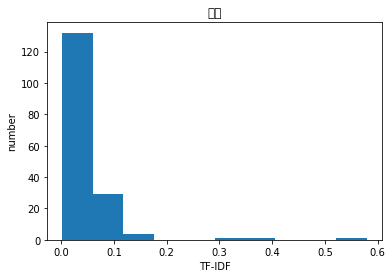

[('东海', 0.43990862810380393), ('东美亭', 0.2560306714788333), ('湖', 0.22344210537582737), ('湖修', 0.22148357220107842), ('\xa0', 0.21885495006802483), ('湖边', 0.21559175480481824), ('东海大学', 0.1840012649760235), ('鹭鸶', 0.17900045805312245), ('筑巢', 0.16473301388988337), ('大肚', 0.16116687440995997), ('有白', 0.15904470227861553), ('木梯', 0.14561265916900337), ('那刻', 0.13778475928140407), ('台地', 0.13590701631286736), ('停歇', 0.13066982232949625), ('池中', 0.13034617538568127), ('游来游去', 0.12620785725133085), ('沒什麼', 0.12411905702239912), ('校园内', 0.12313684262241266), ('砖墙', 0.12139344210538097), ('小小的', 0.11520714992801646), ('花木', 0.11307262574680386), ('榕树', 0.1106974518037888), ('砌成', 0.10852908788090118), ('牧场', 0.1078028772657887), ('环境保护', 0.1053863317371261), ('人工湖', 0.09824670501382868), ('水池', 0.09496897596495923), ('惊呆', 0.09481394924788845), ('小鱼', 0.0931694240224108), ('池塘', 0.09112191612884032), ('树上', 0.09088978770287501), ('水泥', 0.09062711897961809), ('公顷', 0.0896660565263133), ('喷泉', 0

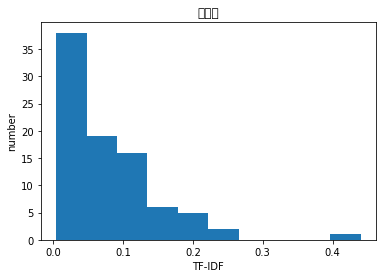

[('后花园', 0.5856513147981155), ('袁家界', 0.33460846181418485), ('张家界', 0.25700135867191143), ('石峰', 0.22458585090718922), ('黄石寨', 0.1925524253590261), ('豁朗', 0.15753741976471014), ('迷魂', 0.15363856776612642), ('数十座', 0.13503978128218783), ('斜圆门', 0.11660844439006732), ('黄狮寨', 0.11449626213525271), ('乱窜', 0.1088105795680428), ('花园', 0.10285573523707435), ('双拱', 0.10087406584198286), ('清寂', 0.0993296351762148), ('谷间', 0.09572879385229237), ('浑圆', 0.09403013218354196), ('啼', 0.08593440627048315), ('小巧', 0.0756724186793673), ('极像', 0.07473982876474548), ('东面', 0.07270383297150856), ('山谷', 0.06595733643846603), ('淙淙', 0.06581886802176215), ('百', 0.06409193516987317), ('崩塌', 0.06315548876293546), ('群贤', 0.06301496790588405), ('花木', 0.06008170844463055), ('列阵', 0.058330923153511925), ('幽雅', 0.05687308701538263), ('鸟鸣', 0.05606046310913285), ('坡', 0.05595111729493536), ('月亮', 0.053907324347623777), ('似', 0.05238956401767608), ('百座', 0.05001812316322351), ('分布', 0.04926431049247602), ('挨', 0.04802

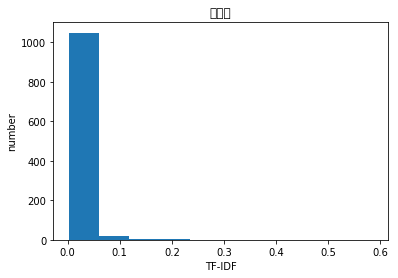

[('脚踏车', 0.5807842173414484), ('迎着', 0.49162223307068065), ('河边', 0.36271833026281675), ('骑', 0.3067678948840402), ('风', 0.26162149291241316), ('沿着', 0.21169780232829313), ('舒服', 0.21043635105710085), ('美丽', 0.17201896992926777), ('好', 0.05822937679311082), ('地方', 0.05670015862099075), ('很', 0.03223926343002306), ('是', 0.019715996677623145), ('的', 0.008661104809954833), ('。', 0.008151849865723688), ('，', 0.003907574403649575)]
defaultdict(<class 'float'>, {'。': 0.008151849865723688, '地方': 0.05670015862099075, '好': 0.05822937679311082, '很': 0.03223926343002306, '是': 0.019715996677623145, '的': 0.008661104809954833, '舒服': 0.21043635105710085, '，': 0.003907574403649575, '沿着': 0.21169780232829313, '美丽': 0.17201896992926777, '风': 0.26162149291241316, '河边': 0.36271833026281675, '骑': 0.3067678948840402, '迎着': 0.49162223307068065, '脚踏车': 0.5807842173414484})
[0.008151849865723688, 0.05670015862099075, 0.05822937679311082, 0.03223926343002306, 0.019715996677623145, 0.008661104809954833, 0.210436

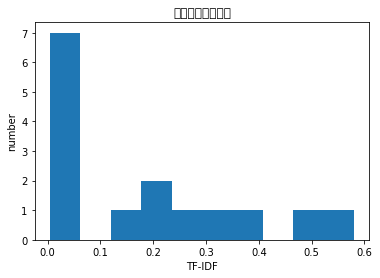

[('拉萨', 0.41433620743862554), ('娘热', 0.30383780758294443), ('贡村', 0.2818558142878092), ('4000', 0.26600995634233754), ('村居', 0.24447675980485026), ('推到', 0.21045989346420738), ('考古学家', 0.198733990418616), ('文明史', 0.19650758080933411), ('北郊', 0.17762891878363452), ('先民', 0.16670523643076116), ('遗址', 0.16366802345884698), ('曲', 0.1590872060433755), ('1984', 0.15716459845343708), ('山沟', 0.15122750027519866), ('坚强', 0.14910833755532146), ('考古', 0.13604935833754905), ('生存', 0.13502752752549183), ('深深地', 0.13366493219336423), ('发掘', 0.13235847828687575), ('艰难', 0.12160666887312749), ('西藏', 0.11135124521274656), ('年', 0.09612138193364775), ('古人', 0.09556457724511593), ('伟大', 0.09532037132026257), ('佩服', 0.09393566841476446), ('民族', 0.08834120692453626), ('是否', 0.0867829250547553), ('感到', 0.08277286475772269), ('一样', 0.0773948154184425), ('建成', 0.07721496749645476), ('依然', 0.06890798696703149), ('能够', 0.06755267181373927), ('如此', 0.06597117047893047), ('震撼', 0.06128605035167301), ('下来', 0.0534

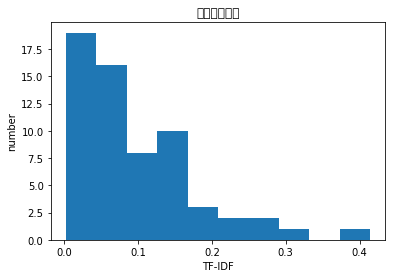

[('窑洞', 0.4308411600812713), ('枣园', 0.32762116936635105), ('周总理', 0.3107039985757624), ('故居', 0.27963388025867053), ('周恩来', 0.22327408165940738), ('革命', 0.19933625168743496), ('延安', 0.18489444240397396), ('杨家岭', 0.17177135787115577), ('总理', 0.16583782016782422), ('教育', 0.1235536194953894), ('孔石', 0.1025870152090609), ('延园', 0.1025870152090609), ('伟人', 0.09857515450848256), ('办公', 0.09380310640978377), ('纺车', 0.09322669967302981), ('王家坪', 0.09201055597548986), ('纺线', 0.08990607489131656), ('距城', 0.08812676148749597), ('独门独院', 0.0865854501096033), ('左上方', 0.08460183598644623), ('基地', 0.08454448333668135), ('延安市', 0.08054575935528546), ('谈判', 0.07822947986440082), ('1944', 0.07822947986440082), ('套间', 0.07722513457357223), ('老前辈', 0.07600899087603227), ('毛泽东故居', 0.07572397172070561), ('1943', 0.07366650776593105), ('1947', 0.0729806016858343), ('伟', 0.0729806016858343), ('非常简单', 0.07172014818605887), ('战火纷飞', 0.07152283245290088), ('1954', 0.06800820832630347), ('怀念', 0.06661481464362673)

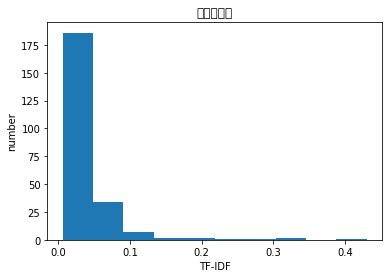

[('会址', 0.5352826851124097), ('新天地', 0.4957912375708358), ('中共一大', 0.35169139448734166), ('石库门', 0.2174789856799756), ('中国共产党', 0.16764171729382385), ('教育', 0.14205804229631636), ('上海', 0.1367189726286549), ('兴业', 0.11239246429686904), ('一大', 0.10769120233149539), ('历史', 0.09532606737179528), ('中国共产党第一次全国代表大会', 0.08039135176184792), ('黄陂', 0.08027448359682922), ('爱国主义', 0.0759972991129895), ('中共', 0.07348480604384999), ('红色', 0.07029869906514992), ('诞生地', 0.06975999121458644), ('党员', 0.06860761454460255), ('党', 0.0684317305582145), ('免费', 0.0654376346821574), ('基地', 0.06543354997748563), ('参观', 0.06190097124877896), ('革命', 0.05874397664181515), ('望志路', 0.058246344494603815), ('党史', 0.057479823437985855), ('建筑', 0.056752078770239585), ('南路', 0.054623359058649824), ('76', 0.05187556121376499), ('共产党', 0.051805338041740576), ('纪念馆', 0.04991898896733939), ('砖木结构', 0.048905652364783066), ('李汉俊', 0.04765610004103949), ('开会', 0.04624249442630136), ('意义', 0.04606391624276186), ('上海市', 0.043760

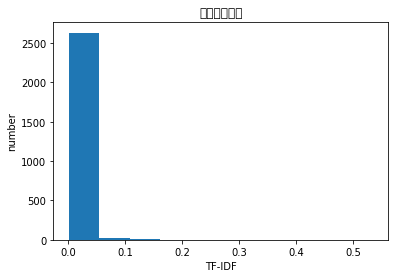

[('不周', 0.5333770842706468), ('伍山', 0.36008049930703523), ('石窟', 0.3427767474171964), ('赋', 0.2406375145017219), ('采石', 0.23621079359350847), ('油灯', 0.21230798997379458), ('神话故事', 0.1975636450532873), ('冬暖夏凉', 0.17329658496361156), ('描写', 0.16945438109938274), ('神山', 0.16772741474545197), ('洞口', 0.15779761492540242), ('劳动', 0.1501615342661041), ('古时', 0.13140256943562464), ('力量', 0.11969162137288987), ('智慧', 0.11673882021107193), ('核心', 0.10903652502260847), ('有关', 0.09751693437853731), ('可爱', 0.09693075487932673), ('展示', 0.08446616722790097), ('一游', 0.08429466378907263), ('体会', 0.08118777414870425), ('人民', 0.08101936301533286), ('景区', 0.07550929943844044), ('部分', 0.07500720405883275), ('传说', 0.07238048242847384), ('几个', 0.05500756386790513), ('文化', 0.05364213543730349), ('游客', 0.04246275784612964), ('让', 0.03804630088911568), ('与', 0.036476371142933554), ('里', 0.03350154041277324), ('小', 0.03199755812818853), ('非常', 0.02742655667122227), ('这个', 0.026945153668251936), ('到', 0.020805084

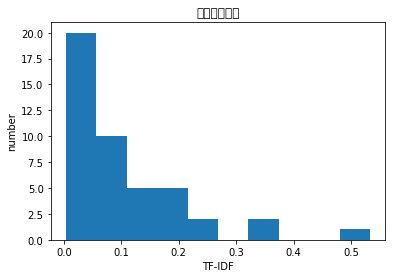

[('茂兰', 0.8173247164085868), ('荔波', 0.18176191933156943), ('森林', 0.16861321682935937), ('七孔', 0.15103639949416173), ('茂兰喀斯特', 0.11560656493921051), ('喀斯特', 0.10911462313740677), ('金狮', 0.10443872995403962), ('石上', 0.09748229891401244), ('向导', 0.08254209274406588), ('景区', 0.08041972069118411), ('原始森林', 0.08037287630290728), ('保护区', 0.07289044249093955), ('拉滩', 0.07036921344125857), ('龙潭', 0.0692356772517943), ('喀斯特地貌', 0.06425626760906783), ('包车', 0.06020332605449749), ('青龙', 0.05996007389443989), ('穿越', 0.05848898447881144), ('洞', 0.05808174944664384), ('青', 0.05661917401758505), ('荔波县', 0.05568272196202476), ('溶洞', 0.05529119155598635), ('徒步', 0.055078700557455854), ('贵州', 0.05270556098128454), ('自然保护区', 0.05248380271931283), ('开发', 0.05082116363247924), ('景点', 0.04932162068123193), ('原始', 0.04755137778595019), ('瀑布', 0.047058484837432614), ('原生态', 0.04257368857347816), ('、', 0.040763802673757475), ('我们', 0.03933927972973875), ('师傅', 0.03821132285303312), ('沟', 0.03722174528733244), (

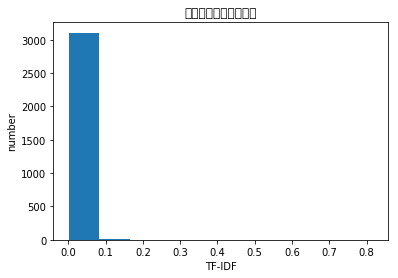

[('崇安', 0.7066711048463639), ('无锡', 0.3517432211539731), ('阿炳', 0.317298469108328), ('寺', 0.22804893890462044), ('步行街', 0.16848132385752626), ('无锡市', 0.1427176276770351), ('商业街', 0.09695229198488715), ('南禅寺', 0.0942929222507062), ('市中心', 0.09146121749090029), ('逛街', 0.08459226199272982), ('故居', 0.07989879022018462), ('购物', 0.07879228044250855), ('二泉映月', 0.06649730503207253), ('商场', 0.06560289916507617), ('瞎子', 0.06188283018153945), ('小吃', 0.05629478417848829), ('夫子庙', 0.055689051814365634), ('中心', 0.0527451462041867), ('寺庙', 0.049243290325931846), ('吃', 0.04372203021126592), ('无锡人', 0.043519810269556695), ('图书馆', 0.043285411873865406), ('商业', 0.043273365203315546), ('城中', 0.04281985653431451), ('玄妙', 0.042335713083790194), ('公园', 0.040438975415524096), ('城隍庙', 0.03963303900326457), ('商业区', 0.03756559676351632), ('地下', 0.03729470883522466), ('、', 0.03626802427295877), ('美食', 0.03391150570492194), ('三阳', 0.033248652516036266), ('繁华', 0.03313727371927757), ('吴会', 0.03252853598477577), ('广

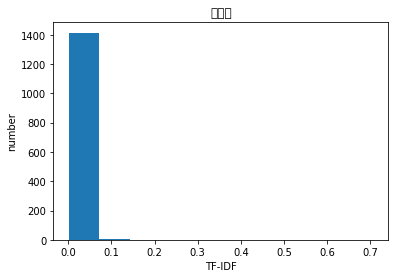

[('山海关', 0.6153025398407307), ('天下第一关', 0.5504464891801112), ('城楼', 0.4147713752225455), ('长城', 0.15776173475393068), ('万里长城', 0.07670433010256204), ('嘉峪关', 0.07528359296364084), ('秦皇岛', 0.07402273586952093), ('第一关', 0.07142097425239978), (' ', 0.062385867453351236), ('城墙', 0.05957216862508508), ('榆关', 0.058991383099644225), ('明长城', 0.05867920426229564), ('老龙头', 0.05784332790059917), ('关外', 0.04620150888178921), ('起点', 0.04450707834672998), ('历史', 0.03693039679066098), ('角山', 0.03692227921143786), ('古城', 0.03579446983291278), ('关隘', 0.03195699607725357), ('雄伟', 0.03175436335065394), ('雄关', 0.028818836302400216), ('牌匾', 0.028773606755339545), ('秦皇岛市', 0.027816545108697226), ('了', 0.027713393821873898), ('”', 0.02730898533929817), ('“', 0.027152491981155893), ('关内', 0.026278018346274423), ('渝水', 0.026218392488730768), ('入关', 0.02595066501494349), ('城门', 0.02480974591154453), ('去', 0.024767559395474367), ('吴三桂', 0.024548453249880246), ('东端', 0.0240533842825172), ('·', 0.023423955967270146

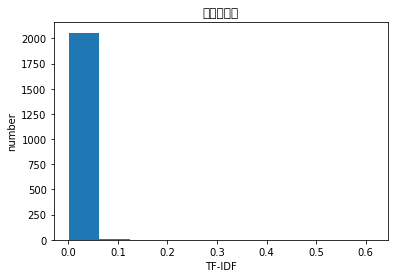

[('紫阳', 0.5851731716899886), ('中国人民银行', 0.2609684378244322), ('支行', 0.2609684378244322), ('柜台', 0.2417552531837867), ('台州', 0.20591727577175054), ('银行', 0.2029619586986402), ('临海', 0.18866284601971456), ('陈列馆', 0.18799561438648046), ('249', 0.18330273344404968), ('真人', 0.14193192456739806), ('街上', 0.13336838986336377), ('民国时期', 0.13023239379391635), ('汇款单', 0.11812563621282322), ('银行职员', 0.11015608698280112), ('旧址', 0.10863308174172318), ('蜡像', 0.10692553716157605), ('支票', 0.10549419953558702), ('很行', 0.08863479970636866), ('临海市', 0.0855503998735926), ('街', 0.0810777504831665), ('金库', 0.077247562694564), ('解放初期', 0.07515129704808196), ('假人', 0.0724766921645312), ('急忙', 0.06718174781805986), ('未有', 0.06626144644888572), ('太像', 0.06461612601732779), ('VIP', 0.06289078380076346), ('告示', 0.06013820456122487), ('业务', 0.058228896353549366), ('拦着', 0.05755775667313569), ('式样', 0.05506347509602161), ('顾客', 0.05506347509602161), ('古', 0.05401854337340199), ('瞧', 0.05273890256751039), ('扫兴', 0.0

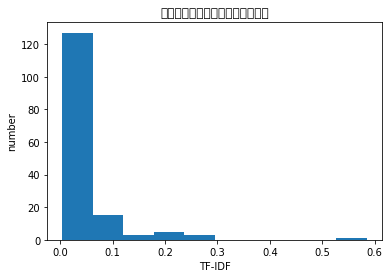

[('电视塔', 0.6066456086439592), ('北京', 0.2702846126017705), ('旋转', 0.267687238988152), ('玉渊潭公园', 0.22003344565410238), ('中央', 0.2159013913870329), ('餐厅', 0.188496662735798), ('西三环', 0.18066351078570156), ('玉渊潭', 0.1489416891095116), ('北京城', 0.14516002323249233), ('高塔', 0.13254188368395983), ('海底', 0.11809598865979874), ('广播', 0.11362269465164922), ('航天桥', 0.09778615315109453), ('塔', 0.08801300651662217), ('世界', 0.07749103779121998), ('上去', 0.07108941430712665), ('夜景', 0.07101470484453734), ('386.5', 0.07039825298073739), ('中央电视台', 0.06953529747679395), ('公主坟', 0.06709006485642255), ('上面', 0.06543177126359108), ('登塔', 0.06294994150031046), ('俯瞰', 0.061380618773067004), ('裤衩', 0.059941283382805306), ('天气', 0.05898807936434327), ('405', 0.05846978571538671), ('海淀区', 0.05675690873062183), ('广播电视', 0.05595944965075967), ('阜成路', 0.055473892421622435), ('海洋馆', 0.05356575981470743), ('15.4', 0.05238543918808636), (' ', 0.05092206473439443), ('高', 0.050170746902501416), ('央视', 0.05005903102600956

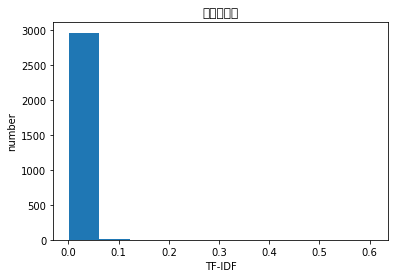

[('仿刻', 0.37001223071801664), ('汉影云根', 0.37001223071801664), ('明鲁王', 0.32008520754237474), ('崩落', 0.28708524022738807), ('1651', 0.2805189777893605), ('石碣', 0.27248252206219475), ('倒立', 0.23540105224927038), ('碣石', 0.22568919051608274), ('题刻', 0.19819729120043716), ('四个', 0.17654907112752263), ('字', 0.15767552517264846), ('根', 0.13950865891969452), ('所', 0.12717222546338192), ('步', 0.12510591203100876), ('明朝', 0.1236132666646775), ('两条', 0.11648073315621217), ('不见', 0.11386364703772466), ('地面', 0.10870403827178113), ('登山', 0.09847702220678971), ('旁边', 0.09236700738010198), ('关系', 0.08699929372738877), ('走进', 0.0770515419255794), ('似乎', 0.07696714883629825), ('道', 0.0709458775479095), ('后面', 0.06691853974229803), ('已', 0.06382672223767433), ('原来', 0.06057617069017364), ('欣赏', 0.060005864691689226), ('”', 0.05858576878019835), ('“', 0.058250044710561576), ('据说', 0.04804615527940026), ('于', 0.04442527170528392), ('可', 0.04316279192631043), ('已经', 0.03860080705281408), ('时间', 0.03777515653

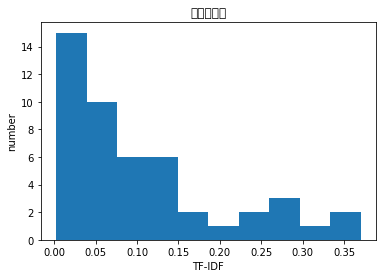

[('鱼类', 0.40758179486378343), ('趟', 0.3124112951823574), ('划船', 0.28878446658349677), ('钓鱼', 0.2847907800668344), ('美味', 0.2714518698887796), ('种类', 0.2584684782391791), ('品尝', 0.2568945318433338), ('水质', 0.25631875388088815), ('鱼', 0.23331360881497293), ('清澈', 0.19852021192927274), ('娱乐', 0.19336746099869775), ('住宿', 0.18591449377012065), ('好去处', 0.14947660811484348), ('休闲', 0.13867615481427675), ('、', 0.13360347048685425), ('此', 0.1333922738770894), ('好多', 0.1253869364130635), ('各种', 0.11620958641612622), ('推荐', 0.10012617634095923), ('可以', 0.06819769512175478), ('感觉', 0.060571423244758935), ('！', 0.04496609164493262), ('还', 0.04383147407344961), ('这里', 0.04124352046313575), ('都', 0.03466446874589518), ('去', 0.028399216051316498), ('有', 0.02217572838398084), ('了', 0.01935840042343169), ('在', 0.019111509476644757), ('，', 0.008576968303895125), ('的', 0.0063369253112037114)]
defaultdict(<class 'float'>, {'、': 0.13360347048685425, '了': 0.01935840042343169, '休闲': 0.13867615481427675, '去':

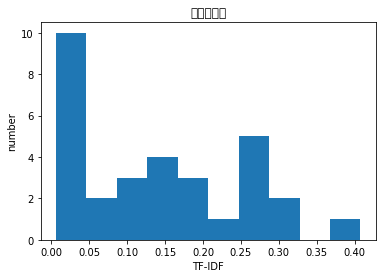

[('昭通', 0.5551532181164205), ('宝山', 0.4419517348667135), ('...............', 0.4260431080011691), ('圆', 0.29137219385266766), ('很难', 0.20478922259528046), ('谁', 0.1815820397022469), ('累', 0.16914550937418374), ('爬山', 0.16608515205142124), ('真的', 0.15256251903801435), (')', 0.14751145144060768), ('(', 0.14738697054264588), ('贵', 0.13286559473302686), ('路', 0.09245900996029632), ('走', 0.06664581426359192), ('还', 0.03949473378381302), ('，', 0.0025761174817506387)]
defaultdict(<class 'float'>, {'真的': 0.15256251903801435, '谁': 0.1815820397022469, '走': 0.06664581426359192, '还': 0.03949473378381302, '，': 0.0025761174817506387, '爬山': 0.16608515205142124, '路': 0.09245900996029632, '贵': 0.13286559473302686, '(': 0.14738697054264588, ')': 0.14751145144060768, '累': 0.16914550937418374, '圆': 0.29137219385266766, '很难': 0.20478922259528046, '昭通': 0.5551532181164205, '...............': 0.4260431080011691, '宝山': 0.4419517348667135})
[0.15256251903801435, 0.1815820397022469, 0.06664581426359192, 0.03949

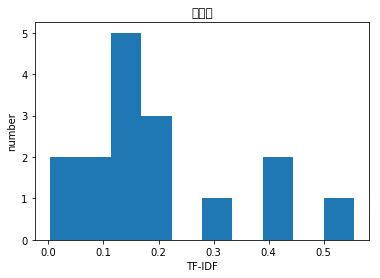

[('玉溪', 0.6549410147352401), ('庙街', 0.3383518435748729), ('米线', 0.18988264698921625), ('小吃', 0.1760399313209572), ('稀饭', 0.1425882142560471), ('好吃', 0.14001774985110566), ('逛街', 0.09488548518195014), ('洪记凉', 0.09324359051383378), ('找清', 0.08327284625463142), ('胡九', 0.08327284625463142), ('卖冰', 0.08066191207706863), ('红塔集团', 0.08066191207706863), ('有烟', 0.07863671419225202), ('凉卷', 0.07698200703624886), ('相得映', 0.07558297207023446), ('叙旧', 0.07330210199542905), ('各种', 0.07288221146300884), ('商业区', 0.07178827278843201), ('小吃街', 0.07095724799356384), ('食馆', 0.07069116781786627), ('街道', 0.07023332556479249), ('买手机', 0.06996471920969126), ('鳝鱼', 0.06866596993304967), ('彰', 0.0670112627770465), ('~', 0.06685991240658946), ('吃货', 0.06570416462629705), ('冰', 0.06563412650048187), ('冒菜', 0.0656122278110321), ('傣味', 0.0644003285994837), ('五六层', 0.06402983787067029), ('变宽', 0.0633313577362267), ('商品种类', 0.062375130714667104), ('房子', 0.060015945424575855), ('东西', 0.0597952310372138), ('饵', 0.05910

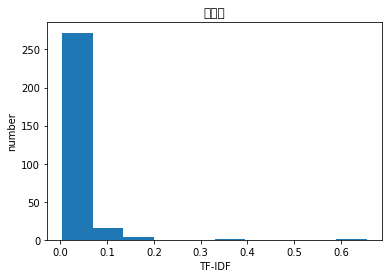

[('龙池', 0.6892107858295673), ('都江堰', 0.16473954654657155), ('森林公园', 0.13168698008389057), ('银鹊', 0.12662260604744097), ('三迭系', 0.11807979413224699), ('莲香树', 0.11807979413224699), ('都江堰市', 0.11618952678503697), ('圆叶', 0.11308256951114463), ('84', 0.10205424643213692), ('地震', 0.09593762881933351), ('雪景', 0.09351635955913261), ('国家森林公园', 0.09107098063768992), ('很烂', 0.08720478102834965), ('地质灾害', 0.08512178811847923), ('珙桐', 0.08316136786910096), ('距', 0.07603162003091976), ('国家级', 0.07598119114544619), ('面包车', 0.07579907240992098), ('512', 0.07308662731761531), ('星期五', 0.07292759708035788), ('濒危', 0.0727705927611432), ('烂', 0.07083061374990059), ('玉兰', 0.06721421494646997), ('亿万年', 0.06589581861862862), ('汶川', 0.06563076168502927), ('泥石流', 0.06470492452513285), ('活化石', 0.0635450090394247), ('倾碧浪', 0.06331130302372048), ('岩牛', 0.06331130302372048), ('成都市', 0.06208517439093765), ('成都', 0.06048499187798428), ('自行处理', 0.059039897066123496), ('公里', 0.057886640837205496), ('树种', 0.057000849249

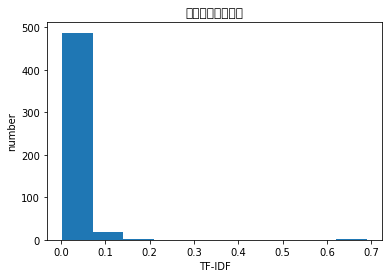

[('宁海', 0.6723459303778003), ('步', 0.20676556453212397), ('许家', 0.18978908606571207), ('登山', 0.18445606868133893), ('健身', 0.16563596715155882), ('相寺', 0.14563629131553005), ('道', 0.1407047598401381), ('步道', 0.12624477795215208), ('西林', 0.10908817359056333), ('龙潭', 0.0910759078551216), ('国家级', 0.08562253731053612), ('上柴', 0.08153708755105404), ('从妙', 0.08153708755105404), ('大短柱', 0.08153708755105404), ('撤点', 0.08153708755105404), ('鸟坑', 0.08153708755105404), ('龙储', 0.08153708755105404), ('山', 0.07828422509784275), ('王社', 0.07603604769091735), ('水库', 0.0754884894474279), ('茶园', 0.07415372703800155), ('鸟笼', 0.0733677975856794), ('求带', 0.06876406854870738), ('窑头', 0.06876406854870738), ('麦饼', 0.0660937162232642), ('国家标准', 0.06409920376447599), ('养鸡场', 0.06250661632351305), ('宁海县', 0.06250661632351305), ('杜鹃山', 0.06118082116152688), ('驴友', 0.06089183485824689), ('麻薯', 0.059532928110507234), ('时而', 0.058799123085212214), ('难度', 0.05615952439971034), ('符合', 0.05610307153930613), ('hiking', 0.

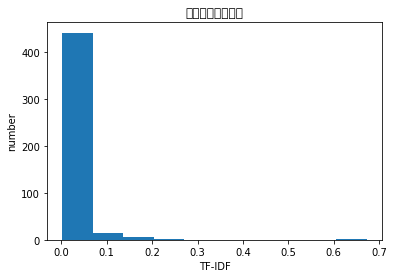

[('滨州', 0.4502093454878515), ('受田', 0.42071338445172757), ('帝师', 0.3098196074174977), ('杜', 0.2589112362648401), ('授田', 0.21035669222586378), ('仿石', 0.19616461615917302), ('故居', 0.18600924072684027), ('没多大点', 0.17740371208183592), ('一代', 0.14397160734388986), ('名门望族', 0.14004636133953446), ('英才', 0.13642373379497943), ('大家风范', 0.13587770576259306), ('迁址', 0.1343219066450723), ('文化名人', 0.1201298305783815), ('写满', 0.10860057121292652), ('新建', 0.10033762217979865), ('原地', 0.09682008369233758), ('数百年', 0.09535421525859236), ('出过', 0.09483956028388432), ('我用', 0.094479712045032), ('民宅', 0.08783656770463479), ('手中', 0.08737758574574407), ('复原', 0.08412076192964513), ('贡献', 0.0808298081090663), ('学院', 0.07631232308227545), (' ', 0.07152220480577154), ('翻新', 0.07087503164836217), ('皇帝', 0.07038539262920326), ('了解', 0.0702444786012245), ('破败', 0.06923097287585221), ('修复', 0.06819738706155763), ('居多', 0.06685868567326239), ('仿古', 0.06493417021640052), ('后人', 0.06491732542913915), ('老师', 0.064550

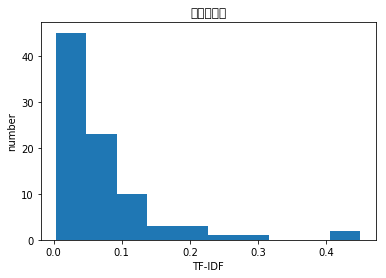

[('戏台', 0.7359554539232619), ('嘉峪关', 0.3366520844185373), ('关城', 0.1498633200167042), ('佞认', 0.13362552930742705), ('愚贤忠', 0.13362552930742705), ('守城', 0.12617243536953515), ('离合悲欢', 0.12461025312906522), ('官兵', 0.1047391233550128), ('城内', 0.10200593811829972), ('娱乐场所', 0.09713314968462235), ('商旅', 0.09428324825354992), ('对联', 0.08475532232582686), ('~', 0.08184249728707058), ('八卦图', 0.08127062081930876), ('看戏', 0.07874537056804), ('1792', 0.0700318533031537), ('戏台子', 0.06852874242523499), ('关帝庙', 0.06705939589141767), ('袋什衣', 0.06681276465371352), ('屏风', 0.0666757015701531), ('过往', 0.06660909022217572), ('往事', 0.06384926639890988), ('关', 0.06299781325478988), ('当场', 0.0627836604320334), ('演', 0.06186391350953948), ('两侧', 0.0559660665424533), ('绘画', 0.05402314027226579), ('五十七年', 0.05183871504367904), ('唱戏', 0.05155326125794957), ('及', 0.04662896409018571), ('尼姑', 0.04557954099443216), ('八仙', 0.04557954099443216), ('壁画', 0.04528229913986151), ('游击', 0.044481040663734074), ('清乾隆', 0.042

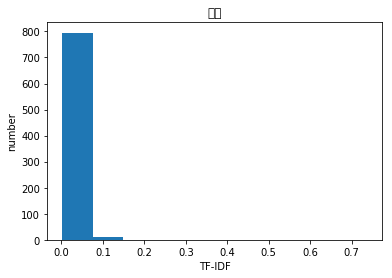

[('神女峰', 0.7949338828346264), ('神女', 0.36629879978408547), ('巫峡', 0.17130402677132486), ('三峡', 0.15704365637615103), ('十二峰', 0.14481984135304213), ('巫山', 0.13787492394659503), ('巫山县', 0.08058753271063099), ('巫山云雨', 0.07065216975626827), ('亭亭玉立', 0.06563603231480049), ('游轮', 0.05184399880933839), ('山峰', 0.049473074808849354), ('无恙', 0.04839190943752293), ('少女', 0.04577615990600058), ('长江', 0.04439764459900914), ('薄纱', 0.04186271997532406), ('想象力', 0.0416129809598147), ('游船', 0.041608819915033034), ('青石', 0.036731131086925904), ('重庆', 0.036351766371329385), ('望霞峰', 0.035432389139713374), ('妩媚动人', 0.03490615980480831), ('看', 0.034705530051886604), ('美丽动人', 0.03408210821017725), ('青峰', 0.0333424127731269), ('楚襄王', 0.033041882060644685), ('像', 0.032407729059271445), ('红叶', 0.03238605583197342), ('一根', 0.030828962706476008), ('美人峰', 0.030651374981575996), ('脉脉含情', 0.030651374981575996), ('文人墨客', 0.030226894751296217), ('长江三峡', 0.029813189974789704), ('云霞', 0.029429817647055958), ('当惊', 0.029

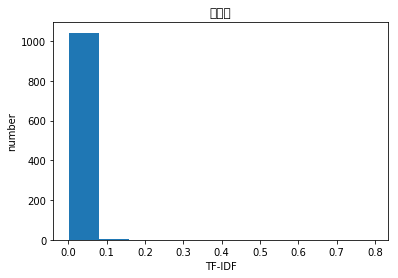

[('达活泉', 0.6005824634769795), ('邢台', 0.499163389626946), ('郭守敬', 0.2852094096964482), ('公园', 0.2570414577076376), ('郭守敬纪念馆', 0.23501052918664417), ('邢台市', 0.19213432054471472), ('河北省', 0.09185719352241734), ('观星台', 0.061325880475870065), ('多亩', 0.05954244705390126), ('市内', 0.05501853010271633), ('健身', 0.05482741084552597), (' ', 0.04804981266243972), ('休闲', 0.04545393944882884), ('八景', 0.045187296166815695), ('卧牛', 0.044829219869621524), ('活泉', 0.043878370722530494), ('天文学', 0.04235144856816888), ('800', 0.04127995018212214), ('泉眼', 0.040609682739917524), ('碧透', 0.039933071170155675), ('市民', 0.03602253444462987), ('最大', 0.035742809124519194), ('好', 0.034910589549076325), ('西北', 0.034472859865775286), ('人工湖', 0.0336594987206013), ('花园', 0.03257740915870909), ('锻炼', 0.03166622473031636), ('主泉似', 0.029238856943051263), ('争溢', 0.029238856943051263), ('开涌', 0.029238856943051263), ('春绿秋红', 0.029238856943051263), ('爽秋山', 0.029238856943051263), ('百穴', 0.029238856943051263), ('翻华', 0.0292388569

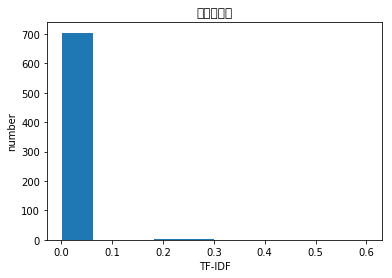

[('尼汝村', 0.6152750698193665), ('香格里拉', 0.29024051511476845), ('洛桑', 0.2225589470264184), ('牧场', 0.12834571271992085), ('村子', 0.11895744075445827), ('秘境', 0.10345656321673549), ('并流', 0.09529427038640871), ('南宝', 0.09475149998069929), ('藏族', 0.09372541328926023), ('松巴', 0.09074154610104038), ('骡子', 0.09071428920798272), ('高原', 0.0840048328356945), ('黑陶', 0.07883454024241862), ('家', 0.07595368502632448), ('汝', 0.07550690951993283), ('三江', 0.07403539189810857), ('藏名', 0.07197947880734312), ('户', 0.0698621589214159), ('108', 0.06593950487547572), ('稻城县', 0.06589543855122754), ('他们', 0.06550858191860785), ('香格里拉县', 0.06418182226942247), ('伊甸园', 0.06395957104802528), ('村落', 0.062072607462639574), ('尼', 0.05973225098689928), ('650', 0.05958994978165217), ('第一村', 0.0568871434314827), ('高山', 0.056366650587127747), ('?', 0.053697853666817744), ('、', 0.05326192829374747), ('骑马', 0.05088524317304616), ('丁汝湖', 0.050803280707887394), ('东尼乡', 0.050803280707887394), ('介给', 0.050803280707887394), ('吉才家

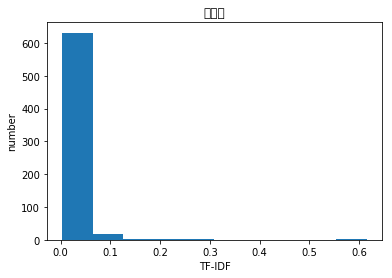

[('湖口', 0.6633204381484988), ('老街', 0.3073232695821154), ('進為', 0.18975412580720108), ('為', 0.14002862505579133), ('舖', 0.13537178189946797), ('话梅', 0.13105703016958048), ('新竹', 0.12517534593468027), ('房舍', 0.09556209400630682), ('兩進間', 0.09487706290360054), ('大窩口', 0.09487706290360054), ('屬於羅馬', 0.09487706290360054), ('成貨物', 0.09487706290360054), ('採閩南式', 0.09487706290360054), ('條形店', 0.09487706290360054), ('而興盛', 0.09487706290360054), ('吃梅', 0.08847601866077541), ('建築式樣', 0.08847601866077541), ('架構', 0.08847601866077541), ('这包', 0.08847601866077541), ('以紅磚', 0.08473164781326566), ('因應', 0.08473164781326566), ('宮為', 0.08473164781326566), ('廚房', 0.08473164781326566), ('幾棟', 0.08207497441795025), ('遷移', 0.08207497441795025), ('因位', 0.08001429843956784), ('混用', 0.07833060357044051), ('牌樓', 0.07833060357044051), ('舊稱', 0.07833060357044051), ('與', 0.0759207240433372), ('望梅止渴', 0.07567393017512512), ('止渴', 0.07567393017512512), ('沒落', 0.07192955932761537), ('1893', 0.07050601559937177), ('山

KeyboardInterrupt: 

In [164]:
# attraction_name, item = doc2bow_review(dictionary, root_path)
# item 是由元组构成的列表，(word_id, word_frequency)
for attraction_name, item in doc2bow_review(dictionary, root_path):
    tfidf_review = defaultdict(float)  # 统计单个景点的 TF-IDF
    tfidf_item = tfidf_model[item]
    for word in tfidf_item:
        tfidf_review [dictionary.get(word[0])] = word[1]
    tfidf_review_list = [x for x in tfidf_review.values()]
    print(sorted(tfidf_review.items(), key = lambda x:x[1], reverse = True))
    print(tfidf_review)
    print(tfidf_review_list)
    draw_hist(tfidf_review_list,attraction_name,'TF-IDF','number')

## 词性汇总统计

In [13]:
start = time.time()
data_pos = []    # 带有词性标注的分词结果
result_pos = []  # 带有词性标注的频繁子序列
rd = read_data.ReadData()
ws = segmentation.WordSegmentation()
try:
    for item in rd.generate_data(file_path):
        temp = ws.seg_pos([item])
        data_pos.append(temp[0])
        # break
except Exception as e:
    print(e)
# print(data_pos)
# fw = ngrams_pos.FreqPhrase(min_count=1, threshold=0, stopwords_file=stopwords_file)
# count = 0
# for item, value in fw.combine2words(data_pos).items():
#     count += 1
#     # 景点名，评论数量，频繁子序列，频繁子序列出现次数
#     # result.append(['test', len(data), ''.join(item), value[0]])
#     result_pos.append([''.join(x.word for x in item), '/'.join(x.flag for x in item), value[0]])
print('run time:', time.time() - start)
# print(result_pos)
# print('频繁子序列的个数：', count)

# count_final = 0
# result_final = []
# pf = rules_filter.pos_filter()
# for item in result_pos:
#     pos = item[1].split('/')
#     if pf.pos_refuse(pos):
#         continue
#     else:
#         count_final += 1
#         result_final.append(item)
# # print(result_final)
# print('频繁子序列的个数：', count_final)

run time: 0.010968208312988281


In [54]:
# 带词性
start = time.time()
count = 0
dictionary = corpora.Dictionary()
for parent, dirnames, filenames in os.walk('/Users/monabai/Desktop/data/pinglun'):
    print(len(filenames))
    result_pos = []
    for filename in filenames:
        attraction_name = filename[:-4]
        if attraction_name == '闻一多纪念馆':
#         if attraction_name != 'pinglun':
            file_path = '/Users/monabai/Desktop/data/pinglun/' + attraction_name + '.txt'
            print(file_path)
            data_pos = []
            rd = read_data.ReadData()
            ws = segmentation.WordSegmentation()
            try:
                for item in rd.generate_data(file_path):
                    temp = ws.seg_pos([item])
                    data_pos.extend(temp[0])
            except Exception as e:
                print(e)
                continue
#             print(type(data_pos))
            print(data_pos)
            count += 1
            dictionary.add_documents([data_pos])
            if count == 1:
                break
#             fw = ngrams_pos.FreqPhrase(min_count=10, threshold=0.4, stopwords_file=stopwords_file)
#             for item, value in fw.combine2words(data_pos).items():
                # 景点名，评论数量，频繁子序列，频繁子序列出现次数
                # result.append(['test', len(data), ''.join(item), value[0]])
#                 result_pos.append([''.join(x.word for x in item), '/'.join(x.flag for x in item), value[0]])
        # with open(output_file, 'w') as f:
        #     csv.writer(f).writerows(result)

print('run time:', time.time()-start)

35404
/Users/monabai/Desktop/data/pinglun/闻一多纪念馆.txt
[pair('闻一多', 'l'), pair('为', 'p'), pair('湖北', 'ns'), pair('浠水县', 'ns'), pair('人', 'n'), pair('，', 'x'), pair('著名', 'a'), pair('爱国人士', 'n'), pair('我', 'r'), pair('在', 'p'), pair('实高', 'v'), pair('读书', 'n'), pair('的', 'uj'), pair('时候', 'n'), pair('去过', 'vq'), pair('好几回', 'm'), pair('，', 'x'), pair('不要', 'df'), pair('门票', 'n'), pair('，', 'x'), pair('又', 'd'), pair('近', 'a'), pair('，', 'x'), pair('那', 'r'), pair('时候', 'n'), pair('周末', 't'), pair('叫', 'v'), pair('上', 'f'), pair('胡', 'nr'), pair('季春', 'nr'), pair('，', 'x'), pair('涂文涛', 'nr'), pair('，', 'x'), pair('余翔', 'nr'), pair('，', 'x'), pair('我们', 'r'), pair('几个', 'm'), pair('就', 'd'), pair('一起', 'm'), pair('去', 'v'), pair('里面', 'f'), pair('玩', 'v'), pair('，', 'x'), pair('看看', 'v'), pair('充满', 'a'), pair('文化', 'n'), pair('气息', 'n'), pair('的', 'uj'), pair('古物', 'n'), pair('，', 'x'), pair('读读', 'v'), pair('秀丽', 'a'), pair('典雅', 'a'), pair('的', 'uj'), pair('古文', 'nr'), pair('，', 'x'), pa

TypeError: decoding to str: need a bytes-like object, pair found